# **German Credit Risk à 9 dimensions**

## Méthode avec le ratio de variance :

In [1]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler

df = pd.read_csv('Datasets/german_credit_risk_9.csv', sep=',')

df = df.drop(df.columns[0], axis=1)

print(df.head())

# Remplacer les valeurs NaN par 0
df.fillna(0, inplace=True)

# Liste des colonnes contenant du texte
text_columns = df.select_dtypes(include=['object']).columns

# Remplacement du texte par des valeurs numériques
for column in text_columns:
    le = LabelEncoder()
    df[column] = le.fit_transform(df[column].astype(str))

# Création d'un objet MinMaxScaler
scaler = MinMaxScaler()

# Normalisation des colonnes du DataFrame
df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

# Affichage du DataFrame modifié
print(df.head())

# Calculer la matrice de covariance
cov_matrix = np.cov(df, rowvar=False)

# Définir les options d'affichage pour la matrice de covariance
np.set_printoptions(precision=4, suppress=True)

# Afficher la matrice de covariance
print(cov_matrix)

# Décomposition en valeurs propres
eigenvalues, eigenvectors = np.linalg.eig(cov_matrix)

# Afficher les valeurs propres
print("Valeurs propres :")
print(eigenvalues)

# Afficher les vecteurs propres
print("\nVecteurs propres :")
print(eigenvectors)

# Calculer la somme des valeurs propres
total_variance = np.sum(eigenvalues)

# Calculer les proportions de variance
variance_ratios = eigenvalues / total_variance

# Calculer le nombre de dimensions effectives
effective_dimensions = np.sum(variance_ratios > 0.01)  # Choisissez ici votre seuil approprié

# Afficher le nombre de dimensions effectives
print("Nombre de dimensions effectives avec le ratio de variance est :", effective_dimensions)

   Age     Sex  Job Housing Saving accounts Checking account  Credit amount  \
0   67    male    2     own             NaN           little           1169   
1   22  female    2     own          little         moderate           5951   
2   49    male    1     own          little              NaN           2096   
3   45    male    2    free          little           little           7882   
4   53    male    2    free          little           little           4870   

   Duration              Purpose  
0         6             radio/TV  
1        48             radio/TV  
2        12            education  
3        42  furniture/equipment  
4        24                  car  
        Age  Sex       Job  Housing  Saving accounts  Checking account  \
0  0.857143  1.0  0.666667      0.5             0.00          0.333333   
1  0.053571  0.0  0.666667      0.5             0.25          0.666667   
2  0.535714  1.0  0.333333      0.5             0.25          0.000000   
3  0.464286  1.0  0

## Méthode avec n1 :

In [ ]:
# Calcul de la somme des valeurs propres
sum_eigenvalues = np.sum(eigenvalues)

result = 1
for eigenvalue in eigenvalues:
    if eigenvalue < 0 or sum_eigenvalues <= 0:
        print(f"Invalid value: eigenvalue={eigenvalue}, sum_eigenvalues={sum_eigenvalues}")
        continue  # Skip this iteration if the values are invalid
    result *= (eigenvalue / sum_eigenvalues) ** (-eigenvalue / sum_eigenvalues)

if not np.isnan(result) and not np.isinf(result):
    print("Nombre de dimensions effectives avec n1 est :", round(result))
else:
    print("Invalid result encountered.")

Nombre de dimensions effectives avec n1 est : 7


## Méthode avec n2 :

In [ ]:
# Calcul de la somme des valeurs propres carrées
sum_eigenvalues_square = np.sum(eigenvalues**2)

n2 = (sum_eigenvalues**2) / sum_eigenvalues_square

print("Nombre de dimensions effectives avec n2 est :", round(n2))

Nombre de dimensions effectives avec n2 est : 6


## Méthode avec n inf :

In [ ]:
n_inf = sum_eigenvalues / max(eigenvalues)

print("Nombre de dimensions effectives avec n inf est :", round(n_inf))

Nombre de dimensions effectives avec n inf est : 3


## Méthode avec Chaîne de Markov par Monte Carlo :

In [ ]:
from sklearn.decomposition import PCA
pca = PCA(n_components = min(df.shape[1], 50))  # Choisissez le nombre de composantes principales souhaitées
X_pca = pca.fit_transform(df)

# Fonction pour calculer le nombre de dimensions effectives à partir d'une chaîne de Markov
def compute_effective_dimensions(chain):
    num_samples, num_features = chain.shape
    chain_mean = np.mean(chain, axis=0)
    cov_matrix = np.cov(chain.T)
    _, eigvals, _ = np.linalg.svd(cov_matrix)
    cumulative_variance = np.cumsum(eigvals) / np.sum(eigvals)
    effective_dimensions = np.sum(cumulative_variance < 0.99) + 1  # Choisissez votre critère de seuil ici
    return effective_dimensions

# Définir les paramètres de la chaîne de Markov
num_samples = 1000  # Nombre d'échantillons à générer
num_features = X_pca.shape[1]  # Nombre de caractéristiques

# Initialiser la chaîne de Markov
chain = np.zeros((num_samples, num_features))

# Générer la chaîne de Markov
for i in range(1, num_samples):
    # Échantillonner une nouvelle proposition de la distribution normale
    proposal = np.random.multivariate_normal(chain[i-1], np.eye(num_features))

    # Calculer les densités de probabilité des propositions actuelle et proposée
    current_density = np.exp(-np.sum((chain[i-1] - X_pca)**2) / 2)
    proposal_density = np.exp(-np.sum((proposal - X_pca)**2) / 2)

    # Accepter ou rejeter la proposition en utilisant le critère de Metropolis-Hastings
    acceptance_ratio = min(1, proposal_density / current_density)
    if np.random.rand() < acceptance_ratio:
        chain[i] = proposal
    else:
        chain[i] = chain[i-1]

# Calculer le nombre de dimensions effectives
effective_dimensions = compute_effective_dimensions(chain)
print("Nombre de dimensions effectives avec MCMC :", effective_dimensions)

Nombre de dimensions effectives avec MCMC : 1


<ipython-input-101-0ae0b3364c69>:11: RuntimeWarning: invalid value encountered in divide
  cumulative_variance = np.cumsum(eigvals) / np.sum(eigvals)


## Méthode avec le plus proche voisin (1) :

K = 2 Distance moyenne des plus proches voisins : 0.0018157807857378527
K = 3 Distance moyenne des plus proches voisins : 0.025751072961373384
K = 4 Distance moyenne des plus proches voisins : 0.05786127669024797
K = 5 Distance moyenne des plus proches voisins : 0.0729506936319314
K = 6 Distance moyenne des plus proches voisins : 0.08721527292219255
K = 7 Distance moyenne des plus proches voisins : 0.09630783157478777
K = 8 Distance moyenne des plus proches voisins : 0.10502452303407374
K = 9 Distance moyenne des plus proches voisins : 0.11587076554861057
K = 10 Distance moyenne des plus proches voisins : 0.11824022954948075
K = 11 Distance moyenne des plus proches voisins : 0.13361421235815638
K = 12 Distance moyenne des plus proches voisins : 0.1339347917486104
K = 13 Distance moyenne des plus proches voisins : 0.13491076486559897
K = 14 Distance moyenne des plus proches voisins : 0.1428135271414286
K = 15 Distance moyenne des plus proches voisins : 0.1478566922293683
K = 16 Distance

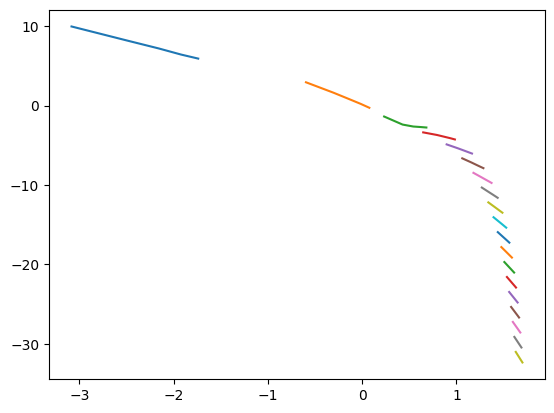

Nombre de dimensions effectives avec le plus proche voisin est : 4


In [ ]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.neighbors import NearestNeighbors
from math import *
import matplotlib.pyplot as plt
from scipy.optimize import minimize

# Remplacer les valeurs NaN par 0
df.fillna(0, inplace=True)

# Création d'un objet MinMaxScaler
scaler = MinMaxScaler()

# Normalisation des colonnes du DataFrame
df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

X = df.values

# Calcul des distances avec les k plus proches voisins
k_values = range(2, 31)  # Valeurs de k allant de 1 à 30
distances = []

for k in k_values:
    nbrs = NearestNeighbors(n_neighbors=k, metric='euclidean').fit(X)
    distances_k, _ = nbrs.kneighbors(X)
    min_distance_k = np.min(distances_k[:, -1])
    distances.append(min_distance_k)

# Affichage des résultats
for k, distance in zip(k_values, distances):
    print("K =", k, "Distance moyenne des plus proches voisins :", distance)

mean_distance = np.mean(distances)
print("Distance moyenne des plus proches voisins :", mean_distance, "\n")

C = mean_distance
N = df.shape[0]
D = df.shape[1]

def euclidean_distance(point_p, point_q):
    # Calcul de la somme des carrés des différences
    sum_of_squares = sum(((q - p) ** 2) for p, q in zip(point_p, point_q))
    # Calcul de la distance euclidienne
    distance = sqrt(sum_of_squares)
    return distance

def hl(n, L):
    return (1/C) * ((log(n)/n)**(1/L))

def Un(n, L):
    random_rows = df.sample(n)
    h = hl(n, L)
    somme = 0
    d = 0
    for k in range(0, n-1, 2):
        a = (1/(h**L)) * abs(1 - ((euclidean_distance(random_rows.iloc[k], [0 for i in range(D)]))**2)/(h*h))
        b = (1/(h**L)) * abs(1 - ((euclidean_distance(random_rows.iloc[k+1], random_rows.iloc[k]))**2)/(h*h))
        c = (1/(h**L)) * abs(1 - ((euclidean_distance(random_rows.iloc[k+1], [0 for i in range(D)]))**2)/(h*h))
        somme = somme + (a+b+c)/3
        d = d + 1
    return somme/d

def absolute_slope_least_squares(x, y, weights):
    # Définition de la fonction d'erreur à minimiser
    def error_function(params):
        m = params[0]  # Pente
        c = params[1]  # Ordonnée à l'origine
        absolute_errors = np.abs(y - (m * x + c))
        weighted_errors = weights * absolute_errors
        return np.sum(weighted_errors)
    # Initialisation des paramètres
    initial_params = np.array([0.0, 0.0])
    # Minimisation de la fonction d'erreur
    result = minimize(error_function, initial_params)
    # Récupération des paramètres optimaux
    m_opt = result.x[0]  # Pente optimale
    c_opt = result.x[1]  # Ordonnée à l'origine optimale
    return m_opt, c_opt

P = []
for l in range(1, 20):
    X = []
    Y = []
    for k in range(1, 6):
        X.append(np.log(hl(N//k, l)))
        Y.append(np.log(Un(N//k, l)))
    plt.plot(X, Y)
    weights = np.array([1, 1/2, 1/3, 1/4, 1/5]) # Pondérations
    pente = abs(absolute_slope_least_squares(np.array(X), np.array(Y), weights)[0])
    P.append(pente)
    print("La pente en valeur absolue avec la dimension", l, "est :", pente)

minimum = min(P)
d = P.index(minimum) + 1
plt.show()
print("Nombre de dimensions effectives avec le plus proche voisin est :", d)

## Méthode avec le plus proche voisin (2) : Avec k = 30 | The Intrinsic Dimension of Images and Its Impact on Learning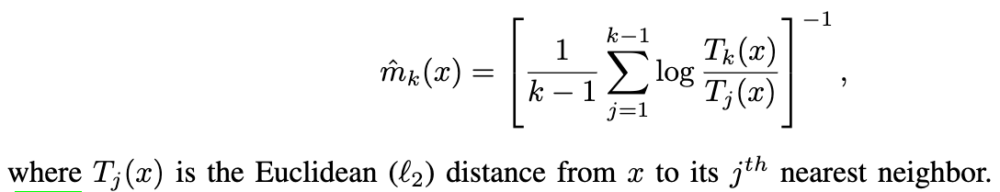

In [ ]:
from sklearn.neighbors import NearestNeighbors
import random
import numpy as np

def Tj_x(distances, j):
    return distances[j]

k = 30
nbrs = NearestNeighbors(n_neighbors=k+1, metric='euclidean').fit(df.values)
distances, _ = nbrs.kneighbors(df.values)

somme = 0
random_indices = random.sample(range(df.shape[0]), 500)
for i in random_indices:
    mk_x = 0
    for j in range(1, k):
        a = np.log(Tj_x(distances[i], k) / Tj_x(distances[i], j))
        mk_x += a
    mk_x = (1 / (k-1) * mk_x) ** (-1)
    print(i, ":", mk_x)
    somme += (mk_x ** (-1))

effective_dimensions = round(((1 / 500) * somme) ** (-1))
print("Nombre de dimensions effectives avec le plus proche voisin est :", effective_dimensions)

351 : 2.2363854139926596
786 : 2.4918922493258933
949 : 3.7016941609389393
259 : 6.313399068515678
326 : 11.061702550979874
47 : 8.402272546266262
278 : 3.592965738391562
418 : 5.31559989551375
472 : 2.949639221959689
944 : 6.869907747585002
486 : 2.4916729045260677
861 : 2.030918551943484
980 : 6.206415570936643
914 : 3.41813676465597
452 : 3.2164701721228512
395 : 9.296636146230005
559 : 2.6541811923283425
644 : 4.854971652308545
294 : 4.995828527795375
820 : 2.2954956536421
189 : 3.399442213296943
11 : 4.760261613651971
940 : 2.760495182499174
608 : 1.7481605233716977
106 : 3.07907913209529
135 : 3.7977431728683517
143 : 2.697319294150275
81 : 2.5662811216669135
963 : 2.655819165591267
90 : 2.510219060571016
548 : 5.459003227215073
369 : 5.512620107373942
307 : 7.439546205176415
25 : 4.67368287423445
485 : 9.22719663180931
943 : 3.6372787361920844
230 : 2.46754051222838
599 : 13.397950886631333
121 : 7.238712419321903
650 : 4.643548057751432
501 : 4.180189139037631
889 : 8.418488914

## Méthode avec le plus proche voisin (3) :

In [ ]:
from sklearn.neighbors import NearestNeighbors
import random
import numpy as np

# Diviser les données en deux parties
def split_dataframe(dataframe):
    dataframe_1 = pd.DataFrame()
    dataframe_2 = pd.DataFrame()
    for column in dataframe.columns:
        unique_values = dataframe[column].nunique()  # Nombre de valeurs uniques dans la colonne
        if unique_values <= 2:  # Vérifier si le nombre de valeurs uniques est inférieur ou égal
            dataframe_1[column] = dataframe[column]
        else:
            dataframe_2[column] = dataframe[column]
    return dataframe_1, dataframe_2

binary_df = split_dataframe(df)[0]  # Sélectionner les colonnes binaires
non_binary_df = split_dataframe(df)[1]  # Sélectionner les colonnes non binaires

print(binary_df)
print(non_binary_df)

if binary_df.empty:
    effective_dimensions_1 = 0
elif binary_df.shape[1] == 1:
    effective_dimensions_1 = 1
else:
    # Calculer la matrice de covariance
    cov_matrix = np.cov(binary_df, rowvar=False)

    # Définir les options d'affichage pour la matrice de covariance
    np.set_printoptions(precision=4, suppress=True)

    # Afficher la matrice de covariance
    print(cov_matrix)

    # Décomposition en valeurs propres
    eigenvalues, eigenvectors = np.linalg.eig(cov_matrix)

    # Afficher les valeurs propres
    print("Valeurs propres :")
    print(eigenvalues)

    # Afficher les vecteurs propres
    print("\nVecteurs propres :")
    print(eigenvectors)

    # Calculer la somme des valeurs propres
    total_variance = np.sum(eigenvalues)

    # Calculer les proportions de variance
    variance_ratios = eigenvalues / total_variance

    # Calculer le nombre de dimensions effectives
    effective_dimensions_1 = np.sum(variance_ratios > 0.01)  # Choisissez ici votre seuil approprié

def Tj_x(distances, j):
    return distances[j]

if non_binary_df.empty:
    effective_dimensions_1 = 0
else:
    k = 30
    nbrs = NearestNeighbors(n_neighbors=k+1, metric='euclidean').fit(non_binary_df.values)
    distances, _ = nbrs.kneighbors(non_binary_df.values)

    somme = 0
    random_indices = random.sample(range(non_binary_df.shape[0]), 500)
    for i in random_indices:
        mk_x = 0
        for j in range(1, k):
            a = np.log(Tj_x(distances[i], k) / Tj_x(distances[i], j))
            mk_x += a
        mk_x = (1 / (k-1) * mk_x) ** (-1)
        print(i, ":", mk_x)
        somme += (mk_x ** (-1))

    effective_dimensions_2 = round(((1 / 500) * somme) ** (-1))

effective_dimensions = round(effective_dimensions_1 * (binary_df.shape[1] / df.shape[1]) + effective_dimensions_2 * (non_binary_df.shape[1] / df.shape[1]))
print("Nombre de dimensions effectives avec le plus proche voisin est :", effective_dimensions)

     Sex
0    1.0
1    0.0
2    1.0
3    1.0
4    1.0
..   ...
995  0.0
996  1.0
997  1.0
998  1.0
999  1.0

[1000 rows x 1 columns]
          Age       Job  Housing  Saving accounts  Checking account  \
0    0.857143  0.666667      0.5             0.00          0.333333   
1    0.053571  0.666667      0.5             0.25          0.666667   
2    0.535714  0.333333      0.5             0.25          0.000000   
3    0.464286  0.666667      0.0             0.25          0.333333   
4    0.607143  0.666667      0.0             0.25          0.333333   
..        ...       ...      ...              ...               ...   
995  0.214286  0.333333      0.5             0.25          0.000000   
996  0.375000  1.000000      0.5             0.25          0.333333   
997  0.339286  0.666667      0.5             0.25          0.000000   
998  0.071429  0.666667      0.0             0.25          0.333333   
999  0.142857  0.666667      0.5             0.50          0.666667   

     Credit am

# **German Credit Risk à 21 dimensions**

## Méthode avec le ratio de variance :

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler

df = pd.read_csv('german_credit_risk_21.csv', sep=',')

print(df.head())

# Remplacer les valeurs NaN par 0
df.fillna(0, inplace=True)

# Liste des colonnes contenant du texte
text_columns = df.select_dtypes(include=['object']).columns

# Remplacement du texte par des valeurs numériques
for column in text_columns:
    le = LabelEncoder()
    df[column] = le.fit_transform(df[column].astype(str))

# Création d'un objet MinMaxScaler
scaler = MinMaxScaler()

# Normalisation des colonnes du DataFrame
df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

# Affichage du DataFrame modifié
print(df.head())

# Calculer la matrice de covariance
cov_matrix = np.cov(df, rowvar=False)

# Définir les options d'affichage pour la matrice de covariance
np.set_printoptions(precision=4, suppress=True)

# Afficher la matrice de covariance
print(cov_matrix)

# Décomposition en valeurs propres
eigenvalues, eigenvectors = np.linalg.eig(cov_matrix)

# Afficher les valeurs propres
print("Valeurs propres :")
print(eigenvalues)

# Afficher les vecteurs propres
print("\nVecteurs propres :")
print(eigenvectors)

# Calculer la somme des valeurs propres
total_variance = np.sum(eigenvalues)

# Calculer les proportions de variance
variance_ratios = eigenvalues / total_variance

# Calculer le nombre de dimensions effectives
effective_dimensions = np.sum(variance_ratios > 0.01)  # Choisissez ici votre seuil approprié

# Afficher le nombre de dimensions effectives
print("Nombre de dimensions effectives avec le ratio de variance est :", effective_dimensions)

   Creditability  Account Balance  Duration of Credit (month)  \
0              1                1                          18   
1              1                1                           9   
2              1                2                          12   
3              1                1                          12   
4              1                1                          12   

   Payment Status of Previous Credit  Purpose  Credit Amount  \
0                                  4        2           1049   
1                                  4        0           2799   
2                                  2        9            841   
3                                  4        0           2122   
4                                  4        0           2171   

   Value Savings/Stocks  Length of current employment  Instalment per cent  \
0                     1                             2                    4   
1                     1                             3               

## Méthode avec n1 :

In [ ]:
# Calcul de la somme des valeurs propres
sum_eigenvalues = np.sum(eigenvalues)

result = 1
for eigenvalue in eigenvalues:
    if eigenvalue < 0 or sum_eigenvalues <= 0:
        print(f"Invalid value: eigenvalue={eigenvalue}, sum_eigenvalues={sum_eigenvalues}")
        continue  # Skip this iteration if the values are invalid
    result *= (eigenvalue / sum_eigenvalues) ** (-eigenvalue / sum_eigenvalues)

if not np.isnan(result) and not np.isinf(result):
    print("Nombre de dimensions effectives avec n1 est :", round(result))
else:
    print("Invalid result encountered.")

Nombre de dimensions effectives avec n1 est : 16


## Méthode avec n2 :

In [ ]:
# Calcul de la somme des valeurs propres carrées
sum_eigenvalues_square = np.sum(eigenvalues**2)

n2 = (sum_eigenvalues**2) / sum_eigenvalues_square

print("Nombre de dimensions effectives avec n2 est :", round(n2))

Nombre de dimensions effectives avec n2 est : 13


## Méthode avec n inf :

In [ ]:
n_inf = sum_eigenvalues / max(eigenvalues)

print("Nombre de dimensions effectives avec n inf est :", round(n_inf))

Nombre de dimensions effectives avec n inf est : 7


## Méthode avec Chaîne de Markov par Monte Carlo :

In [ ]:
from sklearn.decomposition import PCA
pca = PCA(n_components = min(df.shape[1], 50))  # Choisissez le nombre de composantes principales souhaitées
X_pca = pca.fit_transform(df)

# Fonction pour calculer le nombre de dimensions effectives à partir d'une chaîne de Markov
def compute_effective_dimensions(chain):
    num_samples, num_features = chain.shape
    chain_mean = np.mean(chain, axis=0)
    cov_matrix = np.cov(chain.T)
    _, eigvals, _ = np.linalg.svd(cov_matrix)
    cumulative_variance = np.cumsum(eigvals) / np.sum(eigvals)
    effective_dimensions = np.sum(cumulative_variance < 0.99) + 1  # Choisissez votre critère de seuil ici
    return effective_dimensions

# Définir les paramètres de la chaîne de Markov
num_samples = 1000  # Nombre d'échantillons à générer
num_features = X_pca.shape[1]  # Nombre de caractéristiques

# Initialiser la chaîne de Markov
chain = np.zeros((num_samples, num_features))

# Générer la chaîne de Markov
for i in range(1, num_samples):
    # Échantillonner une nouvelle proposition de la distribution normale
    proposal = np.random.multivariate_normal(chain[i-1], np.eye(num_features))

    # Calculer les densités de probabilité des propositions actuelle et proposée
    current_density = np.exp(-np.sum((chain[i-1] - X_pca)**2) / 2)
    proposal_density = np.exp(-np.sum((proposal - X_pca)**2) / 2)

    # Accepter ou rejeter la proposition en utilisant le critère de Metropolis-Hastings
    acceptance_ratio = min(1, proposal_density / current_density)
    if np.random.rand() < acceptance_ratio:
        chain[i] = proposal
    else:
        chain[i] = chain[i-1]

# Calculer le nombre de dimensions effectives
effective_dimensions = compute_effective_dimensions(chain)
print("Nombre de dimensions effectives avec MCMC :", effective_dimensions)

<ipython-input-108-0ae0b3364c69>:32: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


Nombre de dimensions effectives avec MCMC : 15


## Méthode avec le plus proche voisin (1) :

K = 2 Distance moyenne des plus proches voisins : 0.018983162759987557
K = 3 Distance moyenne des plus proches voisins : 0.33334096734733315
K = 4 Distance moyenne des plus proches voisins : 0.45242810034334274
K = 5 Distance moyenne des plus proches voisins : 0.47656139813539106
K = 6 Distance moyenne des plus proches voisins : 0.5001488576282057
K = 7 Distance moyenne des plus proches voisins : 0.5224526022132334
K = 8 Distance moyenne des plus proches voisins : 0.5313102007797577
K = 9 Distance moyenne des plus proches voisins : 0.5833657707998123
K = 10 Distance moyenne des plus proches voisins : 0.6085639747852278
K = 11 Distance moyenne des plus proches voisins : 0.6382998270473876
K = 12 Distance moyenne des plus proches voisins : 0.6509617720174803
K = 13 Distance moyenne des plus proches voisins : 0.6675376233765468
K = 14 Distance moyenne des plus proches voisins : 0.7002802905481065
K = 15 Distance moyenne des plus proches voisins : 0.7018674559749857
K = 16 Distance moyenne

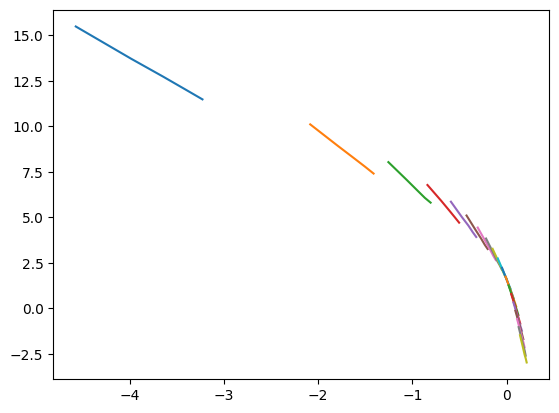

Nombre de dimensions effectives avec le plus proche voisin est : 15


In [ ]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.neighbors import NearestNeighbors
from math import *
import matplotlib.pyplot as plt
from scipy.optimize import minimize

# Remplacer les valeurs NaN par 0
df.fillna(0, inplace=True)

# Création d'un objet MinMaxScaler
scaler = MinMaxScaler()

# Normalisation des colonnes du DataFrame
df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

X = df.values

# Calcul des distances avec les k plus proches voisins
k_values = range(2, 31)  # Valeurs de k allant de 1 à 30
distances = []

for k in k_values:
    nbrs = NearestNeighbors(n_neighbors=k, metric='euclidean').fit(X)
    distances_k, _ = nbrs.kneighbors(X)
    min_distance_k = np.min(distances_k[:, -1])
    distances.append(min_distance_k)

# Affichage des résultats
for k, distance in zip(k_values, distances):
    print("K =", k, "Distance moyenne des plus proches voisins :", distance)

mean_distance = np.mean(distances)
print("Distance moyenne des plus proches voisins :", mean_distance, "\n")

C = mean_distance
N = df.shape[0]
D = df.shape[1]

def euclidean_distance(point_p, point_q):
    # Calcul de la somme des carrés des différences
    sum_of_squares = sum(((q - p) ** 2) for p, q in zip(point_p, point_q))
    # Calcul de la distance euclidienne
    distance = sqrt(sum_of_squares)
    return distance

def hl(n, L):
    return (1/C) * ((log(n)/n)**(1/L))

def Un(n, L):
    random_rows = df.sample(n)
    h = hl(n, L)
    somme = 0
    d = 0
    for k in range(0, n-1, 2):
        a = (1/(h**L)) * abs(1 - ((euclidean_distance(random_rows.iloc[k], [0 for i in range(D)]))**2)/(h*h))
        b = (1/(h**L)) * abs(1 - ((euclidean_distance(random_rows.iloc[k+1], random_rows.iloc[k]))**2)/(h*h))
        c = (1/(h**L)) * abs(1 - ((euclidean_distance(random_rows.iloc[k+1], [0 for i in range(D)]))**2)/(h*h))
        somme = somme + (a+b+c)/3
        d = d + 1
    return somme/d

def absolute_slope_least_squares(x, y, weights):
    # Définition de la fonction d'erreur à minimiser
    def error_function(params):
        m = params[0]  # Pente
        c = params[1]  # Ordonnée à l'origine
        absolute_errors = np.abs(y - (m * x + c))
        weighted_errors = weights * absolute_errors
        return np.sum(weighted_errors)
    # Initialisation des paramètres
    initial_params = np.array([0.0, 0.0])
    # Minimisation de la fonction d'erreur
    result = minimize(error_function, initial_params)
    # Récupération des paramètres optimaux
    m_opt = result.x[0]  # Pente optimale
    c_opt = result.x[1]  # Ordonnée à l'origine optimale
    return m_opt, c_opt

P = []
for l in range(1, 20):
    X = []
    Y = []
    for k in range(1, 6):
        X.append(np.log(hl(N//k, l)))
        Y.append(np.log(Un(N//k, l)))
    plt.plot(X, Y)
    weights = np.array([1, 1/2, 1/3, 1/4, 1/5]) # Pondérations
    pente = abs(absolute_slope_least_squares(np.array(X), np.array(Y), weights)[0])
    P.append(pente)
    print("La pente en valeur absolue avec la dimension", l, "est :", pente)

minimum = min(P)
d = P.index(minimum) + 1
plt.show()
print("Nombre de dimensions effectives avec le plus proche voisin est :", d)

## Méthode avec le plus proche voisin (2) : Avec k = 30 | The Intrinsic Dimension of Images and Its Impact on Learning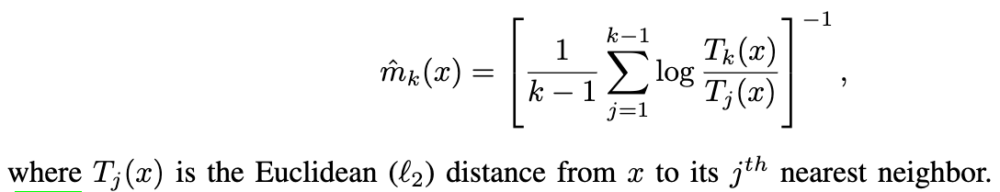

In [ ]:
from sklearn.neighbors import NearestNeighbors
import random
import numpy as np

def Tj_x(distances, j):
    return distances[j]

k = 30
nbrs = NearestNeighbors(n_neighbors=k+1, metric='euclidean').fit(df.values)
distances, _ = nbrs.kneighbors(df.values)

somme = 0
random_indices = random.sample(range(df.shape[0]), 500)
for i in random_indices:
    mk_x = 0
    for j in range(1, k):
        a = np.log(Tj_x(distances[i], k) / Tj_x(distances[i], j))
        mk_x += a
    mk_x = (1 / (k-1) * mk_x) ** (-1)
    print(i, ":", mk_x)
    somme += (mk_x ** (-1))

effective_dimensions = round(((1 / 500) * somme) ** (-1))
print("Nombre de dimensions effectives avec le plus proche voisin est :", effective_dimensions)

534 : 5.260179430341438
71 : 5.415032167384487
829 : 8.818124056971742
760 : 8.263232020890383
463 : 5.414590103874811
526 : 5.347894876786528
305 : 8.430086911614703
452 : 8.013205649949967
726 : 8.942225549348459
728 : 6.167730168129252
132 : 6.06446949497462
421 : 10.319967060938511
301 : 7.33330783460044
795 : 8.121417529379407
466 : 4.781785233340218
691 : 4.7864192543656765
112 : 9.178981034937266
783 : 10.646806502384917
535 : 13.32475426241289
547 : 4.887095394753414
902 : 10.35818480100977
198 : 6.42762805480127
611 : 6.624580508276608
317 : 5.350992419729428
91 : 8.23216707717589
984 : 12.415584620695078
99 : 10.96901391688507
690 : 8.106280610828216
239 : 6.886976595465937
612 : 10.740363244960713
5 : 4.723370181033197
1 : 3.534680972915348
561 : 4.8881770442065475
423 : 8.369484793927015
33 : 8.121109609812027
454 : 6.767049777776311
185 : 8.959383917083308
343 : 8.871096709227132
219 : 9.966070228409036
354 : 10.92521047117282
188 : 12.8074758678137
280 : 7.909402071758005

## Méthode avec le plus proche voisin (3) :

In [ ]:
from sklearn.neighbors import NearestNeighbors
import random
import numpy as np

# Diviser les données en deux parties
def split_dataframe(dataframe):
    dataframe_1 = pd.DataFrame()
    dataframe_2 = pd.DataFrame()
    for column in dataframe.columns:
        unique_values = dataframe[column].nunique()  # Nombre de valeurs uniques dans la colonne
        if unique_values <= 2:  # Vérifier si le nombre de valeurs uniques est inférieur ou égal
            dataframe_1[column] = dataframe[column]
        else:
            dataframe_2[column] = dataframe[column]
    return dataframe_1, dataframe_2

binary_df = split_dataframe(df)[0]  # Sélectionner les colonnes binaires
non_binary_df = split_dataframe(df)[1]  # Sélectionner les colonnes non binaires

print(binary_df)
print(non_binary_df)

if binary_df.empty:
    effective_dimensions_1 = 0
elif binary_df.shape[1] == 1:
    effective_dimensions_1 = 1
else:
    # Calculer la matrice de covariance
    cov_matrix = np.cov(binary_df, rowvar=False)

    # Définir les options d'affichage pour la matrice de covariance
    np.set_printoptions(precision=4, suppress=True)

    # Afficher la matrice de covariance
    print(cov_matrix)

    # Décomposition en valeurs propres
    eigenvalues, eigenvectors = np.linalg.eig(cov_matrix)

    # Afficher les valeurs propres
    print("Valeurs propres :")
    print(eigenvalues)

    # Afficher les vecteurs propres
    print("\nVecteurs propres :")
    print(eigenvectors)

    # Calculer la somme des valeurs propres
    total_variance = np.sum(eigenvalues)

    # Calculer les proportions de variance
    variance_ratios = eigenvalues / total_variance

    # Calculer le nombre de dimensions effectives
    effective_dimensions_1 = np.sum(variance_ratios > 0.01)  # Choisissez ici votre seuil approprié

def Tj_x(distances, j):
    return distances[j]

if non_binary_df.empty:
    effective_dimensions_1 = 0
else:
    k = 30
    nbrs = NearestNeighbors(n_neighbors=k+1, metric='euclidean').fit(non_binary_df.values)
    distances, _ = nbrs.kneighbors(non_binary_df.values)

    somme = 0
    random_indices = random.sample(range(non_binary_df.shape[0]), 500)
    for i in random_indices:
        mk_x = 0
        for j in range(1, k):
            a = np.log(Tj_x(distances[i], k) / Tj_x(distances[i], j))
            mk_x += a
        mk_x = (1 / (k-1) * mk_x) ** (-1)
        print(i, ":", mk_x)
        somme += (mk_x ** (-1))

    effective_dimensions_2 = round(((1 / 500) * somme) ** (-1))

effective_dimensions = round(effective_dimensions_1 * (binary_df.shape[1] / df.shape[1]) + effective_dimensions_2 * (non_binary_df.shape[1] / df.shape[1]))
print("Nombre de dimensions effectives avec le plus proche voisin est :", effective_dimensions)

     Creditability  No of dependents  Telephone  Foreign Worker
0              1.0               0.0        0.0             0.0
1              1.0               1.0        0.0             0.0
2              1.0               0.0        0.0             0.0
3              1.0               1.0        0.0             1.0
4              1.0               0.0        0.0             1.0
..             ...               ...        ...             ...
995            0.0               1.0        0.0             0.0
996            0.0               0.0        0.0             0.0
997            0.0               0.0        1.0             0.0
998            0.0               0.0        1.0             0.0
999            0.0               0.0        0.0             0.0

[1000 rows x 4 columns]
     Account Balance  Duration of Credit (month)  \
0           0.000000                    0.205882   
1           0.000000                    0.073529   
2           0.333333                    0.117647   

# **Default of Credit Card Clients Dataset**

## Méthode avec le ratio de variance :

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler

df = pd.read_csv('default_of_credit_card_clients_dataset.csv', sep=',')

df = df.drop(df.columns[0], axis=1)

print(df.head())

# Remplacer les valeurs NaN par 0
df.fillna(0, inplace=True)

# Liste des colonnes contenant du texte
text_columns = df.select_dtypes(include=['object']).columns

# Remplacement du texte par des valeurs numériques
for column in text_columns:
    le = LabelEncoder()
    df[column] = le.fit_transform(df[column].astype(str))

# Création d'un objet MinMaxScaler
scaler = MinMaxScaler()

# Normalisation des colonnes du DataFrame
df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

# Affichage du DataFrame modifié
print(df.head())

# Calculer la matrice de covariance
cov_matrix = np.cov(df, rowvar=False)

# Définir les options d'affichage pour la matrice de covariance
np.set_printoptions(precision=4, suppress=True)

# Afficher la matrice de covariance
print(cov_matrix)

# Décomposition en valeurs propres
eigenvalues, eigenvectors = np.linalg.eig(cov_matrix)

# Afficher les valeurs propres
print("Valeurs propres :")
print(eigenvalues)

# Afficher les vecteurs propres
print("\nVecteurs propres :")
print(eigenvectors)

# Calculer la somme des valeurs propres
total_variance = np.sum(eigenvalues)

# Calculer les proportions de variance
variance_ratios = eigenvalues / total_variance

# Calculer le nombre de dimensions effectives
effective_dimensions = np.sum(variance_ratios > 0.01)  # Choisissez ici votre seuil approprié

# Afficher le nombre de dimensions effectives
print("Nombre de dimensions effectives avec le ratio de variance est :", effective_dimensions)

   LIMIT_BAL  SEX  EDUCATION  MARRIAGE  AGE  PAY_0  PAY_2  PAY_3  PAY_4  \
0    20000.0    2          2         1   24      2      2     -1     -1   
1   120000.0    2          2         2   26     -1      2      0      0   
2    90000.0    2          2         2   34      0      0      0      0   
3    50000.0    2          2         1   37      0      0      0      0   
4    50000.0    1          2         1   57     -1      0     -1      0   

   PAY_5  ...  BILL_AMT4  BILL_AMT5  BILL_AMT6  PAY_AMT1  PAY_AMT2  PAY_AMT3  \
0     -2  ...        0.0        0.0        0.0       0.0     689.0       0.0   
1      0  ...     3272.0     3455.0     3261.0       0.0    1000.0    1000.0   
2      0  ...    14331.0    14948.0    15549.0    1518.0    1500.0    1000.0   
3      0  ...    28314.0    28959.0    29547.0    2000.0    2019.0    1200.0   
4      0  ...    20940.0    19146.0    19131.0    2000.0   36681.0   10000.0   

   PAY_AMT4  PAY_AMT5  PAY_AMT6  default.payment.next.month  
0     

## Méthode avec n1 :

In [ ]:
# Calcul de la somme des valeurs propres
sum_eigenvalues = np.sum(eigenvalues)

result = 1
for eigenvalue in eigenvalues:
    if eigenvalue < 0 or sum_eigenvalues <= 0:
        print(f"Invalid value: eigenvalue={eigenvalue}, sum_eigenvalues={sum_eigenvalues}")
        continue  # Skip this iteration if the values are invalid
    result *= (eigenvalue / sum_eigenvalues) ** (-eigenvalue / sum_eigenvalues)

if not np.isnan(result) and not np.isinf(result):
    print("Nombre de dimensions effectives avec n1 est :", round(result))
else:
    print("Invalid result encountered.")

Nombre de dimensions effectives avec n1 est : 6


## Méthode avec n2 :

In [ ]:
# Calcul de la somme des valeurs propres carrées
sum_eigenvalues_square = np.sum(eigenvalues**2)

n2 = (sum_eigenvalues**2) / sum_eigenvalues_square

print("Nombre de dimensions effectives avec n2 est :", round(n2))

Nombre de dimensions effectives avec n2 est : 4


## Méthode avec n inf :

In [ ]:
n_inf = sum_eigenvalues / max(eigenvalues)

print("Nombre de dimensions effectives avec n inf est :", round(n_inf))

Nombre de dimensions effectives avec n inf est : 3


## Méthode avec Chaîne de Markov par Monte Carlo :

In [ ]:
from sklearn.decomposition import PCA
pca = PCA(n_components = min(df.shape[1], 50))  # Choisissez le nombre de composantes principales souhaitées
X_pca = pca.fit_transform(df)

# Fonction pour calculer le nombre de dimensions effectives à partir d'une chaîne de Markov
def compute_effective_dimensions(chain):
    num_samples, num_features = chain.shape
    chain_mean = np.mean(chain, axis=0)
    cov_matrix = np.cov(chain.T)
    _, eigvals, _ = np.linalg.svd(cov_matrix)
    cumulative_variance = np.cumsum(eigvals) / np.sum(eigvals)
    effective_dimensions = np.sum(cumulative_variance < 0.99) + 1  # Choisissez votre critère de seuil ici
    return effective_dimensions

# Définir les paramètres de la chaîne de Markov
num_samples = 1000  # Nombre d'échantillons à générer
num_features = X_pca.shape[1]  # Nombre de caractéristiques

# Initialiser la chaîne de Markov
chain = np.zeros((num_samples, num_features))

# Générer la chaîne de Markov
for i in range(1, num_samples):
    # Échantillonner une nouvelle proposition de la distribution normale
    proposal = np.random.multivariate_normal(chain[i-1], np.eye(num_features))

    # Calculer les densités de probabilité des propositions actuelle et proposée
    current_density = np.exp(-np.sum((chain[i-1] - X_pca)**2) / 2)
    proposal_density = np.exp(-np.sum((proposal - X_pca)**2) / 2)

    # Accepter ou rejeter la proposition en utilisant le critère de Metropolis-Hastings
    acceptance_ratio = min(1, proposal_density / current_density)
    if np.random.rand() < acceptance_ratio:
        chain[i] = proposal
    else:
        chain[i] = chain[i-1]

# Calculer le nombre de dimensions effectives
effective_dimensions = compute_effective_dimensions(chain)
print("Nombre de dimensions effectives avec MCMC :", effective_dimensions)

<ipython-input-9-0ae0b3364c69>:32: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


Nombre de dimensions effectives avec MCMC : 16


## Méthode avec le plus proche voisin (1) :

K = 2 Distance moyenne des plus proches voisins : 0.0
K = 3 Distance moyenne des plus proches voisins : 0.00034935055382613367
K = 4 Distance moyenne des plus proches voisins : 0.0025736959893636877
K = 5 Distance moyenne des plus proches voisins : 0.0033109274437976882
K = 6 Distance moyenne des plus proches voisins : 0.00343377324861917
K = 7 Distance moyenne des plus proches voisins : 0.0038324940938900443
K = 8 Distance moyenne des plus proches voisins : 0.004895311292047041
K = 9 Distance moyenne des plus proches voisins : 0.006740757716029654
K = 10 Distance moyenne des plus proches voisins : 0.00868987808340206
K = 11 Distance moyenne des plus proches voisins : 0.00943657894725829
K = 12 Distance moyenne des plus proches voisins : 0.011378746739045924
K = 13 Distance moyenne des plus proches voisins : 0.012824472895818246
K = 14 Distance moyenne des plus proches voisins : 0.013275259827220031
K = 15 Distance moyenne des plus proches voisins : 0.013902560644918191
K = 16 Distance

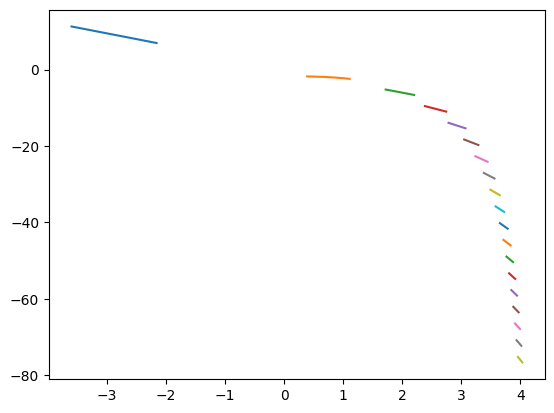

Nombre de dimensions effectives avec le plus proche voisin est : 2


In [ ]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.neighbors import NearestNeighbors
from math import *
import matplotlib.pyplot as plt
from scipy.optimize import minimize

# Remplacer les valeurs NaN par 0
df.fillna(0, inplace=True)

# Création d'un objet MinMaxScaler
scaler = MinMaxScaler()

# Normalisation des colonnes du DataFrame
df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

X = df.values

# Calcul des distances avec les k plus proches voisins
k_values = range(2, 31)  # Valeurs de k allant de 1 à 30
distances = []

for k in k_values:
    nbrs = NearestNeighbors(n_neighbors=k, metric='euclidean').fit(X)
    distances_k, _ = nbrs.kneighbors(X)
    min_distance_k = np.min(distances_k[:, -1])
    distances.append(min_distance_k)

# Affichage des résultats
for k, distance in zip(k_values, distances):
    print("K =", k, "Distance moyenne des plus proches voisins :", distance)

mean_distance = np.mean(distances)
print("Distance moyenne des plus proches voisins :", mean_distance, "\n")

C = mean_distance
N = df.shape[0]
D = df.shape[1]

def euclidean_distance(point_p, point_q):
    # Calcul de la somme des carrés des différences
    sum_of_squares = sum(((q - p) ** 2) for p, q in zip(point_p, point_q))
    # Calcul de la distance euclidienne
    distance = sqrt(sum_of_squares)
    return distance

def hl(n, L):
    return (1/C) * ((log(n)/n)**(1/L))

def Un(n, L):
    random_rows = df.sample(n)
    h = hl(n, L)
    somme = 0
    d = 0
    for k in range(0, n-1, 2):
        a = (1/(h**L)) * abs(1 - ((euclidean_distance(random_rows.iloc[k], [0 for i in range(D)]))**2)/(h*h))
        b = (1/(h**L)) * abs(1 - ((euclidean_distance(random_rows.iloc[k+1], random_rows.iloc[k]))**2)/(h*h))
        c = (1/(h**L)) * abs(1 - ((euclidean_distance(random_rows.iloc[k+1], [0 for i in range(D)]))**2)/(h*h))
        somme = somme + (a+b+c)/3
        d = d + 1
    return somme/d

def absolute_slope_least_squares(x, y, weights):
    # Définition de la fonction d'erreur à minimiser
    def error_function(params):
        m = params[0]  # Pente
        c = params[1]  # Ordonnée à l'origine
        absolute_errors = np.abs(y - (m * x + c))
        weighted_errors = weights * absolute_errors
        return np.sum(weighted_errors)
    # Initialisation des paramètres
    initial_params = np.array([0.0, 0.0])
    # Minimisation de la fonction d'erreur
    result = minimize(error_function, initial_params)
    # Récupération des paramètres optimaux
    m_opt = result.x[0]  # Pente optimale
    c_opt = result.x[1]  # Ordonnée à l'origine optimale
    return m_opt, c_opt

P = []
for l in range(1, 20):
    X = []
    Y = []
    for k in range(1, 6):
        X.append(np.log(hl(N//k, l)))
        Y.append(np.log(Un(N//k, l)))
    plt.plot(X, Y)
    weights = np.array([1, 1/2, 1/3, 1/4, 1/5]) # Pondérations
    pente = abs(absolute_slope_least_squares(np.array(X), np.array(Y), weights)[0])
    P.append(pente)
    print("La pente en valeur absolue avec la dimension", l, "est :", pente)

minimum = min(P)
d = P.index(minimum) + 1
plt.show()
print("Nombre de dimensions effectives avec le plus proche voisin est :", d)

## Méthode avec le plus proche voisin (2) : Avec k = 30 | The Intrinsic Dimension of Images and Its Impact on Learning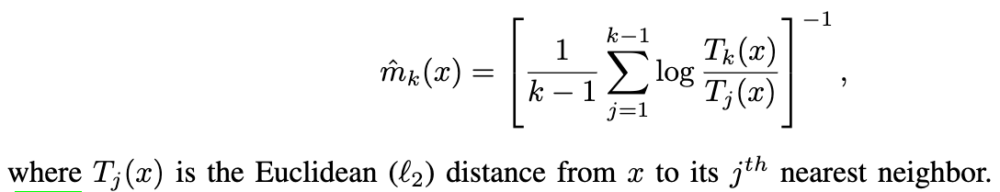

In [ ]:
from sklearn.neighbors import NearestNeighbors
import random
import numpy as np

def Tj_x(distances, j):
    return distances[j]

k = 30
nbrs = NearestNeighbors(n_neighbors=k+1, metric='euclidean').fit(df.values)
distances, _ = nbrs.kneighbors(df.values)

somme = 0
random_indices = random.sample(range(df.shape[0]), 500)
for i in random_indices:
    mk_x = 0
    for j in range(1, k):
        a = np.log(Tj_x(distances[i], k) / Tj_x(distances[i], j))
        mk_x += a
    mk_x = (1 / (k-1) * mk_x) ** (-1)
    print(i, ":", mk_x)
    somme += (mk_x ** (-1))

effective_dimensions = round(((1 / 500) * somme) ** (-1))
print("Nombre de dimensions effectives avec le plus proche voisin est :", effective_dimensions)

3123 : 6.846671794707299
15918 : 3.6240269149198636
23107 : 2.442655315230123
7234 : 6.526792737637299
6334 : 6.817888903137931
10408 : 4.413372496623464
20838 : 5.1670900826332
27233 : 2.6303057253068314
14606 : 8.521979646575414
15854 : 4.707600211399663
850 : 23.157089129113665
20234 : 5.948257790004799
15056 : 4.82436402442603
1629 : 7.077879392470521
9338 : 4.383585613389475
27339 : 2.8533853766082538
8124 : 4.514006976084274
5976 : 3.614829830007489
29800 : 5.53257728443597
29594 : 2.17099081061886
4881 : 3.3776453696661664
11355 : 5.959154673347365
2291 : 11.36724469472127
16657 : 10.126499146294838
7863 : 3.8805969114972094
17138 : 8.737837814113073
8535 : 5.484917261186516
4443 : 7.224364950728074
14118 : 3.3241734951445814
9520 : 4.045416248172396
690 : 10.028700441002671
13352 : 4.209214570521812
1199 : 8.406118690290842
7035 : 3.3415337386055715
701 : 2.5369140086944992
24866 : 5.081221267000259
6605 : 2.4750857747432704
11936 : 10.755415104031643
27060 : 2.85291644170704
2

## Méthode avec le plus proche voisin (3) :

In [ ]:
from sklearn.neighbors import NearestNeighbors
import random
import numpy as np

# Diviser les données en deux parties
def split_dataframe(dataframe):
    dataframe_1 = pd.DataFrame()
    dataframe_2 = pd.DataFrame()
    for column in dataframe.columns:
        unique_values = dataframe[column].nunique()  # Nombre de valeurs uniques dans la colonne
        if unique_values <= 2:  # Vérifier si le nombre de valeurs uniques est inférieur ou égal
            dataframe_1[column] = dataframe[column]
        else:
            dataframe_2[column] = dataframe[column]
    return dataframe_1, dataframe_2

binary_df = split_dataframe(df)[0]  # Sélectionner les colonnes binaires
non_binary_df = split_dataframe(df)[1]  # Sélectionner les colonnes non binaires

print(binary_df)
print(non_binary_df)

if binary_df.empty:
    effective_dimensions_1 = 0
elif binary_df.shape[1] == 1:
    effective_dimensions_1 = 1
else:
    # Calculer la matrice de covariance
    cov_matrix = np.cov(binary_df, rowvar=False)

    # Définir les options d'affichage pour la matrice de covariance
    np.set_printoptions(precision=4, suppress=True)

    # Afficher la matrice de covariance
    print(cov_matrix)

    # Décomposition en valeurs propres
    eigenvalues, eigenvectors = np.linalg.eig(cov_matrix)

    # Afficher les valeurs propres
    print("Valeurs propres :")
    print(eigenvalues)

    # Afficher les vecteurs propres
    print("\nVecteurs propres :")
    print(eigenvectors)

    # Calculer la somme des valeurs propres
    total_variance = np.sum(eigenvalues)

    # Calculer les proportions de variance
    variance_ratios = eigenvalues / total_variance

    # Calculer le nombre de dimensions effectives
    effective_dimensions_1 = np.sum(variance_ratios > 0.01)  # Choisissez ici votre seuil approprié

def Tj_x(distances, j):
    return distances[j]

if non_binary_df.empty:
    effective_dimensions_1 = 0
else:
    k = 30
    nbrs = NearestNeighbors(n_neighbors=k+1, metric='euclidean').fit(non_binary_df.values)
    distances, _ = nbrs.kneighbors(non_binary_df.values)

    somme = 0
    random_indices = random.sample(range(non_binary_df.shape[0]), 500)
    for i in random_indices:
        mk_x = 0
        for j in range(1, k):
            a = np.log(Tj_x(distances[i], k) / Tj_x(distances[i], j))
            mk_x += a
        mk_x = (1 / (k-1) * mk_x) ** (-1)
        print(i, ":", mk_x)
        somme += (mk_x ** (-1))

    effective_dimensions_2 = round(((1 / 500) * somme) ** (-1))

effective_dimensions = round(effective_dimensions_1 * (binary_df.shape[1] / df.shape[1]) + effective_dimensions_2 * (non_binary_df.shape[1] / df.shape[1]))
print("Nombre de dimensions effectives avec le plus proche voisin est :", effective_dimensions)

       SEX  default.payment.next.month
0      1.0                         1.0
1      1.0                         1.0
2      1.0                         0.0
3      1.0                         0.0
4      0.0                         0.0
...    ...                         ...
29995  0.0                         0.0
29996  0.0                         0.0
29997  0.0                         1.0
29998  0.0                         1.0
29999  0.0                         1.0

[30000 rows x 2 columns]
       LIMIT_BAL  EDUCATION  MARRIAGE       AGE  PAY_0  PAY_2  PAY_3  PAY_4  \
0       0.010101   0.333333  0.333333  0.051724    0.4    0.4    0.1    0.1   
1       0.111111   0.333333  0.666667  0.086207    0.1    0.4    0.2    0.2   
2       0.080808   0.333333  0.666667  0.224138    0.2    0.2    0.2    0.2   
3       0.040404   0.333333  0.333333  0.275862    0.2    0.2    0.2    0.2   
4       0.040404   0.333333  0.333333  0.620690    0.1    0.2    0.1    0.2   
...          ...        ...     

<ipython-input-104-ee5c21b15a8a>:72: RuntimeWarning: divide by zero encountered in double_scalars
  a = np.log(Tj_x(distances[i], k) / Tj_x(distances[i], j))
<ipython-input-104-ee5c21b15a8a>:76: RuntimeWarning: divide by zero encountered in double_scalars
  somme += (mk_x ** (-1))


 4.751538448386923
27485 : 5.24374640872645
19821 : 2.2857666611913934
4465 : 7.864285365087829
6773 : 12.655401894341292
15696 : 4.287928130970055
2939 : 2.472204698080133
9250 : 8.245791656461426
29425 : 11.620884397932
4210 : 8.098205667914584
24955 : 10.96052556249099
27195 : 3.0192022370952514
12024 : 6.269361392537673
17223 : 2.3653576783246937
2359 : 5.753890255741414
16883 : 6.51797966344143
16876 : 3.0172226183360324
16650 : 2.401532919661837
27278 : 2.0378567444701776
23040 : 3.6289083375112794
18640 : 3.6697819257919977
8495 : 16.148766500105605
16231 : 12.89090473379484
28263 : 4.754708957690185
23053 : 4.0386402258898375
9100 : 1.896041563379
3322 : 3.8810505112215132
25167 : 2.8872918694663365
5123 : 6.637483112248941
19708 : 3.1620387079924144
9630 : 6.8314317200119135
18047 : 2.740536020350376
17274 : 2.7507570528817356
10824 : 3.6595941774679956
12351 : 2.5401286320021814
26532 : 3.3845710029246514
27364 : 2.569857295558261
1770 : 4.195362563708553
26630 : 4.8119152188

# **MNIST Test**

## Méthode avec le ratio de variance :

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler

df = pd.read_csv('mnist_test.csv', sep=',')

print(df.head())

# Remplacer les valeurs NaN par 0
df.fillna(0, inplace=True)

# Liste des colonnes contenant du texte
text_columns = df.select_dtypes(include=['object']).columns

# Remplacement du texte par des valeurs numériques
for column in text_columns:
    le = LabelEncoder()
    df[column] = le.fit_transform(df[column].astype(str))

# Création d'un objet MinMaxScaler
scaler = MinMaxScaler()

# Normalisation des colonnes du DataFrame
df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

# Affichage du DataFrame modifié
print(df.head())

# Calculer la matrice de covariance
cov_matrix = np.cov(df, rowvar=False)

# Définir les options d'affichage pour la matrice de covariance
np.set_printoptions(precision=4, suppress=True)

# Afficher la matrice de covariance
print(cov_matrix)

# Décomposition en valeurs propres
eigenvalues, eigenvectors = np.linalg.eig(cov_matrix)

# Afficher les valeurs propres
print("Valeurs propres :")
print(eigenvalues)

# Afficher les vecteurs propres
print("\nVecteurs propres :")
print(eigenvectors)

# Calculer la somme des valeurs propres
total_variance = np.sum(eigenvalues)

# Calculer les proportions de variance
variance_ratios = eigenvalues / total_variance

# Calculer le nombre de dimensions effectives
effective_dimensions = np.sum(variance_ratios > 0.01)  # Choisissez ici votre seuil approprié

# Afficher le nombre de dimensions effectives
print("Nombre de dimensions effectives avec le ratio de variance est :", effective_dimensions)

   7  0  0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  ...  0.658  0.659  0.660  \
0  2  0    0    0    0    0    0    0    0    0  ...      0      0      0   
1  1  0    0    0    0    0    0    0    0    0  ...      0      0      0   
2  0  0    0    0    0    0    0    0    0    0  ...      0      0      0   
3  4  0    0    0    0    0    0    0    0    0  ...      0      0      0   
4  1  0    0    0    0    0    0    0    0    0  ...      0      0      0   

   0.661  0.662  0.663  0.664  0.665  0.666  0.667  
0      0      0      0      0      0      0      0  
1      0      0      0      0      0      0      0  
2      0      0      0      0      0      0      0  
3      0      0      0      0      0      0      0  
4      0      0      0      0      0      0      0  

[5 rows x 785 columns]
          7    0  0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  ...  0.658  0.659  \
0  0.222222  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...    0.0    0.0   
1  0.111111  0.0  0.0  0.0  0.0  0.0 

## Méthode avec n1 :

In [ ]:
# Calcul de la somme des valeurs propres
sum_eigenvalues = np.sum(eigenvalues)

result = 1
for eigenvalue in eigenvalues:
    if eigenvalue < 0 or sum_eigenvalues <= 0:
        print(f"Invalid value: eigenvalue={eigenvalue}, sum_eigenvalues={sum_eigenvalues}")
        continue  # Skip this iteration if the values are invalid
    result *= (eigenvalue / sum_eigenvalues) ** (-eigenvalue / sum_eigenvalues)

if not np.isnan(result) and not np.isinf(result):
    print("Nombre de dimensions effectives avec n1 est :", round(result))
else:
    print("Invalid result encountered.")

Invalid value: eigenvalue=(-2.1071167521250935e-18+1.2569914075622668e-18j), sum_eigenvalues=(52.965811689370746+0j)
Invalid value: eigenvalue=(-2.1071167521250935e-18-1.2569914075622668e-18j), sum_eigenvalues=(52.965811689370746+0j)
Invalid value: eigenvalue=(-6.235789818499205e-20+0j), sum_eigenvalues=(52.965811689370746+0j)
Invalid value: eigenvalue=(-6.372121710699379e-19+0j), sum_eigenvalues=(52.965811689370746+0j)
Invalid value: eigenvalue=(-1.044982711183175e-18+0j), sum_eigenvalues=(52.965811689370746+0j)
Nombre de dimensions effectives avec n1 est : (67+0j)


<ipython-input-64-7a1ae0f003e0>:12: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  print("Nombre de dimensions effectives avec n1 est :", round(result))


## Méthode avec n2 :

In [ ]:
# Calcul de la somme des valeurs propres carrées
sum_eigenvalues_square = np.sum(eigenvalues**2)

n2 = (sum_eigenvalues**2) / sum_eigenvalues_square

print("Nombre de dimensions effectives avec n2 est :", round(n2))

Nombre de dimensions effectives avec n2 est : (29+0j)


<ipython-input-65-550acf578314>:6: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  print("Nombre de dimensions effectives avec n2 est :", round(n2))


## Méthode avec n inf :

In [ ]:
n_inf = sum_eigenvalues / max(eigenvalues)

print("Nombre de dimensions effectives avec n inf est :", round(n_inf))

Nombre de dimensions effectives avec n inf est : (10+0j)


<ipython-input-66-a8071ef0fa97>:3: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  print("Nombre de dimensions effectives avec n inf est :", round(n_inf))


## Méthode avec Chaîne de Markov par Monte Carlo :

In [ ]:
from sklearn.decomposition import PCA
pca = PCA(n_components = min(df.shape[1], 50))  # Choisissez le nombre de composantes principales souhaitées
X_pca = pca.fit_transform(df)

# Fonction pour calculer le nombre de dimensions effectives à partir d'une chaîne de Markov
def compute_effective_dimensions(chain):
    num_samples, num_features = chain.shape
    chain_mean = np.mean(chain, axis=0)
    cov_matrix = np.cov(chain.T)
    _, eigvals, _ = np.linalg.svd(cov_matrix)
    cumulative_variance = np.cumsum(eigvals) / np.sum(eigvals)
    effective_dimensions = np.sum(cumulative_variance < 0.99) + 1  # Choisissez votre critère de seuil ici
    return effective_dimensions

# Définir les paramètres de la chaîne de Markov
num_samples = 1000  # Nombre d'échantillons à générer
num_features = X_pca.shape[1]  # Nombre de caractéristiques

# Initialiser la chaîne de Markov
chain = np.zeros((num_samples, num_features))

# Générer la chaîne de Markov
for i in range(1, num_samples):
    # Échantillonner une nouvelle proposition de la distribution normale
    proposal = np.random.multivariate_normal(chain[i-1], np.eye(num_features))

    # Calculer les densités de probabilité des propositions actuelle et proposée
    current_density = np.exp(-np.sum((chain[i-1] - X_pca)**2) / 2)
    proposal_density = np.exp(-np.sum((proposal - X_pca)**2) / 2)

    # Accepter ou rejeter la proposition en utilisant le critère de Metropolis-Hastings
    acceptance_ratio = min(1, proposal_density / current_density)
    if np.random.rand() < acceptance_ratio:
        chain[i] = proposal
    else:
        chain[i] = chain[i-1]

# Calculer le nombre de dimensions effectives
effective_dimensions = compute_effective_dimensions(chain)
print("Nombre de dimensions effectives avec MCMC :", effective_dimensions)

<ipython-input-67-0ae0b3364c69>:32: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


Nombre de dimensions effectives avec MCMC : 25


## Méthode avec le plus proche voisin (1) : Avec C = 0,54

K = 2 Distance moyenne des plus proches voisins : 1.072310616225598
K = 3 Distance moyenne des plus proches voisins : 1.2910480529287744
K = 4 Distance moyenne des plus proches voisins : 1.3382895198379592
K = 5 Distance moyenne des plus proches voisins : 1.4938345673886084
K = 6 Distance moyenne des plus proches voisins : 1.5190448039783657
K = 7 Distance moyenne des plus proches voisins : 1.5211238484748975
K = 8 Distance moyenne des plus proches voisins : 1.5420842509363042
K = 9 Distance moyenne des plus proches voisins : 1.6627682203349858
K = 10 Distance moyenne des plus proches voisins : 1.6905736350973524
K = 11 Distance moyenne des plus proches voisins : 1.6919194162353641
K = 12 Distance moyenne des plus proches voisins : 1.7553126915556923
K = 13 Distance moyenne des plus proches voisins : 1.803789423974937
K = 14 Distance moyenne des plus proches voisins : 1.8300788981758793
K = 15 Distance moyenne des plus proches voisins : 1.8469589082504931
K = 16 Distance moyenne des pl

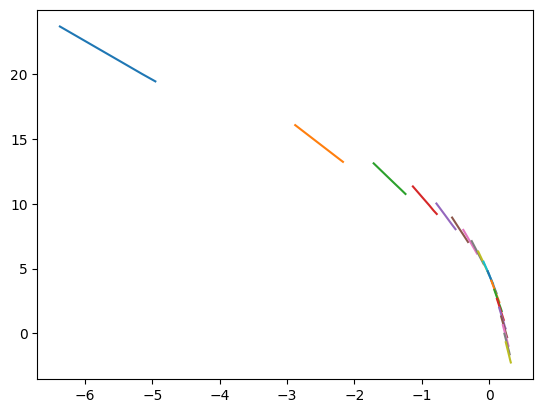

Nombre de dimensions effectives avec le plus proche voisin est : 17


In [ ]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.neighbors import NearestNeighbors
from math import *
import matplotlib.pyplot as plt
from scipy.optimize import minimize

# Remplacer les valeurs NaN par 0
df.fillna(0, inplace=True)

# Création d'un objet MinMaxScaler
scaler = MinMaxScaler()

# Normalisation des colonnes du DataFrame
df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

X = df.values

# Calcul des distances avec les k plus proches voisins
k_values = range(2, 31)  # Valeurs de k allant de 1 à 30
distances = []

for k in k_values:
    nbrs = NearestNeighbors(n_neighbors=k, metric='euclidean').fit(X)
    distances_k, _ = nbrs.kneighbors(X)
    min_distance_k = np.min(distances_k[:, -1])
    distances.append(min_distance_k)

# Affichage des résultats
for k, distance in zip(k_values, distances):
    print("K =", k, "Distance moyenne des plus proches voisins :", distance)

mean_distance = np.mean(distances)
print("Distance moyenne des plus proches voisins :", mean_distance, "\n")

C = 0.54
N = df.shape[0]
D = df.shape[1]

def euclidean_distance(point_p, point_q):
    # Calcul de la somme des carrés des différences
    sum_of_squares = sum(((q - p) ** 2) for p, q in zip(point_p, point_q))
    # Calcul de la distance euclidienne
    distance = sqrt(sum_of_squares)
    return distance

def hl(n, L):
    return (1/C) * ((log(n)/n)**(1/L))

def Un(n, L):
    random_rows = df.sample(n)
    h = hl(n, L)
    somme = 0
    d = 0
    for k in range(0, n-1, 2):
        a = (1/(h**L)) * abs(1 - ((euclidean_distance(random_rows.iloc[k], [0 for i in range(D)]))**2)/(h*h))
        b = (1/(h**L)) * abs(1 - ((euclidean_distance(random_rows.iloc[k+1], random_rows.iloc[k]))**2)/(h*h))
        c = (1/(h**L)) * abs(1 - ((euclidean_distance(random_rows.iloc[k+1], [0 for i in range(D)]))**2)/(h*h))
        somme = somme + (a+b+c)/3
        d = d + 1
    return somme/d

def absolute_slope_least_squares(x, y, weights):
    # Définition de la fonction d'erreur à minimiser
    def error_function(params):
        m = params[0]  # Pente
        c = params[1]  # Ordonnée à l'origine
        absolute_errors = np.abs(y - (m * x + c))
        weighted_errors = weights * absolute_errors
        return np.sum(weighted_errors)
    # Initialisation des paramètres
    initial_params = np.array([0.0, 0.0])
    # Minimisation de la fonction d'erreur
    result = minimize(error_function, initial_params)
    # Récupération des paramètres optimaux
    m_opt = result.x[0]  # Pente optimale
    c_opt = result.x[1]  # Ordonnée à l'origine optimale
    return m_opt, c_opt

P = []
for l in range(1, 20):
    X = []
    Y = []
    for k in range(1, 6):
        X.append(np.log(hl(N//k, l)))
        Y.append(np.log(Un(N//k, l)))
    plt.plot(X, Y)
    weights = np.array([1, 1/2, 1/3, 1/4, 1/5]) # Pondérations
    pente = abs(absolute_slope_least_squares(np.array(X), np.array(Y), weights)[0])
    P.append(pente)
    print("La pente en valeur absolue avec la dimension", l, "est :", pente)

minimum = min(P)
d = P.index(minimum) + 1
plt.show()
print("Nombre de dimensions effectives avec le plus proche voisin est :", d)

## Méthode avec le plus proche voisin (2) : Avec k = 30 | The Intrinsic Dimension of Images and Its Impact on Learning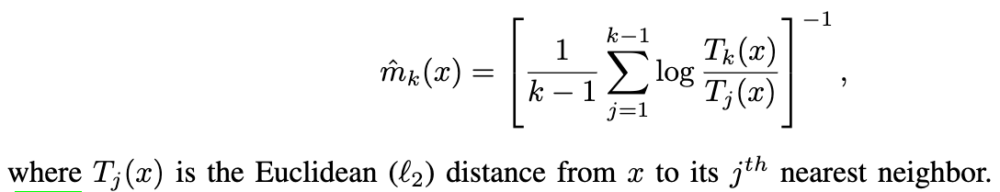

In [ ]:
from sklearn.neighbors import NearestNeighbors
import random
import numpy as np

def Tj_x(distances, j):
    return distances[j]

k = 30
nbrs = NearestNeighbors(n_neighbors=k+1, metric='euclidean').fit(df.values)
distances, _ = nbrs.kneighbors(df.values)

somme = 0
random_indices = random.sample(range(df.shape[0]), 500)
for i in random_indices:
    mk_x = 0
    for j in range(1, k):
        a = np.log(Tj_x(distances[i], k) / Tj_x(distances[i], j))
        mk_x += a
    mk_x = (1 / (k-1) * mk_x) ** (-1)
    print(i, ":", mk_x)
    somme += (mk_x ** (-1))

effective_dimensions = round(((1 / 500) * somme) ** (-1))
print("Nombre de dimensions effectives avec le plus proche voisin est :", effective_dimensions)

5452 : 8.386310080281042
6195 : 11.633725190167336
2799 : 18.70051661523553
8023 : 11.970668304494414
1817 : 12.647060494467437
2618 : 10.17676866673517
6064 : 14.690859125838593
4460 : 21.559813140111856
4236 : 13.164733936060399
8782 : 12.970184368538618
8321 : 14.191025018195907
6387 : 13.282129948209251
307 : 15.697268429668588
7825 : 6.971650491382255
2224 : 15.784498632327603
8241 : 13.536090626500865
9800 : 7.445814473560196
7579 : 15.401581514620878
3877 : 9.416212127022272
6160 : 16.673410509408654
7186 : 10.247386203569548
7908 : 15.063467805594932
781 : 19.967695342429447
479 : 12.355756646559072
9694 : 19.591648327963263
4202 : 11.402303029246427
4150 : 12.188292961404565
1108 : 13.220698124010779
8431 : 5.8546360355566325
917 : 5.425281196952536
4415 : 11.398623586841444
6771 : 10.102162116322011
5840 : 22.770767355445226
8157 : 9.44526887997521
2804 : 20.913433470596395
8585 : 6.508138128075974
4640 : 13.664645456967001
9996 : 14.007695645761363
838 : 15.790337424683637
4

## Méthode avec le plus proche voisin (3) :

In [ ]:
from sklearn.neighbors import NearestNeighbors
import random
import numpy as np

# Diviser les données en deux parties
def split_dataframe(dataframe):
    dataframe_1 = pd.DataFrame()
    dataframe_2 = pd.DataFrame()
    for column in dataframe.columns:
        unique_values = dataframe[column].nunique()  # Nombre de valeurs uniques dans la colonne
        if unique_values <= 2:  # Vérifier si le nombre de valeurs uniques est inférieur ou égal
            dataframe_1[column] = dataframe[column]
        else:
            dataframe_2[column] = dataframe[column]
    return dataframe_1, dataframe_2

binary_df = split_dataframe(df)[0]  # Sélectionner les colonnes binaires
non_binary_df = split_dataframe(df)[1]  # Sélectionner les colonnes non binaires

print(binary_df)
print(non_binary_df)

if binary_df.empty:
    effective_dimensions_1 = 0
elif binary_df.shape[1] == 1:
    effective_dimensions_1 = 1
else:
    # Calculer la matrice de covariance
    cov_matrix = np.cov(binary_df, rowvar=False)

    # Définir les options d'affichage pour la matrice de covariance
    np.set_printoptions(precision=4, suppress=True)

    # Afficher la matrice de covariance
    print(cov_matrix)

    # Décomposition en valeurs propres
    eigenvalues, eigenvectors = np.linalg.eig(cov_matrix)

    # Afficher les valeurs propres
    print("Valeurs propres :")
    print(eigenvalues)

    # Afficher les vecteurs propres
    print("\nVecteurs propres :")
    print(eigenvectors)

    # Calculer la somme des valeurs propres
    total_variance = np.sum(eigenvalues)

    # Calculer les proportions de variance
    variance_ratios = eigenvalues / total_variance

    # Calculer le nombre de dimensions effectives
    effective_dimensions_1 = np.sum(variance_ratios > 0.01)  # Choisissez ici votre seuil approprié

def Tj_x(distances, j):
    return distances[j]

if non_binary_df.empty:
    effective_dimensions_1 = 0
else:
    k = 30
    nbrs = NearestNeighbors(n_neighbors=k+1, metric='euclidean').fit(non_binary_df.values)
    distances, _ = nbrs.kneighbors(non_binary_df.values)

    somme = 0
    random_indices = random.sample(range(non_binary_df.shape[0]), 500)
    for i in random_indices:
        mk_x = 0
        for j in range(1, k):
            a = np.log(Tj_x(distances[i], k) / Tj_x(distances[i], j))
            mk_x += a
        mk_x = (1 / (k-1) * mk_x) ** (-1)
        print(i, ":", mk_x)
        somme += (mk_x ** (-1))

    effective_dimensions_2 = round(((1 / 500) * somme) ** (-1))

effective_dimensions = round(effective_dimensions_1 * (binary_df.shape[1] / df.shape[1]) + effective_dimensions_2 * (non_binary_df.shape[1] / df.shape[1]))
print("Nombre de dimensions effectives avec le plus proche voisin est :", effective_dimensions)

<ipython-input-85-ee5c21b15a8a>:14: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  dataframe_2[column] = dataframe[column]
<ipython-input-85-ee5c21b15a8a>:14: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  dataframe_2[column] = dataframe[column]
<ipython-input-85-ee5c21b15a8a>:14: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `ne

        0  0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  0.9  ...  0.643  0.644  \
0     0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...    0.0    0.0   
1     0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...    0.0    0.0   
2     0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...    0.0    0.0   
3     0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...    0.0    0.0   
4     0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...    0.0    0.0   
...   ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...    ...    ...   
9994  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...    0.0    0.0   
9995  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...    0.0    0.0   
9996  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...    0.0    0.0   
9997  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...    0.0    0.0   
9998  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...    0.0    0.0   

      0.645  0.661  0.662  0.663  0.664  0.665  0.666  0.667  
0       0.0 

# **MNIST Train Small**

## Méthode avec le ratio de variance :

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler

df = pd.read_csv('mnist_train_small.csv', sep=',')

print(df.head())

# Remplacer les valeurs NaN par 0
df.fillna(0, inplace=True)

# Liste des colonnes contenant du texte
text_columns = df.select_dtypes(include=['object']).columns

# Remplacement du texte par des valeurs numériques
for column in text_columns:
    le = LabelEncoder()
    df[column] = le.fit_transform(df[column].astype(str))

# Création d'un objet MinMaxScaler
scaler = MinMaxScaler()

# Normalisation des colonnes du DataFrame
df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

# Affichage du DataFrame modifié
print(df.head())

# Calculer la matrice de covariance
cov_matrix = np.cov(df, rowvar=False)

# Définir les options d'affichage pour la matrice de covariance
np.set_printoptions(precision=4, suppress=True)

# Afficher la matrice de covariance
print(cov_matrix)

# Décomposition en valeurs propres
eigenvalues, eigenvectors = np.linalg.eig(cov_matrix)

# Afficher les valeurs propres
print("Valeurs propres :")
print(eigenvalues)

# Afficher les vecteurs propres
print("\nVecteurs propres :")
print(eigenvectors)

# Calculer la somme des valeurs propres
total_variance = np.sum(eigenvalues)

# Calculer les proportions de variance
variance_ratios = eigenvalues / total_variance

# Calculer le nombre de dimensions effectives
effective_dimensions = np.sum(variance_ratios > 0.01)  # Choisissez ici votre seuil approprié

# Afficher le nombre de dimensions effectives
print("Nombre de dimensions effectives avec le ratio de variance est :", effective_dimensions)

   6  0  0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  ...  0.581  0.582  0.583  \
0  5  0    0    0    0    0    0    0    0    0  ...      0      0      0   
1  7  0    0    0    0    0    0    0    0    0  ...      0      0      0   
2  9  0    0    0    0    0    0    0    0    0  ...      0      0      0   
3  5  0    0    0    0    0    0    0    0    0  ...      0      0      0   
4  2  0    0    0    0    0    0    0    0    0  ...      0      0      0   

   0.584  0.585  0.586  0.587  0.588  0.589  0.590  
0      0      0      0      0      0      0      0  
1      0      0      0      0      0      0      0  
2      0      0      0      0      0      0      0  
3      0      0      0      0      0      0      0  
4      0      0      0      0      0      0      0  

[5 rows x 785 columns]
          6    0  0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  ...  0.581  0.582  \
0  0.555556  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...    0.0    0.0   
1  0.777778  0.0  0.0  0.0  0.0  0.0 

## Méthode avec n1 :

In [ ]:
# Calcul de la somme des valeurs propres
sum_eigenvalues = np.sum(eigenvalues)

result = 1
for eigenvalue in eigenvalues:
    if eigenvalue < 0 or sum_eigenvalues <= 0:
        print(f"Invalid value: eigenvalue={eigenvalue}, sum_eigenvalues={sum_eigenvalues}")
        continue  # Skip this iteration if the values are invalid
    result *= (eigenvalue / sum_eigenvalues) ** (-eigenvalue / sum_eigenvalues)

if not np.isnan(result) and not np.isinf(result):
    print("Nombre de dimensions effectives avec n1 est :", round(result))
else:
    print("Invalid result encountered.")

Invalid value: eigenvalue=(-2.998514431210714e-18+0j), sum_eigenvalues=(52.95251842458128+0j)
Invalid value: eigenvalue=(-4.7987909454968655e-19+0j), sum_eigenvalues=(52.95251842458128+0j)
Nombre de dimensions effectives avec n1 est : (69+0j)


<ipython-input-10-7a1ae0f003e0>:12: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  print("Nombre de dimensions effectives avec n1 est :", round(result))


## Méthode avec n2 :

In [ ]:
# Calcul de la somme des valeurs propres carrées
sum_eigenvalues_square = np.sum(eigenvalues**2)

n2 = (sum_eigenvalues**2) / sum_eigenvalues_square

print("Nombre de dimensions effectives avec n2 est :", round(n2))

Nombre de dimensions effectives avec n2 est : (31+0j)


<ipython-input-11-550acf578314>:6: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  print("Nombre de dimensions effectives avec n2 est :", round(n2))


## Méthode avec n inf :

In [ ]:
n_inf = sum_eigenvalues / max(eigenvalues)

print("Nombre de dimensions effectives avec n inf est :", round(n_inf))

Nombre de dimensions effectives avec n inf est : (10+0j)


<ipython-input-12-a8071ef0fa97>:3: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  print("Nombre de dimensions effectives avec n inf est :", round(n_inf))


## Méthode avec Chaîne de Markov par Monte Carlo :

In [ ]:
from sklearn.decomposition import PCA
pca = PCA(n_components = min(df.shape[1], 50))  # Choisissez le nombre de composantes principales souhaitées
X_pca = pca.fit_transform(df)

# Fonction pour calculer le nombre de dimensions effectives à partir d'une chaîne de Markov
def compute_effective_dimensions(chain):
    num_samples, num_features = chain.shape
    chain_mean = np.mean(chain, axis=0)
    cov_matrix = np.cov(chain.T)
    _, eigvals, _ = np.linalg.svd(cov_matrix)
    cumulative_variance = np.cumsum(eigvals) / np.sum(eigvals)
    effective_dimensions = np.sum(cumulative_variance < 0.99) + 1  # Choisissez votre critère de seuil ici
    return effective_dimensions

# Définir les paramètres de la chaîne de Markov
num_samples = 1000  # Nombre d'échantillons à générer
num_features = X_pca.shape[1]  # Nombre de caractéristiques

# Initialiser la chaîne de Markov
chain = np.zeros((num_samples, num_features))

# Générer la chaîne de Markov
for i in range(1, num_samples):
    # Échantillonner une nouvelle proposition de la distribution normale
    proposal = np.random.multivariate_normal(chain[i-1], np.eye(num_features))

    # Calculer les densités de probabilité des propositions actuelle et proposée
    current_density = np.exp(-np.sum((chain[i-1] - X_pca)**2) / 2)
    proposal_density = np.exp(-np.sum((proposal - X_pca)**2) / 2)

    # Accepter ou rejeter la proposition en utilisant le critère de Metropolis-Hastings
    acceptance_ratio = min(1, proposal_density / current_density)
    if np.random.rand() < acceptance_ratio:
        chain[i] = proposal
    else:
        chain[i] = chain[i-1]

# Calculer le nombre de dimensions effectives
effective_dimensions = compute_effective_dimensions(chain)
print("Nombre de dimensions effectives avec MCMC :", effective_dimensions)

<ipython-input-13-0ae0b3364c69>:32: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


Nombre de dimensions effectives avec MCMC : 25


## Méthode avec le plus proche voisin (1) : Avec C = 0,84

K = 2 Distance moyenne des plus proches voisins : 0.8393989171420209
K = 3 Distance moyenne des plus proches voisins : 1.0529370440264172
K = 4 Distance moyenne des plus proches voisins : 1.1746521894772757
K = 5 Distance moyenne des plus proches voisins : 1.23308236481429
K = 6 Distance moyenne des plus proches voisins : 1.2483530095479887
K = 7 Distance moyenne des plus proches voisins : 1.436027884868792
K = 8 Distance moyenne des plus proches voisins : 1.4424550817346076
K = 9 Distance moyenne des plus proches voisins : 1.5159741501723438
K = 10 Distance moyenne des plus proches voisins : 1.5525796766805167
K = 11 Distance moyenne des plus proches voisins : 1.6006774805595516
K = 12 Distance moyenne des plus proches voisins : 1.6319521971725175
K = 13 Distance moyenne des plus proches voisins : 1.70304474382259
K = 14 Distance moyenne des plus proches voisins : 1.771286206423818
K = 15 Distance moyenne des plus proches voisins : 1.8409498910469149
K = 16 Distance moyenne des plus p

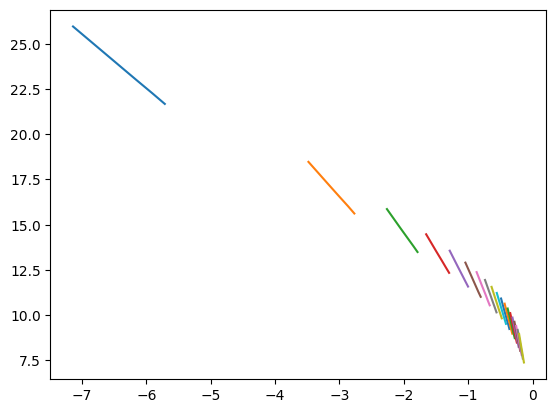

Nombre de dimensions effectives avec le plus proche voisin est : 19


In [ ]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.neighbors import NearestNeighbors
from math import *
import matplotlib.pyplot as plt
from scipy.optimize import minimize

# Remplacer les valeurs NaN par 0
df.fillna(0, inplace=True)

# Création d'un objet MinMaxScaler
scaler = MinMaxScaler()

# Normalisation des colonnes du DataFrame
df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

X = df.values

# Calcul des distances avec les k plus proches voisins
k_values = range(2, 31)  # Valeurs de k allant de 1 à 30
distances = []

for k in k_values:
    nbrs = NearestNeighbors(n_neighbors=k, metric='euclidean').fit(X)
    distances_k, _ = nbrs.kneighbors(X)
    min_distance_k = np.min(distances_k[:, -1])
    distances.append(min_distance_k)

# Affichage des résultats
for k, distance in zip(k_values, distances):
    print("K =", k, "Distance moyenne des plus proches voisins :", distance)

mean_distance = np.mean(distances)
print("Distance moyenne des plus proches voisins :", mean_distance, "\n")

C = 0.84
N = df.shape[0]
D = df.shape[1]

def euclidean_distance(point_p, point_q):
    # Calcul de la somme des carrés des différences
    sum_of_squares = sum(((q - p) ** 2) for p, q in zip(point_p, point_q))
    # Calcul de la distance euclidienne
    distance = sqrt(sum_of_squares)
    return distance

def hl(n, L):
    return (1/C) * ((log(n)/n)**(1/L))

def Un(n, L):
    random_rows = df.sample(n)
    h = hl(n, L)
    somme = 0
    d = 0
    for k in range(0, n-1, 2):
        a = (1/(h**L)) * abs(1 - ((euclidean_distance(random_rows.iloc[k], [0 for i in range(D)]))**2)/(h*h))
        b = (1/(h**L)) * abs(1 - ((euclidean_distance(random_rows.iloc[k+1], random_rows.iloc[k]))**2)/(h*h))
        c = (1/(h**L)) * abs(1 - ((euclidean_distance(random_rows.iloc[k+1], [0 for i in range(D)]))**2)/(h*h))
        somme = somme + (a+b+c)/3
        d = d + 1
    return somme/d

def absolute_slope_least_squares(x, y, weights):
    # Définition de la fonction d'erreur à minimiser
    def error_function(params):
        m = params[0]  # Pente
        c = params[1]  # Ordonnée à l'origine
        absolute_errors = np.abs(y - (m * x + c))
        weighted_errors = weights * absolute_errors
        return np.sum(weighted_errors)
    # Initialisation des paramètres
    initial_params = np.array([0.0, 0.0])
    # Minimisation de la fonction d'erreur
    result = minimize(error_function, initial_params)
    # Récupération des paramètres optimaux
    m_opt = result.x[0]  # Pente optimale
    c_opt = result.x[1]  # Ordonnée à l'origine optimale
    return m_opt, c_opt

P = []
for l in range(1, 20):
    X = []
    Y = []
    for k in range(1, 6):
        X.append(np.log(hl(N//k, l)))
        Y.append(np.log(Un(N//k, l)))
    plt.plot(X, Y)
    weights = np.array([1, 1/2, 1/3, 1/4, 1/5]) # Pondérations
    pente = abs(absolute_slope_least_squares(np.array(X), np.array(Y), weights)[0])
    P.append(pente)
    print("La pente en valeur absolue avec la dimension", l, "est :", pente)

minimum = min(P)
d = P.index(minimum) + 1
plt.show()
print("Nombre de dimensions effectives avec le plus proche voisin est :", d)

## Méthode avec le plus proche voisin (2) : Avec k = 30 | The Intrinsic Dimension of Images and Its Impact on Learning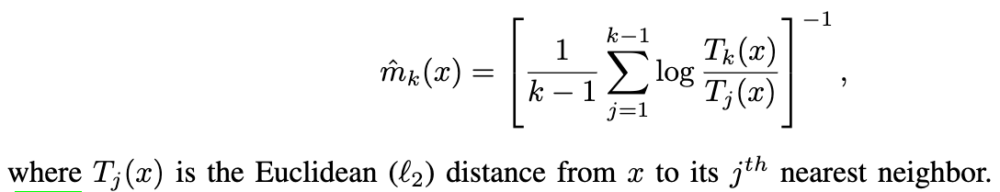

In [ ]:
from sklearn.neighbors import NearestNeighbors
import random
import numpy as np

def Tj_x(distances, j):
    return distances[j]

k = 30
nbrs = NearestNeighbors(n_neighbors=k+1, metric='euclidean').fit(df.values)
distances, _ = nbrs.kneighbors(df.values)

somme = 0
random_indices = random.sample(range(df.shape[0]), 500)
for i in random_indices:
    mk_x = 0
    for j in range(1, k):
        a = np.log(Tj_x(distances[i], k) / Tj_x(distances[i], j))
        mk_x += a
    mk_x = (1 / (k-1) * mk_x) ** (-1)
    print(i, ":", mk_x)
    somme += (mk_x ** (-1))

effective_dimensions = round(((1 / 500) * somme) ** (-1))
print("Nombre de dimensions effectives avec le plus proche voisin est :", effective_dimensions)

9728 : 23.020538996886955
2104 : 24.36453377423904
10690 : 18.03099994161953
10357 : 9.086675320234502
1445 : 10.580484287327081
12848 : 11.392942964386723
9485 : 25.441361160483474
3426 : 15.763545716177084
10146 : 14.998474718041463
8827 : 15.646215032067573
8438 : 12.988329647080286
6037 : 11.062917227170486
2251 : 12.832243076485888
6463 : 15.739669094379014
5362 : 9.020622168546154
7569 : 17.439721118383158
14033 : 9.054115096393174
1523 : 7.33071007338864
9411 : 11.836449885282878
6689 : 18.245355731617643
11311 : 20.83323129292709
3861 : 10.554840213324008
5691 : 15.043275193357037
8648 : 14.533457771822816
5601 : 21.880926067741704
13792 : 12.836243264566752
13041 : 18.8792870302011
5808 : 10.05205414753144
12994 : 17.406652847790838
397 : 8.075554939130432
9237 : 15.712555887199777
2721 : 23.415816016348916
3648 : 11.934786592820513
6196 : 25.955798806478807
12386 : 15.457230907547899
4905 : 15.125833073601411
10913 : 25.49503007580474
420 : 23.17945664385691
12275 : 16.535579

## Méthode avec le plus proche voisin (3) :

In [ ]:
from sklearn.neighbors import NearestNeighbors
import random
import numpy as np

# Diviser les données en deux parties
def split_dataframe(dataframe):
    dataframe_1 = pd.DataFrame()
    dataframe_2 = pd.DataFrame()
    for column in dataframe.columns:
        unique_values = dataframe[column].nunique()  # Nombre de valeurs uniques dans la colonne
        if unique_values <= 2:  # Vérifier si le nombre de valeurs uniques est inférieur ou égal
            dataframe_1[column] = dataframe[column]
        else:
            dataframe_2[column] = dataframe[column]
    return dataframe_1, dataframe_2

binary_df = split_dataframe(df)[0]  # Sélectionner les colonnes binaires
non_binary_df = split_dataframe(df)[1]  # Sélectionner les colonnes non binaires

print(binary_df)
print(non_binary_df)

if binary_df.empty:
    effective_dimensions_1 = 0
elif binary_df.shape[1] == 1:
    effective_dimensions_1 = 1
else:
    # Calculer la matrice de covariance
    cov_matrix = np.cov(binary_df, rowvar=False)

    # Définir les options d'affichage pour la matrice de covariance
    np.set_printoptions(precision=4, suppress=True)

    # Afficher la matrice de covariance
    print(cov_matrix)

    # Décomposition en valeurs propres
    eigenvalues, eigenvectors = np.linalg.eig(cov_matrix)

    # Afficher les valeurs propres
    print("Valeurs propres :")
    print(eigenvalues)

    # Afficher les vecteurs propres
    print("\nVecteurs propres :")
    print(eigenvectors)

    # Calculer la somme des valeurs propres
    total_variance = np.sum(eigenvalues)

    # Calculer les proportions de variance
    variance_ratios = eigenvalues / total_variance

    # Calculer le nombre de dimensions effectives
    effective_dimensions_1 = np.sum(variance_ratios > 0.01)  # Choisissez ici votre seuil approprié

def Tj_x(distances, j):
    return distances[j]

if non_binary_df.empty:
    effective_dimensions_1 = 0
else:
    k = 30
    nbrs = NearestNeighbors(n_neighbors=k+1, metric='euclidean').fit(non_binary_df.values)
    distances, _ = nbrs.kneighbors(non_binary_df.values)

    somme = 0
    random_indices = random.sample(range(non_binary_df.shape[0]), 500)
    for i in random_indices:
        mk_x = 0
        for j in range(1, k):
            a = np.log(Tj_x(distances[i], k) / Tj_x(distances[i], j))
            mk_x += a
        mk_x = (1 / (k-1) * mk_x) ** (-1)
        print(i, ":", mk_x)
        somme += (mk_x ** (-1))

    effective_dimensions_2 = round(((1 / 500) * somme) ** (-1))

effective_dimensions = round(effective_dimensions_1 * (binary_df.shape[1] / df.shape[1]) + effective_dimensions_2 * (non_binary_df.shape[1] / df.shape[1]))
print("Nombre de dimensions effectives avec le plus proche voisin est :", effective_dimensions)

<ipython-input-82-ee5c21b15a8a>:14: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  dataframe_2[column] = dataframe[column]
<ipython-input-82-ee5c21b15a8a>:14: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  dataframe_2[column] = dataframe[column]
<ipython-input-82-ee5c21b15a8a>:14: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `ne

         0  0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  0.9  ...  0.562  0.563  \
0      0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...    0.0    0.0   
1      0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...    0.0    0.0   
2      0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...    0.0    0.0   
3      0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...    0.0    0.0   
4      0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...    0.0    0.0   
...    ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...    ...    ...   
19994  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...    0.0    0.0   
19995  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...    0.0    0.0   
19996  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...    0.0    0.0   
19997  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...    0.0    0.0   
19998  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...    0.0    0.0   

       0.564  0.565  0.566  0.567  0.587  0.588  0.589  0.590  

# **CIFAR-10 Test**

## Méthode avec le ratio de variance :

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler

df = pd.read_csv('cifar10_test.csv', sep=',')

print(df.head())

# Remplacer les valeurs NaN par 0
df.fillna(0, inplace=True)

# Liste des colonnes contenant du texte
text_columns = df.select_dtypes(include=['object']).columns

# Remplacement du texte par des valeurs numériques
for column in text_columns:
    le = LabelEncoder()
    df[column] = le.fit_transform(df[column].astype(str))

# Création d'un objet MinMaxScaler
scaler = MinMaxScaler()

# Normalisation des colonnes du DataFrame
df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

# Affichage du DataFrame modifié
print(df.head())

# Calculer la matrice de covariance
cov_matrix = np.cov(df, rowvar=False)

# Définir les options d'affichage pour la matrice de covariance
np.set_printoptions(precision=4, suppress=True)

# Afficher la matrice de covariance
print(cov_matrix)

# Décomposition en valeurs propres
eigenvalues, eigenvectors = np.linalg.eig(cov_matrix)

# Afficher les valeurs propres
print("Valeurs propres :")
print(eigenvalues)

# Afficher les vecteurs propres
print("\nVecteurs propres :")
print(eigenvectors)

# Calculer la somme des valeurs propres
total_variance = np.sum(eigenvalues)

# Calculer les proportions de variance
variance_ratios = eigenvalues / total_variance

# Calculer le nombre de dimensions effectives
effective_dimensions = np.sum(variance_ratios > 0.01)  # Choisissez ici votre seuil approprié

# Afficher le nombre de dimensions effectives
print("Nombre de dimensions effectives avec le ratio de variance est :", effective_dimensions)

   pixel_0  pixel_1  pixel_2  pixel_3  pixel_4  pixel_5  pixel_6  pixel_7  \
0      158      159      165      166      160      156      162      159   
1      235      231      232      232      232      232      232      232   
2      158      158      139      132      166      182      187      193   
3      155      167      176      190      177      166      168      166   
4       65       70       48       30       23       40       44       45   

   pixel_8  pixel_9  ...  pixel_3062  pixel_3063  pixel_3064  pixel_3065  \
0      158      159  ...         130         123         145         167   
1      232      232  ...         108         117         123         133   
2      199      205  ...          45          46          44          44   
3      170      179  ...          52          55          70         103   
4       45       40  ...         102         127         156         139   

   pixel_3066  pixel_3067  pixel_3068  pixel_3069  pixel_3070  pixel_3071  
0   

## Méthode avec n1 :

In [ ]:
# Calcul de la somme des valeurs propres
sum_eigenvalues = np.sum(eigenvalues)

result = 1
for eigenvalue in eigenvalues:
    if eigenvalue < 0 or sum_eigenvalues <= 0:
        print(f"Invalid value: eigenvalue={eigenvalue}, sum_eigenvalues={sum_eigenvalues}")
        continue  # Skip this iteration if the values are invalid
    result *= (eigenvalue / sum_eigenvalues) ** (-eigenvalue / sum_eigenvalues)

if not np.isnan(result) and not np.isinf(result):
    print("Nombre de dimensions effectives avec n1 est :", round(result))
else:
    print("Invalid result encountered.")

Nombre de dimensions effectives avec n1 est : 39


## Méthode avec n2 :

In [ ]:
# Calcul de la somme des valeurs propres carrées
sum_eigenvalues_square = np.sum(eigenvalues**2)

n2 = (sum_eigenvalues**2) / sum_eigenvalues_square

print("Nombre de dimensions effectives avec n2 est :", round(n2))

Nombre de dimensions effectives avec n2 est : 9


## Méthode avec n inf :

In [ ]:
n_inf = sum_eigenvalues / max(eigenvalues)

print("Nombre de dimensions effectives avec n inf est :", round(n_inf))

Nombre de dimensions effectives avec n inf est : 3


## Méthode avec Chaîne de Markov par Monte Carlo :

In [ ]:
from sklearn.decomposition import PCA
pca = PCA(n_components = min(df.shape[1], 50))  # Choisissez le nombre de composantes principales souhaitées
X_pca = pca.fit_transform(df)

# Fonction pour calculer le nombre de dimensions effectives à partir d'une chaîne de Markov
def compute_effective_dimensions(chain):
    num_samples, num_features = chain.shape
    chain_mean = np.mean(chain, axis=0)
    cov_matrix = np.cov(chain.T)
    _, eigvals, _ = np.linalg.svd(cov_matrix)
    cumulative_variance = np.cumsum(eigvals) / np.sum(eigvals)
    effective_dimensions = np.sum(cumulative_variance < 0.99) + 1  # Choisissez votre critère de seuil ici
    return effective_dimensions

# Définir les paramètres de la chaîne de Markov
num_samples = 1000  # Nombre d'échantillons à générer
num_features = X_pca.shape[1]  # Nombre de caractéristiques

# Initialiser la chaîne de Markov
chain = np.zeros((num_samples, num_features))

# Générer la chaîne de Markov
for i in range(1, num_samples):
    # Échantillonner une nouvelle proposition de la distribution normale
    proposal = np.random.multivariate_normal(chain[i-1], np.eye(num_features))

    # Calculer les densités de probabilité des propositions actuelle et proposée
    current_density = np.exp(-np.sum((chain[i-1] - X_pca)**2) / 2)
    proposal_density = np.exp(-np.sum((proposal - X_pca)**2) / 2)

    # Accepter ou rejeter la proposition en utilisant le critère de Metropolis-Hastings
    acceptance_ratio = min(1, proposal_density / current_density)
    if np.random.rand() < acceptance_ratio:
        chain[i] = proposal
    else:
        chain[i] = chain[i-1]

# Calculer le nombre de dimensions effectives
effective_dimensions = compute_effective_dimensions(chain)
print("Nombre de dimensions effectives avec MCMC :", effective_dimensions)

<ipython-input-39-0ae0b3364c69>:32: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


Nombre de dimensions effectives avec MCMC : 22


## Méthode avec le plus proche voisin (1) :

In [ ]:
"""
from sklearn.preprocessing import MinMaxScaler
from sklearn.neighbors import NearestNeighbors
from math import *
import matplotlib.pyplot as plt
from scipy.optimize import minimize

# Remplacer les valeurs NaN par 0
df.fillna(0, inplace=True)

# Création d'un objet MinMaxScaler
scaler = MinMaxScaler()

# Normalisation des colonnes du DataFrame
df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

X = df.values

# Calcul des distances avec les k plus proches voisins
k_values = range(2, 31)  # Valeurs de k allant de 1 à 30
distances = []

for k in k_values:
    nbrs = NearestNeighbors(n_neighbors=k, metric='euclidean').fit(X)
    distances_k, _ = nbrs.kneighbors(X)
    min_distance_k = np.min(distances_k[:, -1])
    distances.append(min_distance_k)

# Affichage des résultats
for k, distance in zip(k_values, distances):
    print("K =", k, "Distance moyenne des plus proches voisins :", distance)

mean_distance = np.mean(distances)
print("Distance moyenne des plus proches voisins :", mean_distance, "\n")

C = mean_distance
N = df.shape[0]
D = df.shape[1]

def euclidean_distance(point_p, point_q):
    # Calcul de la somme des carrés des différences
    sum_of_squares = sum(((q - p) ** 2) for p, q in zip(point_p, point_q))
    # Calcul de la distance euclidienne
    distance = sqrt(sum_of_squares)
    return distance

def hl(n, L):
    return (1/C) * ((log(n)/n)**(1/L))

def Un(n, L):
    random_rows = df.sample(n)
    h = hl(n, L)
    somme = 0
    d = 0
    for k in range(0, n-1, 2):
        a = (1/(h**L)) * abs(1 - ((euclidean_distance(random_rows.iloc[k], [0 for i in range(D)]))**2)/(h*h))
        b = (1/(h**L)) * abs(1 - ((euclidean_distance(random_rows.iloc[k+1], random_rows.iloc[k]))**2)/(h*h))
        c = (1/(h**L)) * abs(1 - ((euclidean_distance(random_rows.iloc[k+1], [0 for i in range(D)]))**2)/(h*h))
        somme = somme + (a+b+c)/3
        d = d + 1
    return somme/d

def absolute_slope_least_squares(x, y, weights):
    # Définition de la fonction d'erreur à minimiser
    def error_function(params):
        m = params[0]  # Pente
        c = params[1]  # Ordonnée à l'origine
        absolute_errors = np.abs(y - (m * x + c))
        weighted_errors = weights * absolute_errors
        return np.sum(weighted_errors)
    # Initialisation des paramètres
    initial_params = np.array([0.0, 0.0])
    # Minimisation de la fonction d'erreur
    result = minimize(error_function, initial_params)
    # Récupération des paramètres optimaux
    m_opt = result.x[0]  # Pente optimale
    c_opt = result.x[1]  # Ordonnée à l'origine optimale
    return m_opt, c_opt

P = []
for l in range(1, 20):
    X = []
    Y = []
    for k in range(1, 6):
        X.append(np.log(hl(N//k, l)))
        Y.append(np.log(Un(N//k, l)))
    plt.plot(X, Y)
    weights = np.array([1, 1/2, 1/3, 1/4, 1/5]) # Pondérations
    pente = abs(absolute_slope_least_squares(np.array(X), np.array(Y), weights)[0])
    P.append(pente)
    print("La pente en valeur absolue avec la dimension", l, "est :", pente)

minimum = min(P)
d = P.index(minimum) + 1
plt.show()
print("Nombre de dimensions effectives avec le plus proche voisin est :", d)
"""

'\nfrom sklearn.preprocessing import MinMaxScaler\nfrom sklearn.neighbors import NearestNeighbors\nfrom math import *\nimport matplotlib.pyplot as plt\nfrom scipy.optimize import minimize\n\n# Remplacer les valeurs NaN par 0\ndf.fillna(0, inplace=True)\n\n# Création d\'un objet MinMaxScaler\nscaler = MinMaxScaler()\n\n# Normalisation des colonnes du DataFrame\ndf = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)\n\nX = df.values\n\n# Calcul des distances avec les k plus proches voisins\nk_values = range(2, 31)  # Valeurs de k allant de 1 à 30\ndistances = []\n\nfor k in k_values:\n    nbrs = NearestNeighbors(n_neighbors=k, metric=\'euclidean\').fit(X)\n    distances_k, _ = nbrs.kneighbors(X)\n    min_distance_k = np.min(distances_k[:, -1])\n    distances.append(min_distance_k)\n\n# Affichage des résultats\nfor k, distance in zip(k_values, distances):\n    print("K =", k, "Distance moyenne des plus proches voisins :", distance)\n\nmean_distance = np.mean(distances)\nprint("Di

## Méthode avec le plus proche voisin (2) : Avec k = 30 | The Intrinsic Dimension of Images and Its Impact on Learning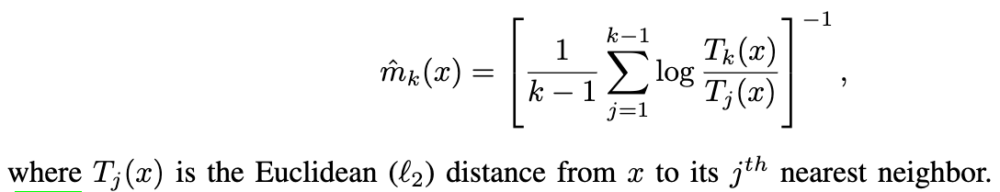

In [ ]:
from sklearn.neighbors import NearestNeighbors
import random
import numpy as np

def Tj_x(distances, j):
    return distances[j]

k = 30
nbrs = NearestNeighbors(n_neighbors=k+1, metric='euclidean').fit(df.values)
distances, _ = nbrs.kneighbors(df.values)

somme = 0
random_indices = random.sample(range(df.shape[0]), 500)
for i in random_indices:
    mk_x = 0
    for j in range(1, k):
        a = np.log(Tj_x(distances[i], k) / Tj_x(distances[i], j))
        mk_x += a
    mk_x = (1 / (k-1) * mk_x) ** (-1)
    print(i, ":", mk_x)
    somme += (mk_x ** (-1))

effective_dimensions = round(((1 / 500) * somme) ** (-1))
print("Nombre de dimensions effectives avec le plus proche voisin est :", effective_dimensions)

7743 : 22.79572234465622
237 : 21.00643718205538
2209 : 15.94527980040953
2428 : 26.42512499386617
4232 : 25.497786004963906
4856 : 33.30044850994514
7473 : 38.3734099419118
971 : 15.651345053410603
3867 : 23.0043092726629
2604 : 18.329775330763415
1260 : 21.209922759435372
2244 : 29.13858213747137
4435 : 20.86859734572617
5347 : 33.2580967592921
1677 : 19.871105863093327
9490 : 19.305876854313205
5931 : 27.459742172156194
3533 : 16.105157088457307
837 : 19.185805397130384
5308 : 26.472554918889774
9671 : 29.782491382680398
703 : 19.13166564105059
3575 : 35.15036109868305
7497 : 27.907896492080983
4633 : 33.166891235467205
9236 : 32.12406293443603
9274 : 22.427997776123206
6104 : 28.840699842822488
226 : 27.327594093773236
1452 : 29.934888361634624
974 : 26.998083937264973
2960 : 30.38720287536605
7641 : 35.80067024645397
4789 : 28.55577869631462
6833 : 26.791921922960302
8546 : 17.25066270151465
307 : 26.538425158118248
7981 : 39.065054620118936
5593 : 17.82157134353848
1224 : 21.2045

## Méthode avec le plus proche voisin (3) :

In [ ]:
from sklearn.neighbors import NearestNeighbors
import random
import numpy as np

# Diviser les données en deux parties
def split_dataframe(dataframe):
    dataframe_1 = pd.DataFrame()
    dataframe_2 = pd.DataFrame()
    for column in dataframe.columns:
        unique_values = dataframe[column].nunique()  # Nombre de valeurs uniques dans la colonne
        if unique_values <= 2:  # Vérifier si le nombre de valeurs uniques est inférieur ou égal
            dataframe_1[column] = dataframe[column]
        else:
            dataframe_2[column] = dataframe[column]
    return dataframe_1, dataframe_2

binary_df = split_dataframe(df)[0]  # Sélectionner les colonnes binaires
non_binary_df = split_dataframe(df)[1]  # Sélectionner les colonnes non binaires

print(binary_df)
print(non_binary_df)

if binary_df.empty:
    effective_dimensions_1 = 0
elif binary_df.shape[1] == 1:
    effective_dimensions_1 = 1
else:
    # Calculer la matrice de covariance
    cov_matrix = np.cov(binary_df, rowvar=False)

    # Définir les options d'affichage pour la matrice de covariance
    np.set_printoptions(precision=4, suppress=True)

    # Afficher la matrice de covariance
    print(cov_matrix)

    # Décomposition en valeurs propres
    eigenvalues, eigenvectors = np.linalg.eig(cov_matrix)

    # Afficher les valeurs propres
    print("Valeurs propres :")
    print(eigenvalues)

    # Afficher les vecteurs propres
    print("\nVecteurs propres :")
    print(eigenvectors)

    # Calculer la somme des valeurs propres
    total_variance = np.sum(eigenvalues)

    # Calculer les proportions de variance
    variance_ratios = eigenvalues / total_variance

    # Calculer le nombre de dimensions effectives
    effective_dimensions_1 = np.sum(variance_ratios > 0.01)  # Choisissez ici votre seuil approprié

def Tj_x(distances, j):
    return distances[j]

if non_binary_df.empty:
    effective_dimensions_1 = 0
else:
    k = 30
    nbrs = NearestNeighbors(n_neighbors=k+1, metric='euclidean').fit(non_binary_df.values)
    distances, _ = nbrs.kneighbors(non_binary_df.values)

    somme = 0
    random_indices = random.sample(range(non_binary_df.shape[0]), 500)
    for i in random_indices:
        mk_x = 0
        for j in range(1, k):
            a = np.log(Tj_x(distances[i], k) / Tj_x(distances[i], j))
            mk_x += a
        mk_x = (1 / (k-1) * mk_x) ** (-1)
        print(i, ":", mk_x)
        somme += (mk_x ** (-1))

    effective_dimensions_2 = round(((1 / 500) * somme) ** (-1))

effective_dimensions = round(effective_dimensions_1 * (binary_df.shape[1] / df.shape[1]) + effective_dimensions_2 * (non_binary_df.shape[1] / df.shape[1]))
print("Nombre de dimensions effectives avec le plus proche voisin est :", effective_dimensions)

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
<ipython-input-79-ee5c21b15a8a>:14: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  dataframe_2[column] = dataframe[column]
<ipython-input-79-ee5c21b15a8a>:14: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  dataframe_2[column] = dataframe[column]
<ipython-input-79-ee5c21b15a8a>:14: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns 

Empty DataFrame
Columns: []
Index: []
       pixel_0   pixel_1   pixel_2   pixel_3   pixel_4   pixel_5   pixel_6  \
0     0.619608  0.623529  0.647059  0.650980  0.627451  0.611765  0.635294   
1     0.921569  0.905882  0.909804  0.909804  0.909804  0.909804  0.909804   
2     0.619608  0.619608  0.545098  0.517647  0.650980  0.713725  0.733333   
3     0.607843  0.654902  0.690196  0.745098  0.694118  0.650980  0.658824   
4     0.254902  0.274510  0.188235  0.117647  0.090196  0.156863  0.172549   
...        ...       ...       ...       ...       ...       ...       ...   
9995  0.298039  0.298039  0.301961  0.298039  0.294118  0.298039  0.298039   
9996  0.317647  0.356863  0.384314  0.415686  0.423529  0.431373  0.313725   
9997  0.078431  0.074510  0.058824  0.058824  0.054902  0.050980  0.047059   
9998  0.098039  0.058824  0.090196  0.066667  0.090196  0.200000  0.290196   
9999  0.286275  0.384314  0.388235  0.301961  0.231373  0.572549  0.839216   

       pixel_7   pixel_8 

# **CIFAR-10 Train**

## Méthode avec le ratio de variance :

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler

df = pd.read_csv('cifar10_train.csv', sep=',')

print(df.head())

# Remplacer les valeurs NaN par 0
df.fillna(0, inplace=True)

# Liste des colonnes contenant du texte
text_columns = df.select_dtypes(include=['object']).columns

# Remplacement du texte par des valeurs numériques
for column in text_columns:
    le = LabelEncoder()
    df[column] = le.fit_transform(df[column].astype(str))

# Création d'un objet MinMaxScaler
scaler = MinMaxScaler()

# Normalisation des colonnes du DataFrame
df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

# Affichage du DataFrame modifié
print(df.head())

# Calculer la matrice de covariance
cov_matrix = np.cov(df, rowvar=False)

# Définir les options d'affichage pour la matrice de covariance
np.set_printoptions(precision=4, suppress=True)

# Afficher la matrice de covariance
print(cov_matrix)

# Décomposition en valeurs propres
eigenvalues, eigenvectors = np.linalg.eig(cov_matrix)

# Afficher les valeurs propres
print("Valeurs propres :")
print(eigenvalues)

# Afficher les vecteurs propres
print("\nVecteurs propres :")
print(eigenvectors)

# Calculer la somme des valeurs propres
total_variance = np.sum(eigenvalues)

# Calculer les proportions de variance
variance_ratios = eigenvalues / total_variance

# Calculer le nombre de dimensions effectives
effective_dimensions = np.sum(variance_ratios > 0.01)  # Choisissez ici votre seuil approprié

# Afficher le nombre de dimensions effectives
print("Nombre de dimensions effectives avec le ratio de variance est :", effective_dimensions)

   pixel_0  pixel_1  pixel_2  pixel_3  pixel_4  pixel_5  pixel_6  pixel_7  \
0       59       43       50       68       98      119      139      145   
1      154      126      105      102      125      155      172      180   
2      255      253      253      253      253      253      253      253   
3       28       37       38       42       44       40       40       24   
4      170      168      177      183      181      177      181      184   

   pixel_8  pixel_9  ...  pixel_3063  pixel_3064  pixel_3065  pixel_3066  \
0      149      149  ...          58          65          59          46   
1      142      111  ...          42          67         101         122   
2      253      253  ...          83          80          69          66   
3       32       43  ...          39          59          42          44   
4      189      189  ...          88          85          82          83   

   pixel_3067  pixel_3068  pixel_3069  pixel_3070  pixel_3071  label  
0        

## Méthode avec n1 :

In [ ]:
# Calcul de la somme des valeurs propres
sum_eigenvalues = np.sum(eigenvalues)

result = 1
for eigenvalue in eigenvalues:
    if eigenvalue < 0 or sum_eigenvalues <= 0:
        print(f"Invalid value: eigenvalue={eigenvalue}, sum_eigenvalues={sum_eigenvalues}")
        continue  # Skip this iteration if the values are invalid
    result *= (eigenvalue / sum_eigenvalues) ** (-eigenvalue / sum_eigenvalues)

if not np.isnan(result) and not np.isinf(result):
    print("Nombre de dimensions effectives avec n1 est :", round(result))
else:
    print("Invalid result encountered.")

Nombre de dimensions effectives avec n1 est : 40


## Méthode avec n2 :

In [ ]:
# Calcul de la somme des valeurs propres carrées
sum_eigenvalues_square = np.sum(eigenvalues**2)

n2 = (sum_eigenvalues**2) / sum_eigenvalues_square

print("Nombre de dimensions effectives avec n2 est :", round(n2))

Nombre de dimensions effectives avec n2 est : 9


## Méthode avec n inf :

In [ ]:
n_inf = sum_eigenvalues / max(eigenvalues)

print("Nombre de dimensions effectives avec n inf est :", round(n_inf))

Nombre de dimensions effectives avec n inf est : 3


## Méthode avec Chaîne de Markov par Monte Carlo :

In [ ]:
from sklearn.decomposition import PCA
pca = PCA(n_components = min(df.shape[1], 50))  # Choisissez le nombre de composantes principales souhaitées
X_pca = pca.fit_transform(df)

# Fonction pour calculer le nombre de dimensions effectives à partir d'une chaîne de Markov
def compute_effective_dimensions(chain):
    num_samples, num_features = chain.shape
    chain_mean = np.mean(chain, axis=0)
    cov_matrix = np.cov(chain.T)
    _, eigvals, _ = np.linalg.svd(cov_matrix)
    cumulative_variance = np.cumsum(eigvals) / np.sum(eigvals)
    effective_dimensions = np.sum(cumulative_variance < 0.99) + 1  # Choisissez votre critère de seuil ici
    return effective_dimensions

# Définir les paramètres de la chaîne de Markov
num_samples = 1000  # Nombre d'échantillons à générer
num_features = X_pca.shape[1]  # Nombre de caractéristiques

# Initialiser la chaîne de Markov
chain = np.zeros((num_samples, num_features))

# Générer la chaîne de Markov
for i in range(1, num_samples):
    # Échantillonner une nouvelle proposition de la distribution normale
    proposal = np.random.multivariate_normal(chain[i-1], np.eye(num_features))

    # Calculer les densités de probabilité des propositions actuelle et proposée
    current_density = np.exp(-np.sum((chain[i-1] - X_pca)**2) / 2)
    proposal_density = np.exp(-np.sum((proposal - X_pca)**2) / 2)

    # Accepter ou rejeter la proposition en utilisant le critère de Metropolis-Hastings
    acceptance_ratio = min(1, proposal_density / current_density)
    if np.random.rand() < acceptance_ratio:
        chain[i] = proposal
    else:
        chain[i] = chain[i-1]

# Calculer le nombre de dimensions effectives
effective_dimensions = compute_effective_dimensions(chain)
print("Nombre de dimensions effectives avec MCMC :", effective_dimensions)

<ipython-input-70-0ae0b3364c69>:32: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


Nombre de dimensions effectives avec MCMC : 25


## Méthode avec le plus proche voisin (1) :

In [ ]:
"""
from sklearn.preprocessing import MinMaxScaler
from sklearn.neighbors import NearestNeighbors
from math import *
import matplotlib.pyplot as plt
from scipy.optimize import minimize

# Remplacer les valeurs NaN par 0
df.fillna(0, inplace=True)

# Création d'un objet MinMaxScaler
scaler = MinMaxScaler()

# Normalisation des colonnes du DataFrame
df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

X = df.values

# Calcul des distances avec les k plus proches voisins
k_values = range(2, 31)  # Valeurs de k allant de 1 à 30
distances = []

for k in k_values:
    nbrs = NearestNeighbors(n_neighbors=k, metric='euclidean').fit(X)
    distances_k, _ = nbrs.kneighbors(X)
    min_distance_k = np.min(distances_k[:, -1])
    distances.append(min_distance_k)

# Affichage des résultats
for k, distance in zip(k_values, distances):
    print("K =", k, "Distance moyenne des plus proches voisins :", distance)

mean_distance = np.mean(distances)
print("Distance moyenne des plus proches voisins :", mean_distance, "\n")

C = mean_distance
N = df.shape[0]
D = df.shape[1]

def euclidean_distance(point_p, point_q):
    # Calcul de la somme des carrés des différences
    sum_of_squares = sum(((q - p) ** 2) for p, q in zip(point_p, point_q))
    # Calcul de la distance euclidienne
    distance = sqrt(sum_of_squares)
    return distance

def hl(n, L):
    return (1/C) * ((log(n)/n)**(1/L))

def Un(n, L):
    random_rows = df.sample(n)
    h = hl(n, L)
    somme = 0
    d = 0
    for k in range(0, n-1, 2):
        a = (1/(h**L)) * abs(1 - ((euclidean_distance(random_rows.iloc[k], [0 for i in range(D)]))**2)/(h*h))
        b = (1/(h**L)) * abs(1 - ((euclidean_distance(random_rows.iloc[k+1], random_rows.iloc[k]))**2)/(h*h))
        c = (1/(h**L)) * abs(1 - ((euclidean_distance(random_rows.iloc[k+1], [0 for i in range(D)]))**2)/(h*h))
        somme = somme + (a+b+c)/3
        d = d + 1
    return somme/d

def absolute_slope_least_squares(x, y, weights):
    # Définition de la fonction d'erreur à minimiser
    def error_function(params):
        m = params[0]  # Pente
        c = params[1]  # Ordonnée à l'origine
        absolute_errors = np.abs(y - (m * x + c))
        weighted_errors = weights * absolute_errors
        return np.sum(weighted_errors)
    # Initialisation des paramètres
    initial_params = np.array([0.0, 0.0])
    # Minimisation de la fonction d'erreur
    result = minimize(error_function, initial_params)
    # Récupération des paramètres optimaux
    m_opt = result.x[0]  # Pente optimale
    c_opt = result.x[1]  # Ordonnée à l'origine optimale
    return m_opt, c_opt

P = []
for l in range(1, 20):
    X = []
    Y = []
    for k in range(1, 6):
        X.append(np.log(hl(N//k, l)))
        Y.append(np.log(Un(N//k, l)))
    plt.plot(X, Y)
    weights = np.array([1, 1/2, 1/3, 1/4, 1/5]) # Pondérations
    pente = abs(absolute_slope_least_squares(np.array(X), np.array(Y), weights)[0])
    P.append(pente)
    print("La pente en valeur absolue avec la dimension", l, "est :", pente)

minimum = min(P)
d = P.index(minimum) + 1
plt.show()
print("Nombre de dimensions effectives avec le plus proche voisin est :", d)
"""

'\nfrom sklearn.preprocessing import MinMaxScaler\nfrom sklearn.neighbors import NearestNeighbors\nfrom math import *\nimport matplotlib.pyplot as plt\nfrom scipy.optimize import minimize\n\n# Remplacer les valeurs NaN par 0\ndf.fillna(0, inplace=True)\n\n# Création d\'un objet MinMaxScaler\nscaler = MinMaxScaler()\n\n# Normalisation des colonnes du DataFrame\ndf = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)\n\nX = df.values\n\n# Calcul des distances avec les k plus proches voisins\nk_values = range(2, 31)  # Valeurs de k allant de 1 à 30\ndistances = []\n\nfor k in k_values:\n    nbrs = NearestNeighbors(n_neighbors=k, metric=\'euclidean\').fit(X)\n    distances_k, _ = nbrs.kneighbors(X)\n    min_distance_k = np.min(distances_k[:, -1])\n    distances.append(min_distance_k)\n\n# Affichage des résultats\nfor k, distance in zip(k_values, distances):\n    print("K =", k, "Distance moyenne des plus proches voisins :", distance)\n\nmean_distance = np.mean(distances)\nprint("Di

## Méthode avec le plus proche voisin (2) : Avec k = 30 | The Intrinsic Dimension of Images and Its Impact on Learning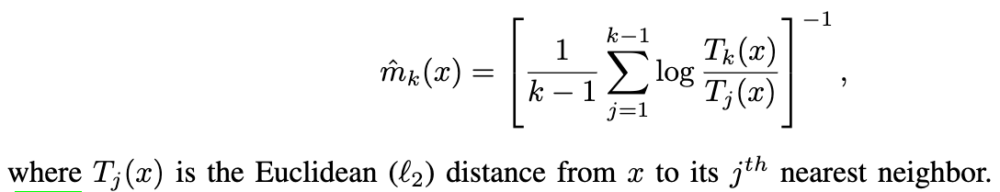

In [ ]:
from sklearn.neighbors import NearestNeighbors
import random
import numpy as np

def Tj_x(distances, j):
    return distances[j]

k = 30
nbrs = NearestNeighbors(n_neighbors=k+1, metric='euclidean').fit(df.values)
distances, _ = nbrs.kneighbors(df.values)

somme = 0
random_indices = random.sample(range(df.shape[0]), 500)
for i in random_indices:
    mk_x = 0
    for j in range(1, k):
        a = np.log(Tj_x(distances[i], k) / Tj_x(distances[i], j))
        mk_x += a
    mk_x = (1 / (k-1) * mk_x) ** (-1)
    print(i, ":", mk_x)
    somme += (mk_x ** (-1))

effective_dimensions = round(((1 / 500) * somme) ** (-1))
print("Nombre de dimensions effectives avec le plus proche voisin est :", effective_dimensions)

31407 : 41.168297496935196
32908 : 17.817809124880398
44638 : 24.367224748999845
3320 : 30.54881385745077
24731 : 24.24802291043056
12087 : 18.72474123548519
43803 : 33.001260602358926
12536 : 27.240007802753958
46166 : 19.46580853913988
22024 : 53.29234549600658
30545 : 11.46451419721454
29848 : 60.46853020550511
20311 : 65.40546778549
8272 : 34.17054316067252
24842 : 22.706412945489706
47580 : 32.7583711381443
27392 : 52.90481335607202
21984 : 72.68804839480948
5620 : 49.05096693076638
39528 : 23.215693935904394
29996 : 19.821847598995063
42817 : 35.80378440135016
49448 : 18.719396286347084
44888 : 38.72570748044327
24687 : 28.836858844025457
22040 : 14.827356640646869
30836 : 33.97915729471919
44813 : 28.406417921116898
48009 : 15.61767084557889
6300 : 26.84216347425508
8467 : 20.391644584404105
40308 : 20.0294730227228
37751 : 43.6926912253708
43420 : 19.108542455149777
1035 : 31.52157152397284
24792 : 24.843052550235683
49489 : 5.477904536368639
8195 : 42.16560395387806
31222 : 44

## Méthode avec le plus proche voisin (3) :

In [ ]:
from sklearn.neighbors import NearestNeighbors
import random
import numpy as np

# Diviser les données en deux parties
def split_dataframe(dataframe):
    dataframe_1 = pd.DataFrame()
    dataframe_2 = pd.DataFrame()
    for column in dataframe.columns:
        unique_values = dataframe[column].nunique()  # Nombre de valeurs uniques dans la colonne
        if unique_values <= 2:  # Vérifier si le nombre de valeurs uniques est inférieur ou égal
            dataframe_1[column] = dataframe[column]
        else:
            dataframe_2[column] = dataframe[column]
    return dataframe_1, dataframe_2

binary_df = split_dataframe(df)[0]  # Sélectionner les colonnes binaires
non_binary_df = split_dataframe(df)[1]  # Sélectionner les colonnes non binaires

print(binary_df)
print(non_binary_df)

if binary_df.empty:
    effective_dimensions_1 = 0
elif binary_df.shape[1] == 1:
    effective_dimensions_1 = 1
else:
    # Calculer la matrice de covariance
    cov_matrix = np.cov(binary_df, rowvar=False)

    # Définir les options d'affichage pour la matrice de covariance
    np.set_printoptions(precision=4, suppress=True)

    # Afficher la matrice de covariance
    print(cov_matrix)

    # Décomposition en valeurs propres
    eigenvalues, eigenvectors = np.linalg.eig(cov_matrix)

    # Afficher les valeurs propres
    print("Valeurs propres :")
    print(eigenvalues)

    # Afficher les vecteurs propres
    print("\nVecteurs propres :")
    print(eigenvectors)

    # Calculer la somme des valeurs propres
    total_variance = np.sum(eigenvalues)

    # Calculer les proportions de variance
    variance_ratios = eigenvalues / total_variance

    # Calculer le nombre de dimensions effectives
    effective_dimensions_1 = np.sum(variance_ratios > 0.01)  # Choisissez ici votre seuil approprié

def Tj_x(distances, j):
    return distances[j]

if non_binary_df.empty:
    effective_dimensions_1 = 0
else:
    k = 30
    nbrs = NearestNeighbors(n_neighbors=k+1, metric='euclidean').fit(non_binary_df.values)
    distances, _ = nbrs.kneighbors(non_binary_df.values)

    somme = 0
    random_indices = random.sample(range(non_binary_df.shape[0]), 500)
    for i in random_indices:
        mk_x = 0
        for j in range(1, k):
            a = np.log(Tj_x(distances[i], k) / Tj_x(distances[i], j))
            mk_x += a
        mk_x = (1 / (k-1) * mk_x) ** (-1)
        print(i, ":", mk_x)
        somme += (mk_x ** (-1))

    effective_dimensions_2 = round(((1 / 500) * somme) ** (-1))

effective_dimensions = round(effective_dimensions_1 * (binary_df.shape[1] / df.shape[1]) + effective_dimensions_2 * (non_binary_df.shape[1] / df.shape[1]))
print("Nombre de dimensions effectives avec le plus proche voisin est :", effective_dimensions)

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
<ipython-input-73-ee5c21b15a8a>:14: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  dataframe_2[column] = dataframe[column]
<ipython-input-73-ee5c21b15a8a>:14: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  dataframe_2[column] = dataframe[column]
<ipython-input-73-ee5c21b15a8a>:14: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns 

Empty DataFrame
Columns: []
Index: []
        pixel_0   pixel_1   pixel_2   pixel_3   pixel_4   pixel_5   pixel_6  \
0      0.231373  0.168627  0.196078  0.266667  0.384314  0.466667  0.545098   
1      0.603922  0.494118  0.411765  0.400000  0.490196  0.607843  0.674510   
2      1.000000  0.992157  0.992157  0.992157  0.992157  0.992157  0.992157   
3      0.109804  0.145098  0.149020  0.164706  0.172549  0.156863  0.156863   
4      0.666667  0.658824  0.694118  0.717647  0.709804  0.694118  0.709804   
...         ...       ...       ...       ...       ...       ...       ...   
49995  0.568627  0.592157  0.611765  0.607843  0.600000  0.600000  0.615686   
49996  1.000000  0.996078  1.000000  0.996078  0.996078  0.996078  0.996078   
49997  0.137255  0.156863  0.164706  0.152941  0.168627  0.176471  0.188235   
49998  0.741176  0.729412  0.725490  0.721569  0.713725  0.709804  0.705882   
49999  0.898039  0.925490  0.917647  0.905882  0.925490  0.949020  0.964706   

        pixel

# **CelebA**

## Méthode avec le ratio de variance :

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler

df = pd.read_csv('celeb_a.csv', sep=',')

print(df.head())

# Remplacer les valeurs NaN par 0
df.fillna(0, inplace=True)

# Liste des colonnes contenant du texte
text_columns = df.select_dtypes(include=['object']).columns

# Remplacement du texte par des valeurs numériques
for column in text_columns:
    le = LabelEncoder()
    df[column] = le.fit_transform(df[column].astype(str))

# Création d'un objet MinMaxScaler
scaler = MinMaxScaler()

# Normalisation des colonnes du DataFrame
df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

# Affichage du DataFrame modifié
print(df.head())

# Calculer la matrice de covariance
cov_matrix = np.cov(df, rowvar=False)

# Définir les options d'affichage pour la matrice de covariance
np.set_printoptions(precision=4, suppress=True)

# Afficher la matrice de covariance
print(cov_matrix)

# Décomposition en valeurs propres
eigenvalues, eigenvectors = np.linalg.eig(cov_matrix)

# Afficher les valeurs propres
print("Valeurs propres :")
print(eigenvalues)

# Afficher les vecteurs propres
print("\nVecteurs propres :")
print(eigenvectors)

# Calculer la somme des valeurs propres
total_variance = np.sum(eigenvalues)

# Calculer les proportions de variance
variance_ratios = eigenvalues / total_variance

# Calculer le nombre de dimensions effectives
effective_dimensions = np.sum(variance_ratios > 0.01)  # Choisissez ici votre seuil approprié

# Afficher le nombre de dimensions effectives
print("Nombre de dimensions effectives avec le ratio de variance est :", effective_dimensions)

     image_id  5_o_Clock_Shadow  Arched_Eyebrows  Attractive  Bags_Under_Eyes  \
0  083648.jpg                 1               -1           1               -1   
1  125778.jpg                -1               -1          -1               -1   
2  160139.jpg                -1               -1          -1               -1   
3  046754.jpg                -1               -1           1               -1   
4  169197.jpg                -1               -1           1                1   

   Bald  Bangs  Big_Lips  Big_Nose  Black_Hair  ...  Sideburns  Smiling  \
0    -1     -1        -1        -1           1  ...         -1        1   
1    -1     -1         1         1          -1  ...         -1       -1   
2    -1     -1        -1        -1           1  ...         -1        1   
3    -1     -1        -1         1          -1  ...         -1        1   
4    -1      1        -1         1          -1  ...         -1        1   

   Straight_Hair  Wavy_Hair  Wearing_Earrings  Wearing_Hat  We

## Méthode avec n1 :

In [ ]:
# Calcul de la somme des valeurs propres
sum_eigenvalues = np.sum(eigenvalues)

result = 1
for eigenvalue in eigenvalues:
    if eigenvalue < 0 or sum_eigenvalues <= 0:
        print(f"Invalid value: eigenvalue={eigenvalue}, sum_eigenvalues={sum_eigenvalues}")
        continue  # Skip this iteration if the values are invalid
    result *= (eigenvalue / sum_eigenvalues) ** (-eigenvalue / sum_eigenvalues)

if not np.isnan(result) and not np.isinf(result):
    print("Nombre de dimensions effectives avec n1 est :", round(result))
else:
    print("Invalid result encountered.")

Nombre de dimensions effectives avec n1 est : 25


## Méthode avec n2 :

In [ ]:
# Calcul de la somme des valeurs propres carrées
sum_eigenvalues_square = np.sum(eigenvalues**2)

n2 = (sum_eigenvalues**2) / sum_eigenvalues_square

print("Nombre de dimensions effectives avec n2 est :", round(n2))

Nombre de dimensions effectives avec n2 est : 15


## Méthode avec n inf :

In [ ]:
n_inf = sum_eigenvalues / max(eigenvalues)

print("Nombre de dimensions effectives avec n inf est :", round(n_inf))

Nombre de dimensions effectives avec n inf est : 5


## Méthode avec Chaîne de Markov par Monte Carlo :

In [ ]:
from sklearn.decomposition import PCA
pca = PCA(n_components = min(df.shape[1], 50))  # Choisissez le nombre de composantes principales souhaitées
X_pca = pca.fit_transform(df)

# Fonction pour calculer le nombre de dimensions effectives à partir d'une chaîne de Markov
def compute_effective_dimensions(chain):
    num_samples, num_features = chain.shape
    chain_mean = np.mean(chain, axis=0)
    cov_matrix = np.cov(chain.T)
    _, eigvals, _ = np.linalg.svd(cov_matrix)
    cumulative_variance = np.cumsum(eigvals) / np.sum(eigvals)
    effective_dimensions = np.sum(cumulative_variance < 0.99) + 1  # Choisissez votre critère de seuil ici
    return effective_dimensions

# Définir les paramètres de la chaîne de Markov
num_samples = 1000  # Nombre d'échantillons à générer
num_features = X_pca.shape[1]  # Nombre de caractéristiques

# Initialiser la chaîne de Markov
chain = np.zeros((num_samples, num_features))

# Générer la chaîne de Markov
for i in range(1, num_samples):
    # Échantillonner une nouvelle proposition de la distribution normale
    proposal = np.random.multivariate_normal(chain[i-1], np.eye(num_features))

    # Calculer les densités de probabilité des propositions actuelle et proposée
    current_density = np.exp(-np.sum((chain[i-1] - X_pca)**2) / 2)
    proposal_density = np.exp(-np.sum((proposal - X_pca)**2) / 2)

    # Accepter ou rejeter la proposition en utilisant le critère de Metropolis-Hastings
    acceptance_ratio = min(1, proposal_density / current_density)
    if np.random.rand() < acceptance_ratio:
        chain[i] = proposal
    else:
        chain[i] = chain[i-1]

# Calculer le nombre de dimensions effectives
effective_dimensions = compute_effective_dimensions(chain)
print("Nombre de dimensions effectives avec MCMC :", effective_dimensions)

<ipython-input-62-0ae0b3364c69>:32: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


Nombre de dimensions effectives avec MCMC : 22


## Méthode avec le plus proche voisin (1) :

In [ ]:
"""
from sklearn.preprocessing import MinMaxScaler
from sklearn.neighbors import NearestNeighbors
from math import *
import matplotlib.pyplot as plt
from scipy.optimize import minimize

# Remplacer les valeurs NaN par 0
df.fillna(0, inplace=True)

# Création d'un objet MinMaxScaler
scaler = MinMaxScaler()

# Normalisation des colonnes du DataFrame
df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

X = df.values

# Calcul des distances avec les k plus proches voisins
k_values = range(2, 31)  # Valeurs de k allant de 1 à 30
distances = []

for k in k_values:
    nbrs = NearestNeighbors(n_neighbors=k, metric='euclidean').fit(X)
    distances_k, _ = nbrs.kneighbors(X)
    min_distance_k = np.min(distances_k[:, -1])
    distances.append(min_distance_k)

# Affichage des résultats
for k, distance in zip(k_values, distances):
    print("K =", k, "Distance moyenne des plus proches voisins :", distance)

mean_distance = np.mean(distances)
print("Distance moyenne des plus proches voisins :", mean_distance, "\n")

C = mean_distance
N = df.shape[0]
D = df.shape[1]

def euclidean_distance(point_p, point_q):
    # Calcul de la somme des carrés des différences
    sum_of_squares = sum(((q - p) ** 2) for p, q in zip(point_p, point_q))
    # Calcul de la distance euclidienne
    distance = sqrt(sum_of_squares)
    return distance

def hl(n, L):
    return (1/C) * ((log(n)/n)**(1/L))

def Un(n, L):
    random_rows = df.sample(n)
    h = hl(n, L)
    somme = 0
    d = 0
    for k in range(0, n-1, 2):
        a = (1/(h**L)) * abs(1 - ((euclidean_distance(random_rows.iloc[k], [0 for i in range(D)]))**2)/(h*h))
        b = (1/(h**L)) * abs(1 - ((euclidean_distance(random_rows.iloc[k+1], random_rows.iloc[k]))**2)/(h*h))
        c = (1/(h**L)) * abs(1 - ((euclidean_distance(random_rows.iloc[k+1], [0 for i in range(D)]))**2)/(h*h))
        somme = somme + (a+b+c)/3
        d = d + 1
    return somme/d

def absolute_slope_least_squares(x, y, weights):
    # Définition de la fonction d'erreur à minimiser
    def error_function(params):
        m = params[0]  # Pente
        c = params[1]  # Ordonnée à l'origine
        absolute_errors = np.abs(y - (m * x + c))
        weighted_errors = weights * absolute_errors
        return np.sum(weighted_errors)
    # Initialisation des paramètres
    initial_params = np.array([0.0, 0.0])
    # Minimisation de la fonction d'erreur
    result = minimize(error_function, initial_params)
    # Récupération des paramètres optimaux
    m_opt = result.x[0]  # Pente optimale
    c_opt = result.x[1]  # Ordonnée à l'origine optimale
    return m_opt, c_opt

P = []
for l in range(1, 20):
    X = []
    Y = []
    for k in range(1, 6):
        X.append(np.log(hl(N//k, l)))
        Y.append(np.log(Un(N//k, l)))
    plt.plot(X, Y)
    weights = np.array([1, 1/2, 1/3, 1/4, 1/5]) # Pondérations
    pente = abs(absolute_slope_least_squares(np.array(X), np.array(Y), weights)[0])
    P.append(pente)
    print("La pente en valeur absolue avec la dimension", l, "est :", pente)

minimum = min(P)
d = P.index(minimum) + 1
plt.show()
print("Nombre de dimensions effectives avec le plus proche voisin est :", d)
"""

'\nfrom sklearn.preprocessing import MinMaxScaler\nfrom sklearn.neighbors import NearestNeighbors\nfrom math import *\nimport matplotlib.pyplot as plt\nfrom scipy.optimize import minimize\n\n# Remplacer les valeurs NaN par 0\ndf.fillna(0, inplace=True)\n\n# Création d\'un objet MinMaxScaler\nscaler = MinMaxScaler()\n\n# Normalisation des colonnes du DataFrame\ndf = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)\n\nX = df.values\n\n# Calcul des distances avec les k plus proches voisins\nk_values = range(2, 31)  # Valeurs de k allant de 1 à 30\ndistances = []\n\nfor k in k_values:\n    nbrs = NearestNeighbors(n_neighbors=k, metric=\'euclidean\').fit(X)\n    distances_k, _ = nbrs.kneighbors(X)\n    min_distance_k = np.min(distances_k[:, -1])\n    distances.append(min_distance_k)\n\n# Affichage des résultats\nfor k, distance in zip(k_values, distances):\n    print("K =", k, "Distance moyenne des plus proches voisins :", distance)\n\nmean_distance = np.mean(distances)\nprint("Di

## Méthode avec le plus proche voisin (2) : Avec k = 30 | The Intrinsic Dimension of Images and Its Impact on Learning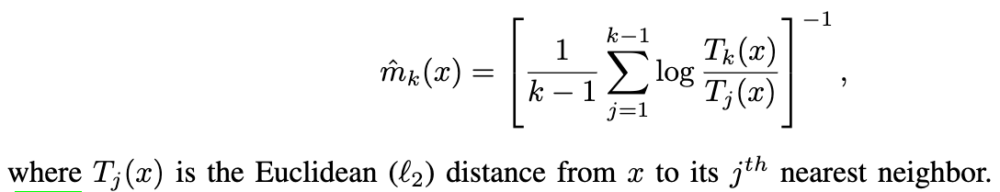

In [ ]:
from sklearn.neighbors import NearestNeighbors
import random
import numpy as np

def Tj_x(distances, j):
    return distances[j]

k = 30
nbrs = NearestNeighbors(n_neighbors=k+1, metric='euclidean').fit(df.values)
distances, _ = nbrs.kneighbors(df.values)

somme = 0
random_indices = random.sample(range(df.shape[0]), 500)
for i in random_indices:
    mk_x = 0
    for j in range(1, k):
        a = np.log(Tj_x(distances[i], k) / Tj_x(distances[i], j))
        mk_x += a
    mk_x = (1 / (k-1) * mk_x) ** (-1)
    print(i, ":", mk_x)
    somme += (mk_x ** (-1))

effective_dimensions = round(((1 / 500) * somme) ** (-1))
print("Nombre de dimensions effectives avec le plus proche voisin est :", effective_dimensions)

10511 : 9.439436711646588
20376 : 6.06075259146566
16010 : 20.890179795870036
16368 : 50.157847261328925
22395 : 13.765987455831596
18138 : 9.82244838470577
17500 : 6.929007721494933
4481 : 10.941183908528682
46012 : 13.3804399826561
18262 : 14.071280440603191
25842 : 12.036604307810197
13575 : 3.009433964020168
7869 : 8.932020705260705
43400 : 5.224076032565832
34573 : 3.5496184126479866
22441 : 13.742127757843841
28127 : 11.38751229093114
13622 : 20.84381844766369
20933 : 6.151582510683259
46039 : 13.381800568447527
21960 : 8.057815078827904
9177 : 8.629870501476704
23149 : 8.497649992919289
1910 : 7.990120297301733
41754 : 6.892977251144105
3525 : 2.0725364717708774
5949 : 22.668541543733134
2032 : 3.658636276174886
8886 : 1.0709463034490312
34590 : 1.569568544424536
9222 : 1.3538050936815051
24543 : 1.396108471635874
29451 : 10.20812597549096
36426 : 23.97322525251511
19021 : 11.678678334131265
20417 : 4.071022483621341
39233 : 12.428637937350542
44032 : 6.1778578649672085
26552 : 

## Méthode avec le plus proche voisin (3) :

In [ ]:
from sklearn.neighbors import NearestNeighbors
import random
import numpy as np

# Diviser les données en deux parties
def split_dataframe(dataframe):
    dataframe_1 = pd.DataFrame()
    dataframe_2 = pd.DataFrame()
    for column in dataframe.columns:
        unique_values = dataframe[column].nunique()  # Nombre de valeurs uniques dans la colonne
        if unique_values <= 2:  # Vérifier si le nombre de valeurs uniques est inférieur ou égal
            dataframe_1[column] = dataframe[column]
        else:
            dataframe_2[column] = dataframe[column]
    return dataframe_1, dataframe_2

binary_df = split_dataframe(df)[0]  # Sélectionner les colonnes binaires
non_binary_df = split_dataframe(df)[1]  # Sélectionner les colonnes non binaires

print(binary_df)
print(non_binary_df)

if binary_df.empty:
    effective_dimensions_1 = 0
elif binary_df.shape[1] == 1:
    effective_dimensions_1 = 1
else:
    # Calculer la matrice de covariance
    cov_matrix = np.cov(binary_df, rowvar=False)

    # Définir les options d'affichage pour la matrice de covariance
    np.set_printoptions(precision=4, suppress=True)

    # Afficher la matrice de covariance
    print(cov_matrix)

    # Décomposition en valeurs propres
    eigenvalues, eigenvectors = np.linalg.eig(cov_matrix)

    # Afficher les valeurs propres
    print("Valeurs propres :")
    print(eigenvalues)

    # Afficher les vecteurs propres
    print("\nVecteurs propres :")
    print(eigenvectors)

    # Calculer la somme des valeurs propres
    total_variance = np.sum(eigenvalues)

    # Calculer les proportions de variance
    variance_ratios = eigenvalues / total_variance

    # Calculer le nombre de dimensions effectives
    effective_dimensions_1 = np.sum(variance_ratios > 0.01)  # Choisissez ici votre seuil approprié

def Tj_x(distances, j):
    return distances[j]

if non_binary_df.empty:
    effective_dimensions_1 = 0
else:
    k = 30
    nbrs = NearestNeighbors(n_neighbors=k+1, metric='euclidean').fit(non_binary_df.values)
    distances, _ = nbrs.kneighbors(non_binary_df.values)

    somme = 0
    random_indices = random.sample(range(non_binary_df.shape[0]), 500)
    for i in random_indices:
        mk_x = 0
        for j in range(1, k):
            a = np.log(Tj_x(distances[i], k) / Tj_x(distances[i], j))
            mk_x += a
        mk_x = (1 / (k-1) * mk_x) ** (-1)
        print(i, ":", mk_x)
        somme += (mk_x ** (-1))

    effective_dimensions_2 = round(((1 / 500) * somme) ** (-1))

effective_dimensions = round(effective_dimensions_1 * (binary_df.shape[1] / df.shape[1]) + effective_dimensions_2 * (non_binary_df.shape[1] / df.shape[1]))
print("Nombre de dimensions effectives avec le plus proche voisin est :", effective_dimensions)

       5_o_Clock_Shadow  Arched_Eyebrows  Attractive  Bags_Under_Eyes  Bald  \
0                   1.0              0.0         1.0              0.0   0.0   
1                   0.0              0.0         0.0              0.0   0.0   
2                   0.0              0.0         0.0              0.0   0.0   
3                   0.0              0.0         1.0              0.0   0.0   
4                   0.0              0.0         1.0              1.0   0.0   
...                 ...              ...         ...              ...   ...   
46366               0.0              0.0         0.0              1.0   0.0   
46367               0.0              0.0         0.0              0.0   0.0   
46368               0.0              0.0         1.0              0.0   0.0   
46369               1.0              0.0         0.0              1.0   0.0   
46370               0.0              0.0         0.0              0.0   0.0   

       Bangs  Big_Lips  Big_Nose  Black_Hair  Blond

# **S&P 500**

## Méthode avec le ratio de variance :

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler

df = pd.read_csv('s&p_500.csv', sep=',')

print(df.head())

# Remplacer les valeurs NaN par 0
df.fillna(0, inplace=True)

# Liste des colonnes contenant du texte
text_columns = df.select_dtypes(include=['object']).columns

# Remplacement du texte par des valeurs numériques
for column in text_columns:
    le = LabelEncoder()
    df[column] = le.fit_transform(df[column].astype(str))

# Création d'un objet MinMaxScaler
scaler = MinMaxScaler()

# Normalisation des colonnes du DataFrame
df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

# Affichage du DataFrame modifié
print(df.head())

# Calculer la matrice de covariance
cov_matrix = np.cov(df, rowvar=False)

# Définir les options d'affichage pour la matrice de covariance
np.set_printoptions(precision=4, suppress=True)

# Afficher la matrice de covariance
print(cov_matrix)

# Décomposition en valeurs propres
eigenvalues, eigenvectors = np.linalg.eig(cov_matrix)

# Afficher les valeurs propres
print("Valeurs propres :")
print(eigenvalues)

# Afficher les vecteurs propres
print("\nVecteurs propres :")
print(eigenvectors)

# Calculer la somme des valeurs propres
total_variance = np.sum(eigenvalues)

# Calculer les proportions de variance
variance_ratios = eigenvalues / total_variance

# Calculer le nombre de dimensions effectives
effective_dimensions = np.sum(variance_ratios > 0.01)  # Choisissez ici votre seuil approprié

# Afficher le nombre de dimensions effectives
print("Nombre de dimensions effectives avec le ratio de variance est :", effective_dimensions)

         date   open   high    low  close    volume Name
0  2013-02-08  15.07  15.12  14.63  14.75   8407500  AAL
1  2013-02-11  14.89  15.01  14.26  14.46   8882000  AAL
2  2013-02-12  14.45  14.51  14.10  14.27   8126000  AAL
3  2013-02-13  14.30  14.94  14.25  14.66  10259500  AAL
4  2013-02-14  14.94  14.96  13.16  13.99  31879900  AAL
       date      open      high       low     close    volume      Name
0  0.000000  0.007373  0.007311  0.007189  0.006428  0.013599  0.001984
1  0.000795  0.007285  0.007258  0.007007  0.006286  0.014367  0.001984
2  0.001590  0.007069  0.007016  0.006928  0.006193  0.013144  0.001984
3  0.002385  0.006996  0.007224  0.007002  0.006384  0.016595  0.001984
4  0.003180  0.007309  0.007234  0.006466  0.006056  0.051566  0.001984
[[ 0.0834  0.0016  0.0016  0.0016  0.0016 -0.0001  0.0001]
 [ 0.0016  0.0023  0.0023  0.0023  0.0023 -0.0001 -0.0005]
 [ 0.0016  0.0023  0.0023  0.0023  0.0023 -0.0001 -0.0005]
 [ 0.0016  0.0023  0.0023  0.0022  0.0023 -0.0001

## Méthode avec n1 :

In [ ]:
# Calcul de la somme des valeurs propres
sum_eigenvalues = np.sum(eigenvalues)

result = 1
for eigenvalue in eigenvalues:
    if eigenvalue < 0 or sum_eigenvalues <= 0:
        print(f"Invalid value: eigenvalue={eigenvalue}, sum_eigenvalues={sum_eigenvalues}")
        continue  # Skip this iteration if the values are invalid
    result *= (eigenvalue / sum_eigenvalues) ** (-eigenvalue / sum_eigenvalues)

if not np.isnan(result) and not np.isinf(result):
    print("Nombre de dimensions effectives avec n1 est :", round(result))
else:
    print("Invalid result encountered.")

Nombre de dimensions effectives avec n1 est : 2


## Méthode avec n2 :

In [ ]:
# Calcul de la somme des valeurs propres carrées
sum_eigenvalues_square = np.sum(eigenvalues**2)

n2 = (sum_eigenvalues**2) / sum_eigenvalues_square

print("Nombre de dimensions effectives avec n2 est :", round(n2))

Nombre de dimensions effectives avec n2 est : 2


## Méthode avec n inf :

In [ ]:
n_inf = sum_eigenvalues / max(eigenvalues)

print("Nombre de dimensions effectives avec n inf est :", round(n_inf))

Nombre de dimensions effectives avec n inf est : 2


## Méthode avec Chaîne de Markov par Monte Carlo :

In [ ]:
from sklearn.decomposition import PCA
pca = PCA(n_components = min(df.shape[1], 50))  # Choisissez le nombre de composantes principales souhaitées
X_pca = pca.fit_transform(df)

# Fonction pour calculer le nombre de dimensions effectives à partir d'une chaîne de Markov
def compute_effective_dimensions(chain):
    num_samples, num_features = chain.shape
    chain_mean = np.mean(chain, axis=0)
    cov_matrix = np.cov(chain.T)
    _, eigvals, _ = np.linalg.svd(cov_matrix)
    cumulative_variance = np.cumsum(eigvals) / np.sum(eigvals)
    effective_dimensions = np.sum(cumulative_variance < 0.99) + 1  # Choisissez votre critère de seuil ici
    return effective_dimensions

# Définir les paramètres de la chaîne de Markov
num_samples = 1000  # Nombre d'échantillons à générer
num_features = X_pca.shape[1]  # Nombre de caractéristiques

# Initialiser la chaîne de Markov
chain = np.zeros((num_samples, num_features))

# Générer la chaîne de Markov
for i in range(1, num_samples):
    # Échantillonner une nouvelle proposition de la distribution normale
    proposal = np.random.multivariate_normal(chain[i-1], np.eye(num_features))

    # Calculer les densités de probabilité des propositions actuelle et proposée
    current_density = np.exp(-np.sum((chain[i-1] - X_pca)**2) / 2)
    proposal_density = np.exp(-np.sum((proposal - X_pca)**2) / 2)

    # Accepter ou rejeter la proposition en utilisant le critère de Metropolis-Hastings
    acceptance_ratio = min(1, proposal_density / current_density)
    if np.random.rand() < acceptance_ratio:
        chain[i] = proposal
    else:
        chain[i] = chain[i-1]

# Calculer le nombre de dimensions effectives
effective_dimensions = compute_effective_dimensions(chain)
print("Nombre de dimensions effectives avec MCMC :", effective_dimensions)

<ipython-input-44-0ae0b3364c69>:32: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


Nombre de dimensions effectives avec MCMC : 7


## Méthode avec le plus proche voisin (1) :

In [ ]:
"""
from sklearn.preprocessing import MinMaxScaler
from sklearn.neighbors import NearestNeighbors
from math import *
import matplotlib.pyplot as plt
from scipy.optimize import minimize

# Remplacer les valeurs NaN par 0
df.fillna(0, inplace=True)

# Création d'un objet MinMaxScaler
scaler = MinMaxScaler()

# Normalisation des colonnes du DataFrame
df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

X = df.values

# Calcul des distances avec les k plus proches voisins
k_values = range(2, 31)  # Valeurs de k allant de 1 à 30
distances = []

for k in k_values:
    nbrs = NearestNeighbors(n_neighbors=k, metric='euclidean').fit(X)
    distances_k, _ = nbrs.kneighbors(X)
    min_distance_k = np.min(distances_k[:, -1])
    distances.append(min_distance_k)

# Affichage des résultats
for k, distance in zip(k_values, distances):
    print("K =", k, "Distance moyenne des plus proches voisins :", distance)

mean_distance = np.mean(distances)
print("Distance moyenne des plus proches voisins :", mean_distance, "\n")

C = mean_distance
N = df.shape[0]
D = df.shape[1]

def euclidean_distance(point_p, point_q):
    # Calcul de la somme des carrés des différences
    sum_of_squares = sum(((q - p) ** 2) for p, q in zip(point_p, point_q))
    # Calcul de la distance euclidienne
    distance = sqrt(sum_of_squares)
    return distance

def hl(n, L):
    return (1/C) * ((log(n)/n)**(1/L))

def Un(n, L):
    random_rows = df.sample(n)
    h = hl(n, L)
    somme = 0
    d = 0
    for k in range(0, n-1, 2):
        a = (1/(h**L)) * abs(1 - ((euclidean_distance(random_rows.iloc[k], [0 for i in range(D)]))**2)/(h*h))
        b = (1/(h**L)) * abs(1 - ((euclidean_distance(random_rows.iloc[k+1], random_rows.iloc[k]))**2)/(h*h))
        c = (1/(h**L)) * abs(1 - ((euclidean_distance(random_rows.iloc[k+1], [0 for i in range(D)]))**2)/(h*h))
        somme = somme + (a+b+c)/3
        d = d + 1
    return somme/d

def absolute_slope_least_squares(x, y, weights):
    # Définition de la fonction d'erreur à minimiser
    def error_function(params):
        m = params[0]  # Pente
        c = params[1]  # Ordonnée à l'origine
        absolute_errors = np.abs(y - (m * x + c))
        weighted_errors = weights * absolute_errors
        return np.sum(weighted_errors)
    # Initialisation des paramètres
    initial_params = np.array([0.0, 0.0])
    # Minimisation de la fonction d'erreur
    result = minimize(error_function, initial_params)
    # Récupération des paramètres optimaux
    m_opt = result.x[0]  # Pente optimale
    c_opt = result.x[1]  # Ordonnée à l'origine optimale
    return m_opt, c_opt

P = []
for l in range(1, 20):
    X = []
    Y = []
    for k in range(1, 6):
        X.append(np.log(hl(N//k, l)))
        Y.append(np.log(Un(N//k, l)))
    plt.plot(X, Y)
    weights = np.array([1, 1/2, 1/3, 1/4, 1/5]) # Pondérations
    pente = abs(absolute_slope_least_squares(np.array(X), np.array(Y), weights)[0])
    P.append(pente)
    print("La pente en valeur absolue avec la dimension", l, "est :", pente)

minimum = min(P)
d = P.index(minimum) + 1
plt.show()
print("Nombre de dimensions effectives avec le plus proche voisin est :", d)
"""

'\nfrom sklearn.preprocessing import MinMaxScaler\nfrom sklearn.neighbors import NearestNeighbors\nfrom math import *\nimport matplotlib.pyplot as plt\nfrom scipy.optimize import minimize\n\n# Remplacer les valeurs NaN par 0\ndf.fillna(0, inplace=True)\n\n# Création d\'un objet MinMaxScaler\nscaler = MinMaxScaler()\n\n# Normalisation des colonnes du DataFrame\ndf = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)\n\nX = df.values\n\n# Calcul des distances avec les k plus proches voisins\nk_values = range(2, 31)  # Valeurs de k allant de 1 à 30\ndistances = []\n\nfor k in k_values:\n    nbrs = NearestNeighbors(n_neighbors=k, metric=\'euclidean\').fit(X)\n    distances_k, _ = nbrs.kneighbors(X)\n    min_distance_k = np.min(distances_k[:, -1])\n    distances.append(min_distance_k)\n\n# Affichage des résultats\nfor k, distance in zip(k_values, distances):\n    print("K =", k, "Distance moyenne des plus proches voisins :", distance)\n\nmean_distance = np.mean(distances)\nprint("Di

## Méthode avec le plus proche voisin (2) : Avec k = 30 | The Intrinsic Dimension of Images and Its Impact on Learning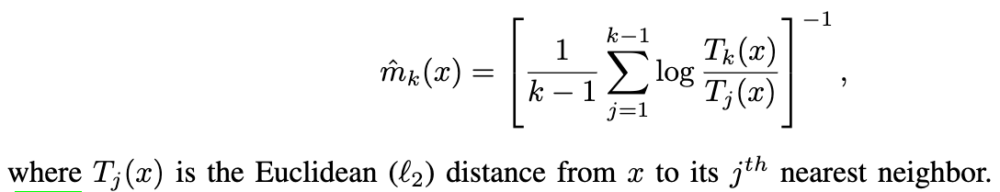

In [ ]:
from sklearn.neighbors import NearestNeighbors
import random
import numpy as np

def Tj_x(distances, j):
    return distances[j]

k = 30
nbrs = NearestNeighbors(n_neighbors=k+1, metric='euclidean').fit(df.values)
distances, _ = nbrs.kneighbors(df.values)

somme = 0
random_indices = random.sample(range(df.shape[0]), 500)
for i in random_indices:
    mk_x = 0
    for j in range(1, k):
        a = np.log(Tj_x(distances[i], k) / Tj_x(distances[i], j))
        mk_x += a
    mk_x = (1 / (k-1) * mk_x) ** (-1)
    print(i, ":", mk_x)
    somme += (mk_x ** (-1))

effective_dimensions = round(((1 / 500) * somme) ** (-1))
print("Nombre de dimensions effectives avec le plus proche voisin est :", effective_dimensions)

287189 : 2.3591917589763813
439937 : 1.6128136164072262
143258 : 2.5996304532798957
248448 : 1.9365122640444161
212636 : 2.034821225923262
53244 : 1.179865390773107
379053 : 1.5026402603715916
583935 : 2.7248831536301426
413035 : 2.280478505048301
264980 : 5.681721047406391
211912 : 1.3764576563995685
217445 : 2.1086887152138534
409016 : 2.2361302123333457
382304 : 1.303102034431874
354208 : 1.3140196153490218
591631 : 2.467605362582245
454895 : 1.5923939451660603
596288 : 11.398826245427122
362084 : 1.841805788459179
8079 : 2.4021491465619813
253976 : 1.4571505538029035
549896 : 2.106742926241396
92440 : 1.1010865727957957
599055 : 1.6399854580987467
487913 : 2.3085037453585118
196572 : 1.5680217536919303
530900 : 1.2255910224261528
94265 : 1.31765555916251
616720 : 2.083406785570867
345289 : 1.3117818529946976
472877 : 1.7518212945654215
274055 : 1.790119298669333
95642 : 1.806665983389944
473506 : 1.4837797752687336
534603 : 1.9957341433007507
387670 : 2.176914924192149
238615 : 2.4

## Méthode avec le plus proche voisin (3) :

In [ ]:
from sklearn.neighbors import NearestNeighbors
import random
import numpy as np

# Diviser les données en deux parties
def split_dataframe(dataframe):
    dataframe_1 = pd.DataFrame()
    dataframe_2 = pd.DataFrame()
    for column in dataframe.columns:
        unique_values = dataframe[column].nunique()  # Nombre de valeurs uniques dans la colonne
        if unique_values <= 2:  # Vérifier si le nombre de valeurs uniques est inférieur ou égal
            dataframe_1[column] = dataframe[column]
        else:
            dataframe_2[column] = dataframe[column]
    return dataframe_1, dataframe_2

binary_df = split_dataframe(df)[0]  # Sélectionner les colonnes binaires
non_binary_df = split_dataframe(df)[1]  # Sélectionner les colonnes non binaires

print(binary_df)
print(non_binary_df)

if binary_df.empty:
    effective_dimensions_1 = 0
elif binary_df.shape[1] == 1:
    effective_dimensions_1 = 1
else:
    # Calculer la matrice de covariance
    cov_matrix = np.cov(binary_df, rowvar=False)

    # Définir les options d'affichage pour la matrice de covariance
    np.set_printoptions(precision=4, suppress=True)

    # Afficher la matrice de covariance
    print(cov_matrix)

    # Décomposition en valeurs propres
    eigenvalues, eigenvectors = np.linalg.eig(cov_matrix)

    # Afficher les valeurs propres
    print("Valeurs propres :")
    print(eigenvalues)

    # Afficher les vecteurs propres
    print("\nVecteurs propres :")
    print(eigenvectors)

    # Calculer la somme des valeurs propres
    total_variance = np.sum(eigenvalues)

    # Calculer les proportions de variance
    variance_ratios = eigenvalues / total_variance

    # Calculer le nombre de dimensions effectives
    effective_dimensions_1 = np.sum(variance_ratios > 0.01)  # Choisissez ici votre seuil approprié

def Tj_x(distances, j):
    return distances[j]

if non_binary_df.empty:
    effective_dimensions_1 = 0
else:
    k = 30
    nbrs = NearestNeighbors(n_neighbors=k+1, metric='euclidean').fit(non_binary_df.values)
    distances, _ = nbrs.kneighbors(non_binary_df.values)

    somme = 0
    random_indices = random.sample(range(non_binary_df.shape[0]), 500)
    for i in random_indices:
        mk_x = 0
        for j in range(1, k):
            a = np.log(Tj_x(distances[i], k) / Tj_x(distances[i], j))
            mk_x += a
        mk_x = (1 / (k-1) * mk_x) ** (-1)
        print(i, ":", mk_x)
        somme += (mk_x ** (-1))

    effective_dimensions_2 = round(((1 / 500) * somme) ** (-1))

effective_dimensions = round(effective_dimensions_1 * (binary_df.shape[1] / df.shape[1]) + effective_dimensions_2 * (non_binary_df.shape[1] / df.shape[1]))
print("Nombre de dimensions effectives avec le plus proche voisin est :", effective_dimensions)

Empty DataFrame
Columns: []
Index: []
            date      open      high       low     close    volume      Name
0       0.000000  0.007373  0.007311  0.007189  0.006428  0.013599  0.001984
1       0.000795  0.007285  0.007258  0.007007  0.006286  0.014367  0.001984
2       0.001590  0.007069  0.007016  0.006928  0.006193  0.013144  0.001984
3       0.002385  0.006996  0.007224  0.007002  0.006384  0.016595  0.001984
4       0.003180  0.007309  0.007234  0.006466  0.006056  0.051566  0.001984
...          ...       ...       ...       ...       ...       ...       ...
619035  0.996820  0.037593  0.037848  0.037683  0.037232  0.004824  1.000000
619036  0.997615  0.037931  0.037776  0.037703  0.036724  0.004198  1.000000
619037  0.998410  0.037495  0.037196  0.035959  0.035284  0.004791  1.000000
619038  0.999205  0.035587  0.036054  0.035443  0.035010  0.007965  1.000000
619039  1.000000  0.035568  0.036267  0.035718  0.035298  0.007335  1.000000

[619040 rows x 7 columns]
76117 : 2.2

# **Customer Churn**

## Méthode avec le ratio de variance :

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler

df = pd.read_csv('customer_churn.csv', sep=',')

print(df.head())

# Remplacer les valeurs NaN par 0
df.fillna(0, inplace=True)

# Liste des colonnes contenant du texte
text_columns = df.select_dtypes(include=['object']).columns

# Remplacement du texte par des valeurs numériques
for column in text_columns:
    le = LabelEncoder()
    df[column] = le.fit_transform(df[column].astype(str))

# Création d'un objet MinMaxScaler
scaler = MinMaxScaler()

# Normalisation des colonnes du DataFrame
df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

# Affichage du DataFrame modifié
print(df.head())

# Calculer la matrice de covariance
cov_matrix = np.cov(df, rowvar=False)

# Définir les options d'affichage pour la matrice de covariance
np.set_printoptions(precision=4, suppress=True)

# Afficher la matrice de covariance
print(cov_matrix)

# Décomposition en valeurs propres
eigenvalues, eigenvectors = np.linalg.eig(cov_matrix)

# Afficher les valeurs propres
print("Valeurs propres :")
print(eigenvalues)

# Afficher les vecteurs propres
print("\nVecteurs propres :")
print(eigenvectors)

# Calculer la somme des valeurs propres
total_variance = np.sum(eigenvalues)

# Calculer les proportions de variance
variance_ratios = eigenvalues / total_variance

# Calculer le nombre de dimensions effectives
effective_dimensions = np.sum(variance_ratios > 0.01)  # Choisissez ici votre seuil approprié

# Afficher le nombre de dimensions effectives
print("Nombre de dimensions effectives avec le ratio de variance est :", effective_dimensions)

              Names   Age  Total_Purchase  Account_Manager  Years  Num_Sites  \
0  Cameron Williams  42.0        11066.80                0   7.22        8.0   
1     Kevin Mueller  41.0        11916.22                0   6.50       11.0   
2       Eric Lozano  38.0        12884.75                0   6.67       12.0   
3     Phillip White  42.0         8010.76                0   6.71       10.0   
4    Cynthia Norton  37.0         9191.58                0   5.56        9.0   

          Onboard_date                                           Location  \
0  2013-08-30 07:00:40      10265 Elizabeth Mission Barkerburgh, AK 89518   
1  2013-08-13 00:38:46  6157 Frank Gardens Suite 019 Carloshaven, RI 1...   
2  2016-06-29 06:20:07             1331 Keith Court Alyssahaven, DE 90114   
3  2014-04-22 12:43:12       13120 Daniel Mount Angelabury, WY 30645-4695   
4  2016-01-19 15:31:15                765 Tricia Row Karenshire, MH 71730   

                       Company  Churn  
0               

## Méthode avec n1 :

In [ ]:
# Calcul de la somme des valeurs propres
sum_eigenvalues = np.sum(eigenvalues)

result = 1
for eigenvalue in eigenvalues:
    if eigenvalue < 0 or sum_eigenvalues <= 0:
        print(f"Invalid value: eigenvalue={eigenvalue}, sum_eigenvalues={sum_eigenvalues}")
        continue  # Skip this iteration if the values are invalid
    result *= (eigenvalue / sum_eigenvalues) ** (-eigenvalue / sum_eigenvalues)

if not np.isnan(result) and not np.isinf(result):
    print("Nombre de dimensions effectives avec n1 est :", round(result))
else:
    print("Invalid result encountered.")

Nombre de dimensions effectives avec n1 est : 7


## Méthode avec n2 :

In [ ]:
# Calcul de la somme des valeurs propres carrées
sum_eigenvalues_square = np.sum(eigenvalues**2)

n2 = (sum_eigenvalues**2) / sum_eigenvalues_square

print("Nombre de dimensions effectives avec n2 est :", round(n2))

Nombre de dimensions effectives avec n2 est : 6


## Méthode avec n inf :

In [ ]:
n_inf = sum_eigenvalues / max(eigenvalues)

print("Nombre de dimensions effectives avec n inf est :", round(n_inf))

Nombre de dimensions effectives avec n inf est : 3


## Méthode avec Chaîne de Markov par Monte Carlo :

In [ ]:
from sklearn.decomposition import PCA
pca = PCA(n_components = min(df.shape[1], 50))  # Choisissez le nombre de composantes principales souhaitées
X_pca = pca.fit_transform(df)

# Fonction pour calculer le nombre de dimensions effectives à partir d'une chaîne de Markov
def compute_effective_dimensions(chain):
    num_samples, num_features = chain.shape
    chain_mean = np.mean(chain, axis=0)
    cov_matrix = np.cov(chain.T)
    _, eigvals, _ = np.linalg.svd(cov_matrix)
    cumulative_variance = np.cumsum(eigvals) / np.sum(eigvals)
    effective_dimensions = np.sum(cumulative_variance < 0.99) + 1  # Choisissez votre critère de seuil ici
    return effective_dimensions

# Définir les paramètres de la chaîne de Markov
num_samples = 1000  # Nombre d'échantillons à générer
num_features = X_pca.shape[1]  # Nombre de caractéristiques

# Initialiser la chaîne de Markov
chain = np.zeros((num_samples, num_features))

# Générer la chaîne de Markov
for i in range(1, num_samples):
    # Échantillonner une nouvelle proposition de la distribution normale
    proposal = np.random.multivariate_normal(chain[i-1], np.eye(num_features))

    # Calculer les densités de probabilité des propositions actuelle et proposée
    current_density = np.exp(-np.sum((chain[i-1] - X_pca)**2) / 2)
    proposal_density = np.exp(-np.sum((proposal - X_pca)**2) / 2)

    # Accepter ou rejeter la proposition en utilisant le critère de Metropolis-Hastings
    acceptance_ratio = min(1, proposal_density / current_density)
    if np.random.rand() < acceptance_ratio:
        chain[i] = proposal
    else:
        chain[i] = chain[i-1]

# Calculer le nombre de dimensions effectives
effective_dimensions = compute_effective_dimensions(chain)
print("Nombre de dimensions effectives avec MCMC :", effective_dimensions)

Nombre de dimensions effectives avec MCMC : 1


<ipython-input-53-0ae0b3364c69>:11: RuntimeWarning: invalid value encountered in divide
  cumulative_variance = np.cumsum(eigvals) / np.sum(eigvals)


## Méthode avec le plus proche voisin (1) :

K = 2 Distance moyenne des plus proches voisins : 0.12777282035548249
K = 3 Distance moyenne des plus proches voisins : 0.18547508121828743
K = 4 Distance moyenne des plus proches voisins : 0.22541875990754437
K = 5 Distance moyenne des plus proches voisins : 0.25005916498347236
K = 6 Distance moyenne des plus proches voisins : 0.27493209061119683
K = 7 Distance moyenne des plus proches voisins : 0.2788115740994867
K = 8 Distance moyenne des plus proches voisins : 0.30099262086800677
K = 9 Distance moyenne des plus proches voisins : 0.30424329843687514
K = 10 Distance moyenne des plus proches voisins : 0.317630497847069
K = 11 Distance moyenne des plus proches voisins : 0.325384046020589
K = 12 Distance moyenne des plus proches voisins : 0.3369883241914486
K = 13 Distance moyenne des plus proches voisins : 0.34901777727634625
K = 14 Distance moyenne des plus proches voisins : 0.3621700801736362
K = 15 Distance moyenne des plus proches voisins : 0.3658206989752909
K = 16 Distance moyenn

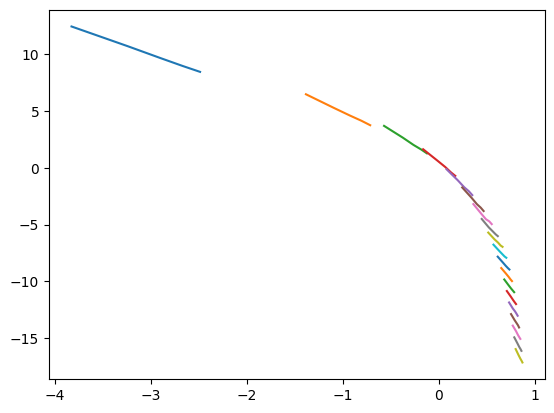

Nombre de dimensions effectives avec le plus proche voisin est : 6


In [ ]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.neighbors import NearestNeighbors
from math import *
import matplotlib.pyplot as plt
from scipy.optimize import minimize

# Remplacer les valeurs NaN par 0
df.fillna(0, inplace=True)

# Création d'un objet MinMaxScaler
scaler = MinMaxScaler()

# Normalisation des colonnes du DataFrame
df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

X = df.values

# Calcul des distances avec les k plus proches voisins
k_values = range(2, 31)  # Valeurs de k allant de 1 à 30
distances = []

for k in k_values:
    nbrs = NearestNeighbors(n_neighbors=k, metric='euclidean').fit(X)
    distances_k, _ = nbrs.kneighbors(X)
    min_distance_k = np.min(distances_k[:, -1])
    distances.append(min_distance_k)

# Affichage des résultats
for k, distance in zip(k_values, distances):
    print("K =", k, "Distance moyenne des plus proches voisins :", distance)

mean_distance = np.mean(distances)
print("Distance moyenne des plus proches voisins :", mean_distance, "\n")

C = mean_distance
N = df.shape[0]
D = df.shape[1]

def euclidean_distance(point_p, point_q):
    # Calcul de la somme des carrés des différences
    sum_of_squares = sum(((q - p) ** 2) for p, q in zip(point_p, point_q))
    # Calcul de la distance euclidienne
    distance = sqrt(sum_of_squares)
    return distance

def hl(n, L):
    return (1/C) * ((log(n)/n)**(1/L))

def Un(n, L):
    random_rows = df.sample(n)
    h = hl(n, L)
    somme = 0
    d = 0
    for k in range(0, n-1, 2):
        a = (1/(h**L)) * abs(1 - ((euclidean_distance(random_rows.iloc[k], [0 for i in range(D)]))**2)/(h*h))
        b = (1/(h**L)) * abs(1 - ((euclidean_distance(random_rows.iloc[k+1], random_rows.iloc[k]))**2)/(h*h))
        c = (1/(h**L)) * abs(1 - ((euclidean_distance(random_rows.iloc[k+1], [0 for i in range(D)]))**2)/(h*h))
        somme = somme + (a+b+c)/3
        d = d + 1
    return somme/d

def absolute_slope_least_squares(x, y, weights):
    # Définition de la fonction d'erreur à minimiser
    def error_function(params):
        m = params[0]  # Pente
        c = params[1]  # Ordonnée à l'origine
        absolute_errors = np.abs(y - (m * x + c))
        weighted_errors = weights * absolute_errors
        return np.sum(weighted_errors)
    # Initialisation des paramètres
    initial_params = np.array([0.0, 0.0])
    # Minimisation de la fonction d'erreur
    result = minimize(error_function, initial_params)
    # Récupération des paramètres optimaux
    m_opt = result.x[0]  # Pente optimale
    c_opt = result.x[1]  # Ordonnée à l'origine optimale
    return m_opt, c_opt

P = []
for l in range(1, 20):
    X = []
    Y = []
    for k in range(1, 6):
        X.append(np.log(hl(N//k, l)))
        Y.append(np.log(Un(N//k, l)))
    plt.plot(X, Y)
    weights = np.array([1, 1/2, 1/3, 1/4, 1/5]) # Pondérations
    pente = abs(absolute_slope_least_squares(np.array(X), np.array(Y), weights)[0])
    P.append(pente)
    print("La pente en valeur absolue avec la dimension", l, "est :", pente)

minimum = min(P)
d = P.index(minimum) + 1
plt.show()
print("Nombre de dimensions effectives avec le plus proche voisin est :", d)

## Méthode avec le plus proche voisin (2) : Avec k = 30 | The Intrinsic Dimension of Images and Its Impact on Learning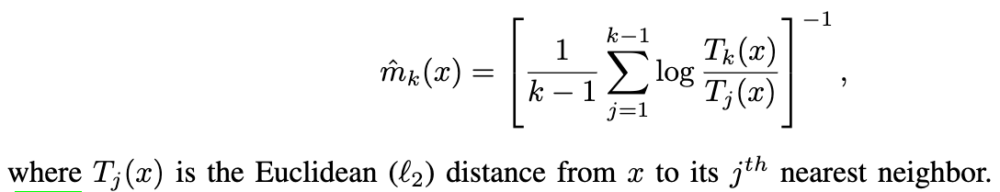

In [ ]:
from sklearn.neighbors import NearestNeighbors
import random
import numpy as np

def Tj_x(distances, j):
    return distances[j]

k = 30
nbrs = NearestNeighbors(n_neighbors=k+1, metric='euclidean').fit(df.values)
distances, _ = nbrs.kneighbors(df.values)

somme = 0
random_indices = random.sample(range(df.shape[0]), 500)
for i in random_indices:
    mk_x = 0
    for j in range(1, k):
        a = np.log(Tj_x(distances[i], k) / Tj_x(distances[i], j))
        mk_x += a
    mk_x = (1 / (k-1) * mk_x) ** (-1)
    print(i, ":", mk_x)
    somme += (mk_x ** (-1))

effective_dimensions = round(((1 / 500) * somme) ** (-1))
print("Nombre de dimensions effectives avec le plus proche voisin est :", effective_dimensions)

49 : 4.020949421069145
350 : 4.586722898608084
567 : 4.860496481547232
783 : 3.5708941560187295
201 : 5.34880184816883
193 : 5.995835395951291
178 : 4.952813398740257
244 : 6.174631397091708
654 : 12.809525867104197
732 : 5.214283865379761
304 : 7.1311568419345885
12 : 4.996570766862856
752 : 4.949552626408478
842 : 4.946557966748401
403 : 6.702558363411589
57 : 4.706849116149647
631 : 5.160175151369514
755 : 3.528187324125825
41 : 6.089326638301057
378 : 5.323978770389338
146 : 3.152005045585489
562 : 5.625432590598171
308 : 6.638335244990369
243 : 5.8009722592095985
344 : 7.755660908831014
628 : 6.324987099720619
814 : 7.19408928856043
575 : 4.205929642559224
17 : 4.312002809481823
803 : 5.230449475898364
835 : 11.53992406415317
295 : 4.732345918987493
247 : 7.7421641975609345
349 : 7.011701454250676
240 : 8.805962555289328
530 : 4.711014283253269
281 : 7.450234614204294
548 : 7.407372672612552
285 : 5.08140009782075
337 : 4.038764557902745
59 : 3.8511709428883414
142 : 5.10719673470

## Méthode avec le plus proche voisin (3) :

In [ ]:
from sklearn.neighbors import NearestNeighbors
import random
import numpy as np

# Diviser les données en deux parties
def split_dataframe(dataframe):
    dataframe_1 = pd.DataFrame()
    dataframe_2 = pd.DataFrame()
    for column in dataframe.columns:
        unique_values = dataframe[column].nunique()  # Nombre de valeurs uniques dans la colonne
        if unique_values <= 2:  # Vérifier si le nombre de valeurs uniques est inférieur ou égal
            dataframe_1[column] = dataframe[column]
        else:
            dataframe_2[column] = dataframe[column]
    return dataframe_1, dataframe_2

binary_df = split_dataframe(df)[0]  # Sélectionner les colonnes binaires
non_binary_df = split_dataframe(df)[1]  # Sélectionner les colonnes non binaires

print(binary_df)
print(non_binary_df)

if binary_df.empty:
    effective_dimensions_1 = 0
elif binary_df.shape[1] == 1:
    effective_dimensions_1 = 1
else:
    # Calculer la matrice de covariance
    cov_matrix = np.cov(binary_df, rowvar=False)

    # Définir les options d'affichage pour la matrice de covariance
    np.set_printoptions(precision=4, suppress=True)

    # Afficher la matrice de covariance
    print(cov_matrix)

    # Décomposition en valeurs propres
    eigenvalues, eigenvectors = np.linalg.eig(cov_matrix)

    # Afficher les valeurs propres
    print("Valeurs propres :")
    print(eigenvalues)

    # Afficher les vecteurs propres
    print("\nVecteurs propres :")
    print(eigenvectors)

    # Calculer la somme des valeurs propres
    total_variance = np.sum(eigenvalues)

    # Calculer les proportions de variance
    variance_ratios = eigenvalues / total_variance

    # Calculer le nombre de dimensions effectives
    effective_dimensions_1 = np.sum(variance_ratios > 0.01)  # Choisissez ici votre seuil approprié

def Tj_x(distances, j):
    return distances[j]

if non_binary_df.empty:
    effective_dimensions_1 = 0
else:
    k = 30
    nbrs = NearestNeighbors(n_neighbors=k+1, metric='euclidean').fit(non_binary_df.values)
    distances, _ = nbrs.kneighbors(non_binary_df.values)

    somme = 0
    random_indices = random.sample(range(non_binary_df.shape[0]), 500)
    for i in random_indices:
        mk_x = 0
        for j in range(1, k):
            a = np.log(Tj_x(distances[i], k) / Tj_x(distances[i], j))
            mk_x += a
        mk_x = (1 / (k-1) * mk_x) ** (-1)
        print(i, ":", mk_x)
        somme += (mk_x ** (-1))

    effective_dimensions_2 = round(((1 / 500) * somme) ** (-1))

effective_dimensions = round(effective_dimensions_1 * (binary_df.shape[1] / df.shape[1]) + effective_dimensions_2 * (non_binary_df.shape[1] / df.shape[1]))
print("Nombre de dimensions effectives avec le plus proche voisin est :", effective_dimensions)

     Account_Manager  Churn
0                0.0    1.0
1                0.0    1.0
2                0.0    1.0
3                0.0    1.0
4                0.0    1.0
..               ...    ...
895              1.0    0.0
896              0.0    0.0
897              0.0    0.0
898              1.0    0.0
899              1.0    0.0

[900 rows x 2 columns]
        Names       Age  Total_Purchase     Years  Num_Sites  Onboard_date  \
0    0.141425  0.465116        0.611781  0.763190   0.454545      0.705228   
1    0.577951  0.441860        0.659166  0.674847   0.727273      0.701891   
2    0.317372  0.372093        0.713196  0.695706   0.818182      0.968854   
3    0.777283  0.465116        0.441301  0.700613   0.636364      0.768632   
4    0.214922  0.348837        0.507173  0.559509   0.545455      0.932147   
..        ...       ...             ...       ...        ...           ...   
895  0.765033  0.465116        0.708513  0.321472   0.454545      0.201335   
896  0.738307  0

# **Évaluation sur une distribution normale multivariée (1)**

## Erreurs de corrélation :

5 0.0 0.0051306793203099565
5 0.1111111111111111 0.0011919871342049304
5 0.2222222222222222 0.009447364706465844
5 0.3333333333333333 -0.0044547322781309795
5 0.4444444444444444 -0.0005240197398005408
5 0.5555555555555556 0.0007554770886737394
5 0.6666666666666666 0.0028234629207571915
5 0.7777777777777777 -0.002388321229999768
5 0.8888888888888888 0.0006871685610460032
5 1.0 2.220446049250313e-15
10 0.0 0.003418661246794517
10 0.1111111111111111 0.0031894727311063825
10 0.2222222222222222 0.0005791044030978854
10 0.3333333333333333 -0.005482648809153501
10 0.4444444444444444 -0.0010263195784528945
10 0.5555555555555556 0.0052760835906479064
10 0.6666666666666666 -0.0025162813135886086
10 0.7777777777777777 0.004058083455445782
10 0.8888888888888888 -0.0031115100925598327
10 1.0 -3.3306690738754696e-16
15 0.0 0.0008924260060073781
15 0.1111111111111111 -0.0028793610275274356
15 0.2222222222222222 -0.00246466294762282
15 0.3333333333333333 -0.004747672495410471
15 0.4444444444444444 0.0

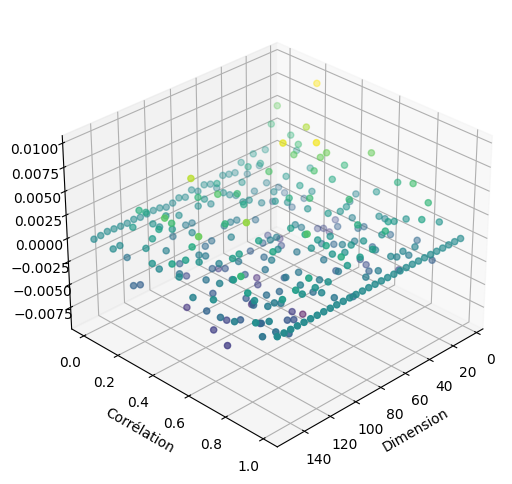

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler

import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from numpy.random import multivariate_normal
from scipy.stats import norm, expon, uniform

def create_covariance_matrix(dim, corr):
    if corr < -1 or corr > 1:
        raise ValueError("La corrélation doit être entre -1 et 1.")
    covariance_matrix = np.full((dim, dim), corr)  # La diagonale sera composée de 1 (variance pour une distribution normale standard)
    np.fill_diagonal(covariance_matrix, 1)
    return covariance_matrix

def generate_correlated_variables(n_samples, num_variables, correlation):
    mean = np.zeros(num_variables)  # Moyenne zéro pour une distribution normale standard
    covariance_matrix = create_covariance_matrix(num_variables, correlation)
    samples = np.random.multivariate_normal(mean, covariance_matrix, size=n_samples)  # Génère les échantillons à partir de la distribution normale multivariée
    df = pd.DataFrame(samples, columns=[f'Variable_{i+1}' for i in range(num_variables)])  # Convertit en DataFrame pandas
    return df

# Paramètres pour la plage de corrélation et le nombre de dimensions
correlation_values = np.linspace(0, 1, 10)  # 10 valeurs de corrélation de 0 à 1
dimension_values = np.arange(5, 151, 5)  # Dimensions de 5 à 150, par pas de 5

# Préparer les données pour le graphique 3D
X = []  # Liste pour les dimensions
Y = []  # Liste pour les valeurs de corrélation
Z = []  # Liste pour les erreurs de corrélation

for dim in dimension_values:
    for corr in correlation_values:
        X.append(dim)
        Y.append(corr)
        # Paramètres
        n_samples = 10000  # Nombre d'échantillons
        num_variables = dim  # Nombre de variables
        correlation = corr  # Corrélation souhaitée

        # Générer les variables corrélées
        df = generate_correlated_variables(n_samples, num_variables, correlation)

        # Remplacer les valeurs NaN par 0
        df.fillna(0, inplace=True)

        # Liste des colonnes contenant du texte
        text_columns = df.select_dtypes(include=['object']).columns

        # Remplacement du texte par des valeurs numériques
        for column in text_columns:
            le = LabelEncoder()
            df[column] = le.fit_transform(df[column].astype(str))

        # Création d'un objet MinMaxScaler
        scaler = MinMaxScaler()

        # Normalisation des colonnes du DataFrame
        df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

        # Calculer la matrice de corrélation et obtenir les valeurs triangulaires supérieures en excluant la diagonale
        corr_matrix = df.corr().values
        upper_triangle_indices = np.triu_indices_from(corr_matrix, k=1)
        upper_triangle_values = corr_matrix[upper_triangle_indices]
        mean_correlation = np.mean(upper_triangle_values)

        # Calculer l'erreur de corrélation
        erreur_correlation = mean_correlation - corr

        Z.append(erreur_correlation)
        print(dim, corr, Z[-1])

# Création du graphe 3D avec une vue isométrique
fig = plt.figure(figsize=(12, 6))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(X, Y, Z, c=Z, cmap='viridis')
ax.set_xlabel('Dimension')
ax.set_ylabel('Corrélation')

# Définir la vue isométrique
ax.view_init(elev=30, azim=45)  # Angles choisis pour une vue isométrique standard

# Affichage du graphe
plt.show()

## Méthode avec le ratio de variance :

5 0.0 5
5 0.1111111111111111 5
5 0.2222222222222222 5
5 0.3333333333333333 5
5 0.4444444444444444 5
5 0.5555555555555556 5
5 0.6666666666666666 5
5 0.7777777777777777 5
5 0.8888888888888888 5
5 1.0 1
10 0.0 10
10 0.1111111111111111 10
10 0.2222222222222222 10
10 0.3333333333333333 10
10 0.4444444444444444 10
10 0.5555555555555556 10
10 0.6666666666666666 10
10 0.7777777777777777 10
10 0.8888888888888888 9
10 1.0 1
15 0.0 15
15 0.1111111111111111 15
15 0.2222222222222222 15
15 0.3333333333333333 15
15 0.4444444444444444 15
15 0.5555555555555556 15
15 0.6666666666666666 15
15 0.7777777777777777 15
15 0.8888888888888888 1
15 1.0 1
20 0.0 20
20 0.1111111111111111 20
20 0.2222222222222222 20
20 0.3333333333333333 20
20 0.4444444444444444 20
20 0.5555555555555556 20
20 0.6666666666666666 20
20 0.7777777777777777 17
20 0.8888888888888888 1
20 1.0 1
25 0.0 25
25 0.1111111111111111 25
25 0.2222222222222222 25
25 0.3333333333333333 25
25 0.4444444444444444 25
25 0.5555555555555556 25
25 0.666666

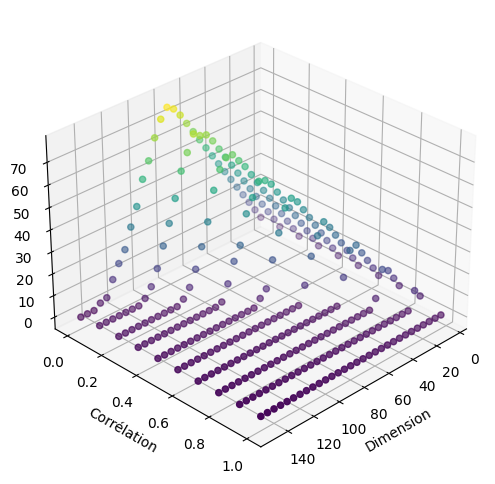

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler

import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from numpy.random import multivariate_normal

def create_covariance_matrix(dim, corr):
    if corr < -1 or corr > 1:
        raise ValueError("La corrélation doit être entre -1 et 1.")
    covariance_matrix = np.full((dim, dim), corr)  # La diagonale sera composée de 1 (variance pour une distribution normale standard)
    np.fill_diagonal(covariance_matrix, 1)
    return covariance_matrix

def generate_correlated_variables(n_samples, num_variables, correlation):
    mean = np.zeros(num_variables)  # Moyenne zéro pour une distribution normale standard
    covariance_matrix = create_covariance_matrix(num_variables, correlation)
    samples = np.random.multivariate_normal(mean, covariance_matrix, size=n_samples)  # Génère les échantillons à partir de la distribution normale multivariée
    df = pd.DataFrame(samples, columns=[f'Variable_{i+1}' for i in range(num_variables)])  # Convertit en DataFrame pandas
    return df

# Paramètres pour la plage de corrélation et le nombre de dimensions
correlation_values = np.linspace(0, 1, 10)  # 10 valeurs de corrélation de 0 à 1
dimension_values = np.arange(5, 151, 5)  # Dimensions de 5 à 150, par pas de 5

# Préparer les données pour le graphique 3D
X = []  # Liste pour les dimensions
Y = []  # Liste pour les valeurs de corrélation
Z = []  # Liste pour les dimensions effectives

for dim in dimension_values:
    for corr in correlation_values:
        X.append(dim)
        Y.append(corr)
        # Paramètres
        n_samples = 10000  # Nombre d'échantillons
        num_variables = dim  # Nombre de variables
        correlation = corr  # Corrélation souhaitée

        # Générer les variables corrélées
        df = generate_correlated_variables(n_samples, num_variables, correlation)

        # Remplacer les valeurs NaN par 0
        df.fillna(0, inplace=True)

        # Liste des colonnes contenant du texte
        text_columns = df.select_dtypes(include=['object']).columns

        # Remplacement du texte par des valeurs numériques
        for column in text_columns:
            le = LabelEncoder()
            df[column] = le.fit_transform(df[column].astype(str))

        # Création d'un objet MinMaxScaler
        scaler = MinMaxScaler()

        # Normalisation des colonnes du DataFrame
        df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

        # Calculer la matrice de covariance
        cov_matrix = np.cov(df, rowvar=False)

        # Définir les options d'affichage pour la matrice de covariance
        np.set_printoptions(precision=4, suppress=True)

        # Décomposition en valeurs propres
        eigenvalues, eigenvectors = np.linalg.eig(cov_matrix)

        # Calculer la somme des valeurs propres
        total_variance = np.sum(eigenvalues)

        # Calculer les proportions de variance
        variance_ratios = eigenvalues / total_variance

        # Calculer le nombre de dimensions effectives
        effective_dimensions = np.sum(variance_ratios > 0.01)  # Choisissez ici votre seuil approprié

        Z.append(effective_dimensions)
        print(dim, corr, Z[-1])

# Création du graphe 3D avec une vue isométrique
fig = plt.figure(figsize=(12, 6))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(X, Y, Z, c=Z, cmap='viridis')
ax.set_xlabel('Dimension')
ax.set_ylabel('Corrélation')

# Définir la vue isométrique
ax.view_init(elev=30, azim=45)  # Angles choisis pour une vue isométrique standard

# Affichage du graphe
plt.show()

## Méthode avec n1 :

5 0.0 5
5 0.1111111111111111 5
5 0.2222222222222222 5
5 0.3333333333333333 4
5 0.4444444444444444 4
5 0.5555555555555556 3
5 0.6666666666666666 3
5 0.7777777777777777 2
5 0.8888888888888888 2
5 1.0 1
10 0.0 10
10 0.1111111111111111 10
10 0.2222222222222222 9
10 0.3333333333333333 7
10 0.4444444444444444 6
10 0.5555555555555556 5
10 0.6666666666666666 4
10 0.7777777777777777 3
10 0.8888888888888888 2
10 1.0 1
15 0.0 15
15 0.1111111111111111 14
15 0.2222222222222222 12
15 0.3333333333333333 10
15 0.4444444444444444 8
15 0.5555555555555556 6
15 0.6666666666666666 4
15 0.7777777777777777 3
15 0.8888888888888888 2
15 1.0 1
20 0.0 20
20 0.1111111111111111 18
20 0.2222222222222222 16
20 0.3333333333333333 12
20 0.4444444444444444 9
20 0.5555555555555556 7
20 0.6666666666666666 5
20 0.7777777777777777 3
20 0.8888888888888888 2
20 1.0 (1+0j)
25 0.0 25


<ipython-input-15-953248542fdf>:82: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(result)


25 0.1111111111111111 23
25 0.2222222222222222 19
25 0.3333333333333333 15
25 0.4444444444444444 11
25 0.5555555555555556 8
25 0.6666666666666666 5
25 0.7777777777777777 3
25 0.8888888888888888 2
25 1.0 (1+0j)
30 0.0 30


<ipython-input-15-953248542fdf>:82: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(result)


30 0.1111111111111111 27
30 0.2222222222222222 22
30 0.3333333333333333 17
30 0.4444444444444444 12
30 0.5555555555555556 8
30 0.6666666666666666 6
30 0.7777777777777777 3
30 0.8888888888888888 2
30 1.0 (1+0j)


<ipython-input-15-953248542fdf>:82: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(result)


35 0.0 35
35 0.1111111111111111 31
35 0.2222222222222222 25
35 0.3333333333333333 19
35 0.4444444444444444 13
35 0.5555555555555556 9
35 0.6666666666666666 6
35 0.7777777777777777 4
35 0.8888888888888888 2
35 1.0 (1+0j)
40 0.0 40


<ipython-input-15-953248542fdf>:82: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(result)


40 0.1111111111111111 35
40 0.2222222222222222 28
40 0.3333333333333333 20
40 0.4444444444444444 14
40 0.5555555555555556 10
40 0.6666666666666666 6
40 0.7777777777777777 4
40 0.8888888888888888 2
40 1.0 (1+0j)
45 0.0 45


<ipython-input-15-953248542fdf>:82: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(result)


45 0.1111111111111111 39
45 0.2222222222222222 31
45 0.3333333333333333 22
45 0.4444444444444444 15
45 0.5555555555555556 10
45 0.6666666666666666 7
45 0.7777777777777777 4
45 0.8888888888888888 2
45 1.0 (1-0j)
50 0.0 50


<ipython-input-15-953248542fdf>:82: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(result)


50 0.1111111111111111 43
50 0.2222222222222222 33
50 0.3333333333333333 24
50 0.4444444444444444 16
50 0.5555555555555556 11
50 0.6666666666666666 7
50 0.7777777777777777 4
50 0.8888888888888888 2
50 1.0 (1+0j)


<ipython-input-15-953248542fdf>:82: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(result)


55 0.0 54
55 0.1111111111111111 47
55 0.2222222222222222 36
55 0.3333333333333333 26
55 0.4444444444444444 18
55 0.5555555555555556 11
55 0.6666666666666666 7
55 0.7777777777777777 4
55 0.8888888888888888 2


<ipython-input-15-953248542fdf>:82: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(result)


55 1.0 (1+0j)
60 0.0 59
60 0.1111111111111111 51
60 0.2222222222222222 39
60 0.3333333333333333 27
60 0.4444444444444444 18
60 0.5555555555555556 12
60 0.6666666666666666 7
60 0.7777777777777777 4
60 0.8888888888888888 2
60 1.0 (1+0j)
65 0.0 64


<ipython-input-15-953248542fdf>:82: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(result)


65 0.1111111111111111 55
65 0.2222222222222222 42
65 0.3333333333333333 29
65 0.4444444444444444 19
65 0.5555555555555556 12
65 0.6666666666666666 7
65 0.7777777777777777 4
65 0.8888888888888888 2


<ipython-input-15-953248542fdf>:82: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(result)


65 1.0 (1+0j)
70 0.0 69
70 0.1111111111111111 59
70 0.2222222222222222 44
70 0.3333333333333333 31
70 0.4444444444444444 20
70 0.5555555555555556 12
70 0.6666666666666666 8
70 0.7777777777777777 4
70 0.8888888888888888 2
70 1.0 (1+0j)


<ipython-input-15-953248542fdf>:82: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(result)


75 0.0 74
75 0.1111111111111111 63
75 0.2222222222222222 46
75 0.3333333333333333 32
75 0.4444444444444444 21
75 0.5555555555555556 13
75 0.6666666666666666 8
75 0.7777777777777777 4
75 0.8888888888888888 2


<ipython-input-15-953248542fdf>:82: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(result)


75 1.0 (1-0j)
80 0.0 79
80 0.1111111111111111 66
80 0.2222222222222222 49
80 0.3333333333333333 34
80 0.4444444444444444 21
80 0.5555555555555556 14
80 0.6666666666666666 8
80 0.7777777777777777 4
80 0.8888888888888888 2
80 1.0 (1-0j)


<ipython-input-15-953248542fdf>:82: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(result)


85 0.0 84
85 0.1111111111111111 70
85 0.2222222222222222 51
85 0.3333333333333333 35
85 0.4444444444444444 23
85 0.5555555555555556 14
85 0.6666666666666666 8
85 0.7777777777777777 4
85 0.8888888888888888 2


<ipython-input-15-953248542fdf>:82: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(result)


85 1.0 (1+0j)
90 0.0 89
90 0.1111111111111111 74
90 0.2222222222222222 55
90 0.3333333333333333 37
90 0.4444444444444444 24
90 0.5555555555555556 14
90 0.6666666666666666 8
90 0.7777777777777777 5
90 0.8888888888888888 2


<ipython-input-15-953248542fdf>:82: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(result)


90 1.0 (1-0j)
95 0.0 94
95 0.1111111111111111 78
95 0.2222222222222222 56
95 0.3333333333333333 38
95 0.4444444444444444 24
95 0.5555555555555556 15
95 0.6666666666666666 9
95 0.7777777777777777 5
95 0.8888888888888888 2
95 1.0 (1-0j)


<ipython-input-15-953248542fdf>:82: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(result)


100 0.0 99
100 0.1111111111111111 82
100 0.2222222222222222 58
100 0.3333333333333333 39
100 0.4444444444444444 25
100 0.5555555555555556 15
100 0.6666666666666666 8
100 0.7777777777777777 5
100 0.8888888888888888 2


<ipython-input-15-953248542fdf>:82: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(result)


100 1.0 (1+0j)
105 0.0 104
105 0.1111111111111111 85
105 0.2222222222222222 61
105 0.3333333333333333 41
105 0.4444444444444444 25
105 0.5555555555555556 15
105 0.6666666666666666 9
105 0.7777777777777777 5
105 0.8888888888888888 2


<ipython-input-15-953248542fdf>:82: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(result)


105 1.0 (1+0j)
110 0.0 109
110 0.1111111111111111 89
110 0.2222222222222222 63
110 0.3333333333333333 41
110 0.4444444444444444 26
110 0.5555555555555556 15
110 0.6666666666666666 9
110 0.7777777777777777 5
110 0.8888888888888888 2


<ipython-input-15-953248542fdf>:82: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(result)


110 1.0 (1-0j)
115 0.0 114
115 0.1111111111111111 92
115 0.2222222222222222 65
115 0.3333333333333333 43
115 0.4444444444444444 27
115 0.5555555555555556 16
115 0.6666666666666666 9
115 0.7777777777777777 5
115 0.8888888888888888 2


<ipython-input-15-953248542fdf>:82: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(result)


115 1.0 (1+0j)
120 0.0 118
120 0.1111111111111111 96
120 0.2222222222222222 68
120 0.3333333333333333 44
120 0.4444444444444444 27
120 0.5555555555555556 16
120 0.6666666666666666 9
120 0.7777777777777777 5
120 0.8888888888888888 2
120 1.0 (1+0j)


<ipython-input-15-953248542fdf>:82: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(result)


125 0.0 123
125 0.1111111111111111 99
125 0.2222222222222222 70
125 0.3333333333333333 44
125 0.4444444444444444 27
125 0.5555555555555556 17
125 0.6666666666666666 9
125 0.7777777777777777 5
125 0.8888888888888888 2


<ipython-input-15-953248542fdf>:82: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(result)


125 1.0 (1+0j)
130 0.0 129
130 0.1111111111111111 104
130 0.2222222222222222 72
130 0.3333333333333333 48
130 0.4444444444444444 29
130 0.5555555555555556 17
130 0.6666666666666666 10
130 0.7777777777777777 5
130 0.8888888888888888 2


<ipython-input-15-953248542fdf>:82: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(result)


130 1.0 (1-0j)
135 0.0 133
135 0.1111111111111111 106
135 0.2222222222222222 76
135 0.3333333333333333 49
135 0.4444444444444444 29
135 0.5555555555555556 17
135 0.6666666666666666 10
135 0.7777777777777777 5
135 0.8888888888888888 2


<ipython-input-15-953248542fdf>:82: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(result)


135 1.0 (1-0j)
140 0.0 138
140 0.1111111111111111 110
140 0.2222222222222222 77
140 0.3333333333333333 50
140 0.4444444444444444 30
140 0.5555555555555556 18
140 0.6666666666666666 10
140 0.7777777777777777 5
140 0.8888888888888888 2


<ipython-input-15-953248542fdf>:82: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(result)


140 1.0 (1+0j)
145 0.0 143
145 0.1111111111111111 114
145 0.2222222222222222 78
145 0.3333333333333333 51
145 0.4444444444444444 30
145 0.5555555555555556 18
145 0.6666666666666666 9
145 0.7777777777777777 5
145 0.8888888888888888 2


<ipython-input-15-953248542fdf>:82: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(result)


145 1.0 (1-0j)
150 0.0 148
150 0.1111111111111111 119
150 0.2222222222222222 82
150 0.3333333333333333 52
150 0.4444444444444444 31
150 0.5555555555555556 18
150 0.6666666666666666 10
150 0.7777777777777777 5
150 0.8888888888888888 2


<ipython-input-15-953248542fdf>:82: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(result)
/usr/local/lib/python3.10/dist-packages/matplotlib/axes/_axes.py:4411: ComplexWarning: Casting complex values to real discards the imaginary part
  c = np.asanyarray(c, dtype=float)
/usr/local/lib/python3.10/dist-packages/matplotlib/cbook/__init__.py:1335: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)
/usr/local/lib/python3.10/dist-packages/matplotlib/collections.py:551: ComplexWarning: Casting complex values to real discards the imaginary part
  (np.asanyarray(self.convert_xunits(offsets[:, 0]), float),
/usr/local/lib/python3.10/dist-packages/matplotlib/collections.py:552: ComplexWarning: Casting complex values to real discards the imaginary part
  np.asanyarray(self.convert_yunits

150 1.0 (1-0j)


/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:389: ComplexWarning: Casting complex values to real discards the imaginary part
  c = tuple(map(float, c))


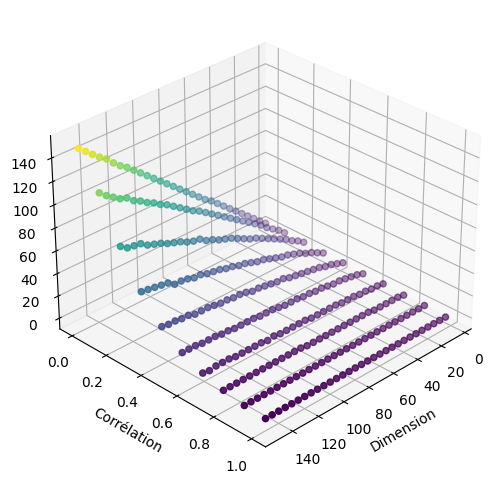

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler

import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from numpy.random import multivariate_normal

def create_covariance_matrix(dim, corr):
    if corr < -1 or corr > 1:
        raise ValueError("La corrélation doit être entre -1 et 1.")
    covariance_matrix = np.full((dim, dim), corr)  # La diagonale sera composée de 1 (variance pour une distribution normale standard)
    np.fill_diagonal(covariance_matrix, 1)
    return covariance_matrix

def generate_correlated_variables(n_samples, num_variables, correlation):
    mean = np.zeros(num_variables)  # Moyenne zéro pour une distribution normale standard
    covariance_matrix = create_covariance_matrix(num_variables, correlation)
    samples = np.random.multivariate_normal(mean, covariance_matrix, size=n_samples)  # Génère les échantillons à partir de la distribution normale multivariée
    df = pd.DataFrame(samples, columns=[f'Variable_{i+1}' for i in range(num_variables)])  # Convertit en DataFrame pandas
    return df

# Paramètres pour la plage de corrélation et le nombre de dimensions
correlation_values = np.linspace(0, 1, 10)  # 10 valeurs de corrélation de 0 à 1
dimension_values = np.arange(5, 151, 5)  # Dimensions de 5 à 150, par pas de 5

# Préparer les données pour le graphique 3D
X = []  # Liste pour les dimensions
Y = []  # Liste pour les valeurs de corrélation
Z = []  # Liste pour les dimensions effectives

for dim in dimension_values:
    for corr in correlation_values:
        X.append(dim)
        Y.append(corr)
        # Paramètres
        n_samples = 10000  # Nombre d'échantillons
        num_variables = dim  # Nombre de variables
        correlation = corr  # Corrélation souhaitée

        # Générer les variables corrélées
        df = generate_correlated_variables(n_samples, num_variables, correlation)

        # Remplacer les valeurs NaN par 0
        df.fillna(0, inplace=True)

        # Liste des colonnes contenant du texte
        text_columns = df.select_dtypes(include=['object']).columns

        # Remplacement du texte par des valeurs numériques
        for column in text_columns:
            le = LabelEncoder()
            df[column] = le.fit_transform(df[column].astype(str))

        # Création d'un objet MinMaxScaler
        scaler = MinMaxScaler()

        # Normalisation des colonnes du DataFrame
        df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

        # Calculer la matrice de covariance
        cov_matrix = np.cov(df, rowvar=False)

        # Définir les options d'affichage pour la matrice de covariance
        np.set_printoptions(precision=4, suppress=True)

        # Décomposition en valeurs propres
        eigenvalues, eigenvectors = np.linalg.eig(cov_matrix)

        # Calcul de la somme des valeurs propres
        sum_eigenvalues = np.sum(eigenvalues)

        result = 1
        for eigenvalue in eigenvalues:
            if eigenvalue < 0 or sum_eigenvalues <= 0:
                continue  # Skip this iteration if the values are invalid
            result *= (eigenvalue / sum_eigenvalues) ** (-eigenvalue / sum_eigenvalues)

        # Calculer le nombre de dimensions effectives
        effective_dimensions = round(result)

        Z.append(effective_dimensions)
        print(dim, corr, Z[-1])

# Création du graphe 3D avec une vue isométrique
fig = plt.figure(figsize=(12, 6))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(X, Y, Z, c=Z, cmap='viridis')
ax.set_xlabel('Dimension')
ax.set_ylabel('Corrélation')

# Définir la vue isométrique
ax.view_init(elev=30, azim=45)  # Angles choisis pour une vue isométrique standard

# Affichage du graphe
plt.show()

## Méthode avec n2 :

5 0.0 5
5 0.1111111111111111 5
5 0.2222222222222222 4
5 0.3333333333333333 3
5 0.4444444444444444 3
5 0.5555555555555556 2
5 0.6666666666666666 2
5 0.7777777777777777 1
5 0.8888888888888888 1
5 1.0 1
10 0.0 10
10 0.1111111111111111 9
10 0.2222222222222222 7
10 0.3333333333333333 5
10 0.4444444444444444 4
10 0.5555555555555556 3
10 0.6666666666666666 2
10 0.7777777777777777 2
10 0.8888888888888888 1
10 1.0 1
15 0.0 15
15 0.1111111111111111 13
15 0.2222222222222222 9
15 0.3333333333333333 6
15 0.4444444444444444 4
15 0.5555555555555556 3
15 0.6666666666666666 2
15 0.7777777777777777 2
15 0.8888888888888888 1
15 1.0 (1+0j)
20 0.0 20
20 0.1111111111111111 16


<ipython-input-16-88d9a16d2ad8>:81: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n2)


20 0.2222222222222222 10
20 0.3333333333333333 6
20 0.4444444444444444 4
20 0.5555555555555556 3
20 0.6666666666666666 2
20 0.7777777777777777 2
20 0.8888888888888888 1
20 1.0 (1+0j)
25 0.0 25


<ipython-input-16-88d9a16d2ad8>:81: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n2)


25 0.1111111111111111 19
25 0.2222222222222222 11
25 0.3333333333333333 7
25 0.4444444444444444 4
25 0.5555555555555556 3
25 0.6666666666666666 2
25 0.7777777777777777 2
25 0.8888888888888888 1
25 1.0 (1+0j)


<ipython-input-16-88d9a16d2ad8>:81: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n2)


30 0.0 30
30 0.1111111111111111 22
30 0.2222222222222222 12
30 0.3333333333333333 7
30 0.4444444444444444 4
30 0.5555555555555556 3
30 0.6666666666666666 2
30 0.7777777777777777 2
30 0.8888888888888888 1
30 1.0 (1+0j)

<ipython-input-16-88d9a16d2ad8>:81: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n2)



35 0.0 34
35 0.1111111111111111 25
35 0.2222222222222222 13
35 0.3333333333333333 7
35 0.4444444444444444 5
35 0.5555555555555556 3
35 0.6666666666666666 2
35 0.7777777777777777 2
35 0.8888888888888888 1
35 1.0 (1-0j)
40 0.0 39


<ipython-input-16-88d9a16d2ad8>:81: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n2)


40 0.1111111111111111 26
40 0.2222222222222222 14
40 0.3333333333333333 7
40 0.4444444444444444 5
40 0.5555555555555556 3
40 0.6666666666666666 2
40 0.7777777777777777 2
40 0.8888888888888888 1
40 1.0 (1+0j)
45 0.0 44


<ipython-input-16-88d9a16d2ad8>:81: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n2)


45 0.1111111111111111 29
45 0.2222222222222222 14
45 0.3333333333333333 8
45 0.4444444444444444 5
45 0.5555555555555556 3
45 0.6666666666666666 2
45 0.7777777777777777 2
45 0.8888888888888888 1
45 1.0 (1+0j)


<ipython-input-16-88d9a16d2ad8>:81: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n2)


50 0.0 49
50 0.1111111111111111 31
50 0.2222222222222222 15
50 0.3333333333333333 8
50 0.4444444444444444 5
50 0.5555555555555556 3
50 0.6666666666666666 2
50 0.7777777777777777 2
50 0.8888888888888888 1
50 1.0 (1+0j)


<ipython-input-16-88d9a16d2ad8>:81: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n2)


55 0.0 54
55 0.1111111111111111 33
55 0.2222222222222222 14
55 0.3333333333333333 8
55 0.4444444444444444 5
55 0.5555555555555556 3
55 0.6666666666666666 2
55 0.7777777777777777 2
55 0.8888888888888888 1
55 1.0 (1+0j)


<ipython-input-16-88d9a16d2ad8>:81: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n2)


60 0.0 59
60 0.1111111111111111 35
60 0.2222222222222222 15
60 0.3333333333333333 8
60 0.4444444444444444 5
60 0.5555555555555556 3
60 0.6666666666666666 2
60 0.7777777777777777 2
60 0.8888888888888888 1
60 1.0 (1+0j)


<ipython-input-16-88d9a16d2ad8>:81: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n2)


65 0.0 64
65 0.1111111111111111 36
65 0.2222222222222222 15
65 0.3333333333333333 8
65 0.4444444444444444 5
65 0.5555555555555556 3
65 0.6666666666666666 2
65 0.7777777777777777 2
65 0.8888888888888888 1
65 1.0 (1+0j)


<ipython-input-16-88d9a16d2ad8>:81: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n2)


70 0.0 69
70 0.1111111111111111 37
70 0.2222222222222222 16
70 0.3333333333333333 8
70 0.4444444444444444 5
70 0.5555555555555556 3
70 0.6666666666666666 2
70 0.7777777777777777 2
70 0.8888888888888888 1


<ipython-input-16-88d9a16d2ad8>:81: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n2)


70 1.0 (1-0j)
75 0.0 74
75 0.1111111111111111 39
75 0.2222222222222222 16
75 0.3333333333333333 8
75 0.4444444444444444 5
75 0.5555555555555556 3
75 0.6666666666666666 2
75 0.7777777777777777 2
75 0.8888888888888888 1


<ipython-input-16-88d9a16d2ad8>:81: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n2)


75 1.0 (1+0j)
80 0.0 79
80 0.1111111111111111 40
80 0.2222222222222222 16
80 0.3333333333333333 8
80 0.4444444444444444 5
80 0.5555555555555556 3
80 0.6666666666666666 2
80 0.7777777777777777 2
80 0.8888888888888888 1
80 1.0 (1+0j)


<ipython-input-16-88d9a16d2ad8>:81: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n2)


85 0.0 84
85 0.1111111111111111 41
85 0.2222222222222222 17
85 0.3333333333333333 8
85 0.4444444444444444 5
85 0.5555555555555556 3
85 0.6666666666666666 2
85 0.7777777777777777 2
85 0.8888888888888888 1


<ipython-input-16-88d9a16d2ad8>:81: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n2)


85 1.0 (1-0j)
90 0.0 88
90 0.1111111111111111 42
90 0.2222222222222222 17
90 0.3333333333333333 8
90 0.4444444444444444 5
90 0.5555555555555556 3
90 0.6666666666666666 2
90 0.7777777777777777 2
90 0.8888888888888888 1


<ipython-input-16-88d9a16d2ad8>:81: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n2)


90 1.0 (1-0j)
95 0.0 93
95 0.1111111111111111 44
95 0.2222222222222222 17
95 0.3333333333333333 8
95 0.4444444444444444 5
95 0.5555555555555556 3
95 0.6666666666666666 2
95 0.7777777777777777 2
95 0.8888888888888888 1
95 1.0 (1+0j)


<ipython-input-16-88d9a16d2ad8>:81: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n2)


100 0.0 98
100 0.1111111111111111 44
100 0.2222222222222222 17
100 0.3333333333333333 8
100 0.4444444444444444 5
100 0.5555555555555556 3
100 0.6666666666666666 2
100 0.7777777777777777 2
100 0.8888888888888888 1
100 1.0 (1-0j)


<ipython-input-16-88d9a16d2ad8>:81: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n2)


105 0.0 103
105 0.1111111111111111 45
105 0.2222222222222222 17
105 0.3333333333333333 8
105 0.4444444444444444 5
105 0.5555555555555556 3
105 0.6666666666666666 2
105 0.7777777777777777 2
105 0.8888888888888888 1


<ipython-input-16-88d9a16d2ad8>:81: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n2)


105 1.0 (1+0j)
110 0.0 107
110 0.1111111111111111 47
110 0.2222222222222222 17
110 0.3333333333333333 8
110 0.4444444444444444 5
110 0.5555555555555556 3
110 0.6666666666666666 2
110 0.7777777777777777 2
110 0.8888888888888888 1


<ipython-input-16-88d9a16d2ad8>:81: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n2)


110 1.0 (1+0j)
115 0.0 112
115 0.1111111111111111 45
115 0.2222222222222222 17
115 0.3333333333333333 8
115 0.4444444444444444 5
115 0.5555555555555556 3
115 0.6666666666666666 2
115 0.7777777777777777 2
115 0.8888888888888888 1


<ipython-input-16-88d9a16d2ad8>:81: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n2)


115 1.0 (1+0j)
120 0.0 117
120 0.1111111111111111 49
120 0.2222222222222222 18
120 0.3333333333333333 8
120 0.4444444444444444 5
120 0.5555555555555556 3
120 0.6666666666666666 2
120 0.7777777777777777 2
120 0.8888888888888888 1


<ipython-input-16-88d9a16d2ad8>:81: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n2)


120 1.0 (1+0j)
125 0.0 122
125 0.1111111111111111 51
125 0.2222222222222222 18
125 0.3333333333333333 8
125 0.4444444444444444 5
125 0.5555555555555556 3
125 0.6666666666666666 2
125 0.7777777777777777 2
125 0.8888888888888888 1


<ipython-input-16-88d9a16d2ad8>:81: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n2)


125 1.0 (1-0j)
130 0.0 127
130 0.1111111111111111 50
130 0.2222222222222222 17
130 0.3333333333333333 9
130 0.4444444444444444 5
130 0.5555555555555556 3
130 0.6666666666666666 2
130 0.7777777777777777 2
130 0.8888888888888888 1


<ipython-input-16-88d9a16d2ad8>:81: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n2)


130 1.0 (1-0j)
135 0.0 131
135 0.1111111111111111 50
135 0.2222222222222222 17
135 0.3333333333333333 9
135 0.4444444444444444 5
135 0.5555555555555556 3
135 0.6666666666666666 2
135 0.7777777777777777 2
135 0.8888888888888888 1
135 1.0 (1-0j)


<ipython-input-16-88d9a16d2ad8>:81: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n2)


140 0.0 137
140 0.1111111111111111 51
140 0.2222222222222222 17
140 0.3333333333333333 8
140 0.4444444444444444 5
140 0.5555555555555556 3
140 0.6666666666666666 2
140 0.7777777777777777 2
140 0.8888888888888888 1


<ipython-input-16-88d9a16d2ad8>:81: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n2)


140 1.0 (1+0j)
145 0.0 141
145 0.1111111111111111 52
145 0.2222222222222222 18
145 0.3333333333333333 8
145 0.4444444444444444 5
145 0.5555555555555556 3
145 0.6666666666666666 2
145 0.7777777777777777 2
145 0.8888888888888888 1


<ipython-input-16-88d9a16d2ad8>:81: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n2)


145 1.0 (1+0j)
150 0.0 146
150 0.1111111111111111 53
150 0.2222222222222222 18
150 0.3333333333333333 8
150 0.4444444444444444 5
150 0.5555555555555556 3
150 0.6666666666666666 2
150 0.7777777777777777 2
150 0.8888888888888888 1


<ipython-input-16-88d9a16d2ad8>:81: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n2)
/usr/local/lib/python3.10/dist-packages/matplotlib/axes/_axes.py:4411: ComplexWarning: Casting complex values to real discards the imaginary part
  c = np.asanyarray(c, dtype=float)
/usr/local/lib/python3.10/dist-packages/matplotlib/cbook/__init__.py:1335: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)
/usr/local/lib/python3.10/dist-packages/matplotlib/collections.py:551: ComplexWarning: Casting complex values to real discards the imaginary part
  (np.asanyarray(self.convert_xunits(offsets[:, 0]), float),
/usr/local/lib/python3.10/dist-packages/matplotlib/collections.py:552: ComplexWarning: Casting complex values to real discards the imaginary part
  np.asanyarray(self.convert_yunits(off

150 1.0 (1-0j)


/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:389: ComplexWarning: Casting complex values to real discards the imaginary part
  c = tuple(map(float, c))


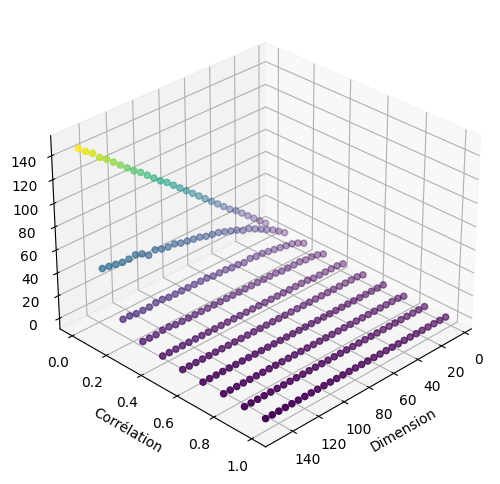

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler

import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from numpy.random import multivariate_normal

def create_covariance_matrix(dim, corr):
    if corr < -1 or corr > 1:
        raise ValueError("La corrélation doit être entre -1 et 1.")
    covariance_matrix = np.full((dim, dim), corr)  # La diagonale sera composée de 1 (variance pour une distribution normale standard)
    np.fill_diagonal(covariance_matrix, 1)
    return covariance_matrix

def generate_correlated_variables(n_samples, num_variables, correlation):
    mean = np.zeros(num_variables)  # Moyenne zéro pour une distribution normale standard
    covariance_matrix = create_covariance_matrix(num_variables, correlation)
    samples = np.random.multivariate_normal(mean, covariance_matrix, size=n_samples)  # Génère les échantillons à partir de la distribution normale multivariée
    df = pd.DataFrame(samples, columns=[f'Variable_{i+1}' for i in range(num_variables)])  # Convertit en DataFrame pandas
    return df

# Paramètres pour la plage de corrélation et le nombre de dimensions
correlation_values = np.linspace(0, 1, 10)  # 10 valeurs de corrélation de 0 à 1
dimension_values = np.arange(5, 151, 5)  # Dimensions de 5 à 150, par pas de 5

# Préparer les données pour le graphique 3D
X = []  # Liste pour les dimensions
Y = []  # Liste pour les valeurs de corrélation
Z = []  # Liste pour les dimensions effectives

for dim in dimension_values:
    for corr in correlation_values:
        X.append(dim)
        Y.append(corr)
        # Paramètres
        n_samples = 10000  # Nombre d'échantillons
        num_variables = dim  # Nombre de variables
        correlation = corr  # Corrélation souhaitée

        # Générer les variables corrélées
        df = generate_correlated_variables(n_samples, num_variables, correlation)

        # Remplacer les valeurs NaN par 0
        df.fillna(0, inplace=True)

        # Liste des colonnes contenant du texte
        text_columns = df.select_dtypes(include=['object']).columns

        # Remplacement du texte par des valeurs numériques
        for column in text_columns:
            le = LabelEncoder()
            df[column] = le.fit_transform(df[column].astype(str))

        # Création d'un objet MinMaxScaler
        scaler = MinMaxScaler()

        # Normalisation des colonnes du DataFrame
        df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

        # Calculer la matrice de covariance
        cov_matrix = np.cov(df, rowvar=False)

        # Définir les options d'affichage pour la matrice de covariance
        np.set_printoptions(precision=4, suppress=True)

        # Décomposition en valeurs propres
        eigenvalues, eigenvectors = np.linalg.eig(cov_matrix)

        # Calcul de la somme des valeurs propres
        sum_eigenvalues = np.sum(eigenvalues)

        # Calcul de la somme des valeurs propres carrées
        sum_eigenvalues_square = np.sum(eigenvalues**2)

        n2 = (sum_eigenvalues**2) / sum_eigenvalues_square

        # Calculer le nombre de dimensions effectives
        effective_dimensions = round(n2)

        Z.append(effective_dimensions)
        print(dim, corr, Z[-1])

# Création du graphe 3D avec une vue isométrique
fig = plt.figure(figsize=(12, 6))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(X, Y, Z, c=Z, cmap='viridis')
ax.set_xlabel('Dimension')
ax.set_ylabel('Corrélation')

# Définir la vue isométrique
ax.view_init(elev=30, azim=45)  # Angles choisis pour une vue isométrique standard

# Affichage du graphe
plt.show()

## Méthode avec n inf :

5 0.0 4
5 0.1111111111111111 3
5 0.2222222222222222 3
5 0.3333333333333333 2
5 0.4444444444444444 2
5 0.5555555555555556 2
5 0.6666666666666666 1
5 0.7777777777777777 1
5 0.8888888888888888 1
5 1.0 1
10 0.0 8
10 0.1111111111111111 5
10 0.2222222222222222 3
10 0.3333333333333333 3
10 0.4444444444444444 2
10 0.5555555555555556 2
10 0.6666666666666666 1
10 0.7777777777777777 1
10 0.8888888888888888 1
10 1.0 1
15 0.0 12
15 0.1111111111111111 6
15 0.2222222222222222 4
15 0.3333333333333333 3
15 0.4444444444444444 2
15 0.5555555555555556 2
15 0.6666666666666666 1
15 0.7777777777777777 1
15 0.8888888888888888 1
15 1.0 1
20 0.0 17
20 0.1111111111111111 6
20 0.2222222222222222 4
20 0.3333333333333333 3
20 0.4444444444444444 2
20 0.5555555555555556 2
20 0.6666666666666666 1
20 0.7777777777777777 1
20 0.8888888888888888 1
20 1.0 (1-0j)
25 0.0 22


<ipython-input-17-6f7cd5a4699e>:78: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n_inf)


25 0.1111111111111111 7
25 0.2222222222222222 4
25 0.3333333333333333 3
25 0.4444444444444444 2
25 0.5555555555555556 2
25 0.6666666666666666 1
25 0.7777777777777777 1
25 0.8888888888888888 1
25 1.0 (1+0j)
30 0.0 24


<ipython-input-17-6f7cd5a4699e>:78: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n_inf)


30 0.1111111111111111 7
30 0.2222222222222222 4
30 0.3333333333333333 3
30 0.4444444444444444 2
30 0.5555555555555556 2
30 0.6666666666666666 1
30 0.7777777777777777 1
30 0.8888888888888888 1
30 1.0 (1+0j)


<ipython-input-17-6f7cd5a4699e>:78: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n_inf)


35 0.0 29
35 0.1111111111111111 7
35 0.2222222222222222 4
35 0.3333333333333333 3
35 0.4444444444444444 2
35 0.5555555555555556 2
35 0.6666666666666666 1
35 0.7777777777777777 1
35 0.8888888888888888 1


<ipython-input-17-6f7cd5a4699e>:78: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n_inf)


35 1.0 (1-0j)
40 0.0 32
40 0.1111111111111111 7
40 0.2222222222222222 4
40 0.3333333333333333 3
40 0.4444444444444444 2
40 0.5555555555555556 2
40 0.6666666666666666 1
40 0.7777777777777777 1
40 0.8888888888888888 1
40 1.0 (1+0j)
45 0.0 37


<ipython-input-17-6f7cd5a4699e>:78: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n_inf)


45 0.1111111111111111 8
45 0.2222222222222222 4
45 0.3333333333333333 3
45 0.4444444444444444 2
45 0.5555555555555556 2
45 0.6666666666666666 1
45 0.7777777777777777 1
45 0.8888888888888888 1


<ipython-input-17-6f7cd5a4699e>:78: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n_inf)


45 1.0 (1+0j)
50 0.0 39
50 0.1111111111111111 8
50 0.2222222222222222 4
50 0.3333333333333333 3
50 0.4444444444444444 2
50 0.5555555555555556 2
50 0.6666666666666666 1
50 0.7777777777777777 1
50 0.8888888888888888 1


<ipython-input-17-6f7cd5a4699e>:78: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n_inf)


50 1.0 (1+0j)
55 0.0 43
55 0.1111111111111111 8
55 0.2222222222222222 4
55 0.3333333333333333 3
55 0.4444444444444444 2
55 0.5555555555555556 2
55 0.6666666666666666 1
55 0.7777777777777777 1
55 0.8888888888888888 1
55 1.0 (1+0j)


<ipython-input-17-6f7cd5a4699e>:78: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n_inf)


60 0.0 45
60 0.1111111111111111 8
60 0.2222222222222222 4
60 0.3333333333333333 3
60 0.4444444444444444 2
60 0.5555555555555556 2
60 0.6666666666666666 1
60 0.7777777777777777 1
60 0.8888888888888888 1
60 1.0 (1-0j)


<ipython-input-17-6f7cd5a4699e>:78: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n_inf)


65 0.0 49
65 0.1111111111111111 8
65 0.2222222222222222 4
65 0.3333333333333333 3
65 0.4444444444444444 2
65 0.5555555555555556 2
65 0.6666666666666666 1
65 0.7777777777777777 1
65 0.8888888888888888 1
65 1.0 (1+0j)


<ipython-input-17-6f7cd5a4699e>:78: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n_inf)


70 0.0 55
70 0.1111111111111111 8
70 0.2222222222222222 4
70 0.3333333333333333 3
70 0.4444444444444444 2
70 0.5555555555555556 2
70 0.6666666666666666 1
70 0.7777777777777777 1
70 0.8888888888888888 1


<ipython-input-17-6f7cd5a4699e>:78: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n_inf)


70 1.0 (1+0j)
75 0.0 56
75 0.1111111111111111 8
75 0.2222222222222222 4
75 0.3333333333333333 3
75 0.4444444444444444 2
75 0.5555555555555556 2
75 0.6666666666666666 1
75 0.7777777777777777 1
75 0.8888888888888888 1


<ipython-input-17-6f7cd5a4699e>:78: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n_inf)


75 1.0 (1+0j)
80 0.0 59
80 0.1111111111111111 8
80 0.2222222222222222 4
80 0.3333333333333333 3
80 0.4444444444444444 2
80 0.5555555555555556 2
80 0.6666666666666666 1
80 0.7777777777777777 1
80 0.8888888888888888 1


<ipython-input-17-6f7cd5a4699e>:78: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n_inf)


80 1.0 (1+0j)
85 0.0 64
85 0.1111111111111111 8
85 0.2222222222222222 4
85 0.3333333333333333 3
85 0.4444444444444444 2
85 0.5555555555555556 2
85 0.6666666666666666 1
85 0.7777777777777777 1
85 0.8888888888888888 1
85 1.0 (1-0j)


<ipython-input-17-6f7cd5a4699e>:78: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n_inf)


90 0.0 66
90 0.1111111111111111 8
90 0.2222222222222222 4
90 0.3333333333333333 3
90 0.4444444444444444 2
90 0.5555555555555556 2
90 0.6666666666666666 1
90 0.7777777777777777 1
90 0.8888888888888888 1
90 1.0 (1-0j)


<ipython-input-17-6f7cd5a4699e>:78: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n_inf)


95 0.0 73
95 0.1111111111111111 8
95 0.2222222222222222 4
95 0.3333333333333333 3
95 0.4444444444444444 2
95 0.5555555555555556 2
95 0.6666666666666666 1
95 0.7777777777777777 1
95 0.8888888888888888 1


<ipython-input-17-6f7cd5a4699e>:78: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n_inf)


95 1.0 (1+0j)
100 0.0 76
100 0.1111111111111111 8
100 0.2222222222222222 4
100 0.3333333333333333 3
100 0.4444444444444444 2
100 0.5555555555555556 2
100 0.6666666666666666 1
100 0.7777777777777777 1
100 0.8888888888888888 1


<ipython-input-17-6f7cd5a4699e>:78: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n_inf)


100 1.0 (1+0j)
105 0.0 78
105 0.1111111111111111 8
105 0.2222222222222222 4
105 0.3333333333333333 3
105 0.4444444444444444 2
105 0.5555555555555556 2
105 0.6666666666666666 1
105 0.7777777777777777 1
105 0.8888888888888888 1
105 1.0 (1-0j)


<ipython-input-17-6f7cd5a4699e>:78: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n_inf)


110 0.0 82
110 0.1111111111111111 8
110 0.2222222222222222 4
110 0.3333333333333333 3
110 0.4444444444444444 2
110 0.5555555555555556 2
110 0.6666666666666666 1
110 0.7777777777777777 1
110 0.8888888888888888 1


<ipython-input-17-6f7cd5a4699e>:78: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n_inf)


110 1.0 (1+0j)
115 0.0 85
115 0.1111111111111111 8
115 0.2222222222222222 4
115 0.3333333333333333 3
115 0.4444444444444444 2
115 0.5555555555555556 2
115 0.6666666666666666 2
115 0.7777777777777777 1
115 0.8888888888888888 1
115 1.0 (1+0j)


<ipython-input-17-6f7cd5a4699e>:78: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n_inf)


120 0.0 91
120 0.1111111111111111 8
120 0.2222222222222222 4
120 0.3333333333333333 3
120 0.4444444444444444 2
120 0.5555555555555556 2
120 0.6666666666666666 1
120 0.7777777777777777 1
120 0.8888888888888888 1


<ipython-input-17-6f7cd5a4699e>:78: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n_inf)


120 1.0 (1-0j)
125 0.0 94
125 0.1111111111111111 8
125 0.2222222222222222 4
125 0.3333333333333333 3
125 0.4444444444444444 2
125 0.5555555555555556 2
125 0.6666666666666666 1
125 0.7777777777777777 1
125 0.8888888888888888 1


<ipython-input-17-6f7cd5a4699e>:78: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n_inf)


125 1.0 (1+0j)
130 0.0 95
130 0.1111111111111111 9
130 0.2222222222222222 4
130 0.3333333333333333 3
130 0.4444444444444444 2
130 0.5555555555555556 2
130 0.6666666666666666 2
130 0.7777777777777777 1
130 0.8888888888888888 1


<ipython-input-17-6f7cd5a4699e>:78: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n_inf)


130 1.0 (1-0j)
135 0.0 102
135 0.1111111111111111 9
135 0.2222222222222222 4
135 0.3333333333333333 3
135 0.4444444444444444 2
135 0.5555555555555556 2
135 0.6666666666666666 1
135 0.7777777777777777 1
135 0.8888888888888888 1


<ipython-input-17-6f7cd5a4699e>:78: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n_inf)


135 1.0 (1+0j)
140 0.0 103
140 0.1111111111111111 9
140 0.2222222222222222 4
140 0.3333333333333333 3
140 0.4444444444444444 2
140 0.5555555555555556 2
140 0.6666666666666666 1
140 0.7777777777777777 1
140 0.8888888888888888 1


<ipython-input-17-6f7cd5a4699e>:78: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n_inf)


140 1.0 (1+0j)
145 0.0 107
145 0.1111111111111111 8
145 0.2222222222222222 4
145 0.3333333333333333 3
145 0.4444444444444444 2
145 0.5555555555555556 2
145 0.6666666666666666 1
145 0.7777777777777777 1
145 0.8888888888888888 1


<ipython-input-17-6f7cd5a4699e>:78: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n_inf)


145 1.0 (1+0j)
150 0.0 111
150 0.1111111111111111 8
150 0.2222222222222222 4
150 0.3333333333333333 3
150 0.4444444444444444 2
150 0.5555555555555556 2
150 0.6666666666666666 1
150 0.7777777777777777 1
150 0.8888888888888888 1


<ipython-input-17-6f7cd5a4699e>:78: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n_inf)
/usr/local/lib/python3.10/dist-packages/matplotlib/axes/_axes.py:4411: ComplexWarning: Casting complex values to real discards the imaginary part
  c = np.asanyarray(c, dtype=float)
/usr/local/lib/python3.10/dist-packages/matplotlib/cbook/__init__.py:1335: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)
/usr/local/lib/python3.10/dist-packages/matplotlib/collections.py:551: ComplexWarning: Casting complex values to real discards the imaginary part
  (np.asanyarray(self.convert_xunits(offsets[:, 0]), float),
/usr/local/lib/python3.10/dist-packages/matplotlib/collections.py:552: ComplexWarning: Casting complex values to real discards the imaginary part
  np.asanyarray(self.convert_yunits(

150 1.0 (1-0j)


/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:389: ComplexWarning: Casting complex values to real discards the imaginary part
  c = tuple(map(float, c))


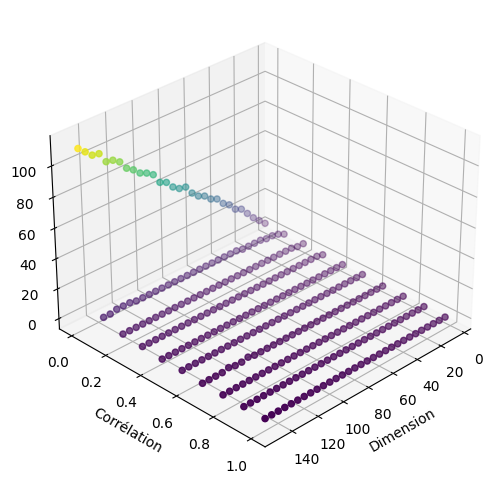

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler

import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from numpy.random import multivariate_normal

def create_covariance_matrix(dim, corr):
    if corr < -1 or corr > 1:
        raise ValueError("La corrélation doit être entre -1 et 1.")
    covariance_matrix = np.full((dim, dim), corr)  # La diagonale sera composée de 1 (variance pour une distribution normale standard)
    np.fill_diagonal(covariance_matrix, 1)
    return covariance_matrix

def generate_correlated_variables(n_samples, num_variables, correlation):
    mean = np.zeros(num_variables)  # Moyenne zéro pour une distribution normale standard
    covariance_matrix = create_covariance_matrix(num_variables, correlation)
    samples = np.random.multivariate_normal(mean, covariance_matrix, size=n_samples)  # Génère les échantillons à partir de la distribution normale multivariée
    df = pd.DataFrame(samples, columns=[f'Variable_{i+1}' for i in range(num_variables)])  # Convertit en DataFrame pandas
    return df

# Paramètres pour la plage de corrélation et le nombre de dimensions
correlation_values = np.linspace(0, 1, 10)  # 10 valeurs de corrélation de 0 à 1
dimension_values = np.arange(5, 151, 5)  # Dimensions de 5 à 150, par pas de 5

# Préparer les données pour le graphique 3D
X = []  # Liste pour les dimensions
Y = []  # Liste pour les valeurs de corrélation
Z = []  # Liste pour les dimensions effectives

for dim in dimension_values:
    for corr in correlation_values:
        X.append(dim)
        Y.append(corr)
        # Paramètres
        n_samples = 10000  # Nombre d'échantillons
        num_variables = dim  # Nombre de variables
        correlation = corr  # Corrélation souhaitée

        # Générer les variables corrélées
        df = generate_correlated_variables(n_samples, num_variables, correlation)

        # Remplacer les valeurs NaN par 0
        df.fillna(0, inplace=True)

        # Liste des colonnes contenant du texte
        text_columns = df.select_dtypes(include=['object']).columns

        # Remplacement du texte par des valeurs numériques
        for column in text_columns:
            le = LabelEncoder()
            df[column] = le.fit_transform(df[column].astype(str))

        # Création d'un objet MinMaxScaler
        scaler = MinMaxScaler()

        # Normalisation des colonnes du DataFrame
        df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

        # Calculer la matrice de covariance
        cov_matrix = np.cov(df, rowvar=False)

        # Définir les options d'affichage pour la matrice de covariance
        np.set_printoptions(precision=4, suppress=True)

        # Décomposition en valeurs propres
        eigenvalues, eigenvectors = np.linalg.eig(cov_matrix)

        # Calcul de la somme des valeurs propres
        sum_eigenvalues = np.sum(eigenvalues)

        n_inf = sum_eigenvalues / max(eigenvalues)

        # Calculer le nombre de dimensions effectives
        effective_dimensions = round(n_inf)

        Z.append(effective_dimensions)
        print(dim, corr, Z[-1])

# Création du graphe 3D avec une vue isométrique
fig = plt.figure(figsize=(12, 6))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(X, Y, Z, c=Z, cmap='viridis')
ax.set_xlabel('Dimension')
ax.set_ylabel('Corrélation')

# Définir la vue isométrique
ax.view_init(elev=30, azim=45)  # Angles choisis pour une vue isométrique standard

# Affichage du graphe
plt.show()

## Méthode avec Chaîne de Markov par Monte Carlo :

<ipython-input-18-ccb76cea4c37>:33: RuntimeWarning: invalid value encountered in divide
  cumulative_variance = np.cumsum(eigvals) / np.sum(eigvals)


5 0.0 1


<ipython-input-18-ccb76cea4c37>:33: RuntimeWarning: invalid value encountered in divide
  cumulative_variance = np.cumsum(eigvals) / np.sum(eigvals)


5 0.1111111111111111 1


<ipython-input-18-ccb76cea4c37>:33: RuntimeWarning: invalid value encountered in divide
  cumulative_variance = np.cumsum(eigvals) / np.sum(eigvals)


5 0.2222222222222222 1


<ipython-input-18-ccb76cea4c37>:33: RuntimeWarning: invalid value encountered in divide
  cumulative_variance = np.cumsum(eigvals) / np.sum(eigvals)


5 0.3333333333333333 1


<ipython-input-18-ccb76cea4c37>:33: RuntimeWarning: invalid value encountered in divide
  cumulative_variance = np.cumsum(eigvals) / np.sum(eigvals)


5 0.4444444444444444 1


<ipython-input-18-ccb76cea4c37>:33: RuntimeWarning: invalid value encountered in divide
  cumulative_variance = np.cumsum(eigvals) / np.sum(eigvals)


5 0.5555555555555556 1


<ipython-input-18-ccb76cea4c37>:33: RuntimeWarning: invalid value encountered in divide
  cumulative_variance = np.cumsum(eigvals) / np.sum(eigvals)


5 0.6666666666666666 1


<ipython-input-18-ccb76cea4c37>:33: RuntimeWarning: invalid value encountered in divide
  cumulative_variance = np.cumsum(eigvals) / np.sum(eigvals)


5 0.7777777777777777 1


<ipython-input-18-ccb76cea4c37>:33: RuntimeWarning: invalid value encountered in divide
  cumulative_variance = np.cumsum(eigvals) / np.sum(eigvals)


5 0.8888888888888888 1


<ipython-input-18-ccb76cea4c37>:33: RuntimeWarning: invalid value encountered in divide
  cumulative_variance = np.cumsum(eigvals) / np.sum(eigvals)
<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


5 1.0 1
10 0.0 8


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


10 0.1111111111111111 9


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


10 0.2222222222222222 9


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


10 0.3333333333333333 9


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


10 0.4444444444444444 8


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


10 0.5555555555555556 9


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


10 0.6666666666666666 8


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


10 0.7777777777777777 9


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


10 0.8888888888888888 9


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


10 1.0 9


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


15 0.0 12


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


15 0.1111111111111111 11


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


15 0.2222222222222222 11


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


15 0.3333333333333333 12


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


15 0.4444444444444444 12


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


15 0.5555555555555556 12


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


15 0.6666666666666666 11


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


15 0.7777777777777777 11


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


15 0.8888888888888888 12


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


15 1.0 12


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


20 0.0 14


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


20 0.1111111111111111 14


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


20 0.2222222222222222 14


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


20 0.3333333333333333 15


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


20 0.4444444444444444 14


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


20 0.5555555555555556 13


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


20 0.6666666666666666 15


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


20 0.7777777777777777 16


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


20 0.8888888888888888 15


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


20 1.0 15


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


25 0.0 16


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


25 0.1111111111111111 18


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


25 0.2222222222222222 17


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


25 0.3333333333333333 18


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


25 0.4444444444444444 16


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


25 0.5555555555555556 16


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


25 0.6666666666666666 16


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


25 0.7777777777777777 18


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


25 0.8888888888888888 17


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


25 1.0 16


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


30 0.0 19


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


30 0.1111111111111111 18


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


30 0.2222222222222222 21


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


30 0.3333333333333333 19


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


30 0.4444444444444444 20


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


30 0.5555555555555556 19


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


30 0.6666666666666666 19


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


30 0.7777777777777777 17


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


30 0.8888888888888888 20


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


30 1.0 18


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


35 0.0 21


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


35 0.1111111111111111 21


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


35 0.2222222222222222 22


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


35 0.3333333333333333 23


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


35 0.4444444444444444 22


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


35 0.5555555555555556 22


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


35 0.6666666666666666 21


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


35 0.7777777777777777 20


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


35 0.8888888888888888 20


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


35 1.0 21


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


40 0.0 23


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


40 0.1111111111111111 23


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


40 0.2222222222222222 24


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


40 0.3333333333333333 21


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


40 0.4444444444444444 23


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


40 0.5555555555555556 24


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


40 0.6666666666666666 24


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


40 0.7777777777777777 22


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


40 0.8888888888888888 22


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


40 1.0 23


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


45 0.0 25


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


45 0.1111111111111111 27


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


45 0.2222222222222222 26


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


45 0.3333333333333333 26


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


45 0.4444444444444444 22


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


45 0.5555555555555556 26


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


45 0.6666666666666666 23


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


45 0.7777777777777777 23


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


45 0.8888888888888888 26


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


45 1.0 24


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


50 0.0 28


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


50 0.1111111111111111 25


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


50 0.2222222222222222 28


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


50 0.3333333333333333 29


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


50 0.4444444444444444 25


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


50 0.5555555555555556 26


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


50 0.6666666666666666 29


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


50 0.7777777777777777 22


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


50 0.8888888888888888 28


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


50 1.0 23


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


55 0.0 30


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


55 0.1111111111111111 28


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


55 0.2222222222222222 25


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


55 0.3333333333333333 30


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


55 0.4444444444444444 28


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


55 0.5555555555555556 27


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


55 0.6666666666666666 28


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


55 0.7777777777777777 27


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


55 0.8888888888888888 28


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


55 1.0 28


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


60 0.0 26


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


60 0.1111111111111111 28


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


60 0.2222222222222222 29


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


60 0.3333333333333333 29


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


60 0.4444444444444444 27


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


60 0.5555555555555556 31


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


60 0.6666666666666666 29


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


60 0.7777777777777777 29


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


60 0.8888888888888888 27


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


60 1.0 31


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


65 0.0 28


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


65 0.1111111111111111 33


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


65 0.2222222222222222 34


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


65 0.3333333333333333 27


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


65 0.4444444444444444 29


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


65 0.5555555555555556 29


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


65 0.6666666666666666 30


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


65 0.7777777777777777 29


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


65 0.8888888888888888 29


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


65 1.0 28


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


70 0.0 30


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


70 0.1111111111111111 34


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


70 0.2222222222222222 34


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


70 0.3333333333333333 30


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


70 0.4444444444444444 31


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


70 0.5555555555555556 32


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


70 0.6666666666666666 34


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


70 0.7777777777777777 30


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


70 0.8888888888888888 32


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


70 1.0 28


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


75 0.0 32


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


75 0.1111111111111111 34


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


75 0.2222222222222222 32


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


75 0.3333333333333333 30


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


75 0.4444444444444444 33


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


75 0.5555555555555556 35


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


75 0.6666666666666666 33


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


75 0.7777777777777777 28


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


75 0.8888888888888888 32


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


75 1.0 32


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


80 0.0 29


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


80 0.1111111111111111 33


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


80 0.2222222222222222 33


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


80 0.3333333333333333 32


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


80 0.4444444444444444 33


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


80 0.5555555555555556 32


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


80 0.6666666666666666 35


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


80 0.7777777777777777 31


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


80 0.8888888888888888 32


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


80 1.0 31


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


85 0.0 35


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


85 0.1111111111111111 30


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


85 0.2222222222222222 33


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


85 0.3333333333333333 31


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


85 0.4444444444444444 35


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


85 0.5555555555555556 34


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


85 0.6666666666666666 32


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


85 0.7777777777777777 36


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


85 0.8888888888888888 35


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


85 1.0 37


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


90 0.0 35


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


90 0.1111111111111111 35


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


90 0.2222222222222222 33


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


90 0.3333333333333333 34


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


90 0.4444444444444444 34


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


90 0.5555555555555556 32


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


90 0.6666666666666666 34


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


90 0.7777777777777777 34


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


90 0.8888888888888888 35


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


90 1.0 33


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


95 0.0 37


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


95 0.1111111111111111 35


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


95 0.2222222222222222 34


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


95 0.3333333333333333 34


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


95 0.4444444444444444 36


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


95 0.5555555555555556 34


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


95 0.6666666666666666 33


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


95 0.7777777777777777 35


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


95 0.8888888888888888 37


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


95 1.0 39


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


100 0.0 37


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


100 0.1111111111111111 36


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


100 0.2222222222222222 33


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


100 0.3333333333333333 39


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


100 0.4444444444444444 36


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


100 0.5555555555555556 36


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


100 0.6666666666666666 34


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


100 0.7777777777777777 39


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


100 0.8888888888888888 37


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


100 1.0 35


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


105 0.0 36


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


105 0.1111111111111111 37


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


105 0.2222222222222222 34


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


105 0.3333333333333333 34


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


105 0.4444444444444444 34


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


105 0.5555555555555556 36


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


105 0.6666666666666666 39


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


105 0.7777777777777777 37


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


105 0.8888888888888888 35


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


105 1.0 33


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


110 0.0 38


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


110 0.1111111111111111 38


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


110 0.2222222222222222 38


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


110 0.3333333333333333 35


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


110 0.4444444444444444 39


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


110 0.5555555555555556 33


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


110 0.6666666666666666 36


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


110 0.7777777777777777 37


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


110 0.8888888888888888 40


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


110 1.0 37


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


115 0.0 40


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


115 0.1111111111111111 38


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


115 0.2222222222222222 36


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


115 0.3333333333333333 37


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


115 0.4444444444444444 36


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


115 0.5555555555555556 39


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


115 0.6666666666666666 38


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


115 0.7777777777777777 37


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


115 0.8888888888888888 41


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


115 1.0 36


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


120 0.0 35


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


120 0.1111111111111111 39


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


120 0.2222222222222222 40


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


120 0.3333333333333333 37


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


120 0.4444444444444444 39


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


120 0.5555555555555556 37


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


120 0.6666666666666666 34


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


120 0.7777777777777777 39


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


120 0.8888888888888888 40


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


120 1.0 40


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


125 0.0 35


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


125 0.1111111111111111 40


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


125 0.2222222222222222 38


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


125 0.3333333333333333 37


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


125 0.4444444444444444 38


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


125 0.5555555555555556 39


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


125 0.6666666666666666 41


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


125 0.7777777777777777 37


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


125 0.8888888888888888 40


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


125 1.0 34


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


130 0.0 41


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


130 0.1111111111111111 37


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


130 0.2222222222222222 43


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


130 0.3333333333333333 41


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


130 0.4444444444444444 44


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


130 0.5555555555555556 39


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


130 0.6666666666666666 37


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


130 0.7777777777777777 39


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


130 0.8888888888888888 41


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


130 1.0 38


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


135 0.0 39


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


135 0.1111111111111111 40


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


135 0.2222222222222222 40


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


135 0.3333333333333333 38


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


135 0.4444444444444444 41


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


135 0.5555555555555556 39


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


135 0.6666666666666666 38


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


135 0.7777777777777777 41


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


135 0.8888888888888888 41


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


135 1.0 40


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


140 0.0 41


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


140 0.1111111111111111 37


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


140 0.2222222222222222 39


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


140 0.3333333333333333 38


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


140 0.4444444444444444 41


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


140 0.5555555555555556 41


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


140 0.6666666666666666 38


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


140 0.7777777777777777 41


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


140 0.8888888888888888 41


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


140 1.0 41


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


145 0.0 37


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


145 0.1111111111111111 38


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


145 0.2222222222222222 40


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


145 0.3333333333333333 44


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


145 0.4444444444444444 39


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


145 0.5555555555555556 44


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


145 0.6666666666666666 40


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


145 0.7777777777777777 46


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


145 0.8888888888888888 41


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


145 1.0 40


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


150 0.0 40


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


150 0.1111111111111111 38


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


150 0.2222222222222222 39


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


150 0.3333333333333333 40


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


150 0.4444444444444444 40


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


150 0.5555555555555556 43


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


150 0.6666666666666666 38


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


150 0.7777777777777777 44


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


150 0.8888888888888888 43


<ipython-input-18-ccb76cea4c37>:95: RuntimeWarning: invalid value encountered in double_scalars
  acceptance_ratio = min(1, proposal_density / current_density)


150 1.0 43


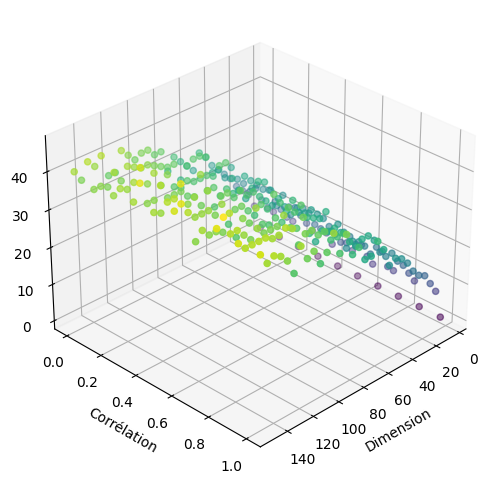

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler

import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from numpy.random import multivariate_normal

def create_covariance_matrix(dim, corr):
    if corr < -1 or corr > 1:
        raise ValueError("La corrélation doit être entre -1 et 1.")
    covariance_matrix = np.full((dim, dim), corr)  # La diagonale sera composée de 1 (variance pour une distribution normale standard)
    np.fill_diagonal(covariance_matrix, 1)
    return covariance_matrix

def generate_correlated_variables(n_samples, num_variables, correlation):
    mean = np.zeros(num_variables)  # Moyenne zéro pour une distribution normale standard
    covariance_matrix = create_covariance_matrix(num_variables, correlation)
    samples = np.random.multivariate_normal(mean, covariance_matrix, size=n_samples)  # Génère les échantillons à partir de la distribution normale multivariée
    df = pd.DataFrame(samples, columns=[f'Variable_{i+1}' for i in range(num_variables)])  # Convertit en DataFrame pandas
    return df

from sklearn.decomposition import PCA

# Fonction pour calculer le nombre de dimensions effectives à partir d'une chaîne de Markov
def compute_effective_dimensions(chain):
    num_samples, num_features = chain.shape
    chain_mean = np.mean(chain, axis=0)
    cov_matrix = np.cov(chain.T)
    _, eigvals, _ = np.linalg.svd(cov_matrix)
    cumulative_variance = np.cumsum(eigvals) / np.sum(eigvals)
    effective_dimensions = np.sum(cumulative_variance < 0.99) + 1  # Choisissez votre critère de seuil ici
    return effective_dimensions

# Paramètres pour la plage de corrélation et le nombre de dimensions
correlation_values = np.linspace(0, 1, 10)  # 10 valeurs de corrélation de 0 à 1
dimension_values = np.arange(5, 151, 5)  # Dimensions de 5 à 150, par pas de 5

# Préparer les données pour le graphique 3D
X = []  # Liste pour les dimensions
Y = []  # Liste pour les valeurs de corrélation
Z = []  # Liste pour les dimensions effectives

for dim in dimension_values:
    for corr in correlation_values:
        X.append(dim)
        Y.append(corr)
        # Paramètres
        n_samples = 10000  # Nombre d'échantillons
        num_variables = dim  # Nombre de variables
        correlation = corr  # Corrélation souhaitée

        # Générer les variables corrélées
        df = generate_correlated_variables(n_samples, num_variables, correlation)

        # Remplacer les valeurs NaN par 0
        df.fillna(0, inplace=True)

        # Liste des colonnes contenant du texte
        text_columns = df.select_dtypes(include=['object']).columns

        # Remplacement du texte par des valeurs numériques
        for column in text_columns:
            le = LabelEncoder()
            df[column] = le.fit_transform(df[column].astype(str))

        # Création d'un objet MinMaxScaler
        scaler = MinMaxScaler()

        # Normalisation des colonnes du DataFrame
        df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

        pca = PCA(n_components = df.shape[1])  # Choisissez le nombre de composantes principales souhaitées
        X_pca = pca.fit_transform(df)

        # Définir les paramètres de la chaîne de Markov
        num_samples = 1000  # Nombre d'échantillons à générer
        num_features = X_pca.shape[1]  # Nombre de caractéristiques

        # Initialiser la chaîne de Markov
        chain = np.zeros((num_samples, num_features))

        # Générer la chaîne de Markov
        for i in range(1, num_samples):
            # Échantillonner une nouvelle proposition de la distribution normale
            proposal = np.random.multivariate_normal(chain[i-1], np.eye(num_features))

            # Calculer les densités de probabilité des propositions actuelle et proposée
            current_density = np.exp(-np.sum((chain[i-1] - X_pca)**2) / 2)
            proposal_density = np.exp(-np.sum((proposal - X_pca)**2) / 2)

            # Accepter ou rejeter la proposition en utilisant le critère de Metropolis-Hastings
            acceptance_ratio = min(1, proposal_density / current_density)
            if np.random.rand() < acceptance_ratio:
                chain[i] = proposal
            else:
                chain[i] = chain[i-1]

        # Calculer le nombre de dimensions effectives
        effective_dimensions = compute_effective_dimensions(chain)

        Z.append(effective_dimensions)
        print(dim, corr, Z[-1])

# Création du graphe 3D avec une vue isométrique
fig = plt.figure(figsize=(12, 6))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(X, Y, Z, c=Z, cmap='viridis')
ax.set_xlabel('Dimension')
ax.set_ylabel('Corrélation')

# Définir la vue isométrique
ax.view_init(elev=30, azim=45)  # Angles choisis pour une vue isométrique standard

# Affichage du graphe
plt.show()

## Méthode avec le plus proche voisin (1) :

Impossible : Temps de calcul trop important

## Méthode avec le plus proche voisin (2) : Avec k = 30 | The Intrinsic Dimension of Images and Its Impact on Learning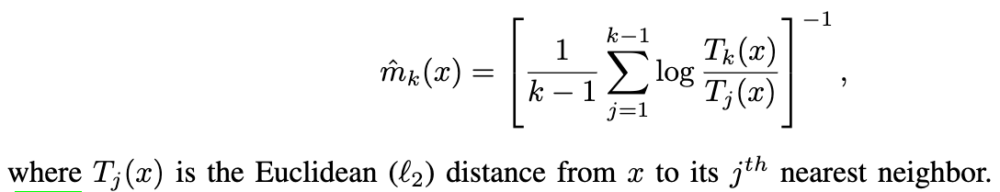

5 0.0 5
5 0.1 5
5 0.2 5
5 0.30000000000000004 5
5 0.4 5
5 0.5 5
5 0.6000000000000001 5
5 0.7000000000000001 5
5 0.8 5
5 0.9 5
5 0.91 5
5 0.92 5
5 0.93 5
5 0.9400000000000001 5
5 0.95 5
5 0.96 5
5 0.97 5
5 0.98 5
5 0.99 5
5 0.991 5
5 0.992 5
5 0.993 5
5 0.994 5
5 0.995 5
5 0.996 5
5 0.997 4
5 0.998 4
5 0.999 4
5 1.0 1
10 0.0 9
10 0.1 9
10 0.2 9
10 0.30000000000000004 9
10 0.4 9
10 0.5 9
10 0.6000000000000001 9
10 0.7000000000000001 9
10 0.8 9
10 0.9 9
10 0.91 9
10 0.92 9
10 0.93 9
10 0.9400000000000001 9
10 0.95 8
10 0.96 9
10 0.97 8
10 0.98 8
10 0.99 8
10 0.991 8
10 0.992 8
10 0.993 8
10 0.994 8
10 0.995 8
10 0.996 8
10 0.997 7
10 0.998 7
10 0.999 7
10 1.0 1
15 0.0 13
15 0.1 13
15 0.2 13
15 0.30000000000000004 13
15 0.4 13
15 0.5 13
15 0.6000000000000001 12
15 0.7000000000000001 12
15 0.8 12
15 0.9 12
15 0.91 12
15 0.92 12
15 0.93 11
15 0.9400000000000001 11
15 0.95 11
15 0.96 11
15 0.97 11
15 0.98 11
15 0.99 10
15 0.991 10
15 0.992 10
15 0.993 10
15 0.994 10
15 0.995 10
15 0.996 9
15 

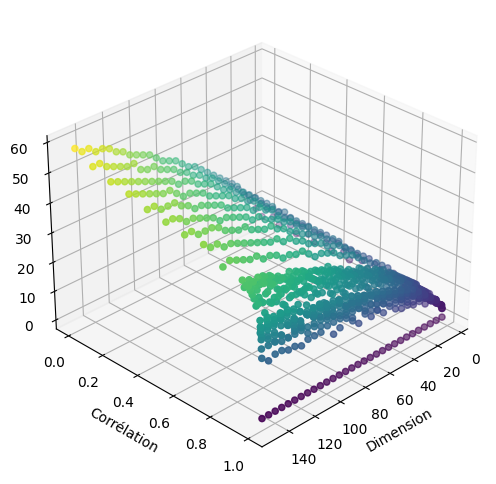

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler

import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from numpy.random import multivariate_normal

def create_covariance_matrix(dim, corr):
    if corr < -1 or corr > 1:
        raise ValueError("La corrélation doit être entre -1 et 1.")
    covariance_matrix = np.full((dim, dim), corr)  # La diagonale sera composée de 1 (variance pour une distribution normale standard)
    np.fill_diagonal(covariance_matrix, 1)
    return covariance_matrix

def generate_correlated_variables(n_samples, num_variables, correlation):
    mean = np.zeros(num_variables)  # Moyenne zéro pour une distribution normale standard
    covariance_matrix = create_covariance_matrix(num_variables, correlation)
    samples = np.random.multivariate_normal(mean, covariance_matrix, size=n_samples)  # Génère les échantillons à partir de la distribution normale multivariée
    df = pd.DataFrame(samples, columns=[f'Variable_{i+1}' for i in range(num_variables)])  # Convertit en DataFrame pandas
    return df

from sklearn.neighbors import NearestNeighbors
import random
import numpy as np

def Tj_x(distances, j):
    return distances[j]

# Paramètres pour la plage de corrélation et le nombre de dimensions
correlation_values = np.concatenate((np.linspace(0, 0.9, 10), np.linspace(0.91, 0.99, 9), np.linspace(0.991, 1, 10)))  # 29 valeurs de corrélation de 0 à 1
dimension_values = np.arange(5, 151, 5)  # Dimensions de 5 à 150, par pas de 5

# Préparer les données pour le graphique 3D
X = []  # Liste pour les dimensions
Y = []  # Liste pour les valeurs de corrélation
Z = []  # Liste pour les dimensions effectives

for dim in dimension_values:
    for corr in correlation_values:
        X.append(dim)
        Y.append(corr)
        # Paramètres
        n_samples = 10000  # Nombre d'échantillons
        num_variables = dim  # Nombre de variables
        correlation = corr  # Corrélation souhaitée

        # Générer les variables corrélées
        df = generate_correlated_variables(n_samples, num_variables, correlation)

        # Remplacer les valeurs NaN par 0
        df.fillna(0, inplace=True)

        # Liste des colonnes contenant du texte
        text_columns = df.select_dtypes(include=['object']).columns

        # Remplacement du texte par des valeurs numériques
        for column in text_columns:
            le = LabelEncoder()
            df[column] = le.fit_transform(df[column].astype(str))

        # Création d'un objet MinMaxScaler
        scaler = MinMaxScaler()

        # Normalisation des colonnes du DataFrame
        df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

        k = 30
        nbrs = NearestNeighbors(n_neighbors=k+1, metric='euclidean').fit(df.values)
        distances, _ = nbrs.kneighbors(df.values)

        somme = 0
        random_indices = random.sample(range(df.shape[0]), 500)
        for i in random_indices:
            mk_x = 0
            for j in range(1, k):
                a = np.log(Tj_x(distances[i], k) / Tj_x(distances[i], j))
                mk_x += a
            mk_x = (1 / (k-1) * mk_x) ** (-1)
            somme += (mk_x ** (-1))

        effective_dimensions = round(((1 / 500) * somme) ** (-1))

        Z.append(effective_dimensions)
        print(dim, corr, Z[-1])

# Création du graphe 3D avec une vue isométrique
fig = plt.figure(figsize=(12, 6))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(X, Y, Z, c=Z, cmap='viridis')
ax.set_xlabel('Dimension')
ax.set_ylabel('Corrélation')

# Définir la vue isométrique
ax.view_init(elev=30, azim=45)  # Angles choisis pour une vue isométrique standard

# Affichage du graphe
plt.show()

## Méthode avec le plus proche voisin (3) :

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler

import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from numpy.random import multivariate_normal

def create_covariance_matrix(dim, corr):
    if corr < -1 or corr > 1:
        raise ValueError("La corrélation doit être entre -1 et 1.")
    covariance_matrix = np.full((dim, dim), corr)  # La diagonale sera composée de 1 (variance pour une distribution normale standard)
    np.fill_diagonal(covariance_matrix, 1)
    return covariance_matrix

def generate_correlated_variables(n_samples, num_variables, correlation):
    mean = np.zeros(num_variables)  # Moyenne zéro pour une distribution normale standard
    covariance_matrix = create_covariance_matrix(num_variables, correlation)
    samples = np.random.multivariate_normal(mean, covariance_matrix, size=n_samples)  # Génère les échantillons à partir de la distribution normale multivariée
    df = pd.DataFrame(samples, columns=[f'Variable_{i+1}' for i in range(num_variables)])  # Convertit en DataFrame pandas
    return df

from sklearn.neighbors import NearestNeighbors
import random
import numpy as np

# Diviser les données en deux parties
def split_dataframe(dataframe):
    dataframe_1 = pd.DataFrame()
    dataframe_2 = pd.DataFrame()
    for column in dataframe.columns:
        unique_values = dataframe[column].nunique()  # Nombre de valeurs uniques dans la colonne
        if unique_values <= 2:  # Vérifier si le nombre de valeurs uniques est inférieur ou égal
            dataframe_1[column] = dataframe[column]
        else:
            dataframe_2[column] = dataframe[column]
    return dataframe_1, dataframe_2

def Tj_x(distances, j):
    return distances[j]

# Paramètres pour la plage de corrélation et le nombre de dimensions
correlation_values = np.concatenate((np.linspace(0, 0.9, 10), np.linspace(0.91, 0.99, 9), np.linspace(0.991, 1, 10)))  # 29 valeurs de corrélation de 0 à 1
dimension_values = np.arange(5, 151, 5)  # Dimensions de 5 à 150, par pas de 5

# Préparer les données pour le graphique 3D
X = []  # Liste pour les dimensions
Y = []  # Liste pour les valeurs de corrélation
Z = []  # Liste pour les dimensions effectives

for dim in dimension_values:
    for corr in correlation_values:
        X.append(dim)
        Y.append(corr)
        # Paramètres
        n_samples = 10000  # Nombre d'échantillons
        num_variables = dim  # Nombre de variables
        correlation = corr  # Corrélation souhaitée

        # Générer les variables corrélées
        df = generate_correlated_variables(n_samples, num_variables, correlation)

        # Remplacer les valeurs NaN par 0
        df.fillna(0, inplace=True)

        # Liste des colonnes contenant du texte
        text_columns = df.select_dtypes(include=['object']).columns

        # Remplacement du texte par des valeurs numériques
        for column in text_columns:
            le = LabelEncoder()
            df[column] = le.fit_transform(df[column].astype(str))

        # Création d'un objet MinMaxScaler
        scaler = MinMaxScaler()

        # Normalisation des colonnes du DataFrame
        df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

        binary_df = split_dataframe(df)[0]  # Sélectionner les colonnes binaires
        non_binary_df = split_dataframe(df)[1]  # Sélectionner les colonnes non binaires

        if binary_df.empty:
            effective_dimensions_1 = 0
        elif binary_df.shape[1] == 1:
            effective_dimensions_1 = 1
        else:
            # Calculer la matrice de covariance
            cov_matrix = np.cov(binary_df, rowvar=False)

            # Définir les options d'affichage pour la matrice de covariance
            np.set_printoptions(precision=4, suppress=True)

            # Décomposition en valeurs propres
            eigenvalues, eigenvectors = np.linalg.eig(cov_matrix)

            # Calculer la somme des valeurs propres
            total_variance = np.sum(eigenvalues)

            # Calculer les proportions de variance
            variance_ratios = eigenvalues / total_variance

            # Calculer le nombre de dimensions effectives
            effective_dimensions_1 = np.sum(variance_ratios > 0.01)  # Choisissez ici votre seuil approprié

        if non_binary_df.empty:
            effective_dimensions_1 = 0
        else:
            k = 30
            nbrs = NearestNeighbors(n_neighbors=k+1, metric='euclidean').fit(non_binary_df.values)
            distances, _ = nbrs.kneighbors(non_binary_df.values)

            somme = 0
            random_indices = random.sample(range(non_binary_df.shape[0]), 500)
            for i in random_indices:
                mk_x = 0
                for j in range(1, k):
                    a = np.log(Tj_x(distances[i], k) / Tj_x(distances[i], j))
                    mk_x += a
                mk_x = (1 / (k-1) * mk_x) ** (-1)
                somme += (mk_x ** (-1))

            effective_dimensions_2 = round(((1 / 500) * somme) ** (-1))

        effective_dimensions = round(effective_dimensions_1 * (binary_df.shape[1] / df.shape[1]) + effective_dimensions_2 * (non_binary_df.shape[1] / df.shape[1]))

        Z.append(effective_dimensions)
        print(dim, corr, Z[-1])

# Création du graphe 3D avec une vue isométrique
fig = plt.figure(figsize=(12, 6))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(X, Y, Z, c=Z, cmap='viridis')
ax.set_xlabel('Dimension')
ax.set_ylabel('Corrélation')

# Définir la vue isométrique
ax.view_init(elev=30, azim=45)  # Angles choisis pour une vue isométrique standard

# Affichage du graphe
plt.show()

Output hidden; open in https://colab.research.google.com to view.

# **Évaluation sur des distributions différentes indépendantes**

## Erreurs de corrélation :

5 0.0 -0.00587822490149989
5 0.1111111111111111 -0.011303838202459213
5 0.2222222222222222 -0.018830693226109252
5 0.3333333333333333 -0.026220842389487686
5 0.4444444444444444 -0.044415501966541426
5 0.5555555555555556 -0.047352405159867494
5 0.6666666666666666 -0.05671485379545771
5 0.7777777777777777 -0.05883334465864287
5 0.8888888888888888 -0.0698043545451763
5 1.0 -0.07869252030501028
10 0.0 -0.0022580250426006416
10 0.1111111111111111 -0.01105647584122682
10 0.2222222222222222 -0.02248670121474322
10 0.3333333333333333 -0.03022760159674792
10 0.4444444444444444 -0.04359861727676162
10 0.5555555555555556 -0.04390663383561033
10 0.6666666666666666 -0.051715383925963976
10 0.7777777777777777 -0.058673463307944984
10 0.8888888888888888 -0.06054438164717513
10 1.0 -0.06608482125142434
15 0.0 0.0019000398393126394
15 0.1111111111111111 -0.009928839500912362
15 0.2222222222222222 -0.020917195703337527
15 0.3333333333333333 -0.023304919578078453
15 0.4444444444444444 -0.0384915246777102

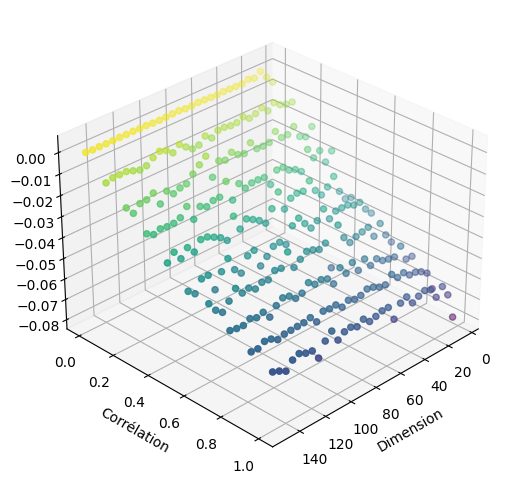

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler

import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from numpy.random import multivariate_normal
from scipy.stats import norm, expon, uniform

def create_covariance_matrix(dim, corr):
    if corr < -1 or corr > 1:
        raise ValueError("La corrélation doit être entre -1 et 1.")
    covariance_matrix = np.full((dim, dim), corr)  # La diagonale sera composée de 1 (variance pour une distribution normale standard)
    np.fill_diagonal(covariance_matrix, 1)
    return covariance_matrix

def generate_correlated_variables(n_samples, num_variables, correlation):
    mean = np.zeros(num_variables)  # Moyenne zéro pour une distribution normale standard
    covariance_matrix = create_covariance_matrix(num_variables, correlation)
    samples = np.random.multivariate_normal(mean, covariance_matrix, size=n_samples)  # Génère les échantillons à partir de la distribution normale multivariée
    df = pd.DataFrame(samples, columns=[f'Variable_{i+1}' for i in range(num_variables)])  # Convertit en DataFrame pandas
    for i in range(num_variables):  # Transformer les colonnes
        if i % 3 == 0:
            df.iloc[:, i] = expon.ppf(norm.cdf(df.iloc[:, i]))  # Transforme en données exponentielles
        elif i % 3 == 1:
            df.iloc[:, i] = uniform.ppf(norm.cdf(df.iloc[:, i]))  # Transforme en données uniformes
    return df

# Paramètres pour la plage de corrélation et le nombre de dimensions
correlation_values = np.linspace(0, 1, 10)  # 10 valeurs de corrélation de 0 à 1
dimension_values = np.arange(5, 151, 5)  # Dimensions de 5 à 150, par pas de 5

# Préparer les données pour le graphique 3D
X = []  # Liste pour les dimensions
Y = []  # Liste pour les valeurs de corrélation
Z = []  # Liste pour les erreurs de corrélation

for dim in dimension_values:
    for corr in correlation_values:
        X.append(dim)
        Y.append(corr)
        # Paramètres
        n_samples = 10000  # Nombre d'échantillons
        num_variables = dim  # Nombre de variables
        correlation = corr  # Corrélation souhaitée

        # Générer les variables corrélées
        df = generate_correlated_variables(n_samples, num_variables, correlation)

        # Remplacer les valeurs NaN par 0
        df.fillna(0, inplace=True)

        # Liste des colonnes contenant du texte
        text_columns = df.select_dtypes(include=['object']).columns

        # Remplacement du texte par des valeurs numériques
        for column in text_columns:
            le = LabelEncoder()
            df[column] = le.fit_transform(df[column].astype(str))

        # Création d'un objet MinMaxScaler
        scaler = MinMaxScaler()

        # Normalisation des colonnes du DataFrame
        df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

        # Calculer la matrice de corrélation et obtenir les valeurs triangulaires supérieures en excluant la diagonale
        corr_matrix = df.corr().values
        upper_triangle_indices = np.triu_indices_from(corr_matrix, k=1)
        upper_triangle_values = corr_matrix[upper_triangle_indices]
        mean_correlation = np.mean(upper_triangle_values)

        # Calculer l'erreur de corrélation
        erreur_correlation = mean_correlation - corr

        Z.append(erreur_correlation)
        print(dim, corr, Z[-1])

# Création du graphe 3D avec une vue isométrique
fig = plt.figure(figsize=(12, 6))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(X, Y, Z, c=Z, cmap='viridis')
ax.set_xlabel('Dimension')
ax.set_ylabel('Corrélation')

# Définir la vue isométrique
ax.view_init(elev=30, azim=45)  # Angles choisis pour une vue isométrique standard

# Affichage du graphe
plt.show()

## Méthode avec le ratio de variance :

5 0.0 5
5 0.1111111111111111 5
5 0.2222222222222222 5
5 0.3333333333333333 5
5 0.4444444444444444 5
5 0.5555555555555556 5
5 0.6666666666666666 5
5 0.7777777777777777 5
5 0.8888888888888888 4
5 1.0 2
10 0.0 10
10 0.1111111111111111 10
10 0.2222222222222222 10
10 0.3333333333333333 10
10 0.4444444444444444 10
10 0.5555555555555556 10
10 0.6666666666666666 9
10 0.7777777777777777 6
10 0.8888888888888888 5
10 1.0 2
15 0.0 15
15 0.1111111111111111 15
15 0.2222222222222222 15
15 0.3333333333333333 15
15 0.4444444444444444 14
15 0.5555555555555556 13
15 0.6666666666666666 9
15 0.7777777777777777 7
15 0.8888888888888888 6
15 1.0 2
20 0.0 19
20 0.1111111111111111 19
20 0.2222222222222222 19
20 0.3333333333333333 17
20 0.4444444444444444 14
20 0.5555555555555556 11
20 0.6666666666666666 8
20 0.7777777777777777 8
20 0.8888888888888888 8
20 1.0 2
25 0.0 21
25 0.1111111111111111 23
25 0.2222222222222222 20
25 0.3333333333333333 18
25 0.4444444444444444 14
25 0.5555555555555556 10
25 0.666666666666

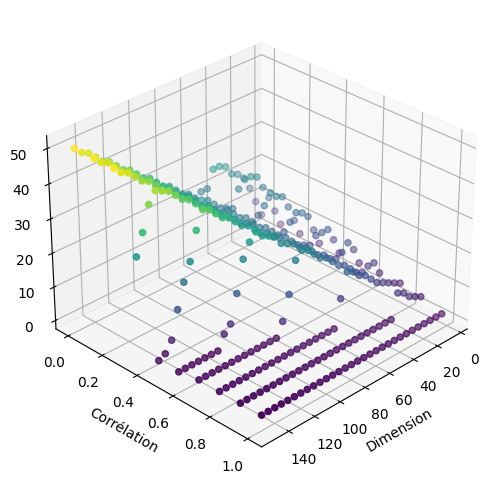

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler

import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from numpy.random import multivariate_normal
from scipy.stats import norm, expon, uniform

def create_covariance_matrix(dim, corr):
    if corr < -1 or corr > 1:
        raise ValueError("La corrélation doit être entre -1 et 1.")
    covariance_matrix = np.full((dim, dim), corr)  # La diagonale sera composée de 1 (variance pour une distribution normale standard)
    np.fill_diagonal(covariance_matrix, 1)
    return covariance_matrix

def generate_correlated_variables(n_samples, num_variables, correlation):
    mean = np.zeros(num_variables)  # Moyenne zéro pour une distribution normale standard
    covariance_matrix = create_covariance_matrix(num_variables, correlation)
    samples = np.random.multivariate_normal(mean, covariance_matrix, size=n_samples)  # Génère les échantillons à partir de la distribution normale multivariée
    df = pd.DataFrame(samples, columns=[f'Variable_{i+1}' for i in range(num_variables)])  # Convertit en DataFrame pandas
    for i in range(num_variables):  # Transformer les colonnes
        if i % 3 == 0:
            df.iloc[:, i] = expon.ppf(norm.cdf(df.iloc[:, i]))  # Transforme en données exponentielles
        elif i % 3 == 1:
            df.iloc[:, i] = uniform.ppf(norm.cdf(df.iloc[:, i]))  # Transforme en données uniformes
    return df

# Paramètres pour la plage de corrélation et le nombre de dimensions
correlation_values = np.linspace(0, 1, 10)  # 10 valeurs de corrélation de 0 à 1
dimension_values = np.arange(5, 151, 5)  # Dimensions de 5 à 150, par pas de 5

# Préparer les données pour le graphique 3D
X = []  # Liste pour les dimensions
Y = []  # Liste pour les valeurs de corrélation
Z = []  # Liste pour les dimensions effectives

for dim in dimension_values:
    for corr in correlation_values:
        X.append(dim)
        Y.append(corr)
        # Paramètres
        n_samples = 10000  # Nombre d'échantillons
        num_variables = dim  # Nombre de variables
        correlation = corr  # Corrélation souhaitée

        # Générer les variables corrélées
        df = generate_correlated_variables(n_samples, num_variables, correlation)

        # Remplacer les valeurs NaN par 0
        df.fillna(0, inplace=True)

        # Liste des colonnes contenant du texte
        text_columns = df.select_dtypes(include=['object']).columns

        # Remplacement du texte par des valeurs numériques
        for column in text_columns:
            le = LabelEncoder()
            df[column] = le.fit_transform(df[column].astype(str))

        # Création d'un objet MinMaxScaler
        scaler = MinMaxScaler()

        # Normalisation des colonnes du DataFrame
        df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

        # Calculer la matrice de covariance
        cov_matrix = np.cov(df, rowvar=False)

        # Définir les options d'affichage pour la matrice de covariance
        np.set_printoptions(precision=4, suppress=True)

        # Décomposition en valeurs propres
        eigenvalues, eigenvectors = np.linalg.eig(cov_matrix)

        # Calculer la somme des valeurs propres
        total_variance = np.sum(eigenvalues)

        # Calculer les proportions de variance
        variance_ratios = eigenvalues / total_variance

        # Calculer le nombre de dimensions effectives
        effective_dimensions = np.sum(variance_ratios > 0.01)  # Choisissez ici votre seuil approprié

        Z.append(effective_dimensions)
        print(dim, corr, Z[-1])

# Création du graphe 3D avec une vue isométrique
fig = plt.figure(figsize=(12, 6))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(X, Y, Z, c=Z, cmap='viridis')
ax.set_xlabel('Dimension')
ax.set_ylabel('Corrélation')

# Définir la vue isométrique
ax.view_init(elev=30, azim=45)  # Angles choisis pour une vue isométrique standard

# Affichage du graphe
plt.show()

## Méthode avec n1 :

5 0.0 4
5 0.1111111111111111 4
5 0.2222222222222222 3
5 0.3333333333333333 3
5 0.4444444444444444 3
5 0.5555555555555556 3
5 0.6666666666666666 2
5 0.7777777777777777 2
5 0.8888888888888888 2
5 1.0 1
10 0.0 6
10 0.1111111111111111 7
10 0.2222222222222222 6
10 0.3333333333333333 5
10 0.4444444444444444 5
10 0.5555555555555556 4
10 0.6666666666666666 3
10 0.7777777777777777 2
10 0.8888888888888888 2
10 1.0 (1+0j)
15 0.0 10
15 0.1111111111111111 10


<ipython-input-1-07c8da0d48a2>:88: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(result)


15 0.2222222222222222 9
15 0.3333333333333333 8
15 0.4444444444444444 6
15 0.5555555555555556 5
15 0.6666666666666666 4
15 0.7777777777777777 3
15 0.8888888888888888 2
15 1.0 (1+0j)
20 0.0 14


<ipython-input-1-07c8da0d48a2>:88: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(result)


20 0.1111111111111111 13
20 0.2222222222222222 11
20 0.3333333333333333 10
20 0.4444444444444444 8
20 0.5555555555555556 6
20 0.6666666666666666 4
20 0.7777777777777777 3
20 0.8888888888888888 2


<ipython-input-1-07c8da0d48a2>:88: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(result)


20 1.0 (1+0j)
25 0.0 17
25 0.1111111111111111 16
25 0.2222222222222222 14
25 0.3333333333333333 11
25 0.4444444444444444 9
25 0.5555555555555556 7
25 0.6666666666666666 5
25 0.7777777777777777 3
25 0.8888888888888888 2
25 1.0 (1+0j)
30 0.0 21


<ipython-input-1-07c8da0d48a2>:88: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(result)


30 0.1111111111111111 19
30 0.2222222222222222 17
30 0.3333333333333333 13
30 0.4444444444444444 10
30 0.5555555555555556 8
30 0.6666666666666666 5
30 0.7777777777777777 4
30 0.8888888888888888 2
30 1.0 (1-0j)


<ipython-input-1-07c8da0d48a2>:88: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(result)


35 0.0 24
35 0.1111111111111111 22
35 0.2222222222222222 18
35 0.3333333333333333 15
35 0.4444444444444444 11
35 0.5555555555555556 8
35 0.6666666666666666 6
35 0.7777777777777777 4
35 0.8888888888888888 2
35 1.0 (1+0j)


<ipython-input-1-07c8da0d48a2>:88: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(result)


40 0.0 27
40 0.1111111111111111 25
40 0.2222222222222222 21
40 0.3333333333333333 17
40 0.4444444444444444 12
40 0.5555555555555556 9
40 0.6666666666666666 6
40 0.7777777777777777 4
40 0.8888888888888888 2
40 1.0 (1-0j)


<ipython-input-1-07c8da0d48a2>:88: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(result)


45 0.0 31
45 0.1111111111111111 28
45 0.2222222222222222 23
45 0.3333333333333333 18
45 0.4444444444444444 13
45 0.5555555555555556 9
45 0.6666666666666666 6
45 0.7777777777777777 4
45 0.8888888888888888 2


<ipython-input-1-07c8da0d48a2>:88: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(result)


45 1.0 (1-0j)
50 0.0 34
50 0.1111111111111111 30
50 0.2222222222222222 25
50 0.3333333333333333 19
50 0.4444444444444444 14
50 0.5555555555555556 10
50 0.6666666666666666 7
50 0.7777777777777777 4
50 0.8888888888888888 2


<ipython-input-1-07c8da0d48a2>:88: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(result)


50 1.0 (1+0j)
55 0.0 38
55 0.1111111111111111 34
55 0.2222222222222222 27
55 0.3333333333333333 20
55 0.4444444444444444 15
55 0.5555555555555556 11
55 0.6666666666666666 7
55 0.7777777777777777 4
55 0.8888888888888888 2
55 1.0 (1-0j)


<ipython-input-1-07c8da0d48a2>:88: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(result)


60 0.0 41
60 0.1111111111111111 36
60 0.2222222222222222 29
60 0.3333333333333333 22
60 0.4444444444444444 16
60 0.5555555555555556 11
60 0.6666666666666666 7
60 0.7777777777777777 4
60 0.8888888888888888 2


<ipython-input-1-07c8da0d48a2>:88: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(result)


60 1.0 (1+0j)
65 0.0 45
65 0.1111111111111111 40
65 0.2222222222222222 32
65 0.3333333333333333 23
65 0.4444444444444444 17
65 0.5555555555555556 11
65 0.6666666666666666 7
65 0.7777777777777777 4
65 0.8888888888888888 2


<ipython-input-1-07c8da0d48a2>:88: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(result)


65 1.0 (1+0j)
70 0.0 48
70 0.1111111111111111 43
70 0.2222222222222222 34
70 0.3333333333333333 25
70 0.4444444444444444 17
70 0.5555555555555556 12
70 0.6666666666666666 8
70 0.7777777777777777 5
70 0.8888888888888888 2


<ipython-input-1-07c8da0d48a2>:88: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(result)


70 1.0 (1+0j)
75 0.0 52
75 0.1111111111111111 45
75 0.2222222222222222 35
75 0.3333333333333333 26
75 0.4444444444444444 18
75 0.5555555555555556 12
75 0.6666666666666666 8
75 0.7777777777777777 4
75 0.8888888888888888 2


<ipython-input-1-07c8da0d48a2>:88: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(result)


75 1.0 (1-0j)
80 0.0 55
80 0.1111111111111111 47
80 0.2222222222222222 37
80 0.3333333333333333 27
80 0.4444444444444444 19
80 0.5555555555555556 13
80 0.6666666666666666 8
80 0.7777777777777777 5
80 0.8888888888888888 3


<ipython-input-1-07c8da0d48a2>:88: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(result)


80 1.0 (1+0j)
85 0.0 58
85 0.1111111111111111 51
85 0.2222222222222222 40
85 0.3333333333333333 28
85 0.4444444444444444 19
85 0.5555555555555556 13
85 0.6666666666666666 8
85 0.7777777777777777 5
85 0.8888888888888888 2


<ipython-input-1-07c8da0d48a2>:88: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(result)


85 1.0 (1-0j)
90 0.0 62
90 0.1111111111111111 53
90 0.2222222222222222 42
90 0.3333333333333333 31
90 0.4444444444444444 20
90 0.5555555555555556 14
90 0.6666666666666666 8
90 0.7777777777777777 5
90 0.8888888888888888 3


<ipython-input-1-07c8da0d48a2>:88: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(result)


90 1.0 (1+0j)
95 0.0 66
95 0.1111111111111111 57
95 0.2222222222222222 42
95 0.3333333333333333 31
95 0.4444444444444444 21
95 0.5555555555555556 14
95 0.6666666666666666 8
95 0.7777777777777777 5
95 0.8888888888888888 3


<ipython-input-1-07c8da0d48a2>:88: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(result)


95 1.0 (1+0j)
100 0.0 69
100 0.1111111111111111 59
100 0.2222222222222222 45
100 0.3333333333333333 32
100 0.4444444444444444 22
100 0.5555555555555556 14
100 0.6666666666666666 9
100 0.7777777777777777 5
100 0.8888888888888888 3


<ipython-input-1-07c8da0d48a2>:88: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(result)


100 1.0 (1-0j)
105 0.0 73
105 0.1111111111111111 62
105 0.2222222222222222 47
105 0.3333333333333333 34
105 0.4444444444444444 23
105 0.5555555555555556 14
105 0.6666666666666666 9
105 0.7777777777777777 5
105 0.8888888888888888 3


<ipython-input-1-07c8da0d48a2>:88: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(result)


105 1.0 (1+0j)
110 0.0 76
110 0.1111111111111111 64
110 0.2222222222222222 49
110 0.3333333333333333 34
110 0.4444444444444444 23
110 0.5555555555555556 14
110 0.6666666666666666 9
110 0.7777777777777777 5
110 0.8888888888888888 3


<ipython-input-1-07c8da0d48a2>:88: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(result)


110 1.0 (1+0j)
115 0.0 81
115 0.1111111111111111 67
115 0.2222222222222222 50
115 0.3333333333333333 35
115 0.4444444444444444 24
115 0.5555555555555556 15
115 0.6666666666666666 9
115 0.7777777777777777 5
115 0.8888888888888888 3


<ipython-input-1-07c8da0d48a2>:88: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(result)


115 1.0 (1+0j)
120 0.0 83
120 0.1111111111111111 71
120 0.2222222222222222 53
120 0.3333333333333333 36
120 0.4444444444444444 24
120 0.5555555555555556 15
120 0.6666666666666666 9
120 0.7777777777777777 5
120 0.8888888888888888 3


<ipython-input-1-07c8da0d48a2>:88: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(result)


120 1.0 (1+0j)
125 0.0 87
125 0.1111111111111111 73
125 0.2222222222222222 54
125 0.3333333333333333 37
125 0.4444444444444444 25
125 0.5555555555555556 16
125 0.6666666666666666 9
125 0.7777777777777777 5
125 0.8888888888888888 3


<ipython-input-1-07c8da0d48a2>:88: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(result)


125 1.0 (1-0j)
130 0.0 90
130 0.1111111111111111 75
130 0.2222222222222222 56
130 0.3333333333333333 40
130 0.4444444444444444 25
130 0.5555555555555556 16
130 0.6666666666666666 9
130 0.7777777777777777 5
130 0.8888888888888888 3


<ipython-input-1-07c8da0d48a2>:88: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(result)


130 1.0 (1-0j)
135 0.0 92
135 0.1111111111111111 78
135 0.2222222222222222 58
135 0.3333333333333333 40
135 0.4444444444444444 26
135 0.5555555555555556 16
135 0.6666666666666666 10
135 0.7777777777777777 5
135 0.8888888888888888 3


<ipython-input-1-07c8da0d48a2>:88: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(result)


135 1.0 (1-0j)
140 0.0 95
140 0.1111111111111111 80
140 0.2222222222222222 59
140 0.3333333333333333 41
140 0.4444444444444444 27
140 0.5555555555555556 17
140 0.6666666666666666 10
140 0.7777777777777777 5
140 0.8888888888888888 3


<ipython-input-1-07c8da0d48a2>:88: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(result)


140 1.0 (1+0j)
145 0.0 99
145 0.1111111111111111 84
145 0.2222222222222222 61
145 0.3333333333333333 41
145 0.4444444444444444 27
145 0.5555555555555556 18
145 0.6666666666666666 9
145 0.7777777777777777 5
145 0.8888888888888888 3


<ipython-input-1-07c8da0d48a2>:88: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(result)


145 1.0 (1+0j)
150 0.0 103
150 0.1111111111111111 87
150 0.2222222222222222 62
150 0.3333333333333333 42
150 0.4444444444444444 28
150 0.5555555555555556 17
150 0.6666666666666666 10
150 0.7777777777777777 5
150 0.8888888888888888 3


<ipython-input-1-07c8da0d48a2>:88: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(result)
/usr/local/lib/python3.10/dist-packages/matplotlib/axes/_axes.py:4411: ComplexWarning: Casting complex values to real discards the imaginary part
  c = np.asanyarray(c, dtype=float)
/usr/local/lib/python3.10/dist-packages/matplotlib/cbook/__init__.py:1335: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)
/usr/local/lib/python3.10/dist-packages/matplotlib/collections.py:551: ComplexWarning: Casting complex values to real discards the imaginary part
  (np.asanyarray(self.convert_xunits(offsets[:, 0]), float),
/usr/local/lib/python3.10/dist-packages/matplotlib/collections.py:552: ComplexWarning: Casting complex values to real discards the imaginary part
  np.asanyarray(self.convert_yunits(

150 1.0 (1+0j)


/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:389: ComplexWarning: Casting complex values to real discards the imaginary part
  c = tuple(map(float, c))


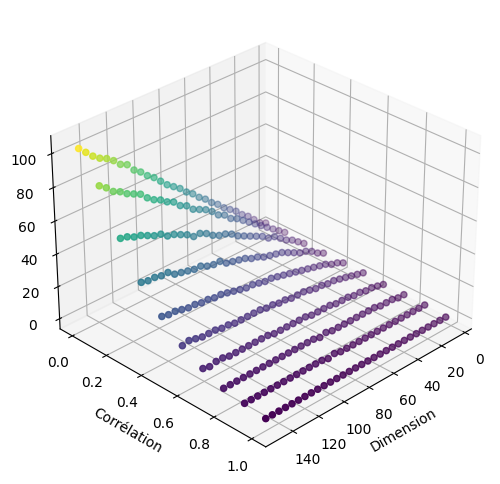

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler

import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from numpy.random import multivariate_normal
from scipy.stats import norm, expon, uniform

def create_covariance_matrix(dim, corr):
    if corr < -1 or corr > 1:
        raise ValueError("La corrélation doit être entre -1 et 1.")
    covariance_matrix = np.full((dim, dim), corr)  # La diagonale sera composée de 1 (variance pour une distribution normale standard)
    np.fill_diagonal(covariance_matrix, 1)
    return covariance_matrix

def generate_correlated_variables(n_samples, num_variables, correlation):
    mean = np.zeros(num_variables)  # Moyenne zéro pour une distribution normale standard
    covariance_matrix = create_covariance_matrix(num_variables, correlation)
    samples = np.random.multivariate_normal(mean, covariance_matrix, size=n_samples)  # Génère les échantillons à partir de la distribution normale multivariée
    df = pd.DataFrame(samples, columns=[f'Variable_{i+1}' for i in range(num_variables)])  # Convertit en DataFrame pandas
    for i in range(num_variables):  # Transformer les colonnes
        if i % 3 == 0:
            df.iloc[:, i] = expon.ppf(norm.cdf(df.iloc[:, i]))  # Transforme en données exponentielles
        elif i % 3 == 1:
            df.iloc[:, i] = uniform.ppf(norm.cdf(df.iloc[:, i]))  # Transforme en données uniformes
    return df

# Paramètres pour la plage de corrélation et le nombre de dimensions
correlation_values = np.linspace(0, 1, 10)  # 10 valeurs de corrélation de 0 à 1
dimension_values = np.arange(5, 151, 5)  # Dimensions de 5 à 150, par pas de 5

# Préparer les données pour le graphique 3D
X = []  # Liste pour les dimensions
Y = []  # Liste pour les valeurs de corrélation
Z = []  # Liste pour les dimensions effectives

for dim in dimension_values:
    for corr in correlation_values:
        X.append(dim)
        Y.append(corr)
        # Paramètres
        n_samples = 10000  # Nombre d'échantillons
        num_variables = dim  # Nombre de variables
        correlation = corr  # Corrélation souhaitée

        # Générer les variables corrélées
        df = generate_correlated_variables(n_samples, num_variables, correlation)

        # Remplacer les valeurs NaN par 0
        df.fillna(0, inplace=True)

        # Liste des colonnes contenant du texte
        text_columns = df.select_dtypes(include=['object']).columns

        # Remplacement du texte par des valeurs numériques
        for column in text_columns:
            le = LabelEncoder()
            df[column] = le.fit_transform(df[column].astype(str))

        # Création d'un objet MinMaxScaler
        scaler = MinMaxScaler()

        # Normalisation des colonnes du DataFrame
        df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

        # Calculer la matrice de covariance
        cov_matrix = np.cov(df, rowvar=False)

        # Définir les options d'affichage pour la matrice de covariance
        np.set_printoptions(precision=4, suppress=True)

        # Décomposition en valeurs propres
        eigenvalues, eigenvectors = np.linalg.eig(cov_matrix)

        # Calcul de la somme des valeurs propres
        sum_eigenvalues = np.sum(eigenvalues)

        result = 1
        for eigenvalue in eigenvalues:
            if eigenvalue < 0 or sum_eigenvalues <= 0:
                continue  # Skip this iteration if the values are invalid
            result *= (eigenvalue / sum_eigenvalues) ** (-eigenvalue / sum_eigenvalues)

        # Calculer le nombre de dimensions effectives
        effective_dimensions = round(result)

        Z.append(effective_dimensions)
        print(dim, corr, Z[-1])

# Création du graphe 3D avec une vue isométrique
fig = plt.figure(figsize=(12, 6))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(X, Y, Z, c=Z, cmap='viridis')
ax.set_xlabel('Dimension')
ax.set_ylabel('Corrélation')

# Définir la vue isométrique
ax.view_init(elev=30, azim=45)  # Angles choisis pour une vue isométrique standard

# Affichage du graphe
plt.show()

## Méthode avec n2 :

5 0.0 3
5 0.1111111111111111 3
5 0.2222222222222222 3
5 0.3333333333333333 3
5 0.4444444444444444 2
5 0.5555555555555556 2
5 0.6666666666666666 2
5 0.7777777777777777 1
5 0.8888888888888888 1
5 1.0 (1+0j)
10 0.0 5


<ipython-input-6-ccb0ef4cbc5f>:87: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n2)


10 0.1111111111111111 5
10 0.2222222222222222 5
10 0.3333333333333333 4
10 0.4444444444444444 3
10 0.5555555555555556 2
10 0.6666666666666666 2
10 0.7777777777777777 2
10 0.8888888888888888 1
10 1.0 (1+0j)
15 0.0 9
15 0.1111111111111111 8


<ipython-input-6-ccb0ef4cbc5f>:87: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n2)


15 0.2222222222222222 6
15 0.3333333333333333 5
15 0.4444444444444444 4
15 0.5555555555555556 3
15 0.6666666666666666 2
15 0.7777777777777777 2
15 0.8888888888888888 1
15 1.0 (1+0j)


<ipython-input-6-ccb0ef4cbc5f>:87: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n2)


20 0.0 11
20 0.1111111111111111 11
20 0.2222222222222222 8
20 0.3333333333333333 6
20 0.4444444444444444 4
20 0.5555555555555556 3
20 0.6666666666666666 2
20 0.7777777777777777 2
20 0.8888888888888888 1
20 1.0 (1+0j)


<ipython-input-6-ccb0ef4cbc5f>:87: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n2)


25 0.0 14
25 0.1111111111111111 12
25 0.2222222222222222 9
25 0.3333333333333333 6
25 0.4444444444444444 4
25 0.5555555555555556 3
25 0.6666666666666666 2
25 0.7777777777777777 2
25 0.8888888888888888 1
25 1.0 (1+0j)


<ipython-input-6-ccb0ef4cbc5f>:87: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n2)


30 0.0 16
30 0.1111111111111111 14
30 0.2222222222222222 10
30 0.3333333333333333 7
30 0.4444444444444444 4
30 0.5555555555555556 3
30 0.6666666666666666 2
30 0.7777777777777777 2
30 0.8888888888888888 1
30 1.0 (1-0j)


<ipython-input-6-ccb0ef4cbc5f>:87: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n2)


35 0.0 20
35 0.1111111111111111 16
35 0.2222222222222222 11
35 0.3333333333333333 7
35 0.4444444444444444 5
35 0.5555555555555556 3
35 0.6666666666666666 2
35 0.7777777777777777 2
35 0.8888888888888888 1


<ipython-input-6-ccb0ef4cbc5f>:87: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n2)


35 1.0 (1+0j)
40 0.0 22
40 0.1111111111111111 18
40 0.2222222222222222 11
40 0.3333333333333333 7
40 0.4444444444444444 5
40 0.5555555555555556 3
40 0.6666666666666666 2
40 0.7777777777777777 2
40 0.8888888888888888 1


<ipython-input-6-ccb0ef4cbc5f>:87: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n2)


40 1.0 (1-0j)
45 0.0 25
45 0.1111111111111111 19
45 0.2222222222222222 12
45 0.3333333333333333 7
45 0.4444444444444444 5
45 0.5555555555555556 3
45 0.6666666666666666 2
45 0.7777777777777777 2
45 0.8888888888888888 1


<ipython-input-6-ccb0ef4cbc5f>:87: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n2)


45 1.0 (1+0j)
50 0.0 28
50 0.1111111111111111 22
50 0.2222222222222222 13
50 0.3333333333333333 8
50 0.4444444444444444 5
50 0.5555555555555556 3
50 0.6666666666666666 2
50 0.7777777777777777 2
50 0.8888888888888888 1


<ipython-input-6-ccb0ef4cbc5f>:87: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n2)


50 1.0 (1+0j)
55 0.0 31
55 0.1111111111111111 23
55 0.2222222222222222 13
55 0.3333333333333333 8
55 0.4444444444444444 5
55 0.5555555555555556 3
55 0.6666666666666666 2
55 0.7777777777777777 2
55 0.8888888888888888 1
55 1.0 (1+0j)


<ipython-input-6-ccb0ef4cbc5f>:87: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n2)


60 0.0 33
60 0.1111111111111111 25
60 0.2222222222222222 14
60 0.3333333333333333 8
60 0.4444444444444444 5
60 0.5555555555555556 3
60 0.6666666666666666 2
60 0.7777777777777777 2
60 0.8888888888888888 1
60 1.0 (1-0j)


<ipython-input-6-ccb0ef4cbc5f>:87: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n2)


65 0.0 37
65 0.1111111111111111 26
65 0.2222222222222222 14
65 0.3333333333333333 8
65 0.4444444444444444 5
65 0.5555555555555556 3
65 0.6666666666666666 2
65 0.7777777777777777 2
65 0.8888888888888888 1


<ipython-input-6-ccb0ef4cbc5f>:87: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n2)


65 1.0 (1+0j)
70 0.0 38
70 0.1111111111111111 27
70 0.2222222222222222 14
70 0.3333333333333333 8
70 0.4444444444444444 5
70 0.5555555555555556 3
70 0.6666666666666666 2
70 0.7777777777777777 2
70 0.8888888888888888 1


<ipython-input-6-ccb0ef4cbc5f>:87: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n2)


70 1.0 (1-0j)
75 0.0 42
75 0.1111111111111111 29
75 0.2222222222222222 15
75 0.3333333333333333 8
75 0.4444444444444444 5
75 0.5555555555555556 3
75 0.6666666666666666 2
75 0.7777777777777777 2
75 0.8888888888888888 1


<ipython-input-6-ccb0ef4cbc5f>:87: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n2)


75 1.0 (1-0j)
80 0.0 44
80 0.1111111111111111 30
80 0.2222222222222222 15
80 0.3333333333333333 8
80 0.4444444444444444 5
80 0.5555555555555556 3
80 0.6666666666666666 2
80 0.7777777777777777 2
80 0.8888888888888888 1


<ipython-input-6-ccb0ef4cbc5f>:87: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n2)


80 1.0 (1+0j)
85 0.0 47
85 0.1111111111111111 31
85 0.2222222222222222 15
85 0.3333333333333333 8
85 0.4444444444444444 5
85 0.5555555555555556 3
85 0.6666666666666666 2
85 0.7777777777777777 2
85 0.8888888888888888 1


<ipython-input-6-ccb0ef4cbc5f>:87: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n2)


85 1.0 (1+0j)
90 0.0 51
90 0.1111111111111111 32
90 0.2222222222222222 16
90 0.3333333333333333 8
90 0.4444444444444444 5
90 0.5555555555555556 3
90 0.6666666666666666 2
90 0.7777777777777777 2
90 0.8888888888888888 1


<ipython-input-6-ccb0ef4cbc5f>:87: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n2)


90 1.0 (1+0j)
95 0.0 53
95 0.1111111111111111 33
95 0.2222222222222222 16
95 0.3333333333333333 9
95 0.4444444444444444 5
95 0.5555555555555556 3
95 0.6666666666666666 2
95 0.7777777777777777 2
95 0.8888888888888888 1


<ipython-input-6-ccb0ef4cbc5f>:87: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n2)


95 1.0 (1+0j)
100 0.0 55
100 0.1111111111111111 35
100 0.2222222222222222 16
100 0.3333333333333333 9
100 0.4444444444444444 5
100 0.5555555555555556 3
100 0.6666666666666666 2
100 0.7777777777777777 2
100 0.8888888888888888 1


<ipython-input-6-ccb0ef4cbc5f>:87: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n2)


100 1.0 (1-0j)
105 0.0 58
105 0.1111111111111111 35
105 0.2222222222222222 17
105 0.3333333333333333 9
105 0.4444444444444444 5
105 0.5555555555555556 3
105 0.6666666666666666 2
105 0.7777777777777777 2
105 0.8888888888888888 1


<ipython-input-6-ccb0ef4cbc5f>:87: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n2)


105 1.0 (1-0j)
110 0.0 61
110 0.1111111111111111 37
110 0.2222222222222222 16
110 0.3333333333333333 8
110 0.4444444444444444 5
110 0.5555555555555556 3
110 0.6666666666666666 2
110 0.7777777777777777 2
110 0.8888888888888888 1


<ipython-input-6-ccb0ef4cbc5f>:87: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n2)


110 1.0 (1+0j)
115 0.0 64
115 0.1111111111111111 37
115 0.2222222222222222 16
115 0.3333333333333333 9
115 0.4444444444444444 5
115 0.5555555555555556 3
115 0.6666666666666666 2
115 0.7777777777777777 2
115 0.8888888888888888 1


<ipython-input-6-ccb0ef4cbc5f>:87: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n2)


115 1.0 (1+0j)
120 0.0 67
120 0.1111111111111111 39
120 0.2222222222222222 17
120 0.3333333333333333 9
120 0.4444444444444444 5
120 0.5555555555555556 3
120 0.6666666666666666 2
120 0.7777777777777777 2
120 0.8888888888888888 1


<ipython-input-6-ccb0ef4cbc5f>:87: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n2)


120 1.0 (1+0j)
125 0.0 70
125 0.1111111111111111 39
125 0.2222222222222222 17
125 0.3333333333333333 8
125 0.4444444444444444 5
125 0.5555555555555556 4
125 0.6666666666666666 2
125 0.7777777777777777 2
125 0.8888888888888888 1


<ipython-input-6-ccb0ef4cbc5f>:87: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n2)


125 1.0 (1-0j)
130 0.0 72
130 0.1111111111111111 40
130 0.2222222222222222 17
130 0.3333333333333333 9
130 0.4444444444444444 5
130 0.5555555555555556 3
130 0.6666666666666666 2
130 0.7777777777777777 2
130 0.8888888888888888 1


<ipython-input-6-ccb0ef4cbc5f>:87: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n2)


130 1.0 (1-0j)
135 0.0 75
135 0.1111111111111111 41
135 0.2222222222222222 18
135 0.3333333333333333 9
135 0.4444444444444444 5
135 0.5555555555555556 3
135 0.6666666666666666 2
135 0.7777777777777777 2
135 0.8888888888888888 1


<ipython-input-6-ccb0ef4cbc5f>:87: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n2)


135 1.0 (1-0j)
140 0.0 78
140 0.1111111111111111 41
140 0.2222222222222222 18
140 0.3333333333333333 9
140 0.4444444444444444 5
140 0.5555555555555556 3
140 0.6666666666666666 2
140 0.7777777777777777 2
140 0.8888888888888888 1


<ipython-input-6-ccb0ef4cbc5f>:87: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n2)


140 1.0 (1+0j)
145 0.0 80
145 0.1111111111111111 43
145 0.2222222222222222 18
145 0.3333333333333333 9
145 0.4444444444444444 5
145 0.5555555555555556 3
145 0.6666666666666666 2
145 0.7777777777777777 2
145 0.8888888888888888 1


<ipython-input-6-ccb0ef4cbc5f>:87: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n2)


145 1.0 (1-0j)
150 0.0 84
150 0.1111111111111111 43
150 0.2222222222222222 18
150 0.3333333333333333 9
150 0.4444444444444444 5
150 0.5555555555555556 3
150 0.6666666666666666 2
150 0.7777777777777777 2
150 0.8888888888888888 1


<ipython-input-6-ccb0ef4cbc5f>:87: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n2)
/usr/local/lib/python3.10/dist-packages/matplotlib/axes/_axes.py:4411: ComplexWarning: Casting complex values to real discards the imaginary part
  c = np.asanyarray(c, dtype=float)
/usr/local/lib/python3.10/dist-packages/matplotlib/cbook/__init__.py:1335: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)
/usr/local/lib/python3.10/dist-packages/matplotlib/collections.py:551: ComplexWarning: Casting complex values to real discards the imaginary part
  (np.asanyarray(self.convert_xunits(offsets[:, 0]), float),
/usr/local/lib/python3.10/dist-packages/matplotlib/collections.py:552: ComplexWarning: Casting complex values to real discards the imaginary part
  np.asanyarray(self.convert_yunits(offs

150 1.0 (1+0j)


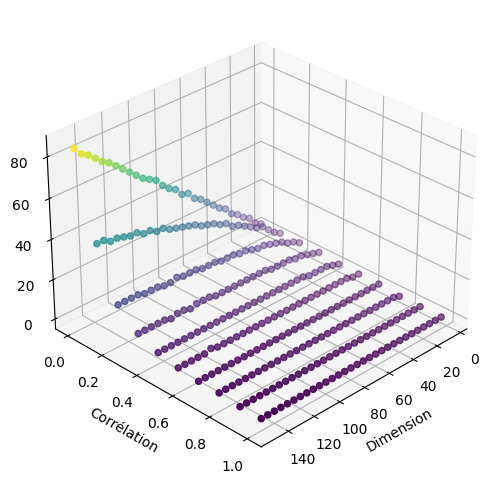

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler

import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from numpy.random import multivariate_normal
from scipy.stats import norm, expon, uniform

def create_covariance_matrix(dim, corr):
    if corr < -1 or corr > 1:
        raise ValueError("La corrélation doit être entre -1 et 1.")
    covariance_matrix = np.full((dim, dim), corr)  # La diagonale sera composée de 1 (variance pour une distribution normale standard)
    np.fill_diagonal(covariance_matrix, 1)
    return covariance_matrix

def generate_correlated_variables(n_samples, num_variables, correlation):
    mean = np.zeros(num_variables)  # Moyenne zéro pour une distribution normale standard
    covariance_matrix = create_covariance_matrix(num_variables, correlation)
    samples = np.random.multivariate_normal(mean, covariance_matrix, size=n_samples)  # Génère les échantillons à partir de la distribution normale multivariée
    df = pd.DataFrame(samples, columns=[f'Variable_{i+1}' for i in range(num_variables)])  # Convertit en DataFrame pandas
    for i in range(num_variables):  # Transformer les colonnes
        if i % 3 == 0:
            df.iloc[:, i] = expon.ppf(norm.cdf(df.iloc[:, i]))  # Transforme en données exponentielles
        elif i % 3 == 1:
            df.iloc[:, i] = uniform.ppf(norm.cdf(df.iloc[:, i]))  # Transforme en données uniformes
    return df

# Paramètres pour la plage de corrélation et le nombre de dimensions
correlation_values = np.linspace(0, 1, 10)  # 10 valeurs de corrélation de 0 à 1
dimension_values = np.arange(5, 151, 5)  # Dimensions de 5 à 150, par pas de 5

# Préparer les données pour le graphique 3D
X = []  # Liste pour les dimensions
Y = []  # Liste pour les valeurs de corrélation
Z = []  # Liste pour les dimensions effectives

for dim in dimension_values:
    for corr in correlation_values:
        X.append(dim)
        Y.append(corr)
        # Paramètres
        n_samples = 10000  # Nombre d'échantillons
        num_variables = dim  # Nombre de variables
        correlation = corr  # Corrélation souhaitée

        # Générer les variables corrélées
        df = generate_correlated_variables(n_samples, num_variables, correlation)

        # Remplacer les valeurs NaN par 0
        df.fillna(0, inplace=True)

        # Liste des colonnes contenant du texte
        text_columns = df.select_dtypes(include=['object']).columns

        # Remplacement du texte par des valeurs numériques
        for column in text_columns:
            le = LabelEncoder()
            df[column] = le.fit_transform(df[column].astype(str))

        # Création d'un objet MinMaxScaler
        scaler = MinMaxScaler()

        # Normalisation des colonnes du DataFrame
        df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

        # Calculer la matrice de covariance
        cov_matrix = np.cov(df, rowvar=False)

        # Définir les options d'affichage pour la matrice de covariance
        np.set_printoptions(precision=4, suppress=True)

        # Décomposition en valeurs propres
        eigenvalues, eigenvectors = np.linalg.eig(cov_matrix)

        # Calcul de la somme des valeurs propres
        sum_eigenvalues = np.sum(eigenvalues)

        # Calcul de la somme des valeurs propres carrées
        sum_eigenvalues_square = np.sum(eigenvalues**2)

        n2 = (sum_eigenvalues**2) / sum_eigenvalues_square

        # Calculer le nombre de dimensions effectives
        effective_dimensions = round(n2)

        Z.append(effective_dimensions)
        print(dim, corr, Z[-1])

# Création du graphe 3D avec une vue isométrique
fig = plt.figure(figsize=(12, 6))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(X, Y, Z, c=Z, cmap='viridis')
ax.set_xlabel('Dimension')
ax.set_ylabel('Corrélation')

# Définir la vue isométrique
ax.view_init(elev=30, azim=45)  # Angles choisis pour une vue isométrique standard

# Affichage du graphe
plt.show()

## Méthode avec n inf :

5 0.0 2
5 0.1111111111111111 2
5 0.2222222222222222 2
5 0.3333333333333333 2
5 0.4444444444444444 2
5 0.5555555555555556 1
5 0.6666666666666666 1
5 0.7777777777777777 1
5 0.8888888888888888 1
5 1.0 (1+0j)
10 0.0 4
10 0.1111111111111111 3


<ipython-input-7-09b62c8531cf>:84: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n_inf)


10 0.2222222222222222 3
10 0.3333333333333333 2
10 0.4444444444444444 2
10 0.5555555555555556 2
10 0.6666666666666666 1
10 0.7777777777777777 1
10 0.8888888888888888 1
10 1.0 (1+0j)


<ipython-input-7-09b62c8531cf>:84: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n_inf)


15 0.0 6
15 0.1111111111111111 4
15 0.2222222222222222 3
15 0.3333333333333333 3
15 0.4444444444444444 2
15 0.5555555555555556 2
15 0.6666666666666666 1
15 0.7777777777777777 1
15 0.8888888888888888 1
15 1.0 1
20 0.0 9
20 0.1111111111111111 5
20 0.2222222222222222 4
20 0.3333333333333333 3
20 0.4444444444444444 2
20 0.5555555555555556 2
20 0.6666666666666666 1
20 0.7777777777777777 1
20 0.8888888888888888 1
20 1.0 (1+0j)


<ipython-input-7-09b62c8531cf>:84: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n_inf)


25 0.0 10
25 0.1111111111111111 6
25 0.2222222222222222 4
25 0.3333333333333333 3
25 0.4444444444444444 2
25 0.5555555555555556 2
25 0.6666666666666666 1
25 0.7777777777777777 1
25 0.8888888888888888 1


<ipython-input-7-09b62c8531cf>:84: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n_inf)


25 1.0 (1+0j)
30 0.0 13
30 0.1111111111111111 6
30 0.2222222222222222 4
30 0.3333333333333333 3
30 0.4444444444444444 2
30 0.5555555555555556 2
30 0.6666666666666666 2
30 0.7777777777777777 1
30 0.8888888888888888 1


<ipython-input-7-09b62c8531cf>:84: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n_inf)


30 1.0 (1-0j)
35 0.0 15
35 0.1111111111111111 6
35 0.2222222222222222 4
35 0.3333333333333333 3
35 0.4444444444444444 2
35 0.5555555555555556 2
35 0.6666666666666666 2
35 0.7777777777777777 1
35 0.8888888888888888 1
35 1.0 (1+0j)


<ipython-input-7-09b62c8531cf>:84: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n_inf)


40 0.0 16
40 0.1111111111111111 7
40 0.2222222222222222 4
40 0.3333333333333333 3
40 0.4444444444444444 2
40 0.5555555555555556 2
40 0.6666666666666666 2
40 0.7777777777777777 1
40 0.8888888888888888 1


<ipython-input-7-09b62c8531cf>:84: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n_inf)


40 1.0 (1+0j)
45 0.0 19
45 0.1111111111111111 7
45 0.2222222222222222 4
45 0.3333333333333333 3
45 0.4444444444444444 2
45 0.5555555555555556 2
45 0.6666666666666666 2
45 0.7777777777777777 1
45 0.8888888888888888 1
45 1.0 (1+0j)


<ipython-input-7-09b62c8531cf>:84: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n_inf)


50 0.0 21
50 0.1111111111111111 7
50 0.2222222222222222 4
50 0.3333333333333333 3
50 0.4444444444444444 2
50 0.5555555555555556 2
50 0.6666666666666666 2
50 0.7777777777777777 1
50 0.8888888888888888 1


<ipython-input-7-09b62c8531cf>:84: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n_inf)


50 1.0 (1+0j)
55 0.0 23
55 0.1111111111111111 7
55 0.2222222222222222 4
55 0.3333333333333333 3
55 0.4444444444444444 2
55 0.5555555555555556 2
55 0.6666666666666666 2
55 0.7777777777777777 1
55 0.8888888888888888 1


<ipython-input-7-09b62c8531cf>:84: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n_inf)


55 1.0 (1+0j)
60 0.0 25
60 0.1111111111111111 8
60 0.2222222222222222 4
60 0.3333333333333333 3
60 0.4444444444444444 2
60 0.5555555555555556 2
60 0.6666666666666666 2
60 0.7777777777777777 1
60 0.8888888888888888 1


<ipython-input-7-09b62c8531cf>:84: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n_inf)


60 1.0 (1+0j)
65 0.0 26
65 0.1111111111111111 8
65 0.2222222222222222 4
65 0.3333333333333333 3
65 0.4444444444444444 2
65 0.5555555555555556 2
65 0.6666666666666666 2
65 0.7777777777777777 1
65 0.8888888888888888 1


<ipython-input-7-09b62c8531cf>:84: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n_inf)


65 1.0 (1+0j)
70 0.0 28
70 0.1111111111111111 8
70 0.2222222222222222 4
70 0.3333333333333333 3
70 0.4444444444444444 2
70 0.5555555555555556 2
70 0.6666666666666666 2
70 0.7777777777777777 1
70 0.8888888888888888 1


<ipython-input-7-09b62c8531cf>:84: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n_inf)


70 1.0 (1-0j)
75 0.0 31
75 0.1111111111111111 8
75 0.2222222222222222 4
75 0.3333333333333333 3
75 0.4444444444444444 2
75 0.5555555555555556 2
75 0.6666666666666666 2
75 0.7777777777777777 1
75 0.8888888888888888 1


<ipython-input-7-09b62c8531cf>:84: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n_inf)


75 1.0 (1+0j)
80 0.0 32
80 0.1111111111111111 8
80 0.2222222222222222 4
80 0.3333333333333333 3
80 0.4444444444444444 2
80 0.5555555555555556 2
80 0.6666666666666666 2
80 0.7777777777777777 1
80 0.8888888888888888 1


<ipython-input-7-09b62c8531cf>:84: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n_inf)


80 1.0 (1+0j)
85 0.0 34
85 0.1111111111111111 8
85 0.2222222222222222 4
85 0.3333333333333333 3
85 0.4444444444444444 2
85 0.5555555555555556 2
85 0.6666666666666666 2
85 0.7777777777777777 1
85 0.8888888888888888 1


<ipython-input-7-09b62c8531cf>:84: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n_inf)


85 1.0 (1+0j)
90 0.0 36
90 0.1111111111111111 8
90 0.2222222222222222 4
90 0.3333333333333333 3
90 0.4444444444444444 2
90 0.5555555555555556 2
90 0.6666666666666666 2
90 0.7777777777777777 1
90 0.8888888888888888 1


<ipython-input-7-09b62c8531cf>:84: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n_inf)


90 1.0 (1-0j)
95 0.0 38
95 0.1111111111111111 8
95 0.2222222222222222 4
95 0.3333333333333333 3
95 0.4444444444444444 2
95 0.5555555555555556 2
95 0.6666666666666666 2
95 0.7777777777777777 1
95 0.8888888888888888 1


<ipython-input-7-09b62c8531cf>:84: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n_inf)


95 1.0 (1-0j)
100 0.0 40
100 0.1111111111111111 8
100 0.2222222222222222 4
100 0.3333333333333333 3
100 0.4444444444444444 2
100 0.5555555555555556 2
100 0.6666666666666666 2
100 0.7777777777777777 1
100 0.8888888888888888 1


<ipython-input-7-09b62c8531cf>:84: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n_inf)


100 1.0 (1+0j)
105 0.0 42
105 0.1111111111111111 8
105 0.2222222222222222 5
105 0.3333333333333333 3
105 0.4444444444444444 2
105 0.5555555555555556 2
105 0.6666666666666666 2
105 0.7777777777777777 1
105 0.8888888888888888 1


<ipython-input-7-09b62c8531cf>:84: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n_inf)


105 1.0 (1+0j)
110 0.0 44
110 0.1111111111111111 8
110 0.2222222222222222 5
110 0.3333333333333333 3
110 0.4444444444444444 2
110 0.5555555555555556 2
110 0.6666666666666666 2
110 0.7777777777777777 1
110 0.8888888888888888 1


<ipython-input-7-09b62c8531cf>:84: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n_inf)


110 1.0 (1-0j)
115 0.0 46
115 0.1111111111111111 8
115 0.2222222222222222 4
115 0.3333333333333333 3
115 0.4444444444444444 2
115 0.5555555555555556 2
115 0.6666666666666666 2
115 0.7777777777777777 1
115 0.8888888888888888 1


<ipython-input-7-09b62c8531cf>:84: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n_inf)


115 1.0 (1+0j)
120 0.0 48
120 0.1111111111111111 9
120 0.2222222222222222 4
120 0.3333333333333333 3
120 0.4444444444444444 2
120 0.5555555555555556 2
120 0.6666666666666666 2
120 0.7777777777777777 1
120 0.8888888888888888 1


<ipython-input-7-09b62c8531cf>:84: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n_inf)


120 1.0 (1+0j)
125 0.0 50
125 0.1111111111111111 8
125 0.2222222222222222 5
125 0.3333333333333333 3
125 0.4444444444444444 2
125 0.5555555555555556 2
125 0.6666666666666666 2
125 0.7777777777777777 1
125 0.8888888888888888 1


<ipython-input-7-09b62c8531cf>:84: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n_inf)


125 1.0 (1-0j)
130 0.0 51
130 0.1111111111111111 8
130 0.2222222222222222 5
130 0.3333333333333333 3
130 0.4444444444444444 2
130 0.5555555555555556 2
130 0.6666666666666666 2
130 0.7777777777777777 1
130 0.8888888888888888 1


<ipython-input-7-09b62c8531cf>:84: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n_inf)


130 1.0 (1-0j)
135 0.0 53
135 0.1111111111111111 8
135 0.2222222222222222 5
135 0.3333333333333333 3
135 0.4444444444444444 2
135 0.5555555555555556 2
135 0.6666666666666666 2
135 0.7777777777777777 1
135 0.8888888888888888 1


<ipython-input-7-09b62c8531cf>:84: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n_inf)


135 1.0 (1-0j)
140 0.0 54
140 0.1111111111111111 9
140 0.2222222222222222 5
140 0.3333333333333333 3
140 0.4444444444444444 2
140 0.5555555555555556 2
140 0.6666666666666666 2
140 0.7777777777777777 1
140 0.8888888888888888 1


<ipython-input-7-09b62c8531cf>:84: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n_inf)


140 1.0 (1+0j)
145 0.0 56
145 0.1111111111111111 8
145 0.2222222222222222 4
145 0.3333333333333333 3
145 0.4444444444444444 2
145 0.5555555555555556 2
145 0.6666666666666666 2
145 0.7777777777777777 1
145 0.8888888888888888 1


<ipython-input-7-09b62c8531cf>:84: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n_inf)


145 1.0 (1+0j)
150 0.0 59
150 0.1111111111111111 9
150 0.2222222222222222 5
150 0.3333333333333333 3
150 0.4444444444444444 2
150 0.5555555555555556 2
150 0.6666666666666666 2
150 0.7777777777777777 1
150 0.8888888888888888 1


<ipython-input-7-09b62c8531cf>:84: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.
  effective_dimensions = round(n_inf)
/usr/local/lib/python3.10/dist-packages/matplotlib/axes/_axes.py:4411: ComplexWarning: Casting complex values to real discards the imaginary part
  c = np.asanyarray(c, dtype=float)
/usr/local/lib/python3.10/dist-packages/matplotlib/cbook/__init__.py:1335: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)
/usr/local/lib/python3.10/dist-packages/matplotlib/collections.py:551: ComplexWarning: Casting complex values to real discards the imaginary part
  (np.asanyarray(self.convert_xunits(offsets[:, 0]), float),
/usr/local/lib/python3.10/dist-packages/matplotlib/collections.py:552: ComplexWarning: Casting complex values to real discards the imaginary part
  np.asanyarray(self.convert_yunits(o

150 1.0 (1-0j)


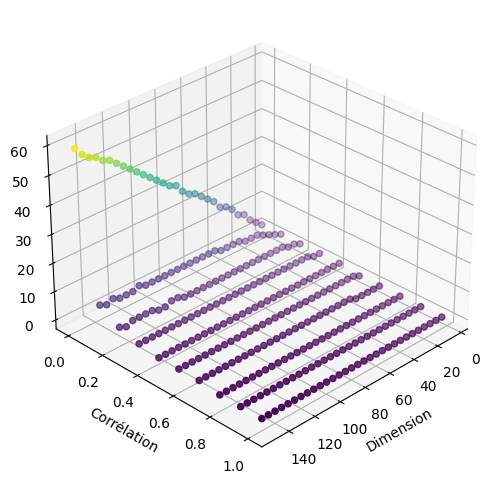

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler

import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from numpy.random import multivariate_normal
from scipy.stats import norm, expon, uniform

def create_covariance_matrix(dim, corr):
    if corr < -1 or corr > 1:
        raise ValueError("La corrélation doit être entre -1 et 1.")
    covariance_matrix = np.full((dim, dim), corr)  # La diagonale sera composée de 1 (variance pour une distribution normale standard)
    np.fill_diagonal(covariance_matrix, 1)
    return covariance_matrix

def generate_correlated_variables(n_samples, num_variables, correlation):
    mean = np.zeros(num_variables)  # Moyenne zéro pour une distribution normale standard
    covariance_matrix = create_covariance_matrix(num_variables, correlation)
    samples = np.random.multivariate_normal(mean, covariance_matrix, size=n_samples)  # Génère les échantillons à partir de la distribution normale multivariée
    df = pd.DataFrame(samples, columns=[f'Variable_{i+1}' for i in range(num_variables)])  # Convertit en DataFrame pandas
    for i in range(num_variables):  # Transformer les colonnes
        if i % 3 == 0:
            df.iloc[:, i] = expon.ppf(norm.cdf(df.iloc[:, i]))  # Transforme en données exponentielles
        elif i % 3 == 1:
            df.iloc[:, i] = uniform.ppf(norm.cdf(df.iloc[:, i]))  # Transforme en données uniformes
    return df

# Paramètres pour la plage de corrélation et le nombre de dimensions
correlation_values = np.linspace(0, 1, 10)  # 10 valeurs de corrélation de 0 à 1
dimension_values = np.arange(5, 151, 5)  # Dimensions de 5 à 150, par pas de 5

# Préparer les données pour le graphique 3D
X = []  # Liste pour les dimensions
Y = []  # Liste pour les valeurs de corrélation
Z = []  # Liste pour les dimensions effectives

for dim in dimension_values:
    for corr in correlation_values:
        X.append(dim)
        Y.append(corr)
        # Paramètres
        n_samples = 10000  # Nombre d'échantillons
        num_variables = dim  # Nombre de variables
        correlation = corr  # Corrélation souhaitée

        # Générer les variables corrélées
        df = generate_correlated_variables(n_samples, num_variables, correlation)

        # Remplacer les valeurs NaN par 0
        df.fillna(0, inplace=True)

        # Liste des colonnes contenant du texte
        text_columns = df.select_dtypes(include=['object']).columns

        # Remplacement du texte par des valeurs numériques
        for column in text_columns:
            le = LabelEncoder()
            df[column] = le.fit_transform(df[column].astype(str))

        # Création d'un objet MinMaxScaler
        scaler = MinMaxScaler()

        # Normalisation des colonnes du DataFrame
        df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

        # Calculer la matrice de covariance
        cov_matrix = np.cov(df, rowvar=False)

        # Définir les options d'affichage pour la matrice de covariance
        np.set_printoptions(precision=4, suppress=True)

        # Décomposition en valeurs propres
        eigenvalues, eigenvectors = np.linalg.eig(cov_matrix)

        # Calcul de la somme des valeurs propres
        sum_eigenvalues = np.sum(eigenvalues)

        n_inf = sum_eigenvalues / max(eigenvalues)

        # Calculer le nombre de dimensions effectives
        effective_dimensions = round(n_inf)

        Z.append(effective_dimensions)
        print(dim, corr, Z[-1])

# Création du graphe 3D avec une vue isométrique
fig = plt.figure(figsize=(12, 6))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(X, Y, Z, c=Z, cmap='viridis')
ax.set_xlabel('Dimension')
ax.set_ylabel('Corrélation')

# Définir la vue isométrique
ax.view_init(elev=30, azim=45)  # Angles choisis pour une vue isométrique standard

# Affichage du graphe
plt.show()

## Méthode avec Chaîne de Markov par Monte Carlo :

<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


5 0.0 5


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


5 0.1111111111111111 5


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


5 0.2222222222222222 5


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


5 0.3333333333333333 4


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


5 0.4444444444444444 5


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


5 0.5555555555555556 5


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


5 0.6666666666666666 5


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


5 0.7777777777777777 5


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


5 0.8888888888888888 5


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


5 1.0 5


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


10 0.0 8


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


10 0.1111111111111111 8


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


10 0.2222222222222222 7


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


10 0.3333333333333333 8


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


10 0.4444444444444444 9


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


10 0.5555555555555556 9


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


10 0.6666666666666666 9


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


10 0.7777777777777777 9


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


10 0.8888888888888888 9


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


10 1.0 9


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


15 0.0 12


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


15 0.1111111111111111 12


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


15 0.2222222222222222 12


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


15 0.3333333333333333 12


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


15 0.4444444444444444 12


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


15 0.5555555555555556 12


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


15 0.6666666666666666 11


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


15 0.7777777777777777 13


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


15 0.8888888888888888 12


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


15 1.0 13


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


20 0.0 15


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


20 0.1111111111111111 15


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


20 0.2222222222222222 15


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


20 0.3333333333333333 13


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


20 0.4444444444444444 14


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


20 0.5555555555555556 15


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


20 0.6666666666666666 14


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


20 0.7777777777777777 14


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


20 0.8888888888888888 14


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


20 1.0 15


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


25 0.0 16


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


25 0.1111111111111111 16


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


25 0.2222222222222222 16


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


25 0.3333333333333333 17


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


25 0.4444444444444444 18


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


25 0.5555555555555556 18


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


25 0.6666666666666666 17


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


25 0.7777777777777777 15


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


25 0.8888888888888888 16


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


25 1.0 18


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


30 0.0 21


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


30 0.1111111111111111 16


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


30 0.2222222222222222 19


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


30 0.3333333333333333 17


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


30 0.4444444444444444 18


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


30 0.5555555555555556 18


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


30 0.6666666666666666 21


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


30 0.7777777777777777 19


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


30 0.8888888888888888 19


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


30 1.0 20


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


35 0.0 18


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


35 0.1111111111111111 20


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


35 0.2222222222222222 21


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


35 0.3333333333333333 22


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


35 0.4444444444444444 21


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


35 0.5555555555555556 24


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


35 0.6666666666666666 20


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


35 0.7777777777777777 20


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


35 0.8888888888888888 21


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


35 1.0 19


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


40 0.0 24


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


40 0.1111111111111111 21


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


40 0.2222222222222222 23


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


40 0.3333333333333333 23


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


40 0.4444444444444444 21


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


40 0.5555555555555556 23


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


40 0.6666666666666666 23


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


40 0.7777777777777777 22


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


40 0.8888888888888888 21


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


40 1.0 25


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


45 0.0 26


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


45 0.1111111111111111 22


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


45 0.2222222222222222 24


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


45 0.3333333333333333 25


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


45 0.4444444444444444 24


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


45 0.5555555555555556 24


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


45 0.6666666666666666 24


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


45 0.7777777777777777 25


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


45 0.8888888888888888 23


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


45 1.0 24


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


50 0.0 26


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


50 0.1111111111111111 26


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


50 0.2222222222222222 26


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


50 0.3333333333333333 25


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


50 0.4444444444444444 25


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


50 0.5555555555555556 23


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


50 0.6666666666666666 28


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


50 0.7777777777777777 23


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


50 0.8888888888888888 27


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


50 1.0 28


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


55 0.0 28


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


55 0.1111111111111111 28


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


55 0.2222222222222222 27


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


55 0.3333333333333333 30


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


55 0.4444444444444444 29


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


55 0.5555555555555556 23


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


55 0.6666666666666666 29


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


55 0.7777777777777777 28


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


55 0.8888888888888888 28


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


55 1.0 26


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


60 0.0 30


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


60 0.1111111111111111 30


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


60 0.2222222222222222 30


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


60 0.3333333333333333 26


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


60 0.4444444444444444 29


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


60 0.5555555555555556 26


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


60 0.6666666666666666 29


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


60 0.7777777777777777 29


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


60 0.8888888888888888 28


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


60 1.0 28


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


65 0.0 30


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


65 0.1111111111111111 28


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


65 0.2222222222222222 30


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


65 0.3333333333333333 30


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


65 0.4444444444444444 32


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


65 0.5555555555555556 28


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


65 0.6666666666666666 33


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


65 0.7777777777777777 29


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


65 0.8888888888888888 29


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


65 1.0 33


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


70 0.0 34


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


70 0.1111111111111111 26


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


70 0.2222222222222222 33


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


70 0.3333333333333333 31


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


70 0.4444444444444444 31


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


70 0.5555555555555556 31


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


70 0.6666666666666666 31


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


70 0.7777777777777777 29


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


70 0.8888888888888888 31


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


70 1.0 29


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


75 0.0 30


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


75 0.1111111111111111 29


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


75 0.2222222222222222 31


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


75 0.3333333333333333 33


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


75 0.4444444444444444 32


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


75 0.5555555555555556 35


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


75 0.6666666666666666 32


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


75 0.7777777777777777 31


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


75 0.8888888888888888 34


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


75 1.0 33


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


80 0.0 35


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


80 0.1111111111111111 32


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


80 0.2222222222222222 30


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


80 0.3333333333333333 32


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


80 0.4444444444444444 33


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


80 0.5555555555555556 38


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


80 0.6666666666666666 32


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


80 0.7777777777777777 35


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


80 0.8888888888888888 33


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


80 1.0 28


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


85 0.0 34


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


85 0.1111111111111111 34


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


85 0.2222222222222222 33


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


85 0.3333333333333333 38


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


85 0.4444444444444444 31


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


85 0.5555555555555556 32


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


85 0.6666666666666666 32


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


85 0.7777777777777777 35


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


85 0.8888888888888888 34


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


85 1.0 31


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


90 0.0 34


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


90 0.1111111111111111 36


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


90 0.2222222222222222 34


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


90 0.3333333333333333 36


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


90 0.4444444444444444 32


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


90 0.5555555555555556 30


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


90 0.6666666666666666 34


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


90 0.7777777777777777 36


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


90 0.8888888888888888 36


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


90 1.0 35


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


95 0.0 36


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


95 0.1111111111111111 36


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


95 0.2222222222222222 36


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


95 0.3333333333333333 34


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


95 0.4444444444444444 34


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


95 0.5555555555555556 36


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


95 0.6666666666666666 35


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


95 0.7777777777777777 36


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


95 0.8888888888888888 38


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


95 1.0 34


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


100 0.0 37


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


100 0.1111111111111111 34


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


100 0.2222222222222222 34


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


100 0.3333333333333333 39


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


100 0.4444444444444444 39


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


100 0.5555555555555556 37


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


100 0.6666666666666666 37


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


100 0.7777777777777777 36


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


100 0.8888888888888888 34


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


100 1.0 34


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


105 0.0 36


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


105 0.1111111111111111 34


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


105 0.2222222222222222 38


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


105 0.3333333333333333 38


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


105 0.4444444444444444 36


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


105 0.5555555555555556 37


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


105 0.6666666666666666 38


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


105 0.7777777777777777 37


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


105 0.8888888888888888 34


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


105 1.0 35


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


110 0.0 42


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


110 0.1111111111111111 38


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


110 0.2222222222222222 38


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


110 0.3333333333333333 33


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


110 0.4444444444444444 37


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


110 0.5555555555555556 34


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


110 0.6666666666666666 38


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


110 0.7777777777777777 44


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


110 0.8888888888888888 42


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


110 1.0 40


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


115 0.0 37


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


115 0.1111111111111111 37


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


115 0.2222222222222222 40


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


115 0.3333333333333333 38


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


115 0.4444444444444444 39


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


115 0.5555555555555556 41


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


115 0.6666666666666666 40


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


115 0.7777777777777777 39


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


115 0.8888888888888888 35


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


115 1.0 39


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


120 0.0 39


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


120 0.1111111111111111 40


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


120 0.2222222222222222 39


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


120 0.3333333333333333 42


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


120 0.4444444444444444 35


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


120 0.5555555555555556 39


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


120 0.6666666666666666 39


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


120 0.7777777777777777 37


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


120 0.8888888888888888 36


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


120 1.0 36


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


125 0.0 41


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


125 0.1111111111111111 40


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


125 0.2222222222222222 38


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


125 0.3333333333333333 41


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


125 0.4444444444444444 40


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


125 0.5555555555555556 38


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


125 0.6666666666666666 37


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


125 0.7777777777777777 38


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


125 0.8888888888888888 40


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


125 1.0 41


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


130 0.0 43


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


130 0.1111111111111111 39


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


130 0.2222222222222222 40


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


130 0.3333333333333333 40


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


130 0.4444444444444444 36


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


130 0.5555555555555556 42


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


130 0.6666666666666666 39


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


130 0.7777777777777777 38


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


130 0.8888888888888888 40


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


130 1.0 35


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


135 0.0 39


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


135 0.1111111111111111 42


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


135 0.2222222222222222 40


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


135 0.3333333333333333 40


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


135 0.4444444444444444 38


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


135 0.5555555555555556 38


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


135 0.6666666666666666 42


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


135 0.7777777777777777 38


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


135 0.8888888888888888 40


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


135 1.0 40


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


140 0.0 36


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


140 0.1111111111111111 40


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


140 0.2222222222222222 41


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


140 0.3333333333333333 38


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


140 0.4444444444444444 40


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


140 0.5555555555555556 39


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


140 0.6666666666666666 39


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


140 0.7777777777777777 43


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


140 0.8888888888888888 42


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


140 1.0 41


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


145 0.0 43


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


145 0.1111111111111111 40


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


145 0.2222222222222222 43


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


145 0.3333333333333333 42


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


145 0.4444444444444444 40


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


145 0.5555555555555556 44


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


145 0.6666666666666666 43


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


145 0.7777777777777777 42


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


145 0.8888888888888888 40


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


145 1.0 40


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


150 0.0 42


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


150 0.1111111111111111 37


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


150 0.2222222222222222 42


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


150 0.3333333333333333 40


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


150 0.4444444444444444 41


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


150 0.5555555555555556 41


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


150 0.6666666666666666 44


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


150 0.7777777777777777 40


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


150 0.8888888888888888 43


<ipython-input-1-cd471027078e>:101: RuntimeWarning: invalid value encountered in scalar divide
  acceptance_ratio = min(1, proposal_density / current_density)


150 1.0 45


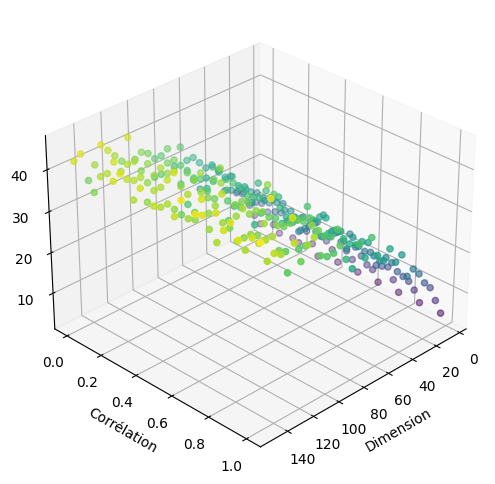

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler

import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from numpy.random import multivariate_normal
from scipy.stats import norm, expon, uniform

def create_covariance_matrix(dim, corr):
    if corr < -1 or corr > 1:
        raise ValueError("La corrélation doit être entre -1 et 1.")
    covariance_matrix = np.full((dim, dim), corr)  # La diagonale sera composée de 1 (variance pour une distribution normale standard)
    np.fill_diagonal(covariance_matrix, 1)
    return covariance_matrix

def generate_correlated_variables(n_samples, num_variables, correlation):
    mean = np.zeros(num_variables)  # Moyenne zéro pour une distribution normale standard
    covariance_matrix = create_covariance_matrix(num_variables, correlation)
    samples = np.random.multivariate_normal(mean, covariance_matrix, size=n_samples)  # Génère les échantillons à partir de la distribution normale multivariée
    df = pd.DataFrame(samples, columns=[f'Variable_{i+1}' for i in range(num_variables)])  # Convertit en DataFrame pandas
    for i in range(num_variables):  # Transformer les colonnes
        if i % 3 == 0:
            df.iloc[:, i] = expon.ppf(norm.cdf(df.iloc[:, i]))  # Transforme en données exponentielles
        elif i % 3 == 1:
            df.iloc[:, i] = uniform.ppf(norm.cdf(df.iloc[:, i]))  # Transforme en données uniformes
    return df

from sklearn.decomposition import PCA

# Fonction pour calculer le nombre de dimensions effectives à partir d'une chaîne de Markov
def compute_effective_dimensions(chain):
    num_samples, num_features = chain.shape
    chain_mean = np.mean(chain, axis=0)
    cov_matrix = np.cov(chain.T)
    _, eigvals, _ = np.linalg.svd(cov_matrix)
    cumulative_variance = np.cumsum(eigvals) / np.sum(eigvals)
    effective_dimensions = np.sum(cumulative_variance < 0.99) + 1  # Choisissez votre critère de seuil ici
    return effective_dimensions

# Paramètres pour la plage de corrélation et le nombre de dimensions
correlation_values = np.linspace(0, 1, 10)  # 10 valeurs de corrélation de 0 à 1
dimension_values = np.arange(5, 151, 5)  # Dimensions de 5 à 150, par pas de 5

# Préparer les données pour le graphique 3D
X = []  # Liste pour les dimensions
Y = []  # Liste pour les valeurs de corrélation
Z = []  # Liste pour les dimensions effectives

for dim in dimension_values:
    for corr in correlation_values:
        X.append(dim)
        Y.append(corr)
        # Paramètres
        n_samples = 10000  # Nombre d'échantillons
        num_variables = dim  # Nombre de variables
        correlation = corr  # Corrélation souhaitée

        # Générer les variables corrélées
        df = generate_correlated_variables(n_samples, num_variables, correlation)

        # Remplacer les valeurs NaN par 0
        df.fillna(0, inplace=True)

        # Liste des colonnes contenant du texte
        text_columns = df.select_dtypes(include=['object']).columns

        # Remplacement du texte par des valeurs numériques
        for column in text_columns:
            le = LabelEncoder()
            df[column] = le.fit_transform(df[column].astype(str))

        # Création d'un objet MinMaxScaler
        scaler = MinMaxScaler()

        # Normalisation des colonnes du DataFrame
        df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

        pca = PCA(n_components = df.shape[1])  # Choisissez le nombre de composantes principales souhaitées
        X_pca = pca.fit_transform(df)

        # Définir les paramètres de la chaîne de Markov
        num_samples = 1000  # Nombre d'échantillons à générer
        num_features = X_pca.shape[1]  # Nombre de caractéristiques

        # Initialiser la chaîne de Markov
        chain = np.zeros((num_samples, num_features))

        # Générer la chaîne de Markov
        for i in range(1, num_samples):
            # Échantillonner une nouvelle proposition de la distribution normale
            proposal = np.random.multivariate_normal(chain[i-1], np.eye(num_features))

            # Calculer les densités de probabilité des propositions actuelle et proposée
            current_density = np.exp(-np.sum((chain[i-1] - X_pca)**2) / 2)
            proposal_density = np.exp(-np.sum((proposal - X_pca)**2) / 2)

            # Accepter ou rejeter la proposition en utilisant le critère de Metropolis-Hastings
            acceptance_ratio = min(1, proposal_density / current_density)
            if np.random.rand() < acceptance_ratio:
                chain[i] = proposal
            else:
                chain[i] = chain[i-1]

        # Calculer le nombre de dimensions effectives
        effective_dimensions = compute_effective_dimensions(chain)

        Z.append(effective_dimensions)
        print(dim, corr, Z[-1])

# Création du graphe 3D avec une vue isométrique
fig = plt.figure(figsize=(12, 6))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(X, Y, Z, c=Z, cmap='viridis')
ax.set_xlabel('Dimension')
ax.set_ylabel('Corrélation')

# Définir la vue isométrique
ax.view_init(elev=30, azim=45)  # Angles choisis pour une vue isométrique standard

# Affichage du graphe
plt.show()

## Méthode avec le plus proche voisin (1) :

Impossible : Temps de calcul trop important

## Méthode avec le plus proche voisin (2) : Avec k = 30 | The Intrinsic Dimension of Images and Its Impact on Learning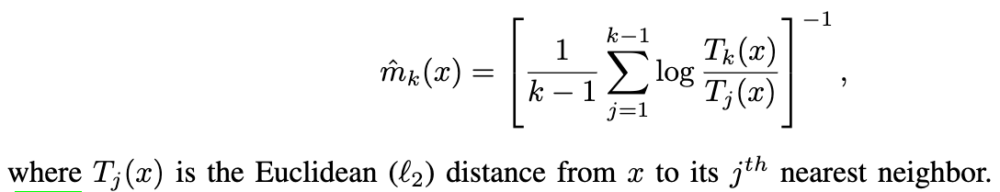

5 0.0 5
5 0.1 5
5 0.2 5
5 0.30000000000000004 5
5 0.4 5
5 0.5 5
5 0.6000000000000001 4
5 0.7000000000000001 5
5 0.8 4
5 0.9 4
5 0.91 4
5 0.92 4
5 0.93 4
5 0.9400000000000001 4
5 0.95 4
5 0.96 4
5 0.97 4
5 0.98 4
5 0.99 4
5 0.991 4
5 0.992 4
5 0.993 4
5 0.994 4
5 0.995 4
5 0.996 4
5 0.997 4
5 0.998 4
5 0.999 3
5 1.0 1
10 0.0 8
10 0.1 8
10 0.2 8
10 0.30000000000000004 8
10 0.4 8
10 0.5 8
10 0.6000000000000001 8
10 0.7000000000000001 7
10 0.8 7
10 0.9 7
10 0.91 7
10 0.92 7
10 0.93 7
10 0.9400000000000001 7
10 0.95 7
10 0.96 7
10 0.97 7
10 0.98 7
10 0.99 6
10 0.991 6
10 0.992 6
10 0.993 6
10 0.994 6
10 0.995 6
10 0.996 6
10 0.997 6
10 0.998 6
10 0.999 5
10 1.0 1
15 0.0 11
15 0.1 10
15 0.2 11
15 0.30000000000000004 10
15 0.4 10
15 0.5 10
15 0.6000000000000001 10
15 0.7000000000000001 10
15 0.8 9
15 0.9 9
15 0.91 9
15 0.92 9
15 0.93 9
15 0.9400000000000001 9
15 0.95 9
15 0.96 8
15 0.97 9
15 0.98 8
15 0.99 8
15 0.991 8
15 0.992 8
15 0.993 8
15 0.994 8
15 0.995 8
15 0.996 7
15 0.997 7
15 0.998

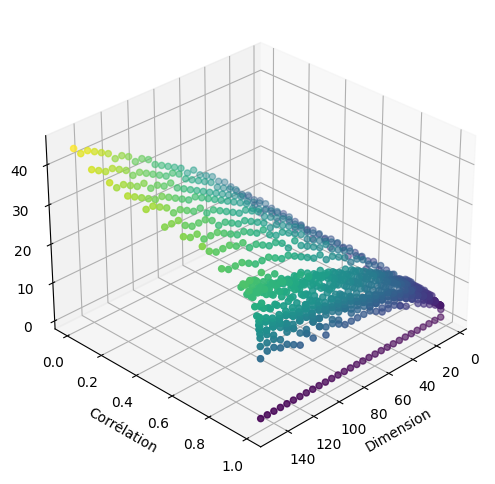

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler

import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from numpy.random import multivariate_normal
from scipy.stats import norm, expon, uniform

def create_covariance_matrix(dim, corr):
    if corr < -1 or corr > 1:
        raise ValueError("La corrélation doit être entre -1 et 1.")
    covariance_matrix = np.full((dim, dim), corr)  # La diagonale sera composée de 1 (variance pour une distribution normale standard)
    np.fill_diagonal(covariance_matrix, 1)
    return covariance_matrix

def generate_correlated_variables(n_samples, num_variables, correlation):
    mean = np.zeros(num_variables)  # Moyenne zéro pour une distribution normale standard
    covariance_matrix = create_covariance_matrix(num_variables, correlation)
    samples = np.random.multivariate_normal(mean, covariance_matrix, size=n_samples)  # Génère les échantillons à partir de la distribution normale multivariée
    df = pd.DataFrame(samples, columns=[f'Variable_{i+1}' for i in range(num_variables)])  # Convertit en DataFrame pandas
    for i in range(num_variables):  # Transformer les colonnes
        if i % 3 == 0:
            df.iloc[:, i] = expon.ppf(norm.cdf(df.iloc[:, i]))  # Transforme en données exponentielles
        elif i % 3 == 1:
            df.iloc[:, i] = uniform.ppf(norm.cdf(df.iloc[:, i]))  # Transforme en données uniformes
    return df

from sklearn.neighbors import NearestNeighbors
import random
import numpy as np

def Tj_x(distances, j):
    return distances[j]

# Paramètres pour la plage de corrélation et le nombre de dimensions
correlation_values = np.concatenate((np.linspace(0, 0.9, 10), np.linspace(0.91, 0.99, 9), np.linspace(0.991, 1, 10)))  # 29 valeurs de corrélation de 0 à 1
dimension_values = np.arange(5, 151, 5)  # Dimensions de 5 à 150, par pas de 5

# Préparer les données pour le graphique 3D
X = []  # Liste pour les dimensions
Y = []  # Liste pour les valeurs de corrélation
Z = []  # Liste pour les dimensions effectives

for dim in dimension_values:
    for corr in correlation_values:
        X.append(dim)
        Y.append(corr)
        # Paramètres
        n_samples = 10000  # Nombre d'échantillons
        num_variables = dim  # Nombre de variables
        correlation = corr  # Corrélation souhaitée

        # Générer les variables corrélées
        df = generate_correlated_variables(n_samples, num_variables, correlation)

        # Remplacer les valeurs NaN par 0
        df.fillna(0, inplace=True)

        # Liste des colonnes contenant du texte
        text_columns = df.select_dtypes(include=['object']).columns

        # Remplacement du texte par des valeurs numériques
        for column in text_columns:
            le = LabelEncoder()
            df[column] = le.fit_transform(df[column].astype(str))

        # Création d'un objet MinMaxScaler
        scaler = MinMaxScaler()

        # Normalisation des colonnes du DataFrame
        df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

        k = 30
        nbrs = NearestNeighbors(n_neighbors=k+1, metric='euclidean').fit(df.values)
        distances, _ = nbrs.kneighbors(df.values)

        somme = 0
        random_indices = random.sample(range(df.shape[0]), 500)
        for i in random_indices:
            mk_x = 0
            for j in range(1, k):
                a = np.log(Tj_x(distances[i], k) / Tj_x(distances[i], j))
                mk_x += a
            mk_x = (1 / (k-1) * mk_x) ** (-1)
            somme += (mk_x ** (-1))

        effective_dimensions = round(((1 / 500) * somme) ** (-1))

        Z.append(effective_dimensions)
        print(dim, corr, Z[-1])

# Création du graphe 3D avec une vue isométrique
fig = plt.figure(figsize=(12, 6))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(X, Y, Z, c=Z, cmap='viridis')
ax.set_xlabel('Dimension')
ax.set_ylabel('Corrélation')

# Définir la vue isométrique
ax.view_init(elev=30, azim=45)  # Angles choisis pour une vue isométrique standard

# Affichage du graphe
plt.show()

## Méthode avec le plus proche voisin (3) :

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler

import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from numpy.random import multivariate_normal
from scipy.stats import norm, expon, uniform

def create_covariance_matrix(dim, corr):
    if corr < -1 or corr > 1:
        raise ValueError("La corrélation doit être entre -1 et 1.")
    covariance_matrix = np.full((dim, dim), corr)  # La diagonale sera composée de 1 (variance pour une distribution normale standard)
    np.fill_diagonal(covariance_matrix, 1)
    return covariance_matrix

def generate_correlated_variables(n_samples, num_variables, correlation):
    mean = np.zeros(num_variables)  # Moyenne zéro pour une distribution normale standard
    covariance_matrix = create_covariance_matrix(num_variables, correlation)
    samples = np.random.multivariate_normal(mean, covariance_matrix, size=n_samples)  # Génère les échantillons à partir de la distribution normale multivariée
    df = pd.DataFrame(samples, columns=[f'Variable_{i+1}' for i in range(num_variables)])  # Convertit en DataFrame pandas
    for i in range(num_variables):  # Transformer les colonnes
        if i % 3 == 0:
            df.iloc[:, i] = expon.ppf(norm.cdf(df.iloc[:, i]))  # Transforme en données exponentielles
        elif i % 3 == 1:
            df.iloc[:, i] = uniform.ppf(norm.cdf(df.iloc[:, i]))  # Transforme en données uniformes
    return df

from sklearn.neighbors import NearestNeighbors
import random
import numpy as np

# Diviser les données en deux parties
def split_dataframe(dataframe):
    dataframe_1 = pd.DataFrame()
    dataframe_2 = pd.DataFrame()
    for column in dataframe.columns:
        unique_values = dataframe[column].nunique()  # Nombre de valeurs uniques dans la colonne
        if unique_values <= 2:  # Vérifier si le nombre de valeurs uniques est inférieur ou égal
            dataframe_1[column] = dataframe[column]
        else:
            dataframe_2[column] = dataframe[column]
    return dataframe_1, dataframe_2

def Tj_x(distances, j):
    return distances[j]

# Paramètres pour la plage de corrélation et le nombre de dimensions
correlation_values = np.concatenate((np.linspace(0, 0.9, 10), np.linspace(0.91, 0.99, 9), np.linspace(0.991, 1, 10)))  # 29 valeurs de corrélation de 0 à 1
dimension_values = np.arange(5, 151, 5)  # Dimensions de 5 à 150, par pas de 5

# Préparer les données pour le graphique 3D
X = []  # Liste pour les dimensions
Y = []  # Liste pour les valeurs de corrélation
Z = []  # Liste pour les dimensions effectives

for dim in dimension_values:
    for corr in correlation_values:
        X.append(dim)
        Y.append(corr)
        # Paramètres
        n_samples = 10000  # Nombre d'échantillons
        num_variables = dim  # Nombre de variables
        correlation = corr  # Corrélation souhaitée

        # Générer les variables corrélées
        df = generate_correlated_variables(n_samples, num_variables, correlation)

        # Remplacer les valeurs NaN par 0
        df.fillna(0, inplace=True)

        # Liste des colonnes contenant du texte
        text_columns = df.select_dtypes(include=['object']).columns

        # Remplacement du texte par des valeurs numériques
        for column in text_columns:
            le = LabelEncoder()
            df[column] = le.fit_transform(df[column].astype(str))

        # Création d'un objet MinMaxScaler
        scaler = MinMaxScaler()

        # Normalisation des colonnes du DataFrame
        df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

        binary_df = split_dataframe(df)[0]  # Sélectionner les colonnes binaires
        non_binary_df = split_dataframe(df)[1]  # Sélectionner les colonnes non binaires

        if binary_df.empty:
            effective_dimensions_1 = 0
        elif binary_df.shape[1] == 1:
            effective_dimensions_1 = 1
        else:
            # Calculer la matrice de covariance
            cov_matrix = np.cov(binary_df, rowvar=False)

            # Définir les options d'affichage pour la matrice de covariance
            np.set_printoptions(precision=4, suppress=True)

            # Décomposition en valeurs propres
            eigenvalues, eigenvectors = np.linalg.eig(cov_matrix)

            # Calculer la somme des valeurs propres
            total_variance = np.sum(eigenvalues)

            # Calculer les proportions de variance
            variance_ratios = eigenvalues / total_variance

            # Calculer le nombre de dimensions effectives
            effective_dimensions_1 = np.sum(variance_ratios > 0.01)  # Choisissez ici votre seuil approprié

        if non_binary_df.empty:
            effective_dimensions_1 = 0
        else:
            k = 30
            nbrs = NearestNeighbors(n_neighbors=k+1, metric='euclidean').fit(non_binary_df.values)
            distances, _ = nbrs.kneighbors(non_binary_df.values)

            somme = 0
            random_indices = random.sample(range(non_binary_df.shape[0]), 500)
            for i in random_indices:
                mk_x = 0
                for j in range(1, k):
                    a = np.log(Tj_x(distances[i], k) / Tj_x(distances[i], j))
                    mk_x += a
                mk_x = (1 / (k-1) * mk_x) ** (-1)
                somme += (mk_x ** (-1))

            effective_dimensions_2 = round(((1 / 500) * somme) ** (-1))

        effective_dimensions = round(effective_dimensions_1 * (binary_df.shape[1] / df.shape[1]) + effective_dimensions_2 * (non_binary_df.shape[1] / df.shape[1]))

        Z.append(effective_dimensions)
        print(dim, corr, Z[-1])

# Création du graphe 3D avec une vue isométrique
fig = plt.figure(figsize=(12, 6))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(X, Y, Z, c=Z, cmap='viridis')
ax.set_xlabel('Dimension')
ax.set_ylabel('Corrélation')

# Définir la vue isométrique
ax.view_init(elev=30, azim=45)  # Angles choisis pour une vue isométrique standard

# Affichage du graphe
plt.show()

Output hidden; open in https://colab.research.google.com to view.

# **Évaluation sur une distribution normale multivariée (2)**

## Méthode avec le plus proche voisin (2) avec une corrélation proche de 1 : Avec k = 30 | The Intrinsic Dimension of Images and Its Impact on Learning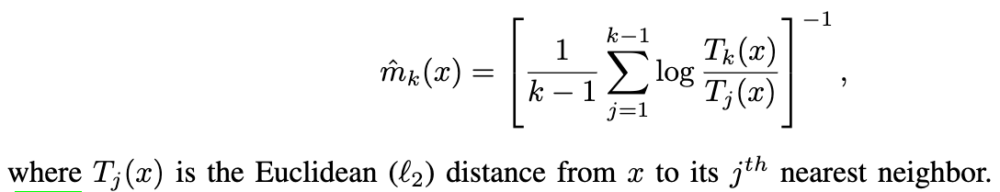

5 0.9 5
5 0.91 5
5 0.92 5
5 0.93 5
5 0.9400000000000001 5
5 0.95 5
5 0.96 5
5 0.97 5
5 0.98 5
5 0.99 5
5 0.991 5
5 0.992 5
5 0.993 5
5 0.994 5
5 0.995 5
5 0.996 5
5 0.997 5
5 0.998 5
5 0.999 4
5 0.9991 4
5 0.9992 4
5 0.9993 4
5 0.9994 4
5 0.9994999999999999 4
5 0.9996 4
5 0.9997 4
5 0.9998 4
5 0.9999 4
5 1.0 1
10 0.9 9
10 0.91 9
10 0.92 9
10 0.93 8
10 0.9400000000000001 8
10 0.95 9
10 0.96 8
10 0.97 8
10 0.98 8
10 0.99 8
10 0.991 8
10 0.992 8
10 0.993 8
10 0.994 8
10 0.995 8
10 0.996 7
10 0.997 7
10 0.998 7
10 0.999 7
10 0.9991 7
10 0.9992 7
10 0.9993 6
10 0.9994 6
10 0.9994999999999999 6
10 0.9996 6
10 0.9997 6
10 0.9998 5
10 0.9999 5
10 1.0 1
15 0.9 12
15 0.91 12
15 0.92 11
15 0.93 12
15 0.9400000000000001 11
15 0.95 11
15 0.96 11
15 0.97 11
15 0.98 11
15 0.99 10
15 0.991 10
15 0.992 10
15 0.993 10
15 0.994 10
15 0.995 10
15 0.996 10
15 0.997 9
15 0.998 9
15 0.999 8
15 0.9991 8
15 0.9992 8
15 0.9993 8
15 0.9994 8
15 0.9994999999999999 7
15 0.9996 7
15 0.9997 7
15 0.9998 6
15 0.9999 6

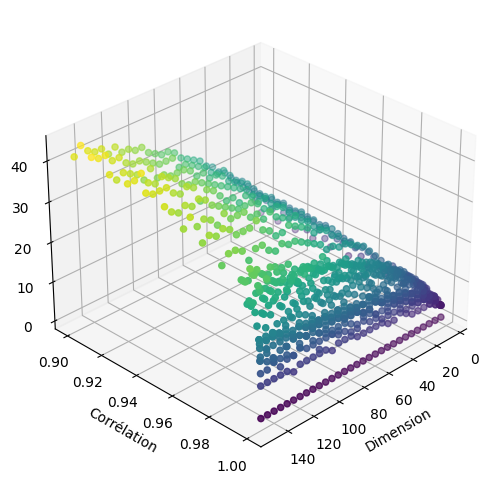

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler

import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from numpy.random import multivariate_normal

def create_covariance_matrix(dim, corr):
    if corr < -1 or corr > 1:
        raise ValueError("La corrélation doit être entre -1 et 1.")
    covariance_matrix = np.full((dim, dim), corr)  # La diagonale sera composée de 1 (variance pour une distribution normale standard)
    np.fill_diagonal(covariance_matrix, 1)
    return covariance_matrix

def generate_correlated_variables(n_samples, num_variables, correlation):
    mean = np.zeros(num_variables)  # Moyenne zéro pour une distribution normale standard
    covariance_matrix = create_covariance_matrix(num_variables, correlation)
    samples = np.random.multivariate_normal(mean, covariance_matrix, size=n_samples)  # Génère les échantillons à partir de la distribution normale multivariée
    df = pd.DataFrame(samples, columns=[f'Variable_{i+1}' for i in range(num_variables)])  # Convertit en DataFrame pandas
    return df

from sklearn.neighbors import NearestNeighbors
import random
import numpy as np

def Tj_x(distances, j):
    return distances[j]

# Paramètres pour la plage de corrélation et le nombre de dimensions
correlation_values = np.concatenate((np.linspace(0.9, 0.99, 10), np.linspace(0.991, 0.999, 9), np.linspace(0.9991, 1, 10)))  # 29 valeurs de corrélation de 0,9 à 1
dimension_values = np.arange(5, 151, 5)  # Dimensions de 5 à 150, par pas de 5

# Préparer les données pour le graphique 3D
X = []  # Liste pour les dimensions
Y = []  # Liste pour les valeurs de corrélation
Z = []  # Liste pour les dimensions effectives

for dim in dimension_values:
    for corr in correlation_values:
        X.append(dim)
        Y.append(corr)
        # Paramètres
        n_samples = 10000  # Nombre d'échantillons
        num_variables = dim  # Nombre de variables
        correlation = corr  # Corrélation souhaitée

        # Générer les variables corrélées
        df = generate_correlated_variables(n_samples, num_variables, correlation)

        # Remplacer les valeurs NaN par 0
        df.fillna(0, inplace=True)

        # Liste des colonnes contenant du texte
        text_columns = df.select_dtypes(include=['object']).columns

        # Remplacement du texte par des valeurs numériques
        for column in text_columns:
            le = LabelEncoder()
            df[column] = le.fit_transform(df[column].astype(str))

        # Création d'un objet MinMaxScaler
        scaler = MinMaxScaler()

        # Normalisation des colonnes du DataFrame
        df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

        k = 30
        nbrs = NearestNeighbors(n_neighbors=k+1, metric='euclidean').fit(df.values)
        distances, _ = nbrs.kneighbors(df.values)

        somme = 0
        random_indices = random.sample(range(df.shape[0]), 500)
        for i in random_indices:
            mk_x = 0
            for j in range(1, k):
                a = np.log(Tj_x(distances[i], k) / Tj_x(distances[i], j))
                mk_x += a
            mk_x = (1 / (k-1) * mk_x) ** (-1)
            somme += (mk_x ** (-1))

        effective_dimensions = round(((1 / 500) * somme) ** (-1))

        Z.append(effective_dimensions)
        print(dim, corr, Z[-1])

# Création du graphe 3D avec une vue isométrique
fig = plt.figure(figsize=(12, 6))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(X, Y, Z, c=Z, cmap='viridis')
ax.set_xlabel('Dimension')
ax.set_ylabel('Corrélation')

# Définir la vue isométrique
ax.view_init(elev=30, azim=45)  # Angles choisis pour une vue isométrique standard

# Affichage du graphe
plt.show()

## Méthode avec le plus proche voisin (2) avec une corrélation de 0,8 : Avec k = 30 | The Intrinsic Dimension of Images and Its Impact on Learning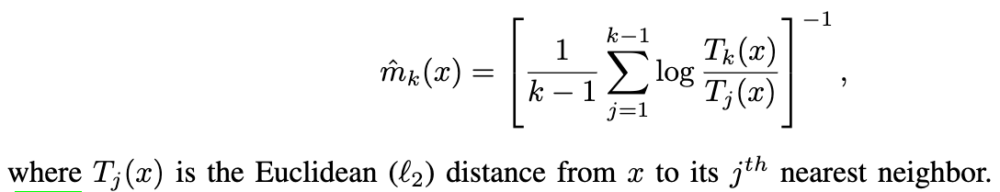

5 0.8 5
10 0.8 9
15 0.8 12
20 0.8 15
25 0.8 17
30 0.8 19
35 0.8 21
40 0.8 22
45 0.8 24
50 0.8 25
55 0.8 26
60 0.8 28
65 0.8 29
70 0.8 30
75 0.8 31
80 0.8 33
85 0.8 34
90 0.8 35
95 0.8 35
100 0.8 36
105 0.8 39
110 0.8 40
115 0.8 40
120 0.8 40
125 0.8 42
130 0.8 43
135 0.8 43
140 0.8 44
145 0.8 45
150 0.8 46
155 0.8 47
160 0.8 46
165 0.8 49
170 0.8 48
175 0.8 50
180 0.8 50
185 0.8 51
190 0.8 52
195 0.8 53
200 0.8 52
205 0.8 53
210 0.8 54
215 0.8 55
220 0.8 55
225 0.8 56
230 0.8 57
235 0.8 58
240 0.8 56
245 0.8 59
250 0.8 59
255 0.8 59
260 0.8 60
265 0.8 62
270 0.8 60
275 0.8 62
280 0.8 63
285 0.8 64
290 0.8 60
295 0.8 64
300 0.8 65
305 0.8 66
310 0.8 66
315 0.8 63
320 0.8 68
325 0.8 67
330 0.8 68
335 0.8 69
340 0.8 70
345 0.8 66
350 0.8 71
355 0.8 71
360 0.8 69
365 0.8 72
370 0.8 69
375 0.8 71
380 0.8 72
385 0.8 73
390 0.8 70
395 0.8 76
400 0.8 75
405 0.8 72
410 0.8 67
415 0.8 74
420 0.8 77
425 0.8 74
430 0.8 78
435 0.8 76
440 0.8 78
445 0.8 79
450 0.8 79
455 0.8 74
460 0.8 80
465 0.8 78

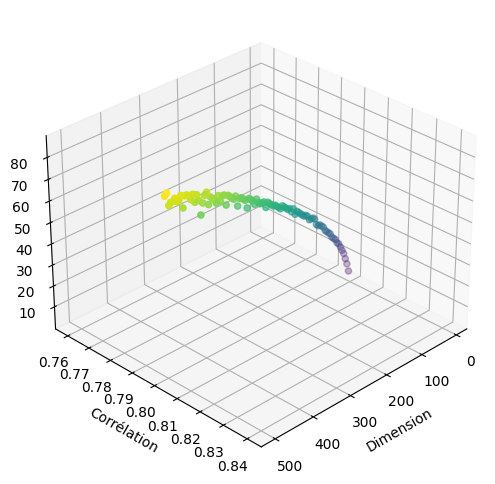

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler

import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from numpy.random import multivariate_normal

def create_covariance_matrix(dim, corr):
    if corr < -1 or corr > 1:
        raise ValueError("La corrélation doit être entre -1 et 1.")
    covariance_matrix = np.full((dim, dim), corr)  # La diagonale sera composée de 1 (variance pour une distribution normale standard)
    np.fill_diagonal(covariance_matrix, 1)
    return covariance_matrix

def generate_correlated_variables(n_samples, num_variables, correlation):
    mean = np.zeros(num_variables)  # Moyenne zéro pour une distribution normale standard
    covariance_matrix = create_covariance_matrix(num_variables, correlation)
    samples = np.random.multivariate_normal(mean, covariance_matrix, size=n_samples)  # Génère les échantillons à partir de la distribution normale multivariée
    df = pd.DataFrame(samples, columns=[f'Variable_{i+1}' for i in range(num_variables)])  # Convertit en DataFrame pandas
    return df

from sklearn.neighbors import NearestNeighbors
import random
import numpy as np

def Tj_x(distances, j):
    return distances[j]

# Paramètres pour la plage de corrélation et le nombre de dimensions
correlation_values = [0.8]  # Corrélation de 0,8
dimension_values = np.arange(5, 501, 5)  # Dimensions de 5 à 500, par pas de 5

# Préparer les données pour le graphique 3D
X = []  # Liste pour les dimensions
Y = []  # Liste pour les valeurs de corrélation
Z = []  # Liste pour les dimensions effectives

for dim in dimension_values:
    for corr in correlation_values:
        X.append(dim)
        Y.append(corr)
        # Paramètres
        n_samples = 10000  # Nombre d'échantillons
        num_variables = dim  # Nombre de variables
        correlation = corr  # Corrélation souhaitée

        # Générer les variables corrélées
        df = generate_correlated_variables(n_samples, num_variables, correlation)

        # Remplacer les valeurs NaN par 0
        df.fillna(0, inplace=True)

        # Liste des colonnes contenant du texte
        text_columns = df.select_dtypes(include=['object']).columns

        # Remplacement du texte par des valeurs numériques
        for column in text_columns:
            le = LabelEncoder()
            df[column] = le.fit_transform(df[column].astype(str))

        # Création d'un objet MinMaxScaler
        scaler = MinMaxScaler()

        # Normalisation des colonnes du DataFrame
        df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

        k = 30
        nbrs = NearestNeighbors(n_neighbors=k+1, metric='euclidean').fit(df.values)
        distances, _ = nbrs.kneighbors(df.values)

        somme = 0
        random_indices = random.sample(range(df.shape[0]), 500)
        for i in random_indices:
            mk_x = 0
            for j in range(1, k):
                a = np.log(Tj_x(distances[i], k) / Tj_x(distances[i], j))
                mk_x += a
            mk_x = (1 / (k-1) * mk_x) ** (-1)
            somme += (mk_x ** (-1))

        effective_dimensions = round(((1 / 500) * somme) ** (-1))

        Z.append(effective_dimensions)
        print(dim, corr, Z[-1])

# Création du graphe 3D avec une vue isométrique
fig = plt.figure(figsize=(12, 6))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(X, Y, Z, c=Z, cmap='viridis')
ax.set_xlabel('Dimension')
ax.set_ylabel('Corrélation')

# Définir la vue isométrique
ax.view_init(elev=30, azim=45)  # Angles choisis pour une vue isométrique standard

# Affichage du graphe
plt.show()

## Méthode avec le ratio de variance avec heuristique :

5 0.0 5
5 0.1111111111111111 5
5 0.2222222222222222 5
5 0.3333333333333333 4
5 0.4444444444444444 2
5 0.5555555555555556 1
5 0.6666666666666666 1
5 0.7777777777777777 1
5 0.8888888888888888 1
5 1.0 1
10 0.0 10
10 0.1111111111111111 10
10 0.2222222222222222 10
10 0.3333333333333333 8
10 0.4444444444444444 2
10 0.5555555555555556 1
10 0.6666666666666666 1
10 0.7777777777777777 1
10 0.8888888888888888 1
10 1.0 1
15 0.0 15
15 0.1111111111111111 15
15 0.2222222222222222 15
15 0.3333333333333333 11
15 0.4444444444444444 4
15 0.5555555555555556 1
15 0.6666666666666666 1
15 0.7777777777777777 1
15 0.8888888888888888 1
15 1.0 1
20 0.0 20
20 0.1111111111111111 20
20 0.2222222222222222 20
20 0.3333333333333333 15
20 0.4444444444444444 6
20 0.5555555555555556 1
20 0.6666666666666666 1
20 0.7777777777777777 1
20 0.8888888888888888 1
20 1.0 1
25 0.0 25
25 0.1111111111111111 25
25 0.2222222222222222 25
25 0.3333333333333333 16
25 0.4444444444444444 4
25 0.5555555555555556 1
25 0.6666666666666666 1
25

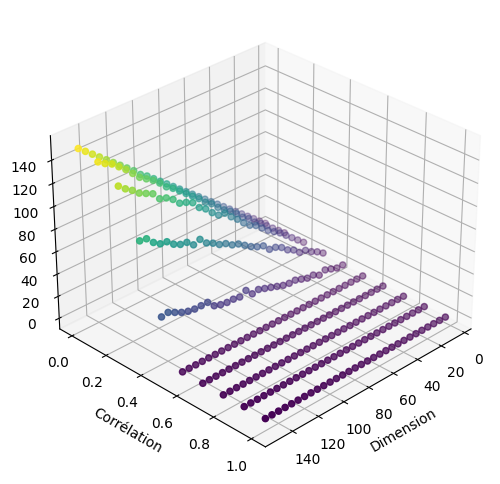

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler

import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from numpy.random import multivariate_normal

def create_covariance_matrix(dim, corr):
    if corr < -1 or corr > 1:
        raise ValueError("La corrélation doit être entre -1 et 1.")
    covariance_matrix = np.full((dim, dim), corr)  # La diagonale sera composée de 1 (variance pour une distribution normale standard)
    np.fill_diagonal(covariance_matrix, 1)
    return covariance_matrix

def generate_correlated_variables(n_samples, num_variables, correlation):
    mean = np.zeros(num_variables)  # Moyenne zéro pour une distribution normale standard
    covariance_matrix = create_covariance_matrix(num_variables, correlation)
    samples = np.random.multivariate_normal(mean, covariance_matrix, size=n_samples)  # Génère les échantillons à partir de la distribution normale multivariée
    df = pd.DataFrame(samples, columns=[f'Variable_{i+1}' for i in range(num_variables)])  # Convertit en DataFrame pandas
    return df

# Paramètres pour la plage de corrélation et le nombre de dimensions
correlation_values = np.linspace(0, 1, 10)  # 10 valeurs de corrélation de 0 à 1
dimension_values = np.arange(5, 151, 5)  # Dimensions de 5 à 150, par pas de 5

# Préparer les données pour le graphique 3D
X = []  # Liste pour les dimensions
Y = []  # Liste pour les valeurs de corrélation
Z = []  # Liste pour les dimensions effectives

for dim in dimension_values:
    for corr in correlation_values:
        X.append(dim)
        Y.append(corr)
        # Paramètres
        n_samples = 10000  # Nombre d'échantillons
        num_variables = dim  # Nombre de variables
        correlation = corr  # Corrélation souhaitée

        # Générer les variables corrélées
        df = generate_correlated_variables(n_samples, num_variables, correlation)

        # Remplacer les valeurs NaN par 0
        df.fillna(0, inplace=True)

        # Liste des colonnes contenant du texte
        text_columns = df.select_dtypes(include=['object']).columns

        # Remplacement du texte par des valeurs numériques
        for column in text_columns:
            le = LabelEncoder()
            df[column] = le.fit_transform(df[column].astype(str))

        # Création d'un objet MinMaxScaler
        scaler = MinMaxScaler()

        # Normalisation des colonnes du DataFrame
        df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

        # Calculer la matrice de covariance
        cov_matrix = np.cov(df, rowvar=False)

        # Définir les options d'affichage pour la matrice de covariance
        np.set_printoptions(precision=4, suppress=True)

        # Décomposition en valeurs propres
        eigenvalues, eigenvectors = np.linalg.eig(cov_matrix)

        # Calculer la somme des valeurs propres
        total_variance = np.sum(eigenvalues)

        # Calculer les proportions de variance
        variance_ratios = eigenvalues / total_variance

        # Calculer le nombre de dimensions effectives
        effective_dimensions = np.sum(variance_ratios > (1 / (1.6180 * dim)))

        Z.append(effective_dimensions)
        print(dim, corr, Z[-1])

# Création du graphe 3D avec une vue isométrique
fig = plt.figure(figsize=(12, 6))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(X, Y, Z, c=Z, cmap='viridis')
ax.set_xlabel('Dimension')
ax.set_ylabel('Corrélation')

# Définir la vue isométrique
ax.view_init(elev=30, azim=45)  # Angles choisis pour une vue isométrique standard

# Affichage du graphe
plt.show()

## Méthode avec le ratio de variance et avec le plus proche voisin (2) :

5 0.0 3
5 0.1 3
5 0.2 3
5 0.30000000000000004 3
5 0.4 3
5 0.5 3
5 0.6000000000000001 3
5 0.7000000000000001 3
5 0.8 2
5 0.9 2
5 0.91 2
5 0.92 2
5 0.93 2
5 0.9400000000000001 2
5 0.95 2
5 0.96 2
5 0.97 2
5 0.98 2
5 0.99 2
5 0.991 2
5 0.992 2
5 0.993 2
5 0.994 2
5 0.995 2
5 0.996 2
5 0.997 2
5 0.998 2
5 0.999 2
5 1.0 1
10 0.0 5
10 0.1 5
10 0.2 5
10 0.30000000000000004 5
10 0.4 5
10 0.5 5
10 0.6000000000000001 5
10 0.7000000000000001 5
10 0.8 4
10 0.9 4
10 0.91 4
10 0.92 4
10 0.93 4
10 0.9400000000000001 4
10 0.95 4
10 0.96 4
10 0.97 4
10 0.98 4
10 0.99 4
10 0.991 3
10 0.992 3
10 0.993 3
10 0.994 3
10 0.995 3
10 0.996 3
10 0.997 3
10 0.998 3
10 0.999 3
10 1.0 1
15 0.0 8
15 0.1 8
15 0.2 8
15 0.30000000000000004 8
15 0.4 7
15 0.5 8
15 0.6000000000000001 7
15 0.7000000000000001 7
15 0.8 5
15 0.9 5
15 0.91 5
15 0.92 5
15 0.93 5
15 0.9400000000000001 5
15 0.95 5
15 0.96 5
15 0.97 5
15 0.98 5
15 0.99 5
15 0.991 5
15 0.992 5
15 0.993 5
15 0.994 5
15 0.995 5
15 0.996 5
15 0.997 5
15 0.998 4
15 0.

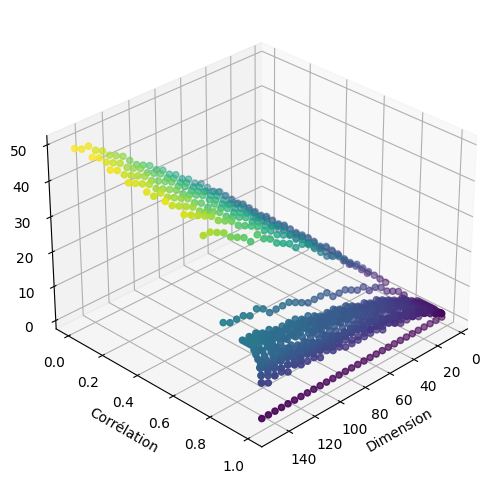

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler

import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from numpy.random import multivariate_normal

def create_covariance_matrix(dim, corr):
    if corr < -1 or corr > 1:
        raise ValueError("La corrélation doit être entre -1 et 1.")
    covariance_matrix = np.full((dim, dim), corr)  # La diagonale sera composée de 1 (variance pour une distribution normale standard)
    np.fill_diagonal(covariance_matrix, 1)
    return covariance_matrix

def generate_correlated_variables(n_samples, num_variables, correlation):
    mean = np.zeros(num_variables)  # Moyenne zéro pour une distribution normale standard
    covariance_matrix = create_covariance_matrix(num_variables, correlation)
    samples = np.random.multivariate_normal(mean, covariance_matrix, size=n_samples)  # Génère les échantillons à partir de la distribution normale multivariée
    df = pd.DataFrame(samples, columns=[f'Variable_{i+1}' for i in range(num_variables)])  # Convertit en DataFrame pandas
    return df

from sklearn.neighbors import NearestNeighbors
import random
import numpy as np

# Diviser les données en deux parties
def split_dataframe(dataframe, percentage):
    #df_shuffled = dataframe.sample(frac=1, random_state=42, axis=1).reset_index(drop=True)  # Mélanger les données pour une répartition aléatoire
    split_index = int(dataframe.shape[1] * percentage)  # Calculer l'index pour la séparation
    dataframe_1 = dataframe.iloc[:, :split_index]
    dataframe_2 = dataframe.iloc[:, split_index:]
    return dataframe_1, dataframe_2

def Tj_x(distances, j):
    return distances[j]

# Paramètres pour la plage de corrélation et le nombre de dimensions
correlation_values = np.concatenate((np.linspace(0, 0.9, 10), np.linspace(0.91, 0.99, 9), np.linspace(0.991, 1, 10)))  # 29 valeurs de corrélation de 0 à 1
dimension_values = np.arange(5, 151, 5)  # Dimensions de 5 à 150, par pas de 5

# Préparer les données pour le graphique 3D
X = []  # Liste pour les dimensions
Y = []  # Liste pour les valeurs de corrélation
Z = []  # Liste pour les dimensions effectives

for dim in dimension_values:
    for corr in correlation_values:
        X.append(dim)
        Y.append(corr)
        # Paramètres
        n_samples = 10000  # Nombre d'échantillons
        num_variables = dim  # Nombre de variables
        correlation = corr  # Corrélation souhaitée

        # Générer les variables corrélées
        df = generate_correlated_variables(n_samples, num_variables, correlation)

        # Remplacer les valeurs NaN par 0
        df.fillna(0, inplace=True)

        # Liste des colonnes contenant du texte
        text_columns = df.select_dtypes(include=['object']).columns

        # Remplacement du texte par des valeurs numériques
        for column in text_columns:
            le = LabelEncoder()
            df[column] = le.fit_transform(df[column].astype(str))

        # Création d'un objet MinMaxScaler
        scaler = MinMaxScaler()

        # Normalisation des colonnes du DataFrame
        df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

        df_1, df_2 = split_dataframe(df, 0.4)

        if df_1.empty:
            effective_dimensions_1 = 0
        elif df_1.shape[1] == 1:
            effective_dimensions_1 = 1
        else:
            # Calculer la matrice de covariance
            cov_matrix = np.cov(df_1, rowvar=False)

            # Définir les options d'affichage pour la matrice de covariance
            np.set_printoptions(precision=4, suppress=True)

            # Décomposition en valeurs propres
            eigenvalues, eigenvectors = np.linalg.eig(cov_matrix)

            # Calculer la somme des valeurs propres
            total_variance = np.sum(eigenvalues)

            # Calculer les proportions de variance
            variance_ratios = eigenvalues / total_variance

            # Calculer le nombre de dimensions effectives
            effective_dimensions_1 = np.sum(variance_ratios > (1 / (1.6180 * dim)))

        if df_2.empty:
            effective_dimensions_1 = 0
        else:
            k = 30
            nbrs = NearestNeighbors(n_neighbors=k+1, metric='euclidean').fit(df_2.values)
            distances, _ = nbrs.kneighbors(df_2.values)

            somme = 0
            random_indices = random.sample(range(df_2.shape[0]), 500)
            for i in random_indices:
                mk_x = 0
                for j in range(1, k):
                    a = np.log(Tj_x(distances[i], k) / Tj_x(distances[i], j))
                    mk_x += a
                mk_x = (1 / (k-1) * mk_x) ** (-1)
                somme += (mk_x ** (-1))

            effective_dimensions_2 = round(((1 / 500) * somme) ** (-1))

        effective_dimensions = round(effective_dimensions_1 * (df_1.shape[1] / df.shape[1]) + effective_dimensions_2 * (df_2.shape[1] / df.shape[1]))

        Z.append(effective_dimensions)
        print(dim, corr, Z[-1])

# Création du graphe 3D avec une vue isométrique
fig = plt.figure(figsize=(12, 6))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(X, Y, Z, c=Z, cmap='viridis')
ax.set_xlabel('Dimension')
ax.set_ylabel('Corrélation')

# Définir la vue isométrique
ax.view_init(elev=30, azim=45)  # Angles choisis pour une vue isométrique standard

# Affichage du graphe
plt.show()

# **Réprésentation graphique et calcul de dimension**

## German Credit Risk à 9 dimensions :

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler

import plotly.graph_objs as go

df = pd.read_csv('german_credit_risk_9.csv', sep=',')

df = df.drop(df.columns[0], axis=1)

print(df.head())

# Remplacer les valeurs NaN par 0
df.fillna(0, inplace=True)

# Liste des colonnes contenant du texte
text_columns = df.select_dtypes(include=['object']).columns

# Remplacement du texte par des valeurs numériques
for column in text_columns:
    le = LabelEncoder()
    df[column] = le.fit_transform(df[column].astype(str))

# Création d'un objet MinMaxScaler
scaler = MinMaxScaler()

# Normalisation des colonnes du DataFrame
df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

# Affichage du DataFrame modifié
print(df.head())

# Obtenez les statistiques
means = df.mean()  # Calcul des moyennes pour chaque colonne
stds = df.std()  # Calcul des écarts-types pour chaque colonne
mean_correlations = df.corr().mean()  # Calcul des corrélations pour chaque colonne

# Afficher les résultats
print()
print("------------Moyennes------------")
print(means)
print()
print("----------Écarts-types----------")
print(stds)
print()
print("---Moyennes des corrélations---")
print(mean_correlations)

# Fonction pour générer les points sur une sphère
def generate_sphere_points(mean, std, mean_correlation, center=[0, 0, 0]):
    phi = np.random.uniform(0, np.pi)
    theta = np.random.uniform(0, 2 * np.pi)
    x = [mean * np.sin(phi) * np.cos(theta) + center[0],
         std * np.sin(phi) * np.cos(theta) + center[0],
         mean_correlation * np.sin(phi) * np.cos(theta) + center[0]]
    y = [mean * np.sin(phi) * np.sin(theta) + center[1],
         std * np.sin(phi) * np.sin(theta) + center[1],
         mean_correlation * np.sin(phi) * np.sin(theta) + center[1]]
    z = [mean * np.cos(phi) + center[2],
         std * np.cos(phi) + center[2],
         mean_correlation * np.cos(phi) + center[2]]
    return x, y, z

# Préparer les données pour le graphique 3D
X_means_3d = []
Y_means_3d = []
Z_means_3d = []
X_stds_3d = []
Y_stds_3d = []
Z_stds_3d = []
X_mean_correlations_3d = []
Y_mean_correlations_3d = []
Z_mean_correlations_3d = []
X_lines_3d = []
Y_lines_3d = []
Z_lines_3d = []

# Générer les points pour chaque colonne
for i in range(df.shape[1]):
    x, y, z = generate_sphere_points(means[i], stds[i], mean_correlations[i])
    X_means_3d.append(x[0])
    Y_means_3d.append(y[0])
    Z_means_3d.append(z[0])
    X_stds_3d.append(x[1])
    Y_stds_3d.append(y[1])
    Z_stds_3d.append(z[1])
    X_mean_correlations_3d.append(x[2])
    Y_mean_correlations_3d.append(y[2])
    Z_mean_correlations_3d.append(z[2])
    X_lines_3d += [0, x[0], None]
    Y_lines_3d += [0, y[0], None]
    Z_lines_3d += [0, z[0], None]
    X_lines_3d += [0, x[1], None]
    Y_lines_3d += [0, y[1], None]
    Z_lines_3d += [0, z[1], None]
    X_lines_3d += [0, x[2], None]
    Y_lines_3d += [0, y[2], None]
    Z_lines_3d += [0, z[2], None]

# Créer le graphique avec plotly
trace_means_3d = go.Scatter3d(
    x=X_means_3d,
    y=Y_means_3d,
    z=Z_means_3d,
    mode='markers',
    marker=dict(
        size=5,
        color='blue',
    ),
    name='Moyennes'
)

trace_stds_3d = go.Scatter3d(
    x=X_stds_3d,
    y=Y_stds_3d,
    z=Z_stds_3d,
    mode='markers',
    marker=dict(
        size=5,
        color='red',
    ),
    name='Écarts-types'
)

trace_mean_correlations_3d = go.Scatter3d(
    x=X_mean_correlations_3d,
    y=Y_mean_correlations_3d,
    z=Z_mean_correlations_3d,
    mode='markers',
    marker=dict(
        size=5,
        color='green',
    ),
    name='Moyennes des corrélations'
)

trace_lines_3d = go.Scatter3d(
    x=X_lines_3d,
    y=Y_lines_3d,
    z=Z_lines_3d,
    mode='lines',
    line=dict(
        color='black',
        width=2
    ),
    name='Lignes'
)

fig_3d = go.Figure(data=[trace_means_3d, trace_stds_3d, trace_mean_correlations_3d, trace_lines_3d])

# Afficher le graphique
fig_3d.show()

# Fonction pour générer les points sur un cercle
def generate_circle_points(mean, std, mean_correlation, center=[0, 0]):
    theta = np.random.uniform(0, 2 * np.pi)
    x = [mean * np.cos(theta) + center[0],
         std * np.cos(theta) + center[0],
         mean_correlation * np.cos(theta) + center[0]]
    y = [mean * np.sin(theta) + center[1],
         std * np.sin(theta) + center[1],
         mean_correlation * np.sin(theta) + center[1]]
    return x, y

# Préparer les données pour le graphique 2D
X_means_2d = []
Y_means_2d = []
X_stds_2d = []
Y_stds_2d = []
X_mean_correlations_2d = []
Y_mean_correlations_2d = []
X_lines_2d = []
Y_lines_2d = []

# Générer les points pour chaque colonne
for i in range(df.shape[1]):
    x, y = generate_circle_points(means[i], stds[i], mean_correlations[i])
    X_means_2d.append(x[0])
    Y_means_2d.append(y[0])
    X_stds_2d.append(x[1])
    Y_stds_2d.append(y[1])
    X_mean_correlations_2d.append(x[2])
    Y_mean_correlations_2d.append(y[2])
    X_lines_2d += [0, x[0], None]
    Y_lines_2d += [0, y[0], None]
    X_lines_2d += [0, x[1], None]
    Y_lines_2d += [0, y[1], None]
    X_lines_2d += [0, x[2], None]
    Y_lines_2d += [0, y[2], None]

# Créer le graphique avec plotly
trace_means_2d = go.Scatter(
    x=X_means_2d,
    y=Y_means_2d,
    mode='markers',
    marker=dict(
        size=10,
        color='blue'
    ),
    name='Moyennes'
)

trace_stds_2d = go.Scatter(
    x=X_stds_2d,
    y=Y_stds_2d,
    mode='markers',
    marker=dict(
        size=10,
        color='red'
    ),
    name='Écarts-types'
)

trace_mean_correlations_2d = go.Scatter(
    x=X_mean_correlations_2d,
    y=Y_mean_correlations_2d,
    mode='markers',
    marker=dict(
        size=10,
        color='green'
    ),
    name='Moyennes des corrélations'
)

trace_lines_2d = go.Scatter(
    x=X_lines_2d,
    y=Y_lines_2d,
    mode='lines',
    line=dict(
        color='black',
        width=1
    ),
    name='Lignes'
)

fig_2d = go.Figure(data=[trace_means_2d, trace_stds_2d, trace_mean_correlations_2d, trace_lines_2d])

# Afficher le graphique
fig_2d.show()

# Fonction pour générer les points sur un cercle
def generate_line_points(mean, std, mean_correlation, center=0):
    x = [mean + center,
         std + center,
         mean_correlation + center]
    return x

# Préparer les données pour le graphique 1D
X_means_1d = []
X_stds_1d = []
X_mean_correlations_1d = []

# Générer les points pour chaque colonne
for i in range(df.shape[1]):
    x = generate_line_points(means[i], stds[i], mean_correlations[i])
    X_means_1d.append(x[0])
    X_stds_1d.append(x[1])
    X_mean_correlations_1d.append(x[2])

# Créer le graphique avec plotly
trace_means_1d = go.Scatter(
    x=X_means_1d,
    y=[0] * df.shape[1],
    mode='markers',
    marker=dict(
        size=10,
        color='blue'
    ),
    name='Moyennes'
)

trace_stds_1d = go.Scatter(
    x=X_stds_1d,
    y=[0] * df.shape[1],
    mode='markers',
    marker=dict(
        size=10,
        color='red'
    ),
    name='Écarts-types'
)

trace_mean_correlations_1d = go.Scatter(
    x=X_mean_correlations_1d,
    y=[0] * df.shape[1],
    mode='markers',
    marker=dict(
        size=10,
        color='green'
    ),
    name='Moyennes des corrélations'
)

fig_1d = go.Figure(data=[trace_means_1d, trace_stds_1d, trace_mean_correlations_1d])

# Afficher le graphique
fig_1d.show()

   Age     Sex  Job Housing Saving accounts Checking account  Credit amount  \
0   67    male    2     own             NaN           little           1169   
1   22  female    2     own          little         moderate           5951   
2   49    male    1     own          little              NaN           2096   
3   45    male    2    free          little           little           7882   
4   53    male    2    free          little           little           4870   

   Duration              Purpose  
0         6             radio/TV  
1        48             radio/TV  
2        12            education  
3        42  furniture/equipment  
4        24                  car  
        Age  Sex       Job  Housing  Saving accounts  Checking account  \
0  0.857143  1.0  0.666667      0.5             0.00          0.333333   
1  0.053571  0.0  0.666667      0.5             0.25          0.666667   
2  0.535714  1.0  0.333333      0.5             0.25          0.000000   
3  0.464286  1.0  0

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will chang

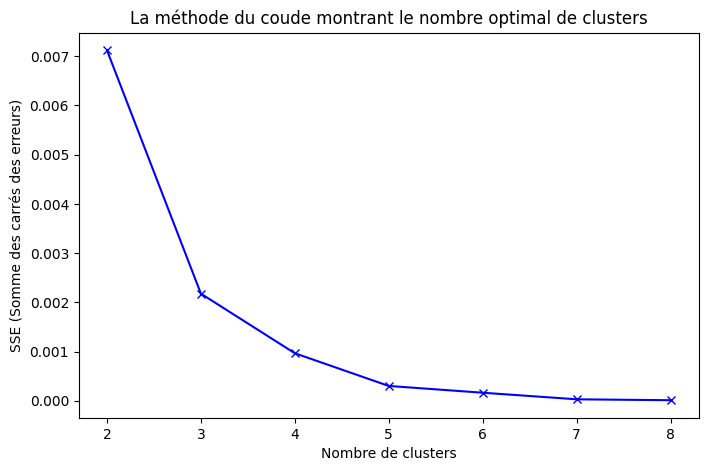

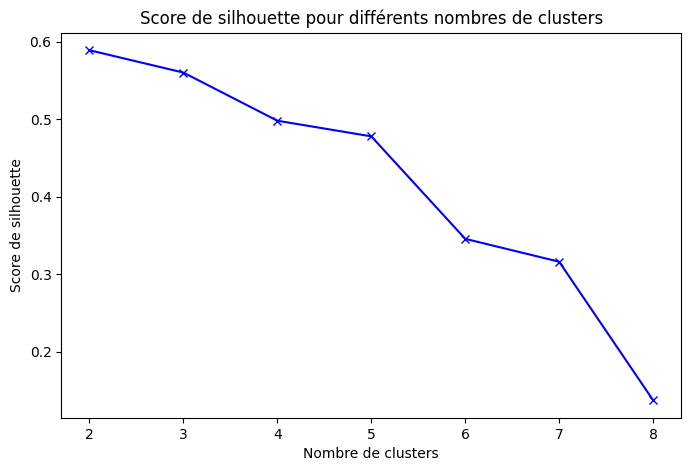

Nombre optimal de clusters selon le score de silhouette : 2.

Le nombre de clusters k pour lequel le score de silhouette est le plus proche de 0.5 est : 4.


In [ ]:
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

X = [X_mean_correlations_1d[i] for i in range(df.shape[1]) if not np.isnan(X_mean_correlations_1d[i])]

# Convertir la liste en un tableau NumPy en 1D pour un traitement plus rapide
X = np.array(X).reshape(-1, 1)

# Recherche du nombre optimal de clusters avec la méthode du coude et le score de silhouette
sse = {}  # Pour stocker la somme des carrés des erreurs
silhouette_scores = {}
for k in range(2, min(df.shape[1], 50)):  # Testez un nombre de clusters de 2 au minimum entre la dimension et 50
    kmeans = KMeans(n_clusters=k, random_state=42).fit(X)
    sse[k] = kmeans.inertia_  # Somme des carrés des erreurs pour ce nombre de clusters
    silhouette_scores[k] = silhouette_score(X, kmeans.labels_)

# Tracer la courbe du coude
plt.figure(figsize=(8, 5))
plt.plot(list(sse.keys()), list(sse.values()), 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel('SSE (Somme des carrés des erreurs)')
plt.title('La méthode du coude montrant le nombre optimal de clusters')
plt.show()

# Tracer la courbe de silhouette
plt.figure(figsize=(8, 5))
plt.plot(list(silhouette_scores.keys()), list(silhouette_scores.values()), 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel('Score de silhouette')
plt.title('Score de silhouette pour différents nombres de clusters')
plt.show()

# Déterminer le nombre optimal de clusters en utilisant le score de silhouette
optimal_k = max(silhouette_scores, key=silhouette_scores.get)
print(f'Nombre optimal de clusters selon le score de silhouette : {optimal_k}.\n')

# Calculer la différence absolue avec 0.5 pour chaque score de silhouette
diff_to_half = {k: abs(score - 0.5) for k, score in silhouette_scores.items()}

# Trouver le nombre de clusters k pour laquelle la différence est la plus petite
optimal_k_closest_to_half = min(diff_to_half, key=diff_to_half.get)

print(f'Le nombre de clusters k pour lequel le score de silhouette est le plus proche de 0.5 est : {optimal_k_closest_to_half}.')

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will chang

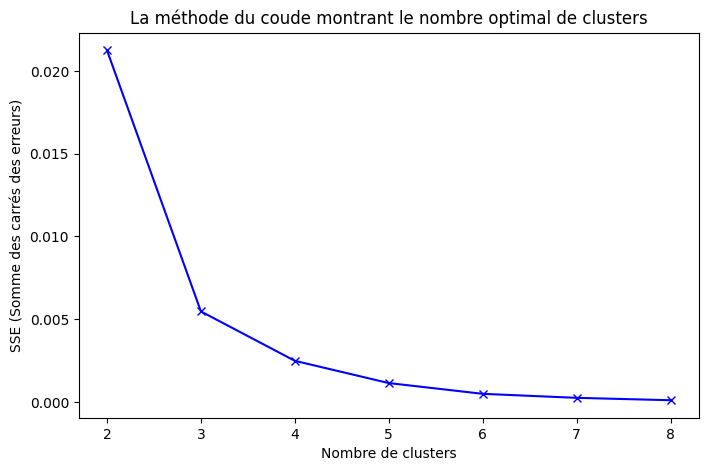

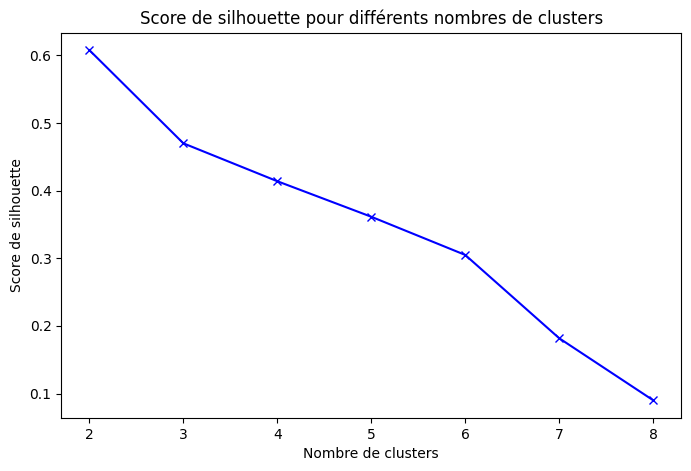

Nombre optimal de clusters selon le score de silhouette : 2.

Le nombre de clusters k pour lequel le score de silhouette est le plus proche de 0.5 est : 3.


In [ ]:
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

X = [X_stds_1d[i] for i in range(df.shape[1]) if not np.isnan(X_stds_1d[i])]

# Convertir la liste en un tableau NumPy en 1D pour un traitement plus rapide
X = np.array(X).reshape(-1, 1)

# Recherche du nombre optimal de clusters avec la méthode du coude et le score de silhouette
sse = {}  # Pour stocker la somme des carrés des erreurs
silhouette_scores = {}
for k in range(2, min(df.shape[1], 50)):  # Testez un nombre de clusters de 2 au minimum entre la dimension et 50
    kmeans = KMeans(n_clusters=k, random_state=42).fit(X)
    sse[k] = kmeans.inertia_  # Somme des carrés des erreurs pour ce nombre de clusters
    silhouette_scores[k] = silhouette_score(X, kmeans.labels_)

# Tracer la courbe du coude
plt.figure(figsize=(8, 5))
plt.plot(list(sse.keys()), list(sse.values()), 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel('SSE (Somme des carrés des erreurs)')
plt.title('La méthode du coude montrant le nombre optimal de clusters')
plt.show()

# Tracer la courbe de silhouette
plt.figure(figsize=(8, 5))
plt.plot(list(silhouette_scores.keys()), list(silhouette_scores.values()), 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel('Score de silhouette')
plt.title('Score de silhouette pour différents nombres de clusters')
plt.show()

# Déterminer le nombre optimal de clusters en utilisant le score de silhouette
optimal_k = max(silhouette_scores, key=silhouette_scores.get)
print(f'Nombre optimal de clusters selon le score de silhouette : {optimal_k}.\n')

# Calculer la différence absolue avec 0.5 pour chaque score de silhouette
diff_to_half = {k: abs(score - 0.5) for k, score in silhouette_scores.items()}

# Trouver le nombre de clusters k pour laquelle la différence est la plus petite
optimal_k_closest_to_half = min(diff_to_half, key=diff_to_half.get)

print(f'Le nombre de clusters k pour lequel le score de silhouette est le plus proche de 0.5 est : {optimal_k_closest_to_half}.')

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will chang

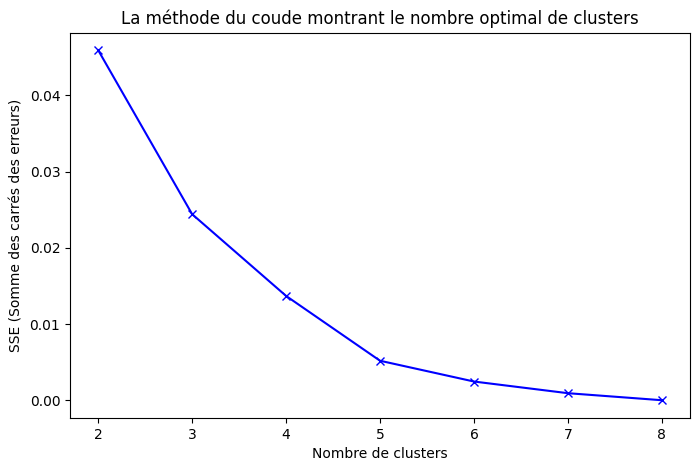

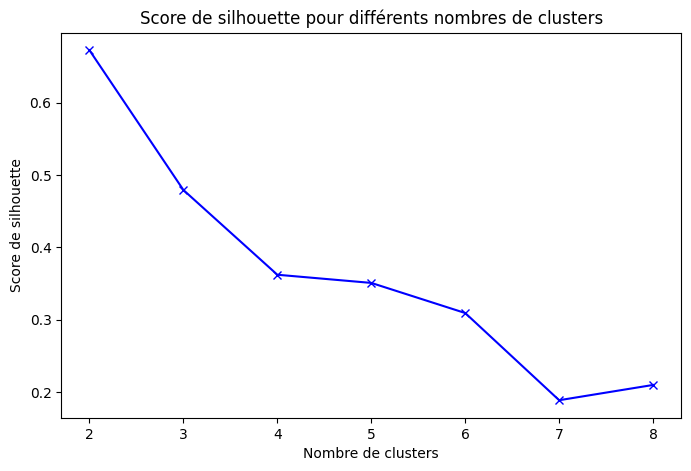

Nombre optimal de clusters selon le score de silhouette : 2.

Le nombre de clusters k pour lequel le score de silhouette est le plus proche de 0.5 est : 3.


In [ ]:
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

X = [X_means_1d[i] for i in range(df.shape[1]) if not np.isnan(X_means_1d[i])]

# Convertir la liste en un tableau NumPy en 1D pour un traitement plus rapide
X = np.array(X).reshape(-1, 1)

# Recherche du nombre optimal de clusters avec la méthode du coude et le score de silhouette
sse = {}  # Pour stocker la somme des carrés des erreurs
silhouette_scores = {}
for k in range(2, min(df.shape[1], 50)):  # Testez un nombre de clusters de 2 au minimum entre la dimension et 50
    kmeans = KMeans(n_clusters=k, random_state=42).fit(X)
    sse[k] = kmeans.inertia_  # Somme des carrés des erreurs pour ce nombre de clusters
    silhouette_scores[k] = silhouette_score(X, kmeans.labels_)

# Tracer la courbe du coude
plt.figure(figsize=(8, 5))
plt.plot(list(sse.keys()), list(sse.values()), 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel('SSE (Somme des carrés des erreurs)')
plt.title('La méthode du coude montrant le nombre optimal de clusters')
plt.show()

# Tracer la courbe de silhouette
plt.figure(figsize=(8, 5))
plt.plot(list(silhouette_scores.keys()), list(silhouette_scores.values()), 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel('Score de silhouette')
plt.title('Score de silhouette pour différents nombres de clusters')
plt.show()

# Déterminer le nombre optimal de clusters en utilisant le score de silhouette
optimal_k = max(silhouette_scores, key=silhouette_scores.get)
print(f'Nombre optimal de clusters selon le score de silhouette : {optimal_k}.\n')

# Calculer la différence absolue avec 0.5 pour chaque score de silhouette
diff_to_half = {k: abs(score - 0.5) for k, score in silhouette_scores.items()}

# Trouver le nombre de clusters k pour laquelle la différence est la plus petite
optimal_k_closest_to_half = min(diff_to_half, key=diff_to_half.get)

print(f'Le nombre de clusters k pour lequel le score de silhouette est le plus proche de 0.5 est : {optimal_k_closest_to_half}.')

## German Credit Risk à 21 dimensions :

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler

import plotly.graph_objs as go

df = pd.read_csv('german_credit_risk_21.csv', sep=',')

print(df.head())

# Remplacer les valeurs NaN par 0
df.fillna(0, inplace=True)

# Liste des colonnes contenant du texte
text_columns = df.select_dtypes(include=['object']).columns

# Remplacement du texte par des valeurs numériques
for column in text_columns:
    le = LabelEncoder()
    df[column] = le.fit_transform(df[column].astype(str))

# Création d'un objet MinMaxScaler
scaler = MinMaxScaler()

# Normalisation des colonnes du DataFrame
df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

# Affichage du DataFrame modifié
print(df.head())

# Obtenez les statistiques
means = df.mean()  # Calcul des moyennes pour chaque colonne
stds = df.std()  # Calcul des écarts-types pour chaque colonne
mean_correlations = df.corr().mean()  # Calcul des corrélations pour chaque colonne

# Afficher les résultats
print()
print("------------Moyennes------------")
print(means)
print()
print("----------Écarts-types----------")
print(stds)
print()
print("---Moyennes des corrélations---")
print(mean_correlations)

# Fonction pour générer les points sur une sphère
def generate_sphere_points(mean, std, mean_correlation, center=[0, 0, 0]):
    phi = np.random.uniform(0, np.pi)
    theta = np.random.uniform(0, 2 * np.pi)
    x = [mean * np.sin(phi) * np.cos(theta) + center[0],
         std * np.sin(phi) * np.cos(theta) + center[0],
         mean_correlation * np.sin(phi) * np.cos(theta) + center[0]]
    y = [mean * np.sin(phi) * np.sin(theta) + center[1],
         std * np.sin(phi) * np.sin(theta) + center[1],
         mean_correlation * np.sin(phi) * np.sin(theta) + center[1]]
    z = [mean * np.cos(phi) + center[2],
         std * np.cos(phi) + center[2],
         mean_correlation * np.cos(phi) + center[2]]
    return x, y, z

# Préparer les données pour le graphique 3D
X_means_3d = []
Y_means_3d = []
Z_means_3d = []
X_stds_3d = []
Y_stds_3d = []
Z_stds_3d = []
X_mean_correlations_3d = []
Y_mean_correlations_3d = []
Z_mean_correlations_3d = []
X_lines_3d = []
Y_lines_3d = []
Z_lines_3d = []

# Générer les points pour chaque colonne
for i in range(df.shape[1]):
    x, y, z = generate_sphere_points(means[i], stds[i], mean_correlations[i])
    X_means_3d.append(x[0])
    Y_means_3d.append(y[0])
    Z_means_3d.append(z[0])
    X_stds_3d.append(x[1])
    Y_stds_3d.append(y[1])
    Z_stds_3d.append(z[1])
    X_mean_correlations_3d.append(x[2])
    Y_mean_correlations_3d.append(y[2])
    Z_mean_correlations_3d.append(z[2])
    X_lines_3d += [0, x[0], None]
    Y_lines_3d += [0, y[0], None]
    Z_lines_3d += [0, z[0], None]
    X_lines_3d += [0, x[1], None]
    Y_lines_3d += [0, y[1], None]
    Z_lines_3d += [0, z[1], None]
    X_lines_3d += [0, x[2], None]
    Y_lines_3d += [0, y[2], None]
    Z_lines_3d += [0, z[2], None]

# Créer le graphique avec plotly
trace_means_3d = go.Scatter3d(
    x=X_means_3d,
    y=Y_means_3d,
    z=Z_means_3d,
    mode='markers',
    marker=dict(
        size=5,
        color='blue',
    ),
    name='Moyennes'
)

trace_stds_3d = go.Scatter3d(
    x=X_stds_3d,
    y=Y_stds_3d,
    z=Z_stds_3d,
    mode='markers',
    marker=dict(
        size=5,
        color='red',
    ),
    name='Écarts-types'
)

trace_mean_correlations_3d = go.Scatter3d(
    x=X_mean_correlations_3d,
    y=Y_mean_correlations_3d,
    z=Z_mean_correlations_3d,
    mode='markers',
    marker=dict(
        size=5,
        color='green',
    ),
    name='Moyennes des corrélations'
)

trace_lines_3d = go.Scatter3d(
    x=X_lines_3d,
    y=Y_lines_3d,
    z=Z_lines_3d,
    mode='lines',
    line=dict(
        color='black',
        width=2
    ),
    name='Lignes'
)

fig_3d = go.Figure(data=[trace_means_3d, trace_stds_3d, trace_mean_correlations_3d, trace_lines_3d])

# Afficher le graphique
fig_3d.show()

# Fonction pour générer les points sur un cercle
def generate_circle_points(mean, std, mean_correlation, center=[0, 0]):
    theta = np.random.uniform(0, 2 * np.pi)
    x = [mean * np.cos(theta) + center[0],
         std * np.cos(theta) + center[0],
         mean_correlation * np.cos(theta) + center[0]]
    y = [mean * np.sin(theta) + center[1],
         std * np.sin(theta) + center[1],
         mean_correlation * np.sin(theta) + center[1]]
    return x, y

# Préparer les données pour le graphique 2D
X_means_2d = []
Y_means_2d = []
X_stds_2d = []
Y_stds_2d = []
X_mean_correlations_2d = []
Y_mean_correlations_2d = []
X_lines_2d = []
Y_lines_2d = []

# Générer les points pour chaque colonne
for i in range(df.shape[1]):
    x, y = generate_circle_points(means[i], stds[i], mean_correlations[i])
    X_means_2d.append(x[0])
    Y_means_2d.append(y[0])
    X_stds_2d.append(x[1])
    Y_stds_2d.append(y[1])
    X_mean_correlations_2d.append(x[2])
    Y_mean_correlations_2d.append(y[2])
    X_lines_2d += [0, x[0], None]
    Y_lines_2d += [0, y[0], None]
    X_lines_2d += [0, x[1], None]
    Y_lines_2d += [0, y[1], None]
    X_lines_2d += [0, x[2], None]
    Y_lines_2d += [0, y[2], None]

# Créer le graphique avec plotly
trace_means_2d = go.Scatter(
    x=X_means_2d,
    y=Y_means_2d,
    mode='markers',
    marker=dict(
        size=10,
        color='blue'
    ),
    name='Moyennes'
)

trace_stds_2d = go.Scatter(
    x=X_stds_2d,
    y=Y_stds_2d,
    mode='markers',
    marker=dict(
        size=10,
        color='red'
    ),
    name='Écarts-types'
)

trace_mean_correlations_2d = go.Scatter(
    x=X_mean_correlations_2d,
    y=Y_mean_correlations_2d,
    mode='markers',
    marker=dict(
        size=10,
        color='green'
    ),
    name='Moyennes des corrélations'
)

trace_lines_2d = go.Scatter(
    x=X_lines_2d,
    y=Y_lines_2d,
    mode='lines',
    line=dict(
        color='black',
        width=1
    ),
    name='Lignes'
)

fig_2d = go.Figure(data=[trace_means_2d, trace_stds_2d, trace_mean_correlations_2d, trace_lines_2d])

# Afficher le graphique
fig_2d.show()

# Fonction pour générer les points sur un cercle
def generate_line_points(mean, std, mean_correlation, center=0):
    x = [mean + center,
         std + center,
         mean_correlation + center]
    return x

# Préparer les données pour le graphique 1D
X_means_1d = []
X_stds_1d = []
X_mean_correlations_1d = []

# Générer les points pour chaque colonne
for i in range(df.shape[1]):
    x = generate_line_points(means[i], stds[i], mean_correlations[i])
    X_means_1d.append(x[0])
    X_stds_1d.append(x[1])
    X_mean_correlations_1d.append(x[2])

# Créer le graphique avec plotly
trace_means_1d = go.Scatter(
    x=X_means_1d,
    y=[0] * df.shape[1],
    mode='markers',
    marker=dict(
        size=10,
        color='blue'
    ),
    name='Moyennes'
)

trace_stds_1d = go.Scatter(
    x=X_stds_1d,
    y=[0] * df.shape[1],
    mode='markers',
    marker=dict(
        size=10,
        color='red'
    ),
    name='Écarts-types'
)

trace_mean_correlations_1d = go.Scatter(
    x=X_mean_correlations_1d,
    y=[0] * df.shape[1],
    mode='markers',
    marker=dict(
        size=10,
        color='green'
    ),
    name='Moyennes des corrélations'
)

fig_1d = go.Figure(data=[trace_means_1d, trace_stds_1d, trace_mean_correlations_1d])

# Afficher le graphique
fig_1d.show()

   Creditability  Account Balance  Duration of Credit (month)  \
0              1                1                          18   
1              1                1                           9   
2              1                2                          12   
3              1                1                          12   
4              1                1                          12   

   Payment Status of Previous Credit  Purpose  Credit Amount  \
0                                  4        2           1049   
1                                  4        0           2799   
2                                  2        9            841   
3                                  4        0           2122   
4                                  4        0           2171   

   Value Savings/Stocks  Length of current employment  Instalment per cent  \
0                     1                             2                    4   
1                     1                             3               

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will chang

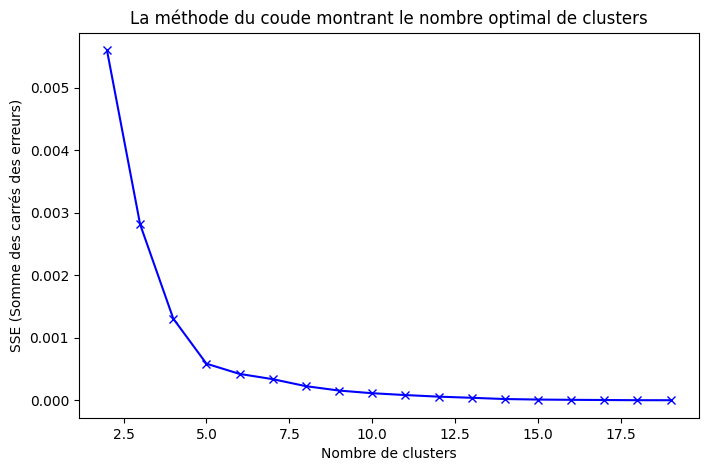

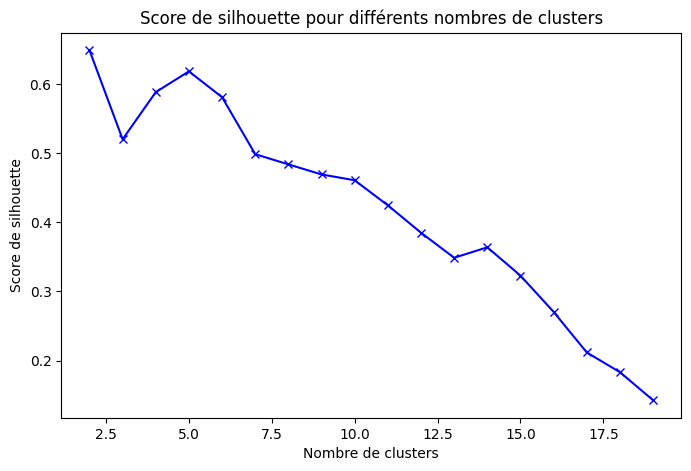

Nombre optimal de clusters selon le score de silhouette : 2.

Le nombre de clusters k pour lequel le score de silhouette est le plus proche de 0.5 est : 7.


In [ ]:
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

X = [X_mean_correlations_1d[i] for i in range(df.shape[1]) if not np.isnan(X_mean_correlations_1d[i])]

# Convertir la liste en un tableau NumPy en 1D pour un traitement plus rapide
X = np.array(X).reshape(-1, 1)

# Recherche du nombre optimal de clusters avec la méthode du coude et le score de silhouette
sse = {}  # Pour stocker la somme des carrés des erreurs
silhouette_scores = {}
for k in range(2, min(df.shape[1], 50)):  # Testez un nombre de clusters de 2 au minimum entre la dimension et 50
    kmeans = KMeans(n_clusters=k, random_state=42).fit(X)
    sse[k] = kmeans.inertia_  # Somme des carrés des erreurs pour ce nombre de clusters
    silhouette_scores[k] = silhouette_score(X, kmeans.labels_)

# Tracer la courbe du coude
plt.figure(figsize=(8, 5))
plt.plot(list(sse.keys()), list(sse.values()), 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel('SSE (Somme des carrés des erreurs)')
plt.title('La méthode du coude montrant le nombre optimal de clusters')
plt.show()

# Tracer la courbe de silhouette
plt.figure(figsize=(8, 5))
plt.plot(list(silhouette_scores.keys()), list(silhouette_scores.values()), 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel('Score de silhouette')
plt.title('Score de silhouette pour différents nombres de clusters')
plt.show()

# Déterminer le nombre optimal de clusters en utilisant le score de silhouette
optimal_k = max(silhouette_scores, key=silhouette_scores.get)
print(f'Nombre optimal de clusters selon le score de silhouette : {optimal_k}.\n')

# Calculer la différence absolue avec 0.5 pour chaque score de silhouette
diff_to_half = {k: abs(score - 0.5) for k, score in silhouette_scores.items()}

# Trouver le nombre de clusters k pour laquelle la différence est la plus petite
optimal_k_closest_to_half = min(diff_to_half, key=diff_to_half.get)

print(f'Le nombre de clusters k pour lequel le score de silhouette est le plus proche de 0.5 est : {optimal_k_closest_to_half}.')

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will chang

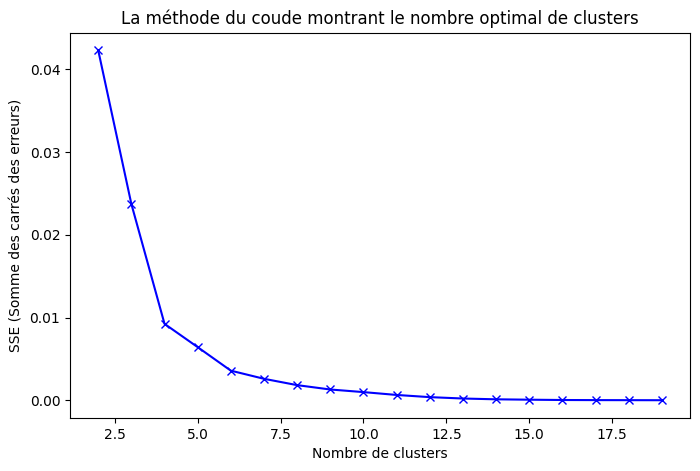

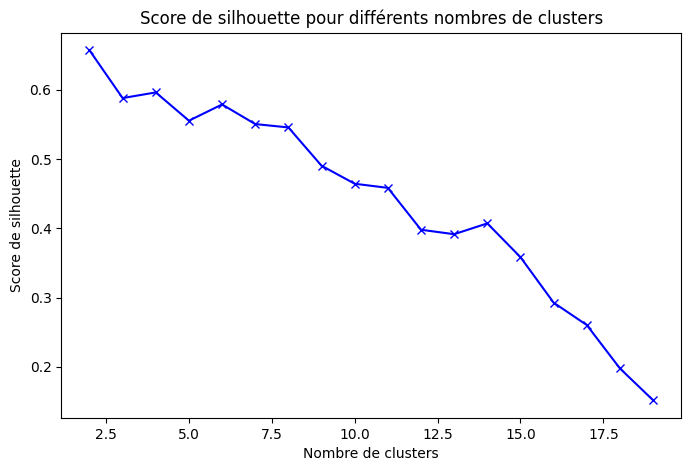

Nombre optimal de clusters selon le score de silhouette : 2.

Le nombre de clusters k pour lequel le score de silhouette est le plus proche de 0.5 est : 9.


In [ ]:
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

X = [X_stds_1d[i] for i in range(df.shape[1]) if not np.isnan(X_stds_1d[i])]

# Convertir la liste en un tableau NumPy en 1D pour un traitement plus rapide
X = np.array(X).reshape(-1, 1)

# Recherche du nombre optimal de clusters avec la méthode du coude et le score de silhouette
sse = {}  # Pour stocker la somme des carrés des erreurs
silhouette_scores = {}
for k in range(2, min(df.shape[1], 50)):  # Testez un nombre de clusters de 2 au minimum entre la dimension et 50
    kmeans = KMeans(n_clusters=k, random_state=42).fit(X)
    sse[k] = kmeans.inertia_  # Somme des carrés des erreurs pour ce nombre de clusters
    silhouette_scores[k] = silhouette_score(X, kmeans.labels_)

# Tracer la courbe du coude
plt.figure(figsize=(8, 5))
plt.plot(list(sse.keys()), list(sse.values()), 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel('SSE (Somme des carrés des erreurs)')
plt.title('La méthode du coude montrant le nombre optimal de clusters')
plt.show()

# Tracer la courbe de silhouette
plt.figure(figsize=(8, 5))
plt.plot(list(silhouette_scores.keys()), list(silhouette_scores.values()), 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel('Score de silhouette')
plt.title('Score de silhouette pour différents nombres de clusters')
plt.show()

# Déterminer le nombre optimal de clusters en utilisant le score de silhouette
optimal_k = max(silhouette_scores, key=silhouette_scores.get)
print(f'Nombre optimal de clusters selon le score de silhouette : {optimal_k}.\n')

# Calculer la différence absolue avec 0.5 pour chaque score de silhouette
diff_to_half = {k: abs(score - 0.5) for k, score in silhouette_scores.items()}

# Trouver le nombre de clusters k pour laquelle la différence est la plus petite
optimal_k_closest_to_half = min(diff_to_half, key=diff_to_half.get)

print(f'Le nombre de clusters k pour lequel le score de silhouette est le plus proche de 0.5 est : {optimal_k_closest_to_half}.')

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will chang

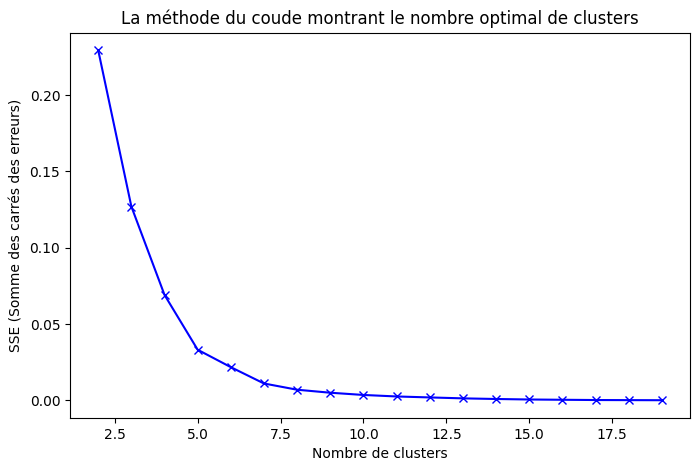

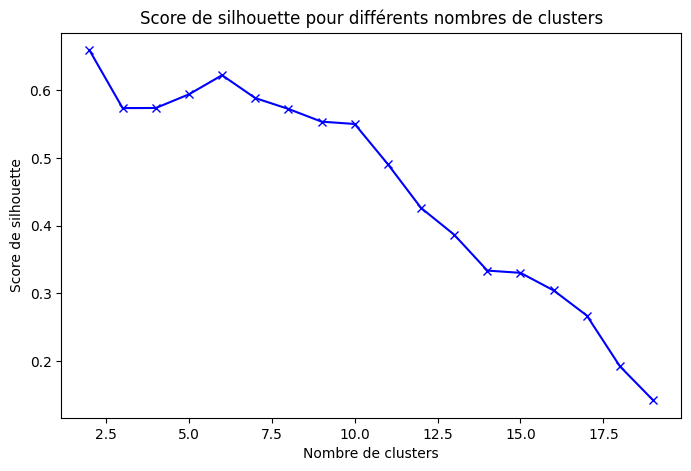

Nombre optimal de clusters selon le score de silhouette : 2.

Le nombre de clusters k pour lequel le score de silhouette est le plus proche de 0.5 est : 11.


In [ ]:
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

X = [X_means_1d[i] for i in range(df.shape[1]) if not np.isnan(X_means_1d[i])]

# Convertir la liste en un tableau NumPy en 1D pour un traitement plus rapide
X = np.array(X).reshape(-1, 1)

# Recherche du nombre optimal de clusters avec la méthode du coude et le score de silhouette
sse = {}  # Pour stocker la somme des carrés des erreurs
silhouette_scores = {}
for k in range(2, min(df.shape[1], 50)):  # Testez un nombre de clusters de 2 au minimum entre la dimension et 50
    kmeans = KMeans(n_clusters=k, random_state=42).fit(X)
    sse[k] = kmeans.inertia_  # Somme des carrés des erreurs pour ce nombre de clusters
    silhouette_scores[k] = silhouette_score(X, kmeans.labels_)

# Tracer la courbe du coude
plt.figure(figsize=(8, 5))
plt.plot(list(sse.keys()), list(sse.values()), 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel('SSE (Somme des carrés des erreurs)')
plt.title('La méthode du coude montrant le nombre optimal de clusters')
plt.show()

# Tracer la courbe de silhouette
plt.figure(figsize=(8, 5))
plt.plot(list(silhouette_scores.keys()), list(silhouette_scores.values()), 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel('Score de silhouette')
plt.title('Score de silhouette pour différents nombres de clusters')
plt.show()

# Déterminer le nombre optimal de clusters en utilisant le score de silhouette
optimal_k = max(silhouette_scores, key=silhouette_scores.get)
print(f'Nombre optimal de clusters selon le score de silhouette : {optimal_k}.\n')

# Calculer la différence absolue avec 0.5 pour chaque score de silhouette
diff_to_half = {k: abs(score - 0.5) for k, score in silhouette_scores.items()}

# Trouver le nombre de clusters k pour laquelle la différence est la plus petite
optimal_k_closest_to_half = min(diff_to_half, key=diff_to_half.get)

print(f'Le nombre de clusters k pour lequel le score de silhouette est le plus proche de 0.5 est : {optimal_k_closest_to_half}.')

## Default of Credit Card Clients Dataset :

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler

import plotly.graph_objs as go

df = pd.read_csv('default_of_credit_card_clients_dataset.csv', sep=',')

df = df.drop(df.columns[0], axis=1)

print(df.head())

# Remplacer les valeurs NaN par 0
df.fillna(0, inplace=True)

# Liste des colonnes contenant du texte
text_columns = df.select_dtypes(include=['object']).columns

# Remplacement du texte par des valeurs numériques
for column in text_columns:
    le = LabelEncoder()
    df[column] = le.fit_transform(df[column].astype(str))

# Création d'un objet MinMaxScaler
scaler = MinMaxScaler()

# Normalisation des colonnes du DataFrame
df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

# Affichage du DataFrame modifié
print(df.head())

# Obtenez les statistiques
means = df.mean()  # Calcul des moyennes pour chaque colonne
stds = df.std()  # Calcul des écarts-types pour chaque colonne
mean_correlations = df.corr().mean()  # Calcul des corrélations pour chaque colonne

# Afficher les résultats
print()
print("------------Moyennes------------")
print(means)
print()
print("----------Écarts-types----------")
print(stds)
print()
print("---Moyennes des corrélations---")
print(mean_correlations)

# Fonction pour générer les points sur une sphère
def generate_sphere_points(mean, std, mean_correlation, center=[0, 0, 0]):
    phi = np.random.uniform(0, np.pi)
    theta = np.random.uniform(0, 2 * np.pi)
    x = [mean * np.sin(phi) * np.cos(theta) + center[0],
         std * np.sin(phi) * np.cos(theta) + center[0],
         mean_correlation * np.sin(phi) * np.cos(theta) + center[0]]
    y = [mean * np.sin(phi) * np.sin(theta) + center[1],
         std * np.sin(phi) * np.sin(theta) + center[1],
         mean_correlation * np.sin(phi) * np.sin(theta) + center[1]]
    z = [mean * np.cos(phi) + center[2],
         std * np.cos(phi) + center[2],
         mean_correlation * np.cos(phi) + center[2]]
    return x, y, z

# Préparer les données pour le graphique 3D
X_means_3d = []
Y_means_3d = []
Z_means_3d = []
X_stds_3d = []
Y_stds_3d = []
Z_stds_3d = []
X_mean_correlations_3d = []
Y_mean_correlations_3d = []
Z_mean_correlations_3d = []
X_lines_3d = []
Y_lines_3d = []
Z_lines_3d = []

# Générer les points pour chaque colonne
for i in range(df.shape[1]):
    x, y, z = generate_sphere_points(means[i], stds[i], mean_correlations[i])
    X_means_3d.append(x[0])
    Y_means_3d.append(y[0])
    Z_means_3d.append(z[0])
    X_stds_3d.append(x[1])
    Y_stds_3d.append(y[1])
    Z_stds_3d.append(z[1])
    X_mean_correlations_3d.append(x[2])
    Y_mean_correlations_3d.append(y[2])
    Z_mean_correlations_3d.append(z[2])
    X_lines_3d += [0, x[0], None]
    Y_lines_3d += [0, y[0], None]
    Z_lines_3d += [0, z[0], None]
    X_lines_3d += [0, x[1], None]
    Y_lines_3d += [0, y[1], None]
    Z_lines_3d += [0, z[1], None]
    X_lines_3d += [0, x[2], None]
    Y_lines_3d += [0, y[2], None]
    Z_lines_3d += [0, z[2], None]

# Créer le graphique avec plotly
trace_means_3d = go.Scatter3d(
    x=X_means_3d,
    y=Y_means_3d,
    z=Z_means_3d,
    mode='markers',
    marker=dict(
        size=5,
        color='blue',
    ),
    name='Moyennes'
)

trace_stds_3d = go.Scatter3d(
    x=X_stds_3d,
    y=Y_stds_3d,
    z=Z_stds_3d,
    mode='markers',
    marker=dict(
        size=5,
        color='red',
    ),
    name='Écarts-types'
)

trace_mean_correlations_3d = go.Scatter3d(
    x=X_mean_correlations_3d,
    y=Y_mean_correlations_3d,
    z=Z_mean_correlations_3d,
    mode='markers',
    marker=dict(
        size=5,
        color='green',
    ),
    name='Moyennes des corrélations'
)

trace_lines_3d = go.Scatter3d(
    x=X_lines_3d,
    y=Y_lines_3d,
    z=Z_lines_3d,
    mode='lines',
    line=dict(
        color='black',
        width=2
    ),
    name='Lignes'
)

fig_3d = go.Figure(data=[trace_means_3d, trace_stds_3d, trace_mean_correlations_3d, trace_lines_3d])

# Afficher le graphique
fig_3d.show()

# Fonction pour générer les points sur un cercle
def generate_circle_points(mean, std, mean_correlation, center=[0, 0]):
    theta = np.random.uniform(0, 2 * np.pi)
    x = [mean * np.cos(theta) + center[0],
         std * np.cos(theta) + center[0],
         mean_correlation * np.cos(theta) + center[0]]
    y = [mean * np.sin(theta) + center[1],
         std * np.sin(theta) + center[1],
         mean_correlation * np.sin(theta) + center[1]]
    return x, y

# Préparer les données pour le graphique 2D
X_means_2d = []
Y_means_2d = []
X_stds_2d = []
Y_stds_2d = []
X_mean_correlations_2d = []
Y_mean_correlations_2d = []
X_lines_2d = []
Y_lines_2d = []

# Générer les points pour chaque colonne
for i in range(df.shape[1]):
    x, y = generate_circle_points(means[i], stds[i], mean_correlations[i])
    X_means_2d.append(x[0])
    Y_means_2d.append(y[0])
    X_stds_2d.append(x[1])
    Y_stds_2d.append(y[1])
    X_mean_correlations_2d.append(x[2])
    Y_mean_correlations_2d.append(y[2])
    X_lines_2d += [0, x[0], None]
    Y_lines_2d += [0, y[0], None]
    X_lines_2d += [0, x[1], None]
    Y_lines_2d += [0, y[1], None]
    X_lines_2d += [0, x[2], None]
    Y_lines_2d += [0, y[2], None]

# Créer le graphique avec plotly
trace_means_2d = go.Scatter(
    x=X_means_2d,
    y=Y_means_2d,
    mode='markers',
    marker=dict(
        size=10,
        color='blue'
    ),
    name='Moyennes'
)

trace_stds_2d = go.Scatter(
    x=X_stds_2d,
    y=Y_stds_2d,
    mode='markers',
    marker=dict(
        size=10,
        color='red'
    ),
    name='Écarts-types'
)

trace_mean_correlations_2d = go.Scatter(
    x=X_mean_correlations_2d,
    y=Y_mean_correlations_2d,
    mode='markers',
    marker=dict(
        size=10,
        color='green'
    ),
    name='Moyennes des corrélations'
)

trace_lines_2d = go.Scatter(
    x=X_lines_2d,
    y=Y_lines_2d,
    mode='lines',
    line=dict(
        color='black',
        width=1
    ),
    name='Lignes'
)

fig_2d = go.Figure(data=[trace_means_2d, trace_stds_2d, trace_mean_correlations_2d, trace_lines_2d])

# Afficher le graphique
fig_2d.show()

# Fonction pour générer les points sur un cercle
def generate_line_points(mean, std, mean_correlation, center=0):
    x = [mean + center,
         std + center,
         mean_correlation + center]
    return x

# Préparer les données pour le graphique 1D
X_means_1d = []
X_stds_1d = []
X_mean_correlations_1d = []

# Générer les points pour chaque colonne
for i in range(df.shape[1]):
    x = generate_line_points(means[i], stds[i], mean_correlations[i])
    X_means_1d.append(x[0])
    X_stds_1d.append(x[1])
    X_mean_correlations_1d.append(x[2])

# Créer le graphique avec plotly
trace_means_1d = go.Scatter(
    x=X_means_1d,
    y=[0] * df.shape[1],
    mode='markers',
    marker=dict(
        size=10,
        color='blue'
    ),
    name='Moyennes'
)

trace_stds_1d = go.Scatter(
    x=X_stds_1d,
    y=[0] * df.shape[1],
    mode='markers',
    marker=dict(
        size=10,
        color='red'
    ),
    name='Écarts-types'
)

trace_mean_correlations_1d = go.Scatter(
    x=X_mean_correlations_1d,
    y=[0] * df.shape[1],
    mode='markers',
    marker=dict(
        size=10,
        color='green'
    ),
    name='Moyennes des corrélations'
)

fig_1d = go.Figure(data=[trace_means_1d, trace_stds_1d, trace_mean_correlations_1d])

# Afficher le graphique
fig_1d.show()

   LIMIT_BAL  SEX  EDUCATION  MARRIAGE  AGE  PAY_0  PAY_2  PAY_3  PAY_4  \
0    20000.0    2          2         1   24      2      2     -1     -1   
1   120000.0    2          2         2   26     -1      2      0      0   
2    90000.0    2          2         2   34      0      0      0      0   
3    50000.0    2          2         1   37      0      0      0      0   
4    50000.0    1          2         1   57     -1      0     -1      0   

   PAY_5  ...  BILL_AMT4  BILL_AMT5  BILL_AMT6  PAY_AMT1  PAY_AMT2  PAY_AMT3  \
0     -2  ...        0.0        0.0        0.0       0.0     689.0       0.0   
1      0  ...     3272.0     3455.0     3261.0       0.0    1000.0    1000.0   
2      0  ...    14331.0    14948.0    15549.0    1518.0    1500.0    1000.0   
3      0  ...    28314.0    28959.0    29547.0    2000.0    2019.0    1200.0   
4      0  ...    20940.0    19146.0    19131.0    2000.0   36681.0   10000.0   

   PAY_AMT4  PAY_AMT5  PAY_AMT6  default.payment.next.month  
0     

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will chang

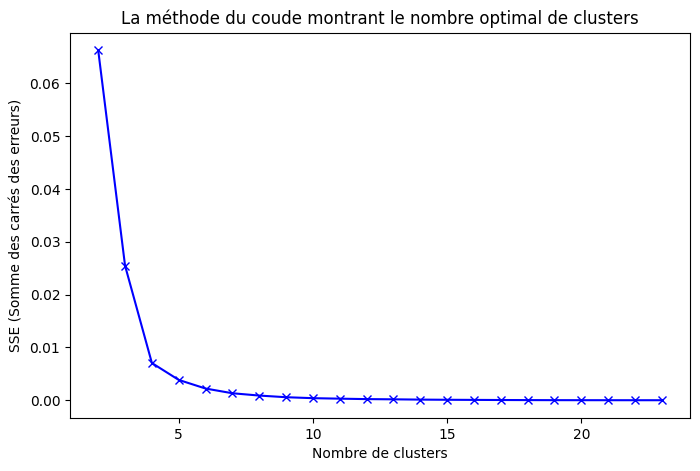

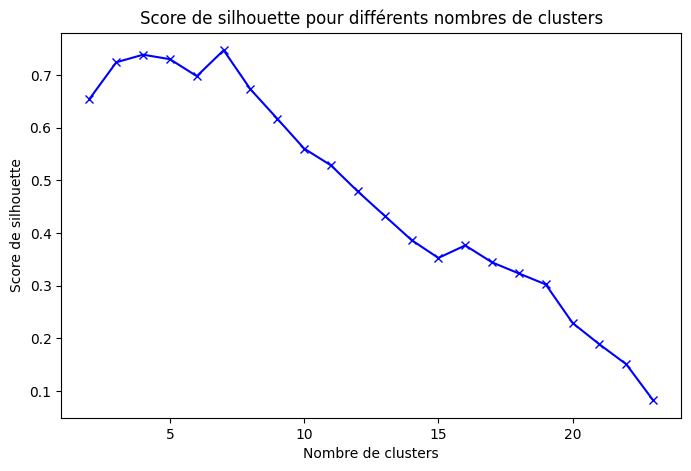

Nombre optimal de clusters selon le score de silhouette : 7.

Le nombre de clusters k pour lequel le score de silhouette est le plus proche de 0.5 est : 12.


In [ ]:
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

X = [X_mean_correlations_1d[i] for i in range(df.shape[1]) if not np.isnan(X_mean_correlations_1d[i])]

# Convertir la liste en un tableau NumPy en 1D pour un traitement plus rapide
X = np.array(X).reshape(-1, 1)

# Recherche du nombre optimal de clusters avec la méthode du coude et le score de silhouette
sse = {}  # Pour stocker la somme des carrés des erreurs
silhouette_scores = {}
for k in range(2, min(df.shape[1], 50)):  # Testez un nombre de clusters de 2 au minimum entre la dimension et 50
    kmeans = KMeans(n_clusters=k, random_state=42).fit(X)
    sse[k] = kmeans.inertia_  # Somme des carrés des erreurs pour ce nombre de clusters
    silhouette_scores[k] = silhouette_score(X, kmeans.labels_)

# Tracer la courbe du coude
plt.figure(figsize=(8, 5))
plt.plot(list(sse.keys()), list(sse.values()), 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel('SSE (Somme des carrés des erreurs)')
plt.title('La méthode du coude montrant le nombre optimal de clusters')
plt.show()

# Tracer la courbe de silhouette
plt.figure(figsize=(8, 5))
plt.plot(list(silhouette_scores.keys()), list(silhouette_scores.values()), 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel('Score de silhouette')
plt.title('Score de silhouette pour différents nombres de clusters')
plt.show()

# Déterminer le nombre optimal de clusters en utilisant le score de silhouette
optimal_k = max(silhouette_scores, key=silhouette_scores.get)
print(f'Nombre optimal de clusters selon le score de silhouette : {optimal_k}.\n')

# Calculer la différence absolue avec 0.5 pour chaque score de silhouette
diff_to_half = {k: abs(score - 0.5) for k, score in silhouette_scores.items()}

# Trouver le nombre de clusters k pour laquelle la différence est la plus petite
optimal_k_closest_to_half = min(diff_to_half, key=diff_to_half.get)

print(f'Le nombre de clusters k pour lequel le score de silhouette est le plus proche de 0.5 est : {optimal_k_closest_to_half}.')

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will chang

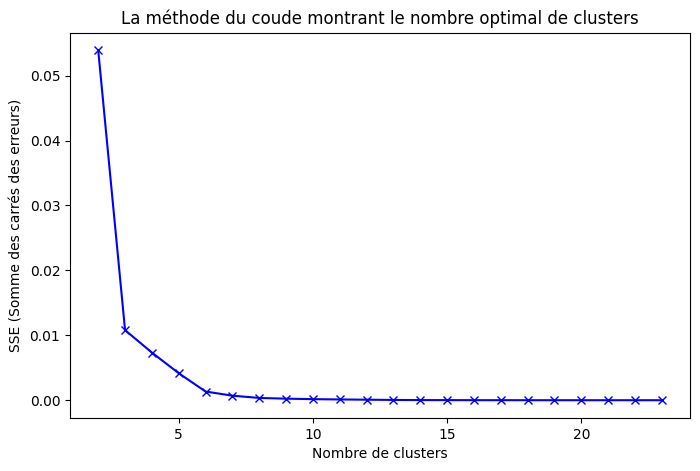

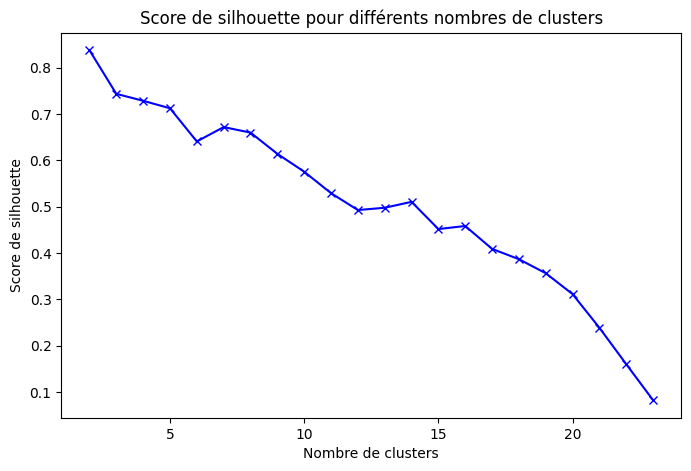

Nombre optimal de clusters selon le score de silhouette : 2.

Le nombre de clusters k pour lequel le score de silhouette est le plus proche de 0.5 est : 13.


In [ ]:
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

X = [X_stds_1d[i] for i in range(df.shape[1]) if not np.isnan(X_stds_1d[i])]

# Convertir la liste en un tableau NumPy en 1D pour un traitement plus rapide
X = np.array(X).reshape(-1, 1)

# Recherche du nombre optimal de clusters avec la méthode du coude et le score de silhouette
sse = {}  # Pour stocker la somme des carrés des erreurs
silhouette_scores = {}
for k in range(2, min(df.shape[1], 50)):  # Testez un nombre de clusters de 2 au minimum entre la dimension et 50
    kmeans = KMeans(n_clusters=k, random_state=42).fit(X)
    sse[k] = kmeans.inertia_  # Somme des carrés des erreurs pour ce nombre de clusters
    silhouette_scores[k] = silhouette_score(X, kmeans.labels_)

# Tracer la courbe du coude
plt.figure(figsize=(8, 5))
plt.plot(list(sse.keys()), list(sse.values()), 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel('SSE (Somme des carrés des erreurs)')
plt.title('La méthode du coude montrant le nombre optimal de clusters')
plt.show()

# Tracer la courbe de silhouette
plt.figure(figsize=(8, 5))
plt.plot(list(silhouette_scores.keys()), list(silhouette_scores.values()), 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel('Score de silhouette')
plt.title('Score de silhouette pour différents nombres de clusters')
plt.show()

# Déterminer le nombre optimal de clusters en utilisant le score de silhouette
optimal_k = max(silhouette_scores, key=silhouette_scores.get)
print(f'Nombre optimal de clusters selon le score de silhouette : {optimal_k}.\n')

# Calculer la différence absolue avec 0.5 pour chaque score de silhouette
diff_to_half = {k: abs(score - 0.5) for k, score in silhouette_scores.items()}

# Trouver le nombre de clusters k pour laquelle la différence est la plus petite
optimal_k_closest_to_half = min(diff_to_half, key=diff_to_half.get)

print(f'Le nombre de clusters k pour lequel le score de silhouette est le plus proche de 0.5 est : {optimal_k_closest_to_half}.')

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will chang

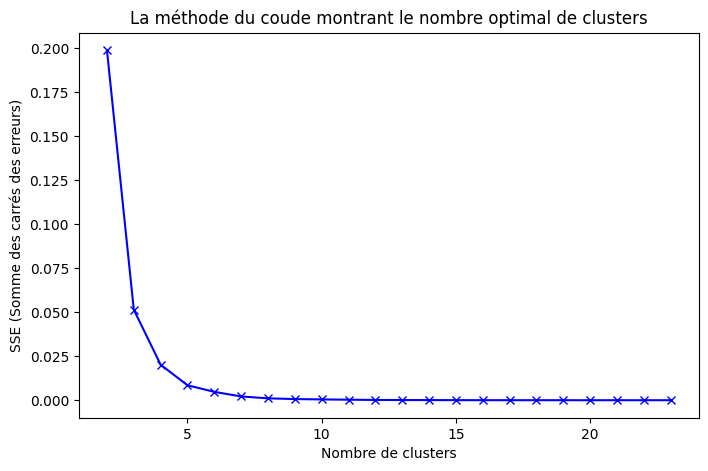

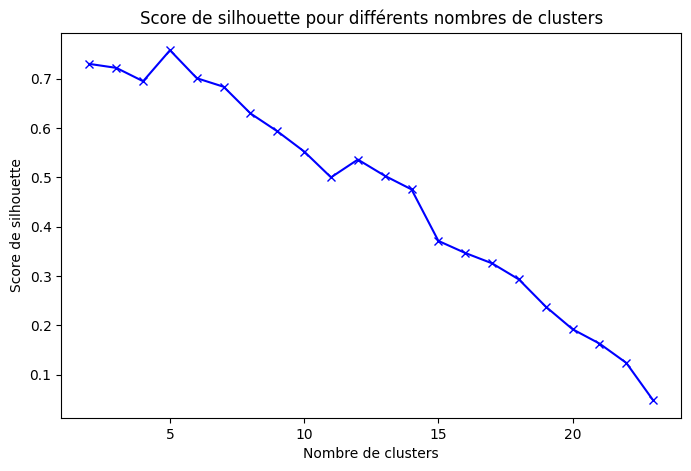

Nombre optimal de clusters selon le score de silhouette : 5.

Le nombre de clusters k pour lequel le score de silhouette est le plus proche de 0.5 est : 11.


In [ ]:
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

X = [X_means_1d[i] for i in range(df.shape[1]) if not np.isnan(X_means_1d[i])]

# Convertir la liste en un tableau NumPy en 1D pour un traitement plus rapide
X = np.array(X).reshape(-1, 1)

# Recherche du nombre optimal de clusters avec la méthode du coude et le score de silhouette
sse = {}  # Pour stocker la somme des carrés des erreurs
silhouette_scores = {}
for k in range(2, min(df.shape[1], 50)):  # Testez un nombre de clusters de 2 au minimum entre la dimension et 50
    kmeans = KMeans(n_clusters=k, random_state=42).fit(X)
    sse[k] = kmeans.inertia_  # Somme des carrés des erreurs pour ce nombre de clusters
    silhouette_scores[k] = silhouette_score(X, kmeans.labels_)

# Tracer la courbe du coude
plt.figure(figsize=(8, 5))
plt.plot(list(sse.keys()), list(sse.values()), 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel('SSE (Somme des carrés des erreurs)')
plt.title('La méthode du coude montrant le nombre optimal de clusters')
plt.show()

# Tracer la courbe de silhouette
plt.figure(figsize=(8, 5))
plt.plot(list(silhouette_scores.keys()), list(silhouette_scores.values()), 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel('Score de silhouette')
plt.title('Score de silhouette pour différents nombres de clusters')
plt.show()

# Déterminer le nombre optimal de clusters en utilisant le score de silhouette
optimal_k = max(silhouette_scores, key=silhouette_scores.get)
print(f'Nombre optimal de clusters selon le score de silhouette : {optimal_k}.\n')

# Calculer la différence absolue avec 0.5 pour chaque score de silhouette
diff_to_half = {k: abs(score - 0.5) for k, score in silhouette_scores.items()}

# Trouver le nombre de clusters k pour laquelle la différence est la plus petite
optimal_k_closest_to_half = min(diff_to_half, key=diff_to_half.get)

print(f'Le nombre de clusters k pour lequel le score de silhouette est le plus proche de 0.5 est : {optimal_k_closest_to_half}.')

## MNIST Test :

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler

import plotly.graph_objs as go

df = pd.read_csv('mnist_test.csv', sep=',')

print(df.head())

# Remplacer les valeurs NaN par 0
df.fillna(0, inplace=True)

# Liste des colonnes contenant du texte
text_columns = df.select_dtypes(include=['object']).columns

# Remplacement du texte par des valeurs numériques
for column in text_columns:
    le = LabelEncoder()
    df[column] = le.fit_transform(df[column].astype(str))

# Création d'un objet MinMaxScaler
scaler = MinMaxScaler()

# Normalisation des colonnes du DataFrame
df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

# Affichage du DataFrame modifié
print(df.head())

# Obtenez les statistiques
means = df.mean()  # Calcul des moyennes pour chaque colonne
stds = df.std()  # Calcul des écarts-types pour chaque colonne
mean_correlations = df.corr().mean()  # Calcul des corrélations pour chaque colonne

# Afficher les résultats
print()
print("------------Moyennes------------")
print(means)
print()
print("----------Écarts-types----------")
print(stds)
print()
print("---Moyennes des corrélations---")
print(mean_correlations)

# Fonction pour générer les points sur une sphère
def generate_sphere_points(mean, std, mean_correlation, center=[0, 0, 0]):
    phi = np.random.uniform(0, np.pi)
    theta = np.random.uniform(0, 2 * np.pi)
    x = [mean * np.sin(phi) * np.cos(theta) + center[0],
         std * np.sin(phi) * np.cos(theta) + center[0],
         mean_correlation * np.sin(phi) * np.cos(theta) + center[0]]
    y = [mean * np.sin(phi) * np.sin(theta) + center[1],
         std * np.sin(phi) * np.sin(theta) + center[1],
         mean_correlation * np.sin(phi) * np.sin(theta) + center[1]]
    z = [mean * np.cos(phi) + center[2],
         std * np.cos(phi) + center[2],
         mean_correlation * np.cos(phi) + center[2]]
    return x, y, z

# Préparer les données pour le graphique 3D
X_means_3d = []
Y_means_3d = []
Z_means_3d = []
X_stds_3d = []
Y_stds_3d = []
Z_stds_3d = []
X_mean_correlations_3d = []
Y_mean_correlations_3d = []
Z_mean_correlations_3d = []
X_lines_3d = []
Y_lines_3d = []
Z_lines_3d = []

# Générer les points pour chaque colonne
for i in range(df.shape[1]):
    x, y, z = generate_sphere_points(means[i], stds[i], mean_correlations[i])
    X_means_3d.append(x[0])
    Y_means_3d.append(y[0])
    Z_means_3d.append(z[0])
    X_stds_3d.append(x[1])
    Y_stds_3d.append(y[1])
    Z_stds_3d.append(z[1])
    X_mean_correlations_3d.append(x[2])
    Y_mean_correlations_3d.append(y[2])
    Z_mean_correlations_3d.append(z[2])
    X_lines_3d += [0, x[0], None]
    Y_lines_3d += [0, y[0], None]
    Z_lines_3d += [0, z[0], None]
    X_lines_3d += [0, x[1], None]
    Y_lines_3d += [0, y[1], None]
    Z_lines_3d += [0, z[1], None]
    X_lines_3d += [0, x[2], None]
    Y_lines_3d += [0, y[2], None]
    Z_lines_3d += [0, z[2], None]

# Créer le graphique avec plotly
trace_means_3d = go.Scatter3d(
    x=X_means_3d,
    y=Y_means_3d,
    z=Z_means_3d,
    mode='markers',
    marker=dict(
        size=5,
        color='blue',
    ),
    name='Moyennes'
)

trace_stds_3d = go.Scatter3d(
    x=X_stds_3d,
    y=Y_stds_3d,
    z=Z_stds_3d,
    mode='markers',
    marker=dict(
        size=5,
        color='red',
    ),
    name='Écarts-types'
)

trace_mean_correlations_3d = go.Scatter3d(
    x=X_mean_correlations_3d,
    y=Y_mean_correlations_3d,
    z=Z_mean_correlations_3d,
    mode='markers',
    marker=dict(
        size=5,
        color='green',
    ),
    name='Moyennes des corrélations'
)

trace_lines_3d = go.Scatter3d(
    x=X_lines_3d,
    y=Y_lines_3d,
    z=Z_lines_3d,
    mode='lines',
    line=dict(
        color='black',
        width=2
    ),
    name='Lignes'
)

fig_3d = go.Figure(data=[trace_means_3d, trace_stds_3d, trace_mean_correlations_3d, trace_lines_3d])

# Afficher le graphique
fig_3d.show()

# Fonction pour générer les points sur un cercle
def generate_circle_points(mean, std, mean_correlation, center=[0, 0]):
    theta = np.random.uniform(0, 2 * np.pi)
    x = [mean * np.cos(theta) + center[0],
         std * np.cos(theta) + center[0],
         mean_correlation * np.cos(theta) + center[0]]
    y = [mean * np.sin(theta) + center[1],
         std * np.sin(theta) + center[1],
         mean_correlation * np.sin(theta) + center[1]]
    return x, y

# Préparer les données pour le graphique 2D
X_means_2d = []
Y_means_2d = []
X_stds_2d = []
Y_stds_2d = []
X_mean_correlations_2d = []
Y_mean_correlations_2d = []
X_lines_2d = []
Y_lines_2d = []

# Générer les points pour chaque colonne
for i in range(df.shape[1]):
    x, y = generate_circle_points(means[i], stds[i], mean_correlations[i])
    X_means_2d.append(x[0])
    Y_means_2d.append(y[0])
    X_stds_2d.append(x[1])
    Y_stds_2d.append(y[1])
    X_mean_correlations_2d.append(x[2])
    Y_mean_correlations_2d.append(y[2])
    X_lines_2d += [0, x[0], None]
    Y_lines_2d += [0, y[0], None]
    X_lines_2d += [0, x[1], None]
    Y_lines_2d += [0, y[1], None]
    X_lines_2d += [0, x[2], None]
    Y_lines_2d += [0, y[2], None]

# Créer le graphique avec plotly
trace_means_2d = go.Scatter(
    x=X_means_2d,
    y=Y_means_2d,
    mode='markers',
    marker=dict(
        size=10,
        color='blue'
    ),
    name='Moyennes'
)

trace_stds_2d = go.Scatter(
    x=X_stds_2d,
    y=Y_stds_2d,
    mode='markers',
    marker=dict(
        size=10,
        color='red'
    ),
    name='Écarts-types'
)

trace_mean_correlations_2d = go.Scatter(
    x=X_mean_correlations_2d,
    y=Y_mean_correlations_2d,
    mode='markers',
    marker=dict(
        size=10,
        color='green'
    ),
    name='Moyennes des corrélations'
)

trace_lines_2d = go.Scatter(
    x=X_lines_2d,
    y=Y_lines_2d,
    mode='lines',
    line=dict(
        color='black',
        width=1
    ),
    name='Lignes'
)

fig_2d = go.Figure(data=[trace_means_2d, trace_stds_2d, trace_mean_correlations_2d, trace_lines_2d])

# Afficher le graphique
fig_2d.show()

# Fonction pour générer les points sur un cercle
def generate_line_points(mean, std, mean_correlation, center=0):
    x = [mean + center,
         std + center,
         mean_correlation + center]
    return x

# Préparer les données pour le graphique 1D
X_means_1d = []
X_stds_1d = []
X_mean_correlations_1d = []

# Générer les points pour chaque colonne
for i in range(df.shape[1]):
    x = generate_line_points(means[i], stds[i], mean_correlations[i])
    X_means_1d.append(x[0])
    X_stds_1d.append(x[1])
    X_mean_correlations_1d.append(x[2])

# Créer le graphique avec plotly
trace_means_1d = go.Scatter(
    x=X_means_1d,
    y=[0] * df.shape[1],
    mode='markers',
    marker=dict(
        size=10,
        color='blue'
    ),
    name='Moyennes'
)

trace_stds_1d = go.Scatter(
    x=X_stds_1d,
    y=[0] * df.shape[1],
    mode='markers',
    marker=dict(
        size=10,
        color='red'
    ),
    name='Écarts-types'
)

trace_mean_correlations_1d = go.Scatter(
    x=X_mean_correlations_1d,
    y=[0] * df.shape[1],
    mode='markers',
    marker=dict(
        size=10,
        color='green'
    ),
    name='Moyennes des corrélations'
)

fig_1d = go.Figure(data=[trace_means_1d, trace_stds_1d, trace_mean_correlations_1d])

# Afficher le graphique
fig_1d.show()

   7  0  0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  ...  0.658  0.659  0.660  \
0  2  0    0    0    0    0    0    0    0    0  ...      0      0      0   
1  1  0    0    0    0    0    0    0    0    0  ...      0      0      0   
2  0  0    0    0    0    0    0    0    0    0  ...      0      0      0   
3  4  0    0    0    0    0    0    0    0    0  ...      0      0      0   
4  1  0    0    0    0    0    0    0    0    0  ...      0      0      0   

   0.661  0.662  0.663  0.664  0.665  0.666  0.667  
0      0      0      0      0      0      0      0  
1      0      0      0      0      0      0      0  
2      0      0      0      0      0      0      0  
3      0      0      0      0      0      0      0  
4      0      0      0      0      0      0      0  

[5 rows x 785 columns]
          7    0  0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  ...  0.658  0.659  \
0  0.222222  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...    0.0    0.0   
1  0.111111  0.0  0.0  0.0  0.0  0.0 

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will chang

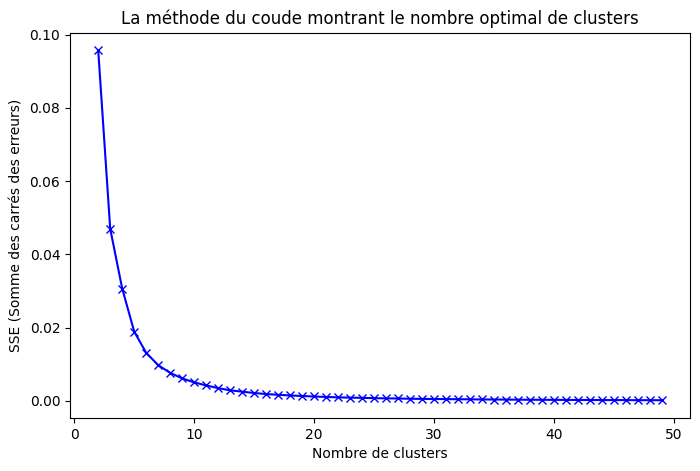

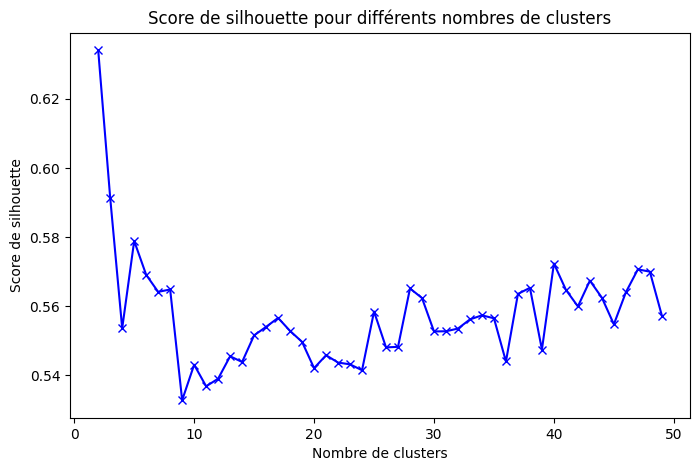

Nombre optimal de clusters selon le score de silhouette : 2.

Le nombre de clusters k pour lequel le score de silhouette est le plus proche de 0.5 est : 9.


In [ ]:
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

X = [X_mean_correlations_1d[i] for i in range(df.shape[1]) if not np.isnan(X_mean_correlations_1d[i])]

# Convertir la liste en un tableau NumPy en 1D pour un traitement plus rapide
X = np.array(X).reshape(-1, 1)

# Recherche du nombre optimal de clusters avec la méthode du coude et le score de silhouette
sse = {}  # Pour stocker la somme des carrés des erreurs
silhouette_scores = {}
for k in range(2, min(df.shape[1], 50)):  # Testez un nombre de clusters de 2 au minimum entre la dimension et 50
    kmeans = KMeans(n_clusters=k, random_state=42).fit(X)
    sse[k] = kmeans.inertia_  # Somme des carrés des erreurs pour ce nombre de clusters
    silhouette_scores[k] = silhouette_score(X, kmeans.labels_)

# Tracer la courbe du coude
plt.figure(figsize=(8, 5))
plt.plot(list(sse.keys()), list(sse.values()), 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel('SSE (Somme des carrés des erreurs)')
plt.title('La méthode du coude montrant le nombre optimal de clusters')
plt.show()

# Tracer la courbe de silhouette
plt.figure(figsize=(8, 5))
plt.plot(list(silhouette_scores.keys()), list(silhouette_scores.values()), 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel('Score de silhouette')
plt.title('Score de silhouette pour différents nombres de clusters')
plt.show()

# Déterminer le nombre optimal de clusters en utilisant le score de silhouette
optimal_k = max(silhouette_scores, key=silhouette_scores.get)
print(f'Nombre optimal de clusters selon le score de silhouette : {optimal_k}.\n')

# Calculer la différence absolue avec 0.5 pour chaque score de silhouette
diff_to_half = {k: abs(score - 0.5) for k, score in silhouette_scores.items()}

# Trouver le nombre de clusters k pour laquelle la différence est la plus petite
optimal_k_closest_to_half = min(diff_to_half, key=diff_to_half.get)

print(f'Le nombre de clusters k pour lequel le score de silhouette est le plus proche de 0.5 est : {optimal_k_closest_to_half}.')

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will chang

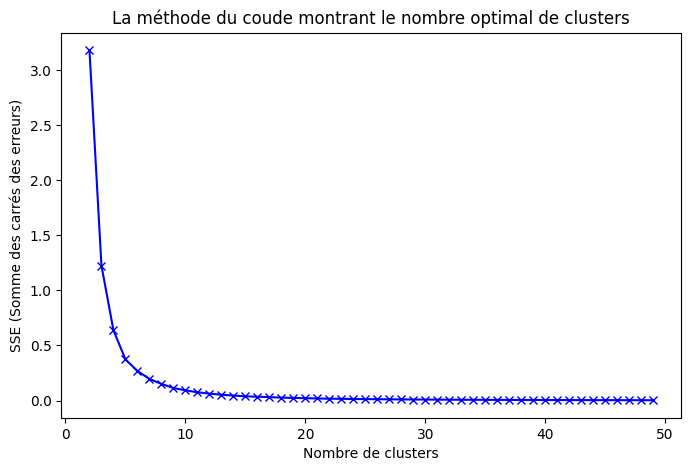

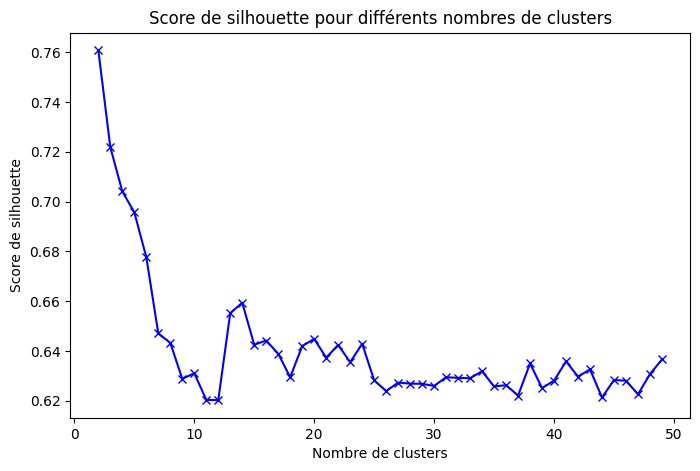

Nombre optimal de clusters selon le score de silhouette : 2.

Le nombre de clusters k pour lequel le score de silhouette est le plus proche de 0.5 est : 12.


In [ ]:
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

X = [X_stds_1d[i] for i in range(df.shape[1]) if not np.isnan(X_stds_1d[i])]

# Convertir la liste en un tableau NumPy en 1D pour un traitement plus rapide
X = np.array(X).reshape(-1, 1)

# Recherche du nombre optimal de clusters avec la méthode du coude et le score de silhouette
sse = {}  # Pour stocker la somme des carrés des erreurs
silhouette_scores = {}
for k in range(2, min(df.shape[1], 50)):  # Testez un nombre de clusters de 2 au minimum entre la dimension et 50
    kmeans = KMeans(n_clusters=k, random_state=42).fit(X)
    sse[k] = kmeans.inertia_  # Somme des carrés des erreurs pour ce nombre de clusters
    silhouette_scores[k] = silhouette_score(X, kmeans.labels_)

# Tracer la courbe du coude
plt.figure(figsize=(8, 5))
plt.plot(list(sse.keys()), list(sse.values()), 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel('SSE (Somme des carrés des erreurs)')
plt.title('La méthode du coude montrant le nombre optimal de clusters')
plt.show()

# Tracer la courbe de silhouette
plt.figure(figsize=(8, 5))
plt.plot(list(silhouette_scores.keys()), list(silhouette_scores.values()), 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel('Score de silhouette')
plt.title('Score de silhouette pour différents nombres de clusters')
plt.show()

# Déterminer le nombre optimal de clusters en utilisant le score de silhouette
optimal_k = max(silhouette_scores, key=silhouette_scores.get)
print(f'Nombre optimal de clusters selon le score de silhouette : {optimal_k}.\n')

# Calculer la différence absolue avec 0.5 pour chaque score de silhouette
diff_to_half = {k: abs(score - 0.5) for k, score in silhouette_scores.items()}

# Trouver le nombre de clusters k pour laquelle la différence est la plus petite
optimal_k_closest_to_half = min(diff_to_half, key=diff_to_half.get)

print(f'Le nombre de clusters k pour lequel le score de silhouette est le plus proche de 0.5 est : {optimal_k_closest_to_half}.')

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will chang

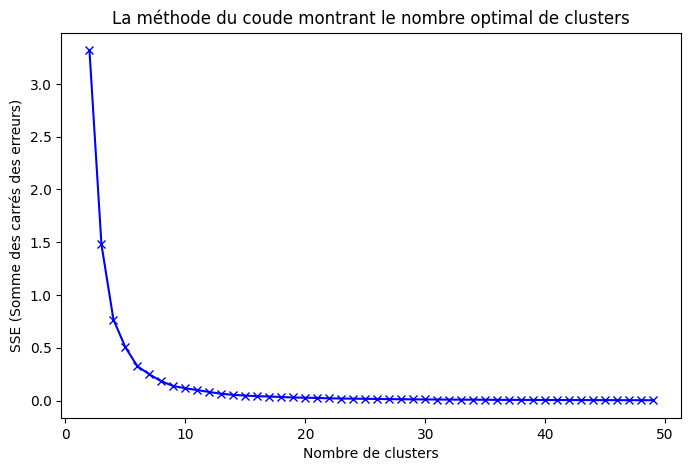

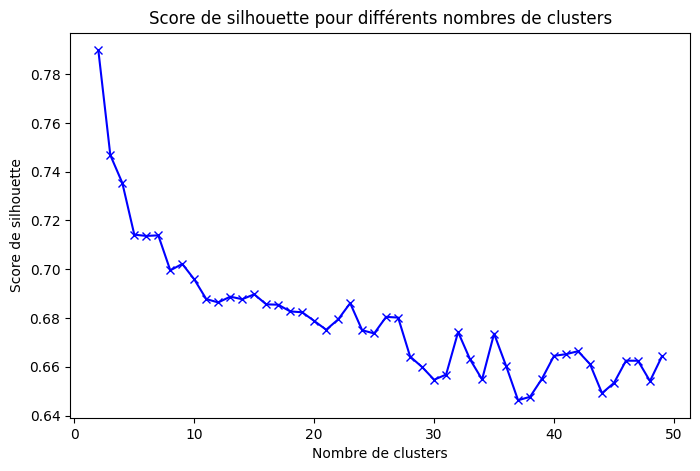

Nombre optimal de clusters selon le score de silhouette : 2.

Le nombre de clusters k pour lequel le score de silhouette est le plus proche de 0.5 est : 37.


In [ ]:
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

X = [X_means_1d[i] for i in range(df.shape[1]) if not np.isnan(X_means_1d[i])]

# Convertir la liste en un tableau NumPy en 1D pour un traitement plus rapide
X = np.array(X).reshape(-1, 1)

# Recherche du nombre optimal de clusters avec la méthode du coude et le score de silhouette
sse = {}  # Pour stocker la somme des carrés des erreurs
silhouette_scores = {}
for k in range(2, min(df.shape[1], 50)):  # Testez un nombre de clusters de 2 au minimum entre la dimension et 50
    kmeans = KMeans(n_clusters=k, random_state=42).fit(X)
    sse[k] = kmeans.inertia_  # Somme des carrés des erreurs pour ce nombre de clusters
    silhouette_scores[k] = silhouette_score(X, kmeans.labels_)

# Tracer la courbe du coude
plt.figure(figsize=(8, 5))
plt.plot(list(sse.keys()), list(sse.values()), 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel('SSE (Somme des carrés des erreurs)')
plt.title('La méthode du coude montrant le nombre optimal de clusters')
plt.show()

# Tracer la courbe de silhouette
plt.figure(figsize=(8, 5))
plt.plot(list(silhouette_scores.keys()), list(silhouette_scores.values()), 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel('Score de silhouette')
plt.title('Score de silhouette pour différents nombres de clusters')
plt.show()

# Déterminer le nombre optimal de clusters en utilisant le score de silhouette
optimal_k = max(silhouette_scores, key=silhouette_scores.get)
print(f'Nombre optimal de clusters selon le score de silhouette : {optimal_k}.\n')

# Calculer la différence absolue avec 0.5 pour chaque score de silhouette
diff_to_half = {k: abs(score - 0.5) for k, score in silhouette_scores.items()}

# Trouver le nombre de clusters k pour laquelle la différence est la plus petite
optimal_k_closest_to_half = min(diff_to_half, key=diff_to_half.get)

print(f'Le nombre de clusters k pour lequel le score de silhouette est le plus proche de 0.5 est : {optimal_k_closest_to_half}.')

## MNIST Train Small :

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler

import plotly.graph_objs as go

df = pd.read_csv('mnist_train_small.csv', sep=',')

print(df.head())

# Remplacer les valeurs NaN par 0
df.fillna(0, inplace=True)

# Liste des colonnes contenant du texte
text_columns = df.select_dtypes(include=['object']).columns

# Remplacement du texte par des valeurs numériques
for column in text_columns:
    le = LabelEncoder()
    df[column] = le.fit_transform(df[column].astype(str))

# Création d'un objet MinMaxScaler
scaler = MinMaxScaler()

# Normalisation des colonnes du DataFrame
df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

# Affichage du DataFrame modifié
print(df.head())

# Obtenez les statistiques
means = df.mean()  # Calcul des moyennes pour chaque colonne
stds = df.std()  # Calcul des écarts-types pour chaque colonne
mean_correlations = df.corr().mean()  # Calcul des corrélations pour chaque colonne

# Afficher les résultats
print()
print("------------Moyennes------------")
print(means)
print()
print("----------Écarts-types----------")
print(stds)
print()
print("---Moyennes des corrélations---")
print(mean_correlations)

# Fonction pour générer les points sur une sphère
def generate_sphere_points(mean, std, mean_correlation, center=[0, 0, 0]):
    phi = np.random.uniform(0, np.pi)
    theta = np.random.uniform(0, 2 * np.pi)
    x = [mean * np.sin(phi) * np.cos(theta) + center[0],
         std * np.sin(phi) * np.cos(theta) + center[0],
         mean_correlation * np.sin(phi) * np.cos(theta) + center[0]]
    y = [mean * np.sin(phi) * np.sin(theta) + center[1],
         std * np.sin(phi) * np.sin(theta) + center[1],
         mean_correlation * np.sin(phi) * np.sin(theta) + center[1]]
    z = [mean * np.cos(phi) + center[2],
         std * np.cos(phi) + center[2],
         mean_correlation * np.cos(phi) + center[2]]
    return x, y, z

# Préparer les données pour le graphique 3D
X_means_3d = []
Y_means_3d = []
Z_means_3d = []
X_stds_3d = []
Y_stds_3d = []
Z_stds_3d = []
X_mean_correlations_3d = []
Y_mean_correlations_3d = []
Z_mean_correlations_3d = []
X_lines_3d = []
Y_lines_3d = []
Z_lines_3d = []

# Générer les points pour chaque colonne
for i in range(df.shape[1]):
    x, y, z = generate_sphere_points(means[i], stds[i], mean_correlations[i])
    X_means_3d.append(x[0])
    Y_means_3d.append(y[0])
    Z_means_3d.append(z[0])
    X_stds_3d.append(x[1])
    Y_stds_3d.append(y[1])
    Z_stds_3d.append(z[1])
    X_mean_correlations_3d.append(x[2])
    Y_mean_correlations_3d.append(y[2])
    Z_mean_correlations_3d.append(z[2])
    X_lines_3d += [0, x[0], None]
    Y_lines_3d += [0, y[0], None]
    Z_lines_3d += [0, z[0], None]
    X_lines_3d += [0, x[1], None]
    Y_lines_3d += [0, y[1], None]
    Z_lines_3d += [0, z[1], None]
    X_lines_3d += [0, x[2], None]
    Y_lines_3d += [0, y[2], None]
    Z_lines_3d += [0, z[2], None]

# Créer le graphique avec plotly
trace_means_3d = go.Scatter3d(
    x=X_means_3d,
    y=Y_means_3d,
    z=Z_means_3d,
    mode='markers',
    marker=dict(
        size=5,
        color='blue',
    ),
    name='Moyennes'
)

trace_stds_3d = go.Scatter3d(
    x=X_stds_3d,
    y=Y_stds_3d,
    z=Z_stds_3d,
    mode='markers',
    marker=dict(
        size=5,
        color='red',
    ),
    name='Écarts-types'
)

trace_mean_correlations_3d = go.Scatter3d(
    x=X_mean_correlations_3d,
    y=Y_mean_correlations_3d,
    z=Z_mean_correlations_3d,
    mode='markers',
    marker=dict(
        size=5,
        color='green',
    ),
    name='Moyennes des corrélations'
)

trace_lines_3d = go.Scatter3d(
    x=X_lines_3d,
    y=Y_lines_3d,
    z=Z_lines_3d,
    mode='lines',
    line=dict(
        color='black',
        width=2
    ),
    name='Lignes'
)

fig_3d = go.Figure(data=[trace_means_3d, trace_stds_3d, trace_mean_correlations_3d, trace_lines_3d])

# Afficher le graphique
fig_3d.show()

# Fonction pour générer les points sur un cercle
def generate_circle_points(mean, std, mean_correlation, center=[0, 0]):
    theta = np.random.uniform(0, 2 * np.pi)
    x = [mean * np.cos(theta) + center[0],
         std * np.cos(theta) + center[0],
         mean_correlation * np.cos(theta) + center[0]]
    y = [mean * np.sin(theta) + center[1],
         std * np.sin(theta) + center[1],
         mean_correlation * np.sin(theta) + center[1]]
    return x, y

# Préparer les données pour le graphique 2D
X_means_2d = []
Y_means_2d = []
X_stds_2d = []
Y_stds_2d = []
X_mean_correlations_2d = []
Y_mean_correlations_2d = []
X_lines_2d = []
Y_lines_2d = []

# Générer les points pour chaque colonne
for i in range(df.shape[1]):
    x, y = generate_circle_points(means[i], stds[i], mean_correlations[i])
    X_means_2d.append(x[0])
    Y_means_2d.append(y[0])
    X_stds_2d.append(x[1])
    Y_stds_2d.append(y[1])
    X_mean_correlations_2d.append(x[2])
    Y_mean_correlations_2d.append(y[2])
    X_lines_2d += [0, x[0], None]
    Y_lines_2d += [0, y[0], None]
    X_lines_2d += [0, x[1], None]
    Y_lines_2d += [0, y[1], None]
    X_lines_2d += [0, x[2], None]
    Y_lines_2d += [0, y[2], None]

# Créer le graphique avec plotly
trace_means_2d = go.Scatter(
    x=X_means_2d,
    y=Y_means_2d,
    mode='markers',
    marker=dict(
        size=10,
        color='blue'
    ),
    name='Moyennes'
)

trace_stds_2d = go.Scatter(
    x=X_stds_2d,
    y=Y_stds_2d,
    mode='markers',
    marker=dict(
        size=10,
        color='red'
    ),
    name='Écarts-types'
)

trace_mean_correlations_2d = go.Scatter(
    x=X_mean_correlations_2d,
    y=Y_mean_correlations_2d,
    mode='markers',
    marker=dict(
        size=10,
        color='green'
    ),
    name='Moyennes des corrélations'
)

trace_lines_2d = go.Scatter(
    x=X_lines_2d,
    y=Y_lines_2d,
    mode='lines',
    line=dict(
        color='black',
        width=1
    ),
    name='Lignes'
)

fig_2d = go.Figure(data=[trace_means_2d, trace_stds_2d, trace_mean_correlations_2d, trace_lines_2d])

# Afficher le graphique
fig_2d.show()

# Fonction pour générer les points sur un cercle
def generate_line_points(mean, std, mean_correlation, center=0):
    x = [mean + center,
         std + center,
         mean_correlation + center]
    return x

# Préparer les données pour le graphique 1D
X_means_1d = []
X_stds_1d = []
X_mean_correlations_1d = []

# Générer les points pour chaque colonne
for i in range(df.shape[1]):
    x = generate_line_points(means[i], stds[i], mean_correlations[i])
    X_means_1d.append(x[0])
    X_stds_1d.append(x[1])
    X_mean_correlations_1d.append(x[2])

# Créer le graphique avec plotly
trace_means_1d = go.Scatter(
    x=X_means_1d,
    y=[0] * df.shape[1],
    mode='markers',
    marker=dict(
        size=10,
        color='blue'
    ),
    name='Moyennes'
)

trace_stds_1d = go.Scatter(
    x=X_stds_1d,
    y=[0] * df.shape[1],
    mode='markers',
    marker=dict(
        size=10,
        color='red'
    ),
    name='Écarts-types'
)

trace_mean_correlations_1d = go.Scatter(
    x=X_mean_correlations_1d,
    y=[0] * df.shape[1],
    mode='markers',
    marker=dict(
        size=10,
        color='green'
    ),
    name='Moyennes des corrélations'
)

fig_1d = go.Figure(data=[trace_means_1d, trace_stds_1d, trace_mean_correlations_1d])

# Afficher le graphique
fig_1d.show()

   6  0  0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  ...  0.581  0.582  0.583  \
0  5  0    0    0    0    0    0    0    0    0  ...      0      0      0   
1  7  0    0    0    0    0    0    0    0    0  ...      0      0      0   
2  9  0    0    0    0    0    0    0    0    0  ...      0      0      0   
3  5  0    0    0    0    0    0    0    0    0  ...      0      0      0   
4  2  0    0    0    0    0    0    0    0    0  ...      0      0      0   

   0.584  0.585  0.586  0.587  0.588  0.589  0.590  
0      0      0      0      0      0      0      0  
1      0      0      0      0      0      0      0  
2      0      0      0      0      0      0      0  
3      0      0      0      0      0      0      0  
4      0      0      0      0      0      0      0  

[5 rows x 785 columns]
          6    0  0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  ...  0.581  0.582  \
0  0.555556  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...    0.0    0.0   
1  0.777778  0.0  0.0  0.0  0.0  0.0 

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will chang

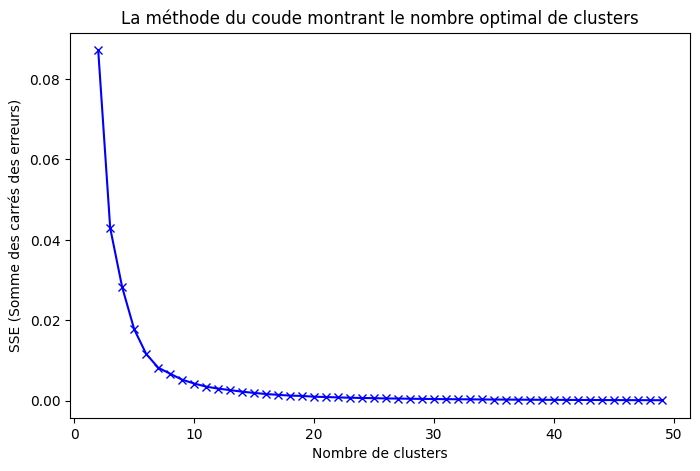

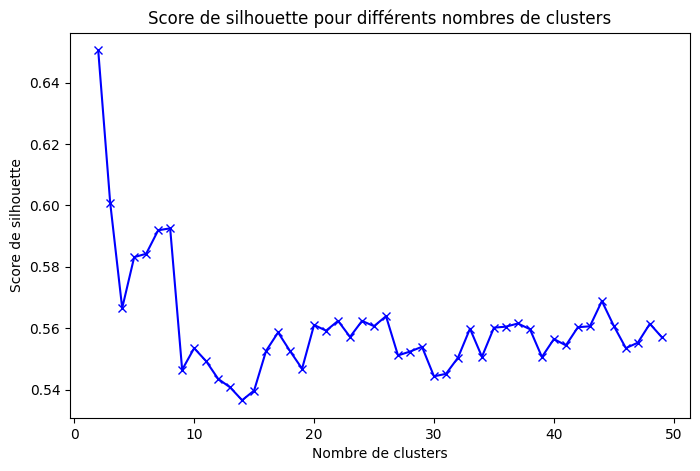

Nombre optimal de clusters selon le score de silhouette : 2.

Le nombre de clusters k pour lequel le score de silhouette est le plus proche de 0.5 est : 14.


In [ ]:
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

X = [X_mean_correlations_1d[i] for i in range(df.shape[1]) if not np.isnan(X_mean_correlations_1d[i])]

# Convertir la liste en un tableau NumPy en 1D pour un traitement plus rapide
X = np.array(X).reshape(-1, 1)

# Recherche du nombre optimal de clusters avec la méthode du coude et le score de silhouette
sse = {}  # Pour stocker la somme des carrés des erreurs
silhouette_scores = {}
for k in range(2, min(df.shape[1], 50)):  # Testez un nombre de clusters de 2 au minimum entre la dimension et 50
    kmeans = KMeans(n_clusters=k, random_state=42).fit(X)
    sse[k] = kmeans.inertia_  # Somme des carrés des erreurs pour ce nombre de clusters
    silhouette_scores[k] = silhouette_score(X, kmeans.labels_)

# Tracer la courbe du coude
plt.figure(figsize=(8, 5))
plt.plot(list(sse.keys()), list(sse.values()), 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel('SSE (Somme des carrés des erreurs)')
plt.title('La méthode du coude montrant le nombre optimal de clusters')
plt.show()

# Tracer la courbe de silhouette
plt.figure(figsize=(8, 5))
plt.plot(list(silhouette_scores.keys()), list(silhouette_scores.values()), 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel('Score de silhouette')
plt.title('Score de silhouette pour différents nombres de clusters')
plt.show()

# Déterminer le nombre optimal de clusters en utilisant le score de silhouette
optimal_k = max(silhouette_scores, key=silhouette_scores.get)
print(f'Nombre optimal de clusters selon le score de silhouette : {optimal_k}.\n')

# Calculer la différence absolue avec 0.5 pour chaque score de silhouette
diff_to_half = {k: abs(score - 0.5) for k, score in silhouette_scores.items()}

# Trouver la clé (le nombre de clusters k) pour laquelle la différence est la plus petite
optimal_k_closest_to_half = min(diff_to_half, key=diff_to_half.get)

print(f'Le nombre de clusters k pour lequel le score de silhouette est le plus proche de 0.5 est : {optimal_k_closest_to_half}.')

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will chang

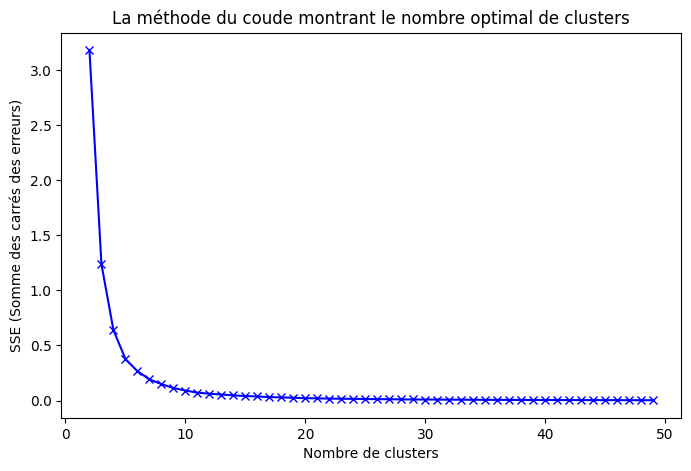

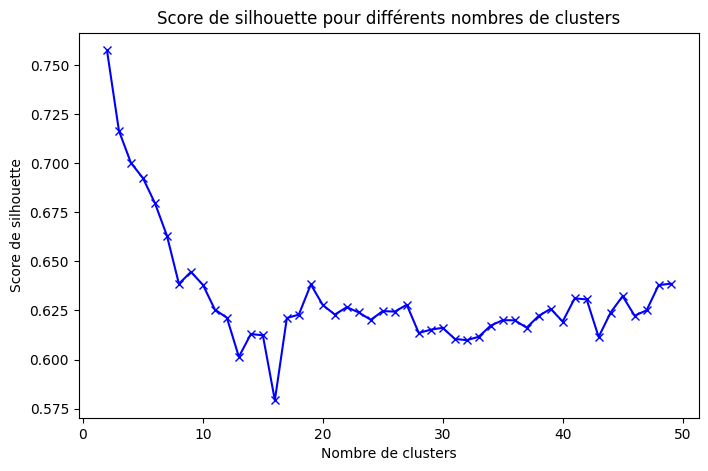

Nombre optimal de clusters selon le score de silhouette : 2.

Le nombre de clusters k pour lequel le score de silhouette est le plus proche de 0.5 est : 16.


In [ ]:
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

X = [X_stds_1d[i] for i in range(df.shape[1]) if not np.isnan(X_stds_1d[i])]

# Convertir la liste en un tableau NumPy en 1D pour un traitement plus rapide
X = np.array(X).reshape(-1, 1)

# Recherche du nombre optimal de clusters avec la méthode du coude et le score de silhouette
sse = {}  # Pour stocker la somme des carrés des erreurs
silhouette_scores = {}
for k in range(2, min(df.shape[1], 50)):  # Testez un nombre de clusters de 2 au minimum entre la dimension et 50
    kmeans = KMeans(n_clusters=k, random_state=42).fit(X)
    sse[k] = kmeans.inertia_  # Somme des carrés des erreurs pour ce nombre de clusters
    silhouette_scores[k] = silhouette_score(X, kmeans.labels_)

# Tracer la courbe du coude
plt.figure(figsize=(8, 5))
plt.plot(list(sse.keys()), list(sse.values()), 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel('SSE (Somme des carrés des erreurs)')
plt.title('La méthode du coude montrant le nombre optimal de clusters')
plt.show()

# Tracer la courbe de silhouette
plt.figure(figsize=(8, 5))
plt.plot(list(silhouette_scores.keys()), list(silhouette_scores.values()), 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel('Score de silhouette')
plt.title('Score de silhouette pour différents nombres de clusters')
plt.show()

# Déterminer le nombre optimal de clusters en utilisant le score de silhouette
optimal_k = max(silhouette_scores, key=silhouette_scores.get)
print(f'Nombre optimal de clusters selon le score de silhouette : {optimal_k}.\n')

# Calculer la différence absolue avec 0.5 pour chaque score de silhouette
diff_to_half = {k: abs(score - 0.5) for k, score in silhouette_scores.items()}

# Trouver la clé (le nombre de clusters k) pour laquelle la différence est la plus petite
optimal_k_closest_to_half = min(diff_to_half, key=diff_to_half.get)

print(f'Le nombre de clusters k pour lequel le score de silhouette est le plus proche de 0.5 est : {optimal_k_closest_to_half}.')

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will chang

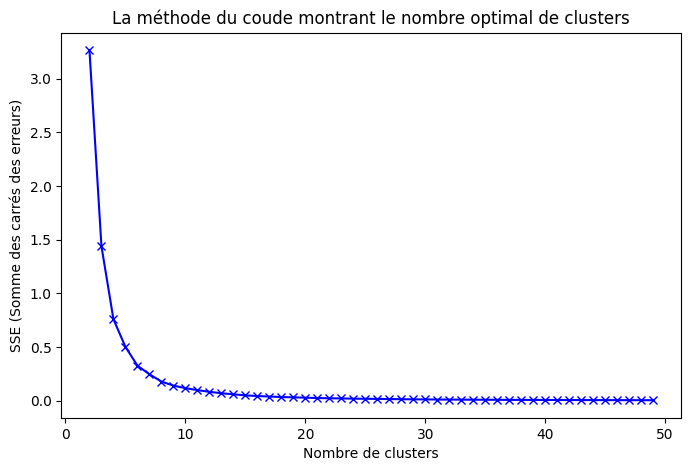

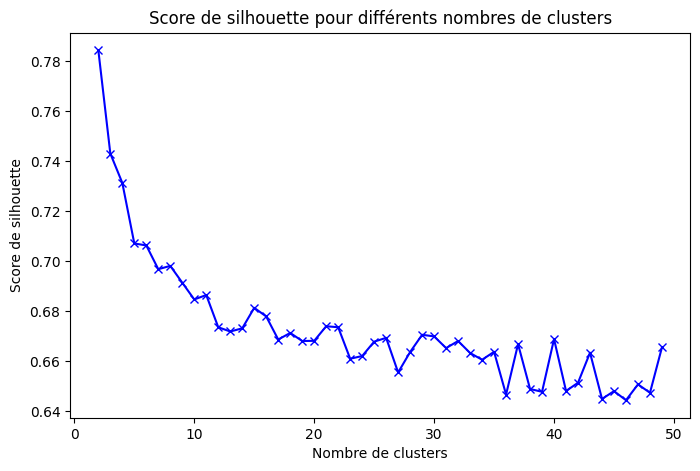

Nombre optimal de clusters selon le score de silhouette : 2.

Le nombre de clusters k pour lequel le score de silhouette est le plus proche de 0.5 est : 46.


In [ ]:
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

X = [X_means_1d[i] for i in range(df.shape[1]) if not np.isnan(X_means_1d[i])]

# Convertir la liste en un tableau NumPy en 1D pour un traitement plus rapide
X = np.array(X).reshape(-1, 1)

# Recherche du nombre optimal de clusters avec la méthode du coude et le score de silhouette
sse = {}  # Pour stocker la somme des carrés des erreurs
silhouette_scores = {}
for k in range(2, min(df.shape[1], 50)):  # Testez un nombre de clusters de 2 au minimum entre la dimension et 50
    kmeans = KMeans(n_clusters=k, random_state=42).fit(X)
    sse[k] = kmeans.inertia_  # Somme des carrés des erreurs pour ce nombre de clusters
    silhouette_scores[k] = silhouette_score(X, kmeans.labels_)

# Tracer la courbe du coude
plt.figure(figsize=(8, 5))
plt.plot(list(sse.keys()), list(sse.values()), 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel('SSE (Somme des carrés des erreurs)')
plt.title('La méthode du coude montrant le nombre optimal de clusters')
plt.show()

# Tracer la courbe de silhouette
plt.figure(figsize=(8, 5))
plt.plot(list(silhouette_scores.keys()), list(silhouette_scores.values()), 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel('Score de silhouette')
plt.title('Score de silhouette pour différents nombres de clusters')
plt.show()

# Déterminer le nombre optimal de clusters en utilisant le score de silhouette
optimal_k = max(silhouette_scores, key=silhouette_scores.get)
print(f'Nombre optimal de clusters selon le score de silhouette : {optimal_k}.\n')

# Calculer la différence absolue avec 0.5 pour chaque score de silhouette
diff_to_half = {k: abs(score - 0.5) for k, score in silhouette_scores.items()}

# Trouver la clé (le nombre de clusters k) pour laquelle la différence est la plus petite
optimal_k_closest_to_half = min(diff_to_half, key=diff_to_half.get)

print(f'Le nombre de clusters k pour lequel le score de silhouette est le plus proche de 0.5 est : {optimal_k_closest_to_half}.')

## CIFAR-10 Test :

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler

import plotly.graph_objs as go

df = pd.read_csv('cifar10_test.csv', sep=',')

print(df.head())

# Remplacer les valeurs NaN par 0
df.fillna(0, inplace=True)

# Liste des colonnes contenant du texte
text_columns = df.select_dtypes(include=['object']).columns

# Remplacement du texte par des valeurs numériques
for column in text_columns:
    le = LabelEncoder()
    df[column] = le.fit_transform(df[column].astype(str))

# Création d'un objet MinMaxScaler
scaler = MinMaxScaler()

# Normalisation des colonnes du DataFrame
df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

# Affichage du DataFrame modifié
print(df.head())

# Obtenez les statistiques
means = df.mean()  # Calcul des moyennes pour chaque colonne
stds = df.std()  # Calcul des écarts-types pour chaque colonne
mean_correlations = df.corr().mean()  # Calcul des corrélations pour chaque colonne

# Afficher les résultats
print()
print("------------Moyennes------------")
print(means)
print()
print("----------Écarts-types----------")
print(stds)
print()
print("---Moyennes des corrélations---")
print(mean_correlations)

# Fonction pour générer les points sur une sphère
def generate_sphere_points(mean, std, mean_correlation, center=[0, 0, 0]):
    phi = np.random.uniform(0, np.pi)
    theta = np.random.uniform(0, 2 * np.pi)
    x = [mean * np.sin(phi) * np.cos(theta) + center[0],
         std * np.sin(phi) * np.cos(theta) + center[0],
         mean_correlation * np.sin(phi) * np.cos(theta) + center[0]]
    y = [mean * np.sin(phi) * np.sin(theta) + center[1],
         std * np.sin(phi) * np.sin(theta) + center[1],
         mean_correlation * np.sin(phi) * np.sin(theta) + center[1]]
    z = [mean * np.cos(phi) + center[2],
         std * np.cos(phi) + center[2],
         mean_correlation * np.cos(phi) + center[2]]
    return x, y, z

# Préparer les données pour le graphique 3D
X_means_3d = []
Y_means_3d = []
Z_means_3d = []
X_stds_3d = []
Y_stds_3d = []
Z_stds_3d = []
X_mean_correlations_3d = []
Y_mean_correlations_3d = []
Z_mean_correlations_3d = []
X_lines_3d = []
Y_lines_3d = []
Z_lines_3d = []

# Générer les points pour chaque colonne
for i in range(df.shape[1]):
    x, y, z = generate_sphere_points(means[i], stds[i], mean_correlations[i])
    X_means_3d.append(x[0])
    Y_means_3d.append(y[0])
    Z_means_3d.append(z[0])
    X_stds_3d.append(x[1])
    Y_stds_3d.append(y[1])
    Z_stds_3d.append(z[1])
    X_mean_correlations_3d.append(x[2])
    Y_mean_correlations_3d.append(y[2])
    Z_mean_correlations_3d.append(z[2])
    X_lines_3d += [0, x[0], None]
    Y_lines_3d += [0, y[0], None]
    Z_lines_3d += [0, z[0], None]
    X_lines_3d += [0, x[1], None]
    Y_lines_3d += [0, y[1], None]
    Z_lines_3d += [0, z[1], None]
    X_lines_3d += [0, x[2], None]
    Y_lines_3d += [0, y[2], None]
    Z_lines_3d += [0, z[2], None]

# Créer le graphique avec plotly
trace_means_3d = go.Scatter3d(
    x=X_means_3d,
    y=Y_means_3d,
    z=Z_means_3d,
    mode='markers',
    marker=dict(
        size=5,
        color='blue',
    ),
    name='Moyennes'
)

trace_stds_3d = go.Scatter3d(
    x=X_stds_3d,
    y=Y_stds_3d,
    z=Z_stds_3d,
    mode='markers',
    marker=dict(
        size=5,
        color='red',
    ),
    name='Écarts-types'
)

trace_mean_correlations_3d = go.Scatter3d(
    x=X_mean_correlations_3d,
    y=Y_mean_correlations_3d,
    z=Z_mean_correlations_3d,
    mode='markers',
    marker=dict(
        size=5,
        color='green',
    ),
    name='Moyennes des corrélations'
)

trace_lines_3d = go.Scatter3d(
    x=X_lines_3d,
    y=Y_lines_3d,
    z=Z_lines_3d,
    mode='lines',
    line=dict(
        color='black',
        width=2
    ),
    name='Lignes'
)

fig_3d = go.Figure(data=[trace_means_3d, trace_stds_3d, trace_mean_correlations_3d, trace_lines_3d])

# Afficher le graphique
fig_3d.show()

# Fonction pour générer les points sur un cercle
def generate_circle_points(mean, std, mean_correlation, center=[0, 0]):
    theta = np.random.uniform(0, 2 * np.pi)
    x = [mean * np.cos(theta) + center[0],
         std * np.cos(theta) + center[0],
         mean_correlation * np.cos(theta) + center[0]]
    y = [mean * np.sin(theta) + center[1],
         std * np.sin(theta) + center[1],
         mean_correlation * np.sin(theta) + center[1]]
    return x, y

# Préparer les données pour le graphique 2D
X_means_2d = []
Y_means_2d = []
X_stds_2d = []
Y_stds_2d = []
X_mean_correlations_2d = []
Y_mean_correlations_2d = []
X_lines_2d = []
Y_lines_2d = []

# Générer les points pour chaque colonne
for i in range(df.shape[1]):
    x, y = generate_circle_points(means[i], stds[i], mean_correlations[i])
    X_means_2d.append(x[0])
    Y_means_2d.append(y[0])
    X_stds_2d.append(x[1])
    Y_stds_2d.append(y[1])
    X_mean_correlations_2d.append(x[2])
    Y_mean_correlations_2d.append(y[2])
    X_lines_2d += [0, x[0], None]
    Y_lines_2d += [0, y[0], None]
    X_lines_2d += [0, x[1], None]
    Y_lines_2d += [0, y[1], None]
    X_lines_2d += [0, x[2], None]
    Y_lines_2d += [0, y[2], None]

# Créer le graphique avec plotly
trace_means_2d = go.Scatter(
    x=X_means_2d,
    y=Y_means_2d,
    mode='markers',
    marker=dict(
        size=10,
        color='blue'
    ),
    name='Moyennes'
)

trace_stds_2d = go.Scatter(
    x=X_stds_2d,
    y=Y_stds_2d,
    mode='markers',
    marker=dict(
        size=10,
        color='red'
    ),
    name='Écarts-types'
)

trace_mean_correlations_2d = go.Scatter(
    x=X_mean_correlations_2d,
    y=Y_mean_correlations_2d,
    mode='markers',
    marker=dict(
        size=10,
        color='green'
    ),
    name='Moyennes des corrélations'
)

trace_lines_2d = go.Scatter(
    x=X_lines_2d,
    y=Y_lines_2d,
    mode='lines',
    line=dict(
        color='black',
        width=1
    ),
    name='Lignes'
)

fig_2d = go.Figure(data=[trace_means_2d, trace_stds_2d, trace_mean_correlations_2d, trace_lines_2d])

# Afficher le graphique
fig_2d.show()

# Fonction pour générer les points sur un cercle
def generate_line_points(mean, std, mean_correlation, center=0):
    x = [mean + center,
         std + center,
         mean_correlation + center]
    return x

# Préparer les données pour le graphique 1D
X_means_1d = []
X_stds_1d = []
X_mean_correlations_1d = []

# Générer les points pour chaque colonne
for i in range(df.shape[1]):
    x = generate_line_points(means[i], stds[i], mean_correlations[i])
    X_means_1d.append(x[0])
    X_stds_1d.append(x[1])
    X_mean_correlations_1d.append(x[2])

# Créer le graphique avec plotly
trace_means_1d = go.Scatter(
    x=X_means_1d,
    y=[0] * df.shape[1],
    mode='markers',
    marker=dict(
        size=10,
        color='blue'
    ),
    name='Moyennes'
)

trace_stds_1d = go.Scatter(
    x=X_stds_1d,
    y=[0] * df.shape[1],
    mode='markers',
    marker=dict(
        size=10,
        color='red'
    ),
    name='Écarts-types'
)

trace_mean_correlations_1d = go.Scatter(
    x=X_mean_correlations_1d,
    y=[0] * df.shape[1],
    mode='markers',
    marker=dict(
        size=10,
        color='green'
    ),
    name='Moyennes des corrélations'
)

fig_1d = go.Figure(data=[trace_means_1d, trace_stds_1d, trace_mean_correlations_1d])

# Afficher le graphique
fig_1d.show()

Output hidden; open in https://colab.research.google.com to view.

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will chang

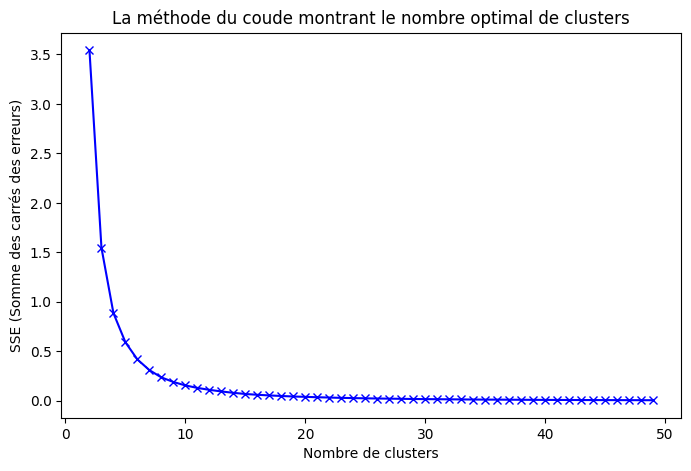

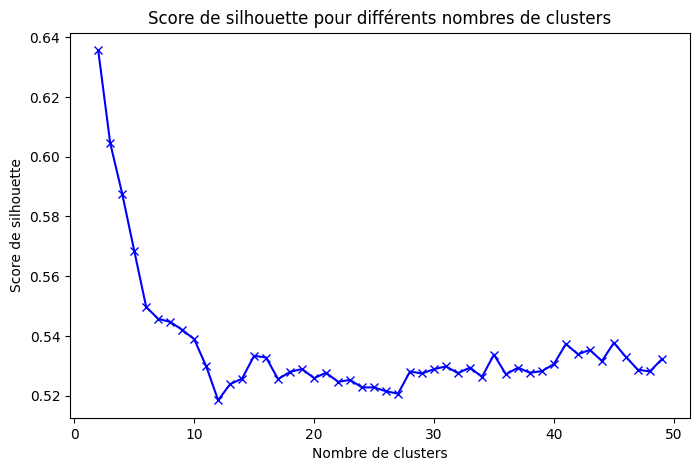

Nombre optimal de clusters selon le score de silhouette : 2.

Le nombre de clusters k pour lequel le score de silhouette est le plus proche de 0.5 est : 12.


In [ ]:
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

X = [X_mean_correlations_1d[i] for i in range(df.shape[1]) if not np.isnan(X_mean_correlations_1d[i])]

# Convertir la liste en un tableau NumPy en 1D pour un traitement plus rapide
X = np.array(X).reshape(-1, 1)

# Recherche du nombre optimal de clusters avec la méthode du coude et le score de silhouette
sse = {}  # Pour stocker la somme des carrés des erreurs
silhouette_scores = {}
for k in range(2, min(df.shape[1], 50)):  # Testez un nombre de clusters de 2 au minimum entre la dimension et 50
    kmeans = KMeans(n_clusters=k, random_state=42).fit(X)
    sse[k] = kmeans.inertia_  # Somme des carrés des erreurs pour ce nombre de clusters
    silhouette_scores[k] = silhouette_score(X, kmeans.labels_)

# Tracer la courbe du coude
plt.figure(figsize=(8, 5))
plt.plot(list(sse.keys()), list(sse.values()), 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel('SSE (Somme des carrés des erreurs)')
plt.title('La méthode du coude montrant le nombre optimal de clusters')
plt.show()

# Tracer la courbe de silhouette
plt.figure(figsize=(8, 5))
plt.plot(list(silhouette_scores.keys()), list(silhouette_scores.values()), 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel('Score de silhouette')
plt.title('Score de silhouette pour différents nombres de clusters')
plt.show()

# Déterminer le nombre optimal de clusters en utilisant le score de silhouette
optimal_k = max(silhouette_scores, key=silhouette_scores.get)
print(f'Nombre optimal de clusters selon le score de silhouette : {optimal_k}.\n')

# Calculer la différence absolue avec 0.5 pour chaque score de silhouette
diff_to_half = {k: abs(score - 0.5) for k, score in silhouette_scores.items()}

# Trouver la clé (le nombre de clusters k) pour laquelle la différence est la plus petite
optimal_k_closest_to_half = min(diff_to_half, key=diff_to_half.get)

print(f'Le nombre de clusters k pour lequel le score de silhouette est le plus proche de 0.5 est : {optimal_k_closest_to_half}.')

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will chang

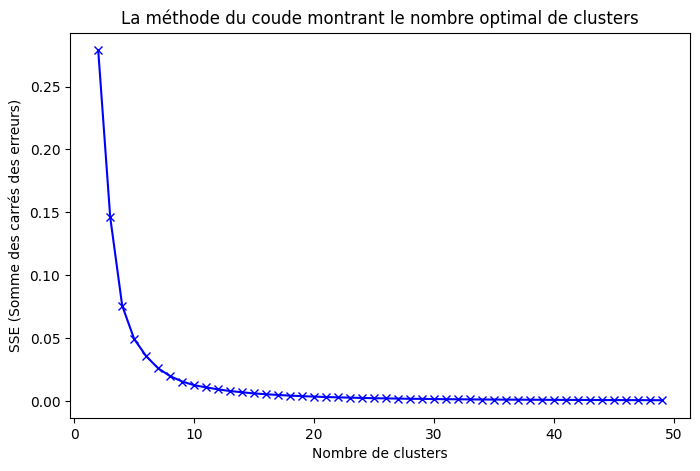

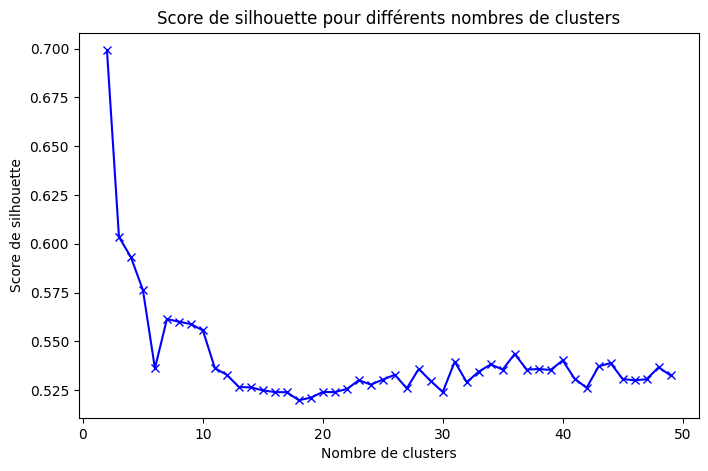

Nombre optimal de clusters selon le score de silhouette : 2.

Le nombre de clusters k pour lequel le score de silhouette est le plus proche de 0.5 est : 18.


In [ ]:
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

X = [X_stds_1d[i] for i in range(df.shape[1]) if not np.isnan(X_stds_1d[i])]

# Convertir la liste en un tableau NumPy en 1D pour un traitement plus rapide
X = np.array(X).reshape(-1, 1)

# Recherche du nombre optimal de clusters avec la méthode du coude et le score de silhouette
sse = {}  # Pour stocker la somme des carrés des erreurs
silhouette_scores = {}
for k in range(2, min(df.shape[1], 50)):  # Testez un nombre de clusters de 2 au minimum entre la dimension et 50
    kmeans = KMeans(n_clusters=k, random_state=42).fit(X)
    sse[k] = kmeans.inertia_  # Somme des carrés des erreurs pour ce nombre de clusters
    silhouette_scores[k] = silhouette_score(X, kmeans.labels_)

# Tracer la courbe du coude
plt.figure(figsize=(8, 5))
plt.plot(list(sse.keys()), list(sse.values()), 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel('SSE (Somme des carrés des erreurs)')
plt.title('La méthode du coude montrant le nombre optimal de clusters')
plt.show()

# Tracer la courbe de silhouette
plt.figure(figsize=(8, 5))
plt.plot(list(silhouette_scores.keys()), list(silhouette_scores.values()), 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel('Score de silhouette')
plt.title('Score de silhouette pour différents nombres de clusters')
plt.show()

# Déterminer le nombre optimal de clusters en utilisant le score de silhouette
optimal_k = max(silhouette_scores, key=silhouette_scores.get)
print(f'Nombre optimal de clusters selon le score de silhouette : {optimal_k}.\n')

# Calculer la différence absolue avec 0.5 pour chaque score de silhouette
diff_to_half = {k: abs(score - 0.5) for k, score in silhouette_scores.items()}

# Trouver la clé (le nombre de clusters k) pour laquelle la différence est la plus petite
optimal_k_closest_to_half = min(diff_to_half, key=diff_to_half.get)

print(f'Le nombre de clusters k pour lequel le score de silhouette est le plus proche de 0.5 est : {optimal_k_closest_to_half}.')

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will chang

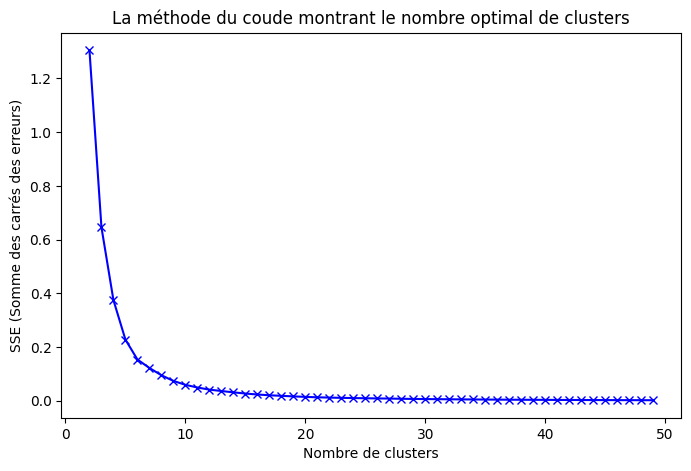

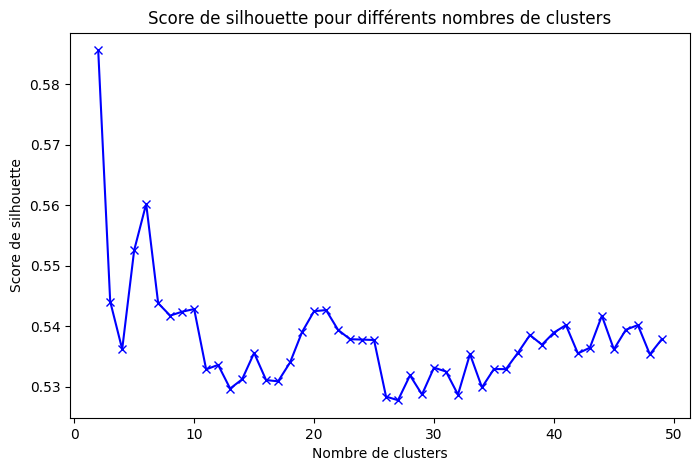

Nombre optimal de clusters selon le score de silhouette : 2.

Le nombre de clusters k pour lequel le score de silhouette est le plus proche de 0.5 est : 27.


In [ ]:
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

X = [X_means_1d[i] for i in range(df.shape[1]) if not np.isnan(X_means_1d[i])]

# Convertir la liste en un tableau NumPy en 1D pour un traitement plus rapide
X = np.array(X).reshape(-1, 1)

# Recherche du nombre optimal de clusters avec la méthode du coude et le score de silhouette
sse = {}  # Pour stocker la somme des carrés des erreurs
silhouette_scores = {}
for k in range(2, min(df.shape[1], 50)):  # Testez un nombre de clusters de 2 au minimum entre la dimension et 50
    kmeans = KMeans(n_clusters=k, random_state=42).fit(X)
    sse[k] = kmeans.inertia_  # Somme des carrés des erreurs pour ce nombre de clusters
    silhouette_scores[k] = silhouette_score(X, kmeans.labels_)

# Tracer la courbe du coude
plt.figure(figsize=(8, 5))
plt.plot(list(sse.keys()), list(sse.values()), 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel('SSE (Somme des carrés des erreurs)')
plt.title('La méthode du coude montrant le nombre optimal de clusters')
plt.show()

# Tracer la courbe de silhouette
plt.figure(figsize=(8, 5))
plt.plot(list(silhouette_scores.keys()), list(silhouette_scores.values()), 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel('Score de silhouette')
plt.title('Score de silhouette pour différents nombres de clusters')
plt.show()

# Déterminer le nombre optimal de clusters en utilisant le score de silhouette
optimal_k = max(silhouette_scores, key=silhouette_scores.get)
print(f'Nombre optimal de clusters selon le score de silhouette : {optimal_k}.\n')

# Calculer la différence absolue avec 0.5 pour chaque score de silhouette
diff_to_half = {k: abs(score - 0.5) for k, score in silhouette_scores.items()}

# Trouver la clé (le nombre de clusters k) pour laquelle la différence est la plus petite
optimal_k_closest_to_half = min(diff_to_half, key=diff_to_half.get)

print(f'Le nombre de clusters k pour lequel le score de silhouette est le plus proche de 0.5 est : {optimal_k_closest_to_half}.')

## CIFAR-10 Train :

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler

import plotly.graph_objs as go

df = pd.read_csv('cifar10_train.csv', sep=',')

print(df.head())

# Remplacer les valeurs NaN par 0
df.fillna(0, inplace=True)

# Liste des colonnes contenant du texte
text_columns = df.select_dtypes(include=['object']).columns

# Remplacement du texte par des valeurs numériques
for column in text_columns:
    le = LabelEncoder()
    df[column] = le.fit_transform(df[column].astype(str))

# Création d'un objet MinMaxScaler
scaler = MinMaxScaler()

# Normalisation des colonnes du DataFrame
df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

# Affichage du DataFrame modifié
print(df.head())

# Obtenez les statistiques
means = df.mean()  # Calcul des moyennes pour chaque colonne
stds = df.std()  # Calcul des écarts-types pour chaque colonne
mean_correlations = df.corr().mean()  # Calcul des corrélations pour chaque colonne

# Afficher les résultats
print()
print("------------Moyennes------------")
print(means)
print()
print("----------Écarts-types----------")
print(stds)
print()
print("---Moyennes des corrélations---")
print(mean_correlations)

# Fonction pour générer les points sur une sphère
def generate_sphere_points(mean, std, mean_correlation, center=[0, 0, 0]):
    phi = np.random.uniform(0, np.pi)
    theta = np.random.uniform(0, 2 * np.pi)
    x = [mean * np.sin(phi) * np.cos(theta) + center[0],
         std * np.sin(phi) * np.cos(theta) + center[0],
         mean_correlation * np.sin(phi) * np.cos(theta) + center[0]]
    y = [mean * np.sin(phi) * np.sin(theta) + center[1],
         std * np.sin(phi) * np.sin(theta) + center[1],
         mean_correlation * np.sin(phi) * np.sin(theta) + center[1]]
    z = [mean * np.cos(phi) + center[2],
         std * np.cos(phi) + center[2],
         mean_correlation * np.cos(phi) + center[2]]
    return x, y, z

# Préparer les données pour le graphique 3D
X_means_3d = []
Y_means_3d = []
Z_means_3d = []
X_stds_3d = []
Y_stds_3d = []
Z_stds_3d = []
X_mean_correlations_3d = []
Y_mean_correlations_3d = []
Z_mean_correlations_3d = []
X_lines_3d = []
Y_lines_3d = []
Z_lines_3d = []

# Générer les points pour chaque colonne
for i in range(df.shape[1]):
    x, y, z = generate_sphere_points(means[i], stds[i], mean_correlations[i])
    X_means_3d.append(x[0])
    Y_means_3d.append(y[0])
    Z_means_3d.append(z[0])
    X_stds_3d.append(x[1])
    Y_stds_3d.append(y[1])
    Z_stds_3d.append(z[1])
    X_mean_correlations_3d.append(x[2])
    Y_mean_correlations_3d.append(y[2])
    Z_mean_correlations_3d.append(z[2])
    X_lines_3d += [0, x[0], None]
    Y_lines_3d += [0, y[0], None]
    Z_lines_3d += [0, z[0], None]
    X_lines_3d += [0, x[1], None]
    Y_lines_3d += [0, y[1], None]
    Z_lines_3d += [0, z[1], None]
    X_lines_3d += [0, x[2], None]
    Y_lines_3d += [0, y[2], None]
    Z_lines_3d += [0, z[2], None]

# Créer le graphique avec plotly
trace_means_3d = go.Scatter3d(
    x=X_means_3d,
    y=Y_means_3d,
    z=Z_means_3d,
    mode='markers',
    marker=dict(
        size=5,
        color='blue',
    ),
    name='Moyennes'
)

trace_stds_3d = go.Scatter3d(
    x=X_stds_3d,
    y=Y_stds_3d,
    z=Z_stds_3d,
    mode='markers',
    marker=dict(
        size=5,
        color='red',
    ),
    name='Écarts-types'
)

trace_mean_correlations_3d = go.Scatter3d(
    x=X_mean_correlations_3d,
    y=Y_mean_correlations_3d,
    z=Z_mean_correlations_3d,
    mode='markers',
    marker=dict(
        size=5,
        color='green',
    ),
    name='Moyennes des corrélations'
)

trace_lines_3d = go.Scatter3d(
    x=X_lines_3d,
    y=Y_lines_3d,
    z=Z_lines_3d,
    mode='lines',
    line=dict(
        color='black',
        width=2
    ),
    name='Lignes'
)

fig_3d = go.Figure(data=[trace_means_3d, trace_stds_3d, trace_mean_correlations_3d, trace_lines_3d])

# Afficher le graphique
fig_3d.show()

# Fonction pour générer les points sur un cercle
def generate_circle_points(mean, std, mean_correlation, center=[0, 0]):
    theta = np.random.uniform(0, 2 * np.pi)
    x = [mean * np.cos(theta) + center[0],
         std * np.cos(theta) + center[0],
         mean_correlation * np.cos(theta) + center[0]]
    y = [mean * np.sin(theta) + center[1],
         std * np.sin(theta) + center[1],
         mean_correlation * np.sin(theta) + center[1]]
    return x, y

# Préparer les données pour le graphique 2D
X_means_2d = []
Y_means_2d = []
X_stds_2d = []
Y_stds_2d = []
X_mean_correlations_2d = []
Y_mean_correlations_2d = []
X_lines_2d = []
Y_lines_2d = []

# Générer les points pour chaque colonne
for i in range(df.shape[1]):
    x, y = generate_circle_points(means[i], stds[i], mean_correlations[i])
    X_means_2d.append(x[0])
    Y_means_2d.append(y[0])
    X_stds_2d.append(x[1])
    Y_stds_2d.append(y[1])
    X_mean_correlations_2d.append(x[2])
    Y_mean_correlations_2d.append(y[2])
    X_lines_2d += [0, x[0], None]
    Y_lines_2d += [0, y[0], None]
    X_lines_2d += [0, x[1], None]
    Y_lines_2d += [0, y[1], None]
    X_lines_2d += [0, x[2], None]
    Y_lines_2d += [0, y[2], None]

# Créer le graphique avec plotly
trace_means_2d = go.Scatter(
    x=X_means_2d,
    y=Y_means_2d,
    mode='markers',
    marker=dict(
        size=10,
        color='blue'
    ),
    name='Moyennes'
)

trace_stds_2d = go.Scatter(
    x=X_stds_2d,
    y=Y_stds_2d,
    mode='markers',
    marker=dict(
        size=10,
        color='red'
    ),
    name='Écarts-types'
)

trace_mean_correlations_2d = go.Scatter(
    x=X_mean_correlations_2d,
    y=Y_mean_correlations_2d,
    mode='markers',
    marker=dict(
        size=10,
        color='green'
    ),
    name='Moyennes des corrélations'
)

trace_lines_2d = go.Scatter(
    x=X_lines_2d,
    y=Y_lines_2d,
    mode='lines',
    line=dict(
        color='black',
        width=1
    ),
    name='Lignes'
)

fig_2d = go.Figure(data=[trace_means_2d, trace_stds_2d, trace_mean_correlations_2d, trace_lines_2d])

# Afficher le graphique
fig_2d.show()

# Fonction pour générer les points sur un cercle
def generate_line_points(mean, std, mean_correlation, center=0):
    x = [mean + center,
         std + center,
         mean_correlation + center]
    return x

# Préparer les données pour le graphique 1D
X_means_1d = []
X_stds_1d = []
X_mean_correlations_1d = []

# Générer les points pour chaque colonne
for i in range(df.shape[1]):
    x = generate_line_points(means[i], stds[i], mean_correlations[i])
    X_means_1d.append(x[0])
    X_stds_1d.append(x[1])
    X_mean_correlations_1d.append(x[2])

# Créer le graphique avec plotly
trace_means_1d = go.Scatter(
    x=X_means_1d,
    y=[0] * df.shape[1],
    mode='markers',
    marker=dict(
        size=10,
        color='blue'
    ),
    name='Moyennes'
)

trace_stds_1d = go.Scatter(
    x=X_stds_1d,
    y=[0] * df.shape[1],
    mode='markers',
    marker=dict(
        size=10,
        color='red'
    ),
    name='Écarts-types'
)

trace_mean_correlations_1d = go.Scatter(
    x=X_mean_correlations_1d,
    y=[0] * df.shape[1],
    mode='markers',
    marker=dict(
        size=10,
        color='green'
    ),
    name='Moyennes des corrélations'
)

fig_1d = go.Figure(data=[trace_means_1d, trace_stds_1d, trace_mean_correlations_1d])

# Afficher le graphique
fig_1d.show()

Output hidden; open in https://colab.research.google.com to view.

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will chang

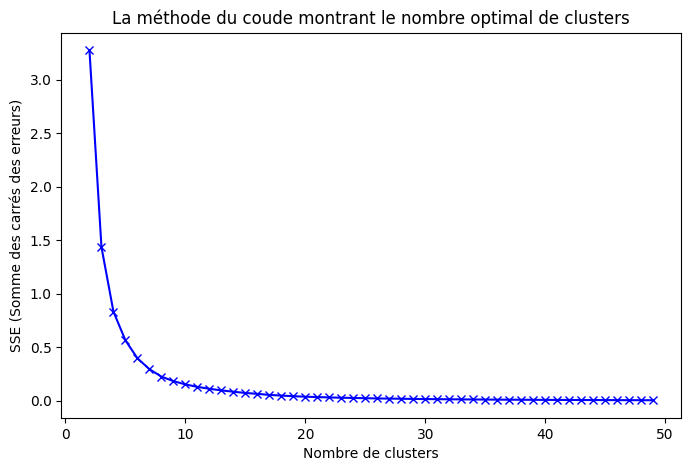

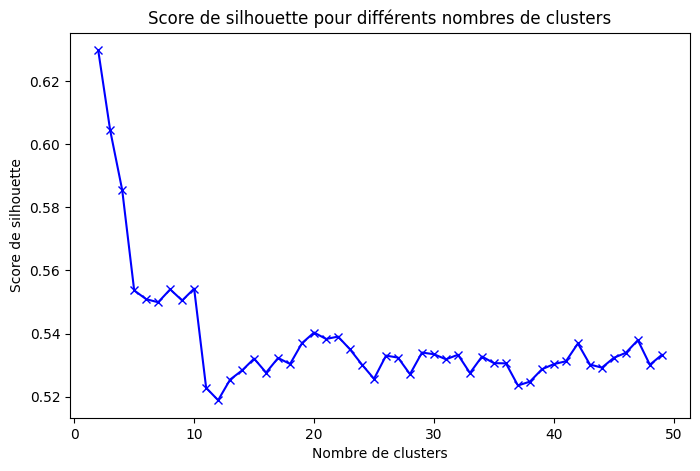

Nombre optimal de clusters selon le score de silhouette : 2.

Le nombre de clusters k pour lequel le score de silhouette est le plus proche de 0.5 est : 12.


In [ ]:
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

X = [X_mean_correlations_1d[i] for i in range(df.shape[1]) if not np.isnan(X_mean_correlations_1d[i])]

# Convertir la liste en un tableau NumPy en 1D pour un traitement plus rapide
X = np.array(X).reshape(-1, 1)

# Recherche du nombre optimal de clusters avec la méthode du coude et le score de silhouette
sse = {}  # Pour stocker la somme des carrés des erreurs
silhouette_scores = {}
for k in range(2, min(df.shape[1], 50)):  # Testez un nombre de clusters de 2 au minimum entre la dimension et 50
    kmeans = KMeans(n_clusters=k, random_state=42).fit(X)
    sse[k] = kmeans.inertia_  # Somme des carrés des erreurs pour ce nombre de clusters
    silhouette_scores[k] = silhouette_score(X, kmeans.labels_)

# Tracer la courbe du coude
plt.figure(figsize=(8, 5))
plt.plot(list(sse.keys()), list(sse.values()), 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel('SSE (Somme des carrés des erreurs)')
plt.title('La méthode du coude montrant le nombre optimal de clusters')
plt.show()

# Tracer la courbe de silhouette
plt.figure(figsize=(8, 5))
plt.plot(list(silhouette_scores.keys()), list(silhouette_scores.values()), 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel('Score de silhouette')
plt.title('Score de silhouette pour différents nombres de clusters')
plt.show()

# Déterminer le nombre optimal de clusters en utilisant le score de silhouette
optimal_k = max(silhouette_scores, key=silhouette_scores.get)
print(f'Nombre optimal de clusters selon le score de silhouette : {optimal_k}.\n')

# Calculer la différence absolue avec 0.5 pour chaque score de silhouette
diff_to_half = {k: abs(score - 0.5) for k, score in silhouette_scores.items()}

# Trouver la clé (le nombre de clusters k) pour laquelle la différence est la plus petite
optimal_k_closest_to_half = min(diff_to_half, key=diff_to_half.get)

print(f'Le nombre de clusters k pour lequel le score de silhouette est le plus proche de 0.5 est : {optimal_k_closest_to_half}.')

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will chang

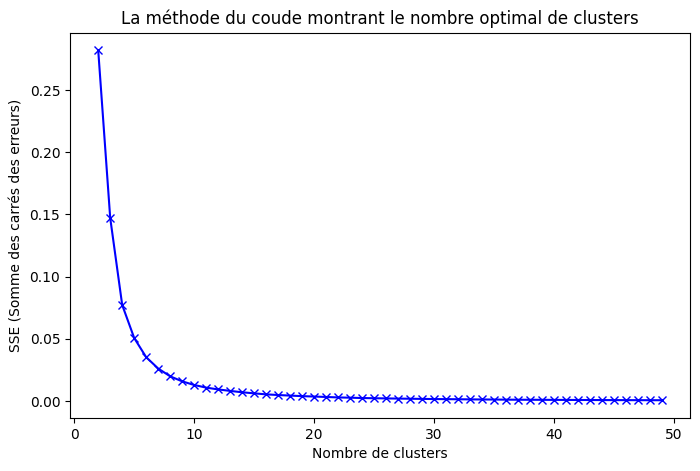

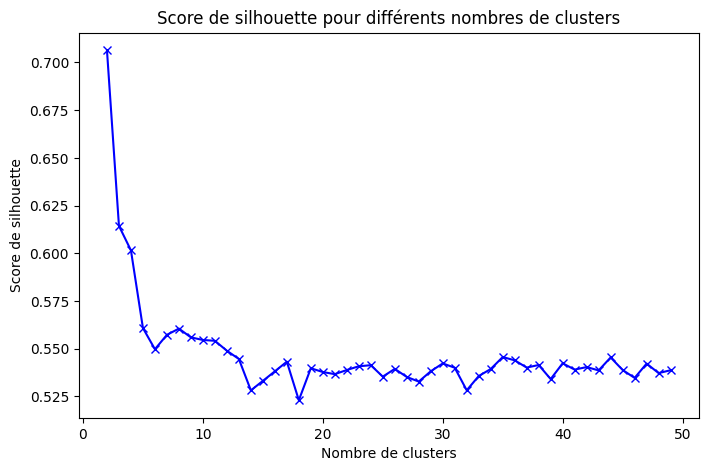

Nombre optimal de clusters selon le score de silhouette : 2.

Le nombre de clusters k pour lequel le score de silhouette est le plus proche de 0.5 est : 18.


In [ ]:
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

X = [X_stds_1d[i] for i in range(df.shape[1]) if not np.isnan(X_stds_1d[i])]

# Convertir la liste en un tableau NumPy en 1D pour un traitement plus rapide
X = np.array(X).reshape(-1, 1)

# Recherche du nombre optimal de clusters avec la méthode du coude et le score de silhouette
sse = {}  # Pour stocker la somme des carrés des erreurs
silhouette_scores = {}
for k in range(2, min(df.shape[1], 50)):  # Testez un nombre de clusters de 2 au minimum entre la dimension et 50
    kmeans = KMeans(n_clusters=k, random_state=42).fit(X)
    sse[k] = kmeans.inertia_  # Somme des carrés des erreurs pour ce nombre de clusters
    silhouette_scores[k] = silhouette_score(X, kmeans.labels_)

# Tracer la courbe du coude
plt.figure(figsize=(8, 5))
plt.plot(list(sse.keys()), list(sse.values()), 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel('SSE (Somme des carrés des erreurs)')
plt.title('La méthode du coude montrant le nombre optimal de clusters')
plt.show()

# Tracer la courbe de silhouette
plt.figure(figsize=(8, 5))
plt.plot(list(silhouette_scores.keys()), list(silhouette_scores.values()), 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel('Score de silhouette')
plt.title('Score de silhouette pour différents nombres de clusters')
plt.show()

# Déterminer le nombre optimal de clusters en utilisant le score de silhouette
optimal_k = max(silhouette_scores, key=silhouette_scores.get)
print(f'Nombre optimal de clusters selon le score de silhouette : {optimal_k}.\n')

# Calculer la différence absolue avec 0.5 pour chaque score de silhouette
diff_to_half = {k: abs(score - 0.5) for k, score in silhouette_scores.items()}

# Trouver la clé (le nombre de clusters k) pour laquelle la différence est la plus petite
optimal_k_closest_to_half = min(diff_to_half, key=diff_to_half.get)

print(f'Le nombre de clusters k pour lequel le score de silhouette est le plus proche de 0.5 est : {optimal_k_closest_to_half}.')

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will chang

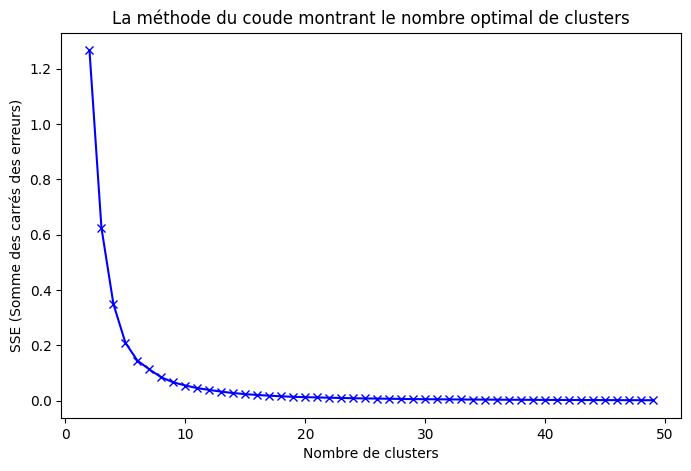

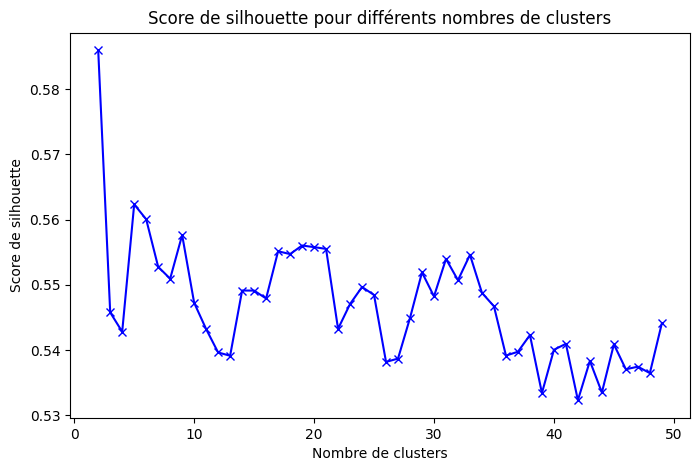

Nombre optimal de clusters selon le score de silhouette : 2.

Le nombre de clusters k pour lequel le score de silhouette est le plus proche de 0.5 est : 42.


In [ ]:
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

X = [X_means_1d[i] for i in range(df.shape[1]) if not np.isnan(X_means_1d[i])]

# Convertir la liste en un tableau NumPy en 1D pour un traitement plus rapide
X = np.array(X).reshape(-1, 1)

# Recherche du nombre optimal de clusters avec la méthode du coude et le score de silhouette
sse = {}  # Pour stocker la somme des carrés des erreurs
silhouette_scores = {}
for k in range(2, min(df.shape[1], 50)):  # Testez un nombre de clusters de 2 au minimum entre la dimension et 50
    kmeans = KMeans(n_clusters=k, random_state=42).fit(X)
    sse[k] = kmeans.inertia_  # Somme des carrés des erreurs pour ce nombre de clusters
    silhouette_scores[k] = silhouette_score(X, kmeans.labels_)

# Tracer la courbe du coude
plt.figure(figsize=(8, 5))
plt.plot(list(sse.keys()), list(sse.values()), 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel('SSE (Somme des carrés des erreurs)')
plt.title('La méthode du coude montrant le nombre optimal de clusters')
plt.show()

# Tracer la courbe de silhouette
plt.figure(figsize=(8, 5))
plt.plot(list(silhouette_scores.keys()), list(silhouette_scores.values()), 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel('Score de silhouette')
plt.title('Score de silhouette pour différents nombres de clusters')
plt.show()

# Déterminer le nombre optimal de clusters en utilisant le score de silhouette
optimal_k = max(silhouette_scores, key=silhouette_scores.get)
print(f'Nombre optimal de clusters selon le score de silhouette : {optimal_k}.\n')

# Calculer la différence absolue avec 0.5 pour chaque score de silhouette
diff_to_half = {k: abs(score - 0.5) for k, score in silhouette_scores.items()}

# Trouver la clé (le nombre de clusters k) pour laquelle la différence est la plus petite
optimal_k_closest_to_half = min(diff_to_half, key=diff_to_half.get)

print(f'Le nombre de clusters k pour lequel le score de silhouette est le plus proche de 0.5 est : {optimal_k_closest_to_half}.')

## CelebA :

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler

import plotly.graph_objs as go

df = pd.read_csv('celeb_a.csv', sep=',')

print(df.head())

# Remplacer les valeurs NaN par 0
df.fillna(0, inplace=True)

# Liste des colonnes contenant du texte
text_columns = df.select_dtypes(include=['object']).columns

# Remplacement du texte par des valeurs numériques
for column in text_columns:
    le = LabelEncoder()
    df[column] = le.fit_transform(df[column].astype(str))

# Création d'un objet MinMaxScaler
scaler = MinMaxScaler()

# Normalisation des colonnes du DataFrame
df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

# Affichage du DataFrame modifié
print(df.head())

# Obtenez les statistiques
means = df.mean()  # Calcul des moyennes pour chaque colonne
stds = df.std()  # Calcul des écarts-types pour chaque colonne
mean_correlations = df.corr().mean()  # Calcul des corrélations pour chaque colonne

# Afficher les résultats
print()
print("------------Moyennes------------")
print(means)
print()
print("----------Écarts-types----------")
print(stds)
print()
print("---Moyennes des corrélations---")
print(mean_correlations)

# Fonction pour générer les points sur une sphère
def generate_sphere_points(mean, std, mean_correlation, center=[0, 0, 0]):
    phi = np.random.uniform(0, np.pi)
    theta = np.random.uniform(0, 2 * np.pi)
    x = [mean * np.sin(phi) * np.cos(theta) + center[0],
         std * np.sin(phi) * np.cos(theta) + center[0],
         mean_correlation * np.sin(phi) * np.cos(theta) + center[0]]
    y = [mean * np.sin(phi) * np.sin(theta) + center[1],
         std * np.sin(phi) * np.sin(theta) + center[1],
         mean_correlation * np.sin(phi) * np.sin(theta) + center[1]]
    z = [mean * np.cos(phi) + center[2],
         std * np.cos(phi) + center[2],
         mean_correlation * np.cos(phi) + center[2]]
    return x, y, z

# Préparer les données pour le graphique 3D
X_means_3d = []
Y_means_3d = []
Z_means_3d = []
X_stds_3d = []
Y_stds_3d = []
Z_stds_3d = []
X_mean_correlations_3d = []
Y_mean_correlations_3d = []
Z_mean_correlations_3d = []
X_lines_3d = []
Y_lines_3d = []
Z_lines_3d = []

# Générer les points pour chaque colonne
for i in range(df.shape[1]):
    x, y, z = generate_sphere_points(means[i], stds[i], mean_correlations[i])
    X_means_3d.append(x[0])
    Y_means_3d.append(y[0])
    Z_means_3d.append(z[0])
    X_stds_3d.append(x[1])
    Y_stds_3d.append(y[1])
    Z_stds_3d.append(z[1])
    X_mean_correlations_3d.append(x[2])
    Y_mean_correlations_3d.append(y[2])
    Z_mean_correlations_3d.append(z[2])
    X_lines_3d += [0, x[0], None]
    Y_lines_3d += [0, y[0], None]
    Z_lines_3d += [0, z[0], None]
    X_lines_3d += [0, x[1], None]
    Y_lines_3d += [0, y[1], None]
    Z_lines_3d += [0, z[1], None]
    X_lines_3d += [0, x[2], None]
    Y_lines_3d += [0, y[2], None]
    Z_lines_3d += [0, z[2], None]

# Créer le graphique avec plotly
trace_means_3d = go.Scatter3d(
    x=X_means_3d,
    y=Y_means_3d,
    z=Z_means_3d,
    mode='markers',
    marker=dict(
        size=5,
        color='blue',
    ),
    name='Moyennes'
)

trace_stds_3d = go.Scatter3d(
    x=X_stds_3d,
    y=Y_stds_3d,
    z=Z_stds_3d,
    mode='markers',
    marker=dict(
        size=5,
        color='red',
    ),
    name='Écarts-types'
)

trace_mean_correlations_3d = go.Scatter3d(
    x=X_mean_correlations_3d,
    y=Y_mean_correlations_3d,
    z=Z_mean_correlations_3d,
    mode='markers',
    marker=dict(
        size=5,
        color='green',
    ),
    name='Moyennes des corrélations'
)

trace_lines_3d = go.Scatter3d(
    x=X_lines_3d,
    y=Y_lines_3d,
    z=Z_lines_3d,
    mode='lines',
    line=dict(
        color='black',
        width=2
    ),
    name='Lignes'
)

fig_3d = go.Figure(data=[trace_means_3d, trace_stds_3d, trace_mean_correlations_3d, trace_lines_3d])

# Afficher le graphique
fig_3d.show()

# Fonction pour générer les points sur un cercle
def generate_circle_points(mean, std, mean_correlation, center=[0, 0]):
    theta = np.random.uniform(0, 2 * np.pi)
    x = [mean * np.cos(theta) + center[0],
         std * np.cos(theta) + center[0],
         mean_correlation * np.cos(theta) + center[0]]
    y = [mean * np.sin(theta) + center[1],
         std * np.sin(theta) + center[1],
         mean_correlation * np.sin(theta) + center[1]]
    return x, y

# Préparer les données pour le graphique 2D
X_means_2d = []
Y_means_2d = []
X_stds_2d = []
Y_stds_2d = []
X_mean_correlations_2d = []
Y_mean_correlations_2d = []
X_lines_2d = []
Y_lines_2d = []

# Générer les points pour chaque colonne
for i in range(df.shape[1]):
    x, y = generate_circle_points(means[i], stds[i], mean_correlations[i])
    X_means_2d.append(x[0])
    Y_means_2d.append(y[0])
    X_stds_2d.append(x[1])
    Y_stds_2d.append(y[1])
    X_mean_correlations_2d.append(x[2])
    Y_mean_correlations_2d.append(y[2])
    X_lines_2d += [0, x[0], None]
    Y_lines_2d += [0, y[0], None]
    X_lines_2d += [0, x[1], None]
    Y_lines_2d += [0, y[1], None]
    X_lines_2d += [0, x[2], None]
    Y_lines_2d += [0, y[2], None]

# Créer le graphique avec plotly
trace_means_2d = go.Scatter(
    x=X_means_2d,
    y=Y_means_2d,
    mode='markers',
    marker=dict(
        size=10,
        color='blue'
    ),
    name='Moyennes'
)

trace_stds_2d = go.Scatter(
    x=X_stds_2d,
    y=Y_stds_2d,
    mode='markers',
    marker=dict(
        size=10,
        color='red'
    ),
    name='Écarts-types'
)

trace_mean_correlations_2d = go.Scatter(
    x=X_mean_correlations_2d,
    y=Y_mean_correlations_2d,
    mode='markers',
    marker=dict(
        size=10,
        color='green'
    ),
    name='Moyennes des corrélations'
)

trace_lines_2d = go.Scatter(
    x=X_lines_2d,
    y=Y_lines_2d,
    mode='lines',
    line=dict(
        color='black',
        width=1
    ),
    name='Lignes'
)

fig_2d = go.Figure(data=[trace_means_2d, trace_stds_2d, trace_mean_correlations_2d, trace_lines_2d])

# Afficher le graphique
fig_2d.show()

# Fonction pour générer les points sur un cercle
def generate_line_points(mean, std, mean_correlation, center=0):
    x = [mean + center,
         std + center,
         mean_correlation + center]
    return x

# Préparer les données pour le graphique 1D
X_means_1d = []
X_stds_1d = []
X_mean_correlations_1d = []

# Générer les points pour chaque colonne
for i in range(df.shape[1]):
    x = generate_line_points(means[i], stds[i], mean_correlations[i])
    X_means_1d.append(x[0])
    X_stds_1d.append(x[1])
    X_mean_correlations_1d.append(x[2])

# Créer le graphique avec plotly
trace_means_1d = go.Scatter(
    x=X_means_1d,
    y=[0] * df.shape[1],
    mode='markers',
    marker=dict(
        size=10,
        color='blue'
    ),
    name='Moyennes'
)

trace_stds_1d = go.Scatter(
    x=X_stds_1d,
    y=[0] * df.shape[1],
    mode='markers',
    marker=dict(
        size=10,
        color='red'
    ),
    name='Écarts-types'
)

trace_mean_correlations_1d = go.Scatter(
    x=X_mean_correlations_1d,
    y=[0] * df.shape[1],
    mode='markers',
    marker=dict(
        size=10,
        color='green'
    ),
    name='Moyennes des corrélations'
)

fig_1d = go.Figure(data=[trace_means_1d, trace_stds_1d, trace_mean_correlations_1d])

# Afficher le graphique
fig_1d.show()

     image_id  5_o_Clock_Shadow  Arched_Eyebrows  Attractive  Bags_Under_Eyes  \
0  083648.jpg                 1               -1           1               -1   
1  125778.jpg                -1               -1          -1               -1   
2  160139.jpg                -1               -1          -1               -1   
3  046754.jpg                -1               -1           1               -1   
4  169197.jpg                -1               -1           1                1   

   Bald  Bangs  Big_Lips  Big_Nose  Black_Hair  ...  Sideburns  Smiling  \
0    -1     -1        -1        -1           1  ...         -1        1   
1    -1     -1         1         1          -1  ...         -1       -1   
2    -1     -1        -1        -1           1  ...         -1        1   
3    -1     -1        -1         1          -1  ...         -1        1   
4    -1      1        -1         1          -1  ...         -1        1   

   Straight_Hair  Wavy_Hair  Wearing_Earrings  Wearing_Hat  We

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will chang

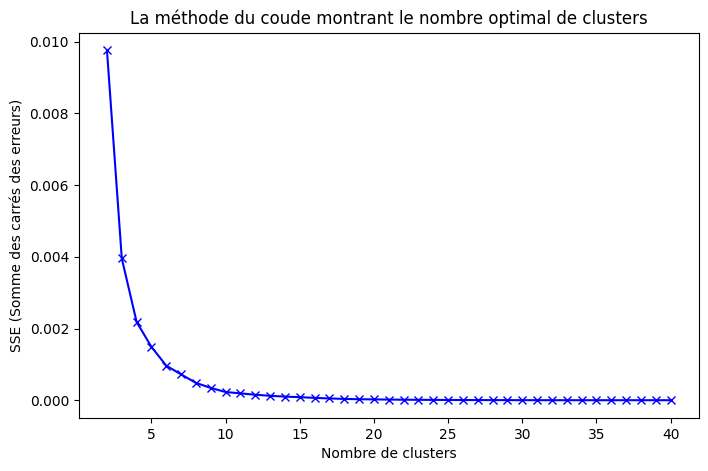

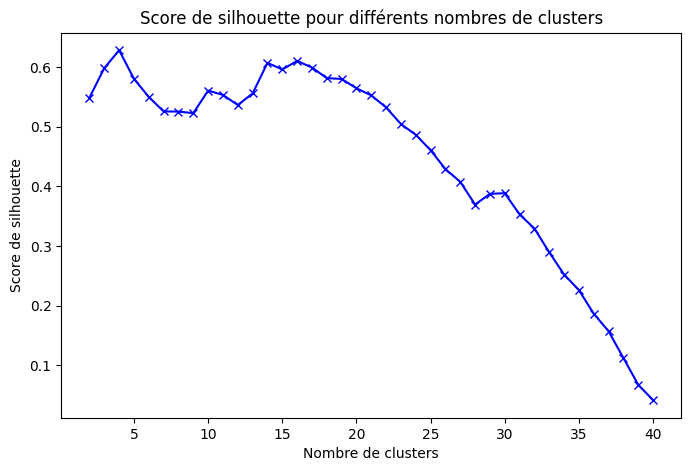

Nombre optimal de clusters selon le score de silhouette : 4.

Le nombre de clusters k pour lequel le score de silhouette est le plus proche de 0.5 est : 23.


In [ ]:
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

X = [X_mean_correlations_1d[i] for i in range(df.shape[1]) if not np.isnan(X_mean_correlations_1d[i])]

# Convertir la liste en un tableau NumPy en 1D pour un traitement plus rapide
X = np.array(X).reshape(-1, 1)

# Recherche du nombre optimal de clusters avec la méthode du coude et le score de silhouette
sse = {}  # Pour stocker la somme des carrés des erreurs
silhouette_scores = {}
for k in range(2, min(df.shape[1], 50)):  # Testez un nombre de clusters de 2 au minimum entre la dimension et 50
    kmeans = KMeans(n_clusters=k, random_state=42).fit(X)
    sse[k] = kmeans.inertia_  # Somme des carrés des erreurs pour ce nombre de clusters
    silhouette_scores[k] = silhouette_score(X, kmeans.labels_)

# Tracer la courbe du coude
plt.figure(figsize=(8, 5))
plt.plot(list(sse.keys()), list(sse.values()), 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel('SSE (Somme des carrés des erreurs)')
plt.title('La méthode du coude montrant le nombre optimal de clusters')
plt.show()

# Tracer la courbe de silhouette
plt.figure(figsize=(8, 5))
plt.plot(list(silhouette_scores.keys()), list(silhouette_scores.values()), 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel('Score de silhouette')
plt.title('Score de silhouette pour différents nombres de clusters')
plt.show()

# Déterminer le nombre optimal de clusters en utilisant le score de silhouette
optimal_k = max(silhouette_scores, key=silhouette_scores.get)
print(f'Nombre optimal de clusters selon le score de silhouette : {optimal_k}.\n')

# Calculer la différence absolue avec 0.5 pour chaque score de silhouette
diff_to_half = {k: abs(score - 0.5) for k, score in silhouette_scores.items()}

# Trouver la clé (le nombre de clusters k) pour laquelle la différence est la plus petite
optimal_k_closest_to_half = min(diff_to_half, key=diff_to_half.get)

print(f'Le nombre de clusters k pour lequel le score de silhouette est le plus proche de 0.5 est : {optimal_k_closest_to_half}.')

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will chang

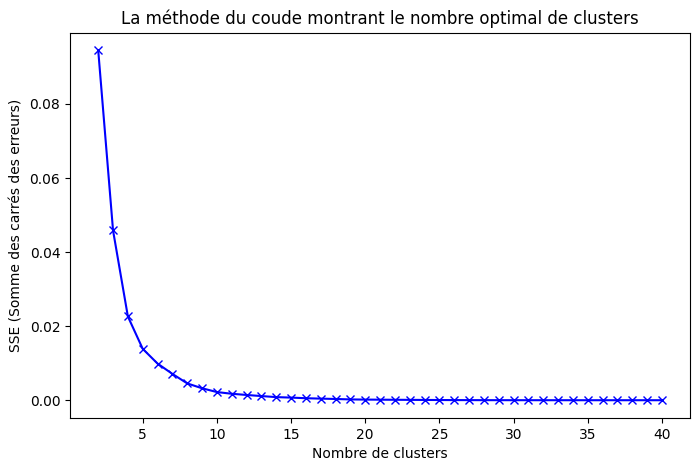

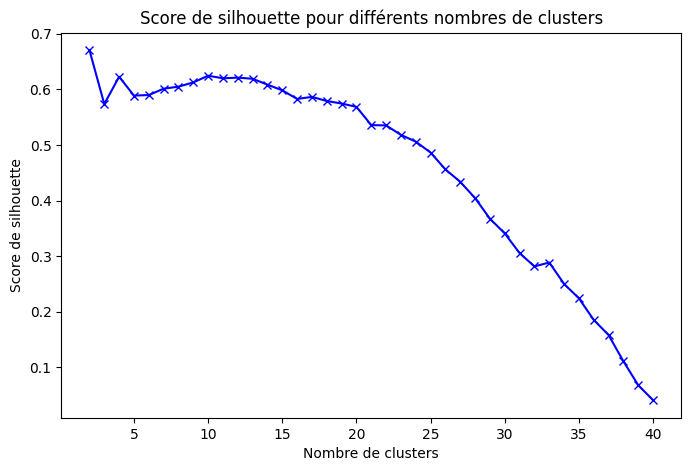

Nombre optimal de clusters selon le score de silhouette : 2.

Le nombre de clusters k pour lequel le score de silhouette est le plus proche de 0.5 est : 24.


In [ ]:
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

X = [X_stds_1d[i] for i in range(df.shape[1]) if not np.isnan(X_stds_1d[i])]

# Convertir la liste en un tableau NumPy en 1D pour un traitement plus rapide
X = np.array(X).reshape(-1, 1)

# Recherche du nombre optimal de clusters avec la méthode du coude et le score de silhouette
sse = {}  # Pour stocker la somme des carrés des erreurs
silhouette_scores = {}
for k in range(2, min(df.shape[1], 50)):  # Testez un nombre de clusters de 2 au minimum entre la dimension et 50
    kmeans = KMeans(n_clusters=k, random_state=42).fit(X)
    sse[k] = kmeans.inertia_  # Somme des carrés des erreurs pour ce nombre de clusters
    silhouette_scores[k] = silhouette_score(X, kmeans.labels_)

# Tracer la courbe du coude
plt.figure(figsize=(8, 5))
plt.plot(list(sse.keys()), list(sse.values()), 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel('SSE (Somme des carrés des erreurs)')
plt.title('La méthode du coude montrant le nombre optimal de clusters')
plt.show()

# Tracer la courbe de silhouette
plt.figure(figsize=(8, 5))
plt.plot(list(silhouette_scores.keys()), list(silhouette_scores.values()), 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel('Score de silhouette')
plt.title('Score de silhouette pour différents nombres de clusters')
plt.show()

# Déterminer le nombre optimal de clusters en utilisant le score de silhouette
optimal_k = max(silhouette_scores, key=silhouette_scores.get)
print(f'Nombre optimal de clusters selon le score de silhouette : {optimal_k}.\n')

# Calculer la différence absolue avec 0.5 pour chaque score de silhouette
diff_to_half = {k: abs(score - 0.5) for k, score in silhouette_scores.items()}

# Trouver la clé (le nombre de clusters k) pour laquelle la différence est la plus petite
optimal_k_closest_to_half = min(diff_to_half, key=diff_to_half.get)

print(f'Le nombre de clusters k pour lequel le score de silhouette est le plus proche de 0.5 est : {optimal_k_closest_to_half}.')

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will chang

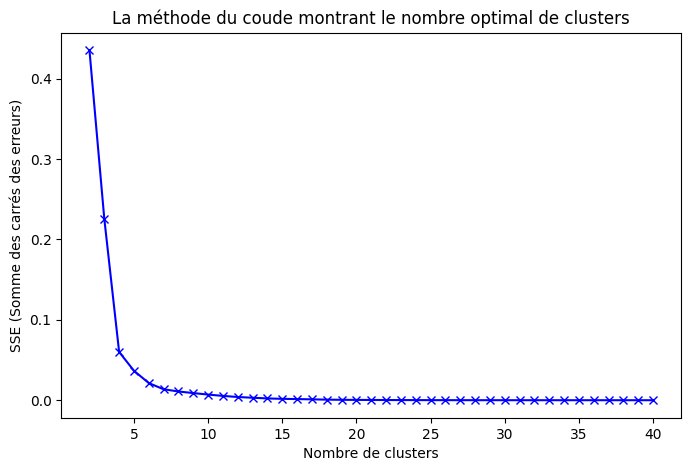

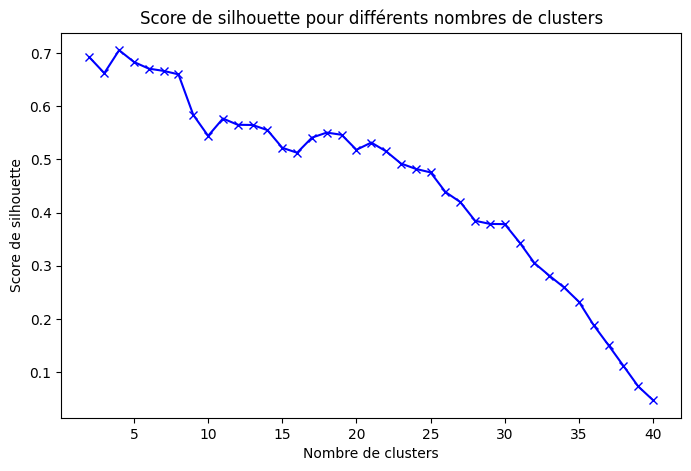

Nombre optimal de clusters selon le score de silhouette : 4.

Le nombre de clusters k pour lequel le score de silhouette est le plus proche de 0.5 est : 23.


In [ ]:
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

X = [X_means_1d[i] for i in range(df.shape[1]) if not np.isnan(X_means_1d[i])]

# Convertir la liste en un tableau NumPy en 1D pour un traitement plus rapide
X = np.array(X).reshape(-1, 1)

# Recherche du nombre optimal de clusters avec la méthode du coude et le score de silhouette
sse = {}  # Pour stocker la somme des carrés des erreurs
silhouette_scores = {}
for k in range(2, min(df.shape[1], 50)):  # Testez un nombre de clusters de 2 au minimum entre la dimension et 50
    kmeans = KMeans(n_clusters=k, random_state=42).fit(X)
    sse[k] = kmeans.inertia_  # Somme des carrés des erreurs pour ce nombre de clusters
    silhouette_scores[k] = silhouette_score(X, kmeans.labels_)

# Tracer la courbe du coude
plt.figure(figsize=(8, 5))
plt.plot(list(sse.keys()), list(sse.values()), 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel('SSE (Somme des carrés des erreurs)')
plt.title('La méthode du coude montrant le nombre optimal de clusters')
plt.show()

# Tracer la courbe de silhouette
plt.figure(figsize=(8, 5))
plt.plot(list(silhouette_scores.keys()), list(silhouette_scores.values()), 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel('Score de silhouette')
plt.title('Score de silhouette pour différents nombres de clusters')
plt.show()

# Déterminer le nombre optimal de clusters en utilisant le score de silhouette
optimal_k = max(silhouette_scores, key=silhouette_scores.get)
print(f'Nombre optimal de clusters selon le score de silhouette : {optimal_k}.\n')

# Calculer la différence absolue avec 0.5 pour chaque score de silhouette
diff_to_half = {k: abs(score - 0.5) for k, score in silhouette_scores.items()}

# Trouver la clé (le nombre de clusters k) pour laquelle la différence est la plus petite
optimal_k_closest_to_half = min(diff_to_half, key=diff_to_half.get)

print(f'Le nombre de clusters k pour lequel le score de silhouette est le plus proche de 0.5 est : {optimal_k_closest_to_half}.')

## S&P 500 :

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler

import plotly.graph_objs as go

df = pd.read_csv('s&p_500.csv', sep=',')

print(df.head())

# Remplacer les valeurs NaN par 0
df.fillna(0, inplace=True)

# Liste des colonnes contenant du texte
text_columns = df.select_dtypes(include=['object']).columns

# Remplacement du texte par des valeurs numériques
for column in text_columns:
    le = LabelEncoder()
    df[column] = le.fit_transform(df[column].astype(str))

# Création d'un objet MinMaxScaler
scaler = MinMaxScaler()

# Normalisation des colonnes du DataFrame
df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

# Affichage du DataFrame modifié
print(df.head())

# Obtenez les statistiques
means = df.mean()  # Calcul des moyennes pour chaque colonne
stds = df.std()  # Calcul des écarts-types pour chaque colonne
mean_correlations = df.corr().mean()  # Calcul des corrélations pour chaque colonne

# Afficher les résultats
print()
print("------------Moyennes------------")
print(means)
print()
print("----------Écarts-types----------")
print(stds)
print()
print("---Moyennes des corrélations---")
print(mean_correlations)

# Fonction pour générer les points sur une sphère
def generate_sphere_points(mean, std, mean_correlation, center=[0, 0, 0]):
    phi = np.random.uniform(0, np.pi)
    theta = np.random.uniform(0, 2 * np.pi)
    x = [mean * np.sin(phi) * np.cos(theta) + center[0],
         std * np.sin(phi) * np.cos(theta) + center[0],
         mean_correlation * np.sin(phi) * np.cos(theta) + center[0]]
    y = [mean * np.sin(phi) * np.sin(theta) + center[1],
         std * np.sin(phi) * np.sin(theta) + center[1],
         mean_correlation * np.sin(phi) * np.sin(theta) + center[1]]
    z = [mean * np.cos(phi) + center[2],
         std * np.cos(phi) + center[2],
         mean_correlation * np.cos(phi) + center[2]]
    return x, y, z

# Préparer les données pour le graphique 3D
X_means_3d = []
Y_means_3d = []
Z_means_3d = []
X_stds_3d = []
Y_stds_3d = []
Z_stds_3d = []
X_mean_correlations_3d = []
Y_mean_correlations_3d = []
Z_mean_correlations_3d = []
X_lines_3d = []
Y_lines_3d = []
Z_lines_3d = []

# Générer les points pour chaque colonne
for i in range(df.shape[1]):
    x, y, z = generate_sphere_points(means[i], stds[i], mean_correlations[i])
    X_means_3d.append(x[0])
    Y_means_3d.append(y[0])
    Z_means_3d.append(z[0])
    X_stds_3d.append(x[1])
    Y_stds_3d.append(y[1])
    Z_stds_3d.append(z[1])
    X_mean_correlations_3d.append(x[2])
    Y_mean_correlations_3d.append(y[2])
    Z_mean_correlations_3d.append(z[2])
    X_lines_3d += [0, x[0], None]
    Y_lines_3d += [0, y[0], None]
    Z_lines_3d += [0, z[0], None]
    X_lines_3d += [0, x[1], None]
    Y_lines_3d += [0, y[1], None]
    Z_lines_3d += [0, z[1], None]
    X_lines_3d += [0, x[2], None]
    Y_lines_3d += [0, y[2], None]
    Z_lines_3d += [0, z[2], None]

# Créer le graphique avec plotly
trace_means_3d = go.Scatter3d(
    x=X_means_3d,
    y=Y_means_3d,
    z=Z_means_3d,
    mode='markers',
    marker=dict(
        size=5,
        color='blue',
    ),
    name='Moyennes'
)

trace_stds_3d = go.Scatter3d(
    x=X_stds_3d,
    y=Y_stds_3d,
    z=Z_stds_3d,
    mode='markers',
    marker=dict(
        size=5,
        color='red',
    ),
    name='Écarts-types'
)

trace_mean_correlations_3d = go.Scatter3d(
    x=X_mean_correlations_3d,
    y=Y_mean_correlations_3d,
    z=Z_mean_correlations_3d,
    mode='markers',
    marker=dict(
        size=5,
        color='green',
    ),
    name='Moyennes des corrélations'
)

trace_lines_3d = go.Scatter3d(
    x=X_lines_3d,
    y=Y_lines_3d,
    z=Z_lines_3d,
    mode='lines',
    line=dict(
        color='black',
        width=2
    ),
    name='Lignes'
)

fig_3d = go.Figure(data=[trace_means_3d, trace_stds_3d, trace_mean_correlations_3d, trace_lines_3d])

# Afficher le graphique
fig_3d.show()

# Fonction pour générer les points sur un cercle
def generate_circle_points(mean, std, mean_correlation, center=[0, 0]):
    theta = np.random.uniform(0, 2 * np.pi)
    x = [mean * np.cos(theta) + center[0],
         std * np.cos(theta) + center[0],
         mean_correlation * np.cos(theta) + center[0]]
    y = [mean * np.sin(theta) + center[1],
         std * np.sin(theta) + center[1],
         mean_correlation * np.sin(theta) + center[1]]
    return x, y

# Préparer les données pour le graphique 2D
X_means_2d = []
Y_means_2d = []
X_stds_2d = []
Y_stds_2d = []
X_mean_correlations_2d = []
Y_mean_correlations_2d = []
X_lines_2d = []
Y_lines_2d = []

# Générer les points pour chaque colonne
for i in range(df.shape[1]):
    x, y = generate_circle_points(means[i], stds[i], mean_correlations[i])
    X_means_2d.append(x[0])
    Y_means_2d.append(y[0])
    X_stds_2d.append(x[1])
    Y_stds_2d.append(y[1])
    X_mean_correlations_2d.append(x[2])
    Y_mean_correlations_2d.append(y[2])
    X_lines_2d += [0, x[0], None]
    Y_lines_2d += [0, y[0], None]
    X_lines_2d += [0, x[1], None]
    Y_lines_2d += [0, y[1], None]
    X_lines_2d += [0, x[2], None]
    Y_lines_2d += [0, y[2], None]

# Créer le graphique avec plotly
trace_means_2d = go.Scatter(
    x=X_means_2d,
    y=Y_means_2d,
    mode='markers',
    marker=dict(
        size=10,
        color='blue'
    ),
    name='Moyennes'
)

trace_stds_2d = go.Scatter(
    x=X_stds_2d,
    y=Y_stds_2d,
    mode='markers',
    marker=dict(
        size=10,
        color='red'
    ),
    name='Écarts-types'
)

trace_mean_correlations_2d = go.Scatter(
    x=X_mean_correlations_2d,
    y=Y_mean_correlations_2d,
    mode='markers',
    marker=dict(
        size=10,
        color='green'
    ),
    name='Moyennes des corrélations'
)

trace_lines_2d = go.Scatter(
    x=X_lines_2d,
    y=Y_lines_2d,
    mode='lines',
    line=dict(
        color='black',
        width=1
    ),
    name='Lignes'
)

fig_2d = go.Figure(data=[trace_means_2d, trace_stds_2d, trace_mean_correlations_2d, trace_lines_2d])

# Afficher le graphique
fig_2d.show()

# Fonction pour générer les points sur un cercle
def generate_line_points(mean, std, mean_correlation, center=0):
    x = [mean + center,
         std + center,
         mean_correlation + center]
    return x

# Préparer les données pour le graphique 1D
X_means_1d = []
X_stds_1d = []
X_mean_correlations_1d = []

# Générer les points pour chaque colonne
for i in range(df.shape[1]):
    x = generate_line_points(means[i], stds[i], mean_correlations[i])
    X_means_1d.append(x[0])
    X_stds_1d.append(x[1])
    X_mean_correlations_1d.append(x[2])

# Créer le graphique avec plotly
trace_means_1d = go.Scatter(
    x=X_means_1d,
    y=[0] * df.shape[1],
    mode='markers',
    marker=dict(
        size=10,
        color='blue'
    ),
    name='Moyennes'
)

trace_stds_1d = go.Scatter(
    x=X_stds_1d,
    y=[0] * df.shape[1],
    mode='markers',
    marker=dict(
        size=10,
        color='red'
    ),
    name='Écarts-types'
)

trace_mean_correlations_1d = go.Scatter(
    x=X_mean_correlations_1d,
    y=[0] * df.shape[1],
    mode='markers',
    marker=dict(
        size=10,
        color='green'
    ),
    name='Moyennes des corrélations'
)

fig_1d = go.Figure(data=[trace_means_1d, trace_stds_1d, trace_mean_correlations_1d])

# Afficher le graphique
fig_1d.show()

         date   open   high    low  close    volume Name
0  2013-02-08  15.07  15.12  14.63  14.75   8407500  AAL
1  2013-02-11  14.89  15.01  14.26  14.46   8882000  AAL
2  2013-02-12  14.45  14.51  14.10  14.27   8126000  AAL
3  2013-02-13  14.30  14.94  14.25  14.66  10259500  AAL
4  2013-02-14  14.94  14.96  13.16  13.99  31879900  AAL
       date      open      high       low     close    volume      Name
0  0.000000  0.007373  0.007311  0.007189  0.006428  0.013599  0.001984
1  0.000795  0.007285  0.007258  0.007007  0.006286  0.014367  0.001984
2  0.001590  0.007069  0.007016  0.006928  0.006193  0.013144  0.001984
3  0.002385  0.006996  0.007224  0.007002  0.006384  0.016595  0.001984
4  0.003180  0.007309  0.007234  0.006466  0.006056  0.051566  0.001984

------------Moyennes------------
date      0.504823
open      0.040617
high      0.040511
low       0.040418
close     0.039784
volume    0.006991
Name      0.501801
dtype: float64

----------Écarts-types----------
date      

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will chang

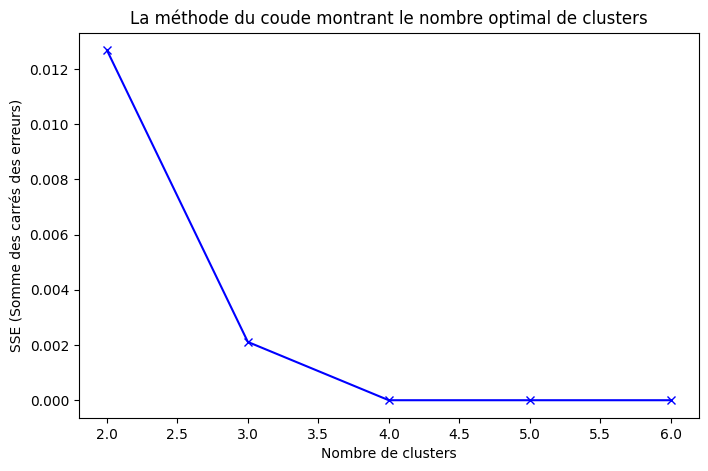

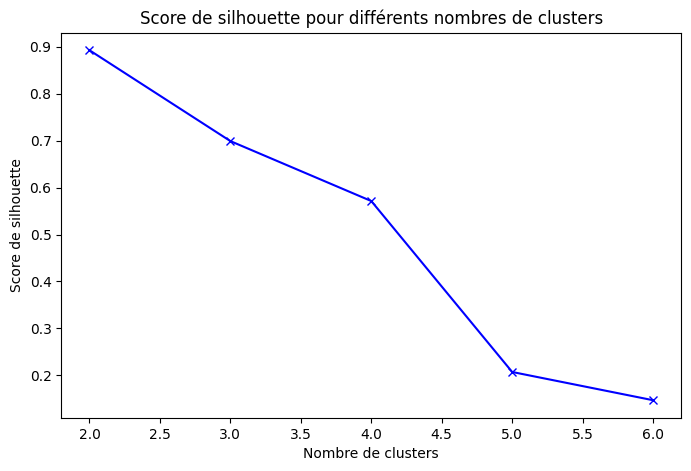

Nombre optimal de clusters selon le score de silhouette : 2.

Le nombre de clusters k pour lequel le score de silhouette est le plus proche de 0.5 est : 4.


In [ ]:
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

X = [X_mean_correlations_1d[i] for i in range(df.shape[1]) if not np.isnan(X_mean_correlations_1d[i])]

# Convertir la liste en un tableau NumPy en 1D pour un traitement plus rapide
X = np.array(X).reshape(-1, 1)

# Recherche du nombre optimal de clusters avec la méthode du coude et le score de silhouette
sse = {}  # Pour stocker la somme des carrés des erreurs
silhouette_scores = {}
for k in range(2, min(df.shape[1], 50)):  # Testez un nombre de clusters de 2 au minimum entre la dimension et 50
    kmeans = KMeans(n_clusters=k, random_state=42).fit(X)
    sse[k] = kmeans.inertia_  # Somme des carrés des erreurs pour ce nombre de clusters
    silhouette_scores[k] = silhouette_score(X, kmeans.labels_)

# Tracer la courbe du coude
plt.figure(figsize=(8, 5))
plt.plot(list(sse.keys()), list(sse.values()), 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel('SSE (Somme des carrés des erreurs)')
plt.title('La méthode du coude montrant le nombre optimal de clusters')
plt.show()

# Tracer la courbe de silhouette
plt.figure(figsize=(8, 5))
plt.plot(list(silhouette_scores.keys()), list(silhouette_scores.values()), 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel('Score de silhouette')
plt.title('Score de silhouette pour différents nombres de clusters')
plt.show()

# Déterminer le nombre optimal de clusters en utilisant le score de silhouette
optimal_k = max(silhouette_scores, key=silhouette_scores.get)
print(f'Nombre optimal de clusters selon le score de silhouette : {optimal_k}.\n')

# Calculer la différence absolue avec 0.5 pour chaque score de silhouette
diff_to_half = {k: abs(score - 0.5) for k, score in silhouette_scores.items()}

# Trouver la clé (le nombre de clusters k) pour laquelle la différence est la plus petite
optimal_k_closest_to_half = min(diff_to_half, key=diff_to_half.get)

print(f'Le nombre de clusters k pour lequel le score de silhouette est le plus proche de 0.5 est : {optimal_k_closest_to_half}.')

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will chang

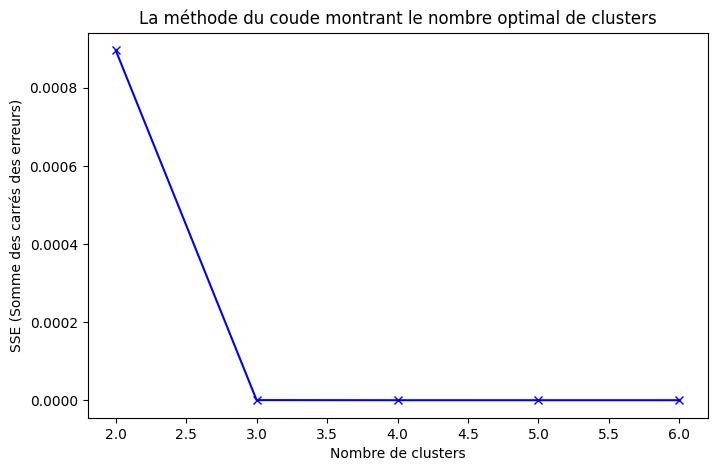

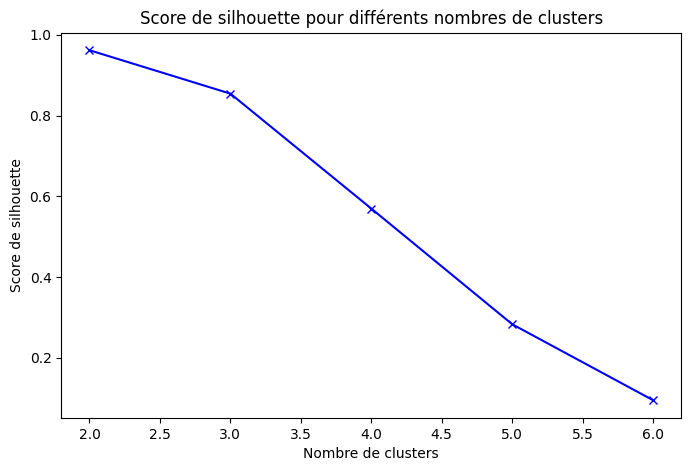

Nombre optimal de clusters selon le score de silhouette : 2.

Le nombre de clusters k pour lequel le score de silhouette est le plus proche de 0.5 est : 4.


In [ ]:
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

X = [X_stds_1d[i] for i in range(df.shape[1]) if not np.isnan(X_stds_1d[i])]

# Convertir la liste en un tableau NumPy en 1D pour un traitement plus rapide
X = np.array(X).reshape(-1, 1)

# Recherche du nombre optimal de clusters avec la méthode du coude et le score de silhouette
sse = {}  # Pour stocker la somme des carrés des erreurs
silhouette_scores = {}
for k in range(2, min(df.shape[1], 50)):  # Testez un nombre de clusters de 2 au minimum entre la dimension et 50
    kmeans = KMeans(n_clusters=k, random_state=42).fit(X)
    sse[k] = kmeans.inertia_  # Somme des carrés des erreurs pour ce nombre de clusters
    silhouette_scores[k] = silhouette_score(X, kmeans.labels_)

# Tracer la courbe du coude
plt.figure(figsize=(8, 5))
plt.plot(list(sse.keys()), list(sse.values()), 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel('SSE (Somme des carrés des erreurs)')
plt.title('La méthode du coude montrant le nombre optimal de clusters')
plt.show()

# Tracer la courbe de silhouette
plt.figure(figsize=(8, 5))
plt.plot(list(silhouette_scores.keys()), list(silhouette_scores.values()), 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel('Score de silhouette')
plt.title('Score de silhouette pour différents nombres de clusters')
plt.show()

# Déterminer le nombre optimal de clusters en utilisant le score de silhouette
optimal_k = max(silhouette_scores, key=silhouette_scores.get)
print(f'Nombre optimal de clusters selon le score de silhouette : {optimal_k}.\n')

# Calculer la différence absolue avec 0.5 pour chaque score de silhouette
diff_to_half = {k: abs(score - 0.5) for k, score in silhouette_scores.items()}

# Trouver la clé (le nombre de clusters k) pour laquelle la différence est la plus petite
optimal_k_closest_to_half = min(diff_to_half, key=diff_to_half.get)

print(f'Le nombre de clusters k pour lequel le score de silhouette est le plus proche de 0.5 est : {optimal_k_closest_to_half}.')

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will chang

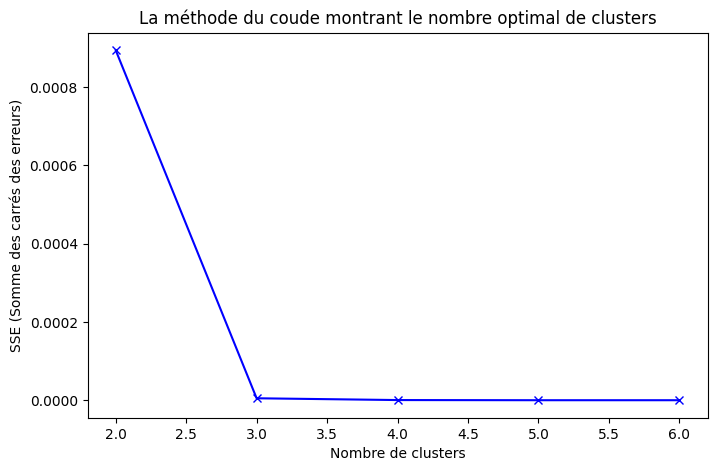

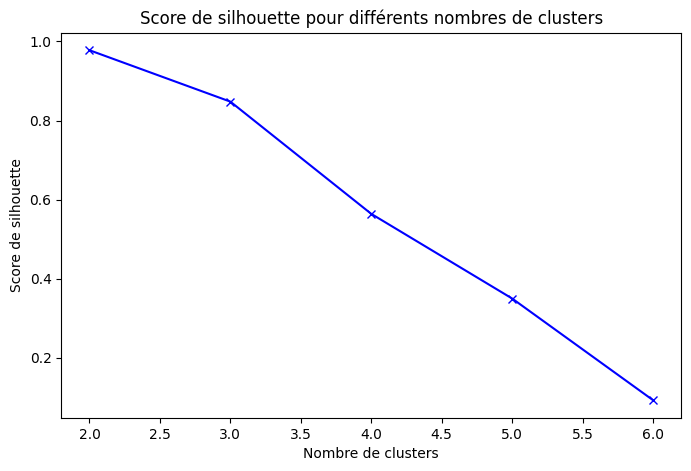

Nombre optimal de clusters selon le score de silhouette : 2.

Le nombre de clusters k pour lequel le score de silhouette est le plus proche de 0.5 est : 4.


In [ ]:
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

X = [X_means_1d[i] for i in range(df.shape[1]) if not np.isnan(X_means_1d[i])]

# Convertir la liste en un tableau NumPy en 1D pour un traitement plus rapide
X = np.array(X).reshape(-1, 1)

# Recherche du nombre optimal de clusters avec la méthode du coude et le score de silhouette
sse = {}  # Pour stocker la somme des carrés des erreurs
silhouette_scores = {}
for k in range(2, min(df.shape[1], 50)):  # Testez un nombre de clusters de 2 au minimum entre la dimension et 50
    kmeans = KMeans(n_clusters=k, random_state=42).fit(X)
    sse[k] = kmeans.inertia_  # Somme des carrés des erreurs pour ce nombre de clusters
    silhouette_scores[k] = silhouette_score(X, kmeans.labels_)

# Tracer la courbe du coude
plt.figure(figsize=(8, 5))
plt.plot(list(sse.keys()), list(sse.values()), 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel('SSE (Somme des carrés des erreurs)')
plt.title('La méthode du coude montrant le nombre optimal de clusters')
plt.show()

# Tracer la courbe de silhouette
plt.figure(figsize=(8, 5))
plt.plot(list(silhouette_scores.keys()), list(silhouette_scores.values()), 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel('Score de silhouette')
plt.title('Score de silhouette pour différents nombres de clusters')
plt.show()

# Déterminer le nombre optimal de clusters en utilisant le score de silhouette
optimal_k = max(silhouette_scores, key=silhouette_scores.get)
print(f'Nombre optimal de clusters selon le score de silhouette : {optimal_k}.\n')

# Calculer la différence absolue avec 0.5 pour chaque score de silhouette
diff_to_half = {k: abs(score - 0.5) for k, score in silhouette_scores.items()}

# Trouver la clé (le nombre de clusters k) pour laquelle la différence est la plus petite
optimal_k_closest_to_half = min(diff_to_half, key=diff_to_half.get)

print(f'Le nombre de clusters k pour lequel le score de silhouette est le plus proche de 0.5 est : {optimal_k_closest_to_half}.')

## Customer Churn :

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler

import plotly.graph_objs as go

df = pd.read_csv('customer_churn.csv', sep=',')

print(df.head())

# Remplacer les valeurs NaN par 0
df.fillna(0, inplace=True)

# Liste des colonnes contenant du texte
text_columns = df.select_dtypes(include=['object']).columns

# Remplacement du texte par des valeurs numériques
for column in text_columns:
    le = LabelEncoder()
    df[column] = le.fit_transform(df[column].astype(str))

# Création d'un objet MinMaxScaler
scaler = MinMaxScaler()

# Normalisation des colonnes du DataFrame
df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

# Affichage du DataFrame modifié
print(df.head())

# Obtenez les statistiques
means = df.mean()  # Calcul des moyennes pour chaque colonne
stds = df.std()  # Calcul des écarts-types pour chaque colonne
mean_correlations = df.corr().mean()  # Calcul des corrélations pour chaque colonne

# Afficher les résultats
print()
print("------------Moyennes------------")
print(means)
print()
print("----------Écarts-types----------")
print(stds)
print()
print("---Moyennes des corrélations---")
print(mean_correlations)

# Fonction pour générer les points sur une sphère
def generate_sphere_points(mean, std, mean_correlation, center=[0, 0, 0]):
    phi = np.random.uniform(0, np.pi)
    theta = np.random.uniform(0, 2 * np.pi)
    x = [mean * np.sin(phi) * np.cos(theta) + center[0],
         std * np.sin(phi) * np.cos(theta) + center[0],
         mean_correlation * np.sin(phi) * np.cos(theta) + center[0]]
    y = [mean * np.sin(phi) * np.sin(theta) + center[1],
         std * np.sin(phi) * np.sin(theta) + center[1],
         mean_correlation * np.sin(phi) * np.sin(theta) + center[1]]
    z = [mean * np.cos(phi) + center[2],
         std * np.cos(phi) + center[2],
         mean_correlation * np.cos(phi) + center[2]]
    return x, y, z

# Préparer les données pour le graphique 3D
X_means_3d = []
Y_means_3d = []
Z_means_3d = []
X_stds_3d = []
Y_stds_3d = []
Z_stds_3d = []
X_mean_correlations_3d = []
Y_mean_correlations_3d = []
Z_mean_correlations_3d = []
X_lines_3d = []
Y_lines_3d = []
Z_lines_3d = []

# Générer les points pour chaque colonne
for i in range(df.shape[1]):
    x, y, z = generate_sphere_points(means[i], stds[i], mean_correlations[i])
    X_means_3d.append(x[0])
    Y_means_3d.append(y[0])
    Z_means_3d.append(z[0])
    X_stds_3d.append(x[1])
    Y_stds_3d.append(y[1])
    Z_stds_3d.append(z[1])
    X_mean_correlations_3d.append(x[2])
    Y_mean_correlations_3d.append(y[2])
    Z_mean_correlations_3d.append(z[2])
    X_lines_3d += [0, x[0], None]
    Y_lines_3d += [0, y[0], None]
    Z_lines_3d += [0, z[0], None]
    X_lines_3d += [0, x[1], None]
    Y_lines_3d += [0, y[1], None]
    Z_lines_3d += [0, z[1], None]
    X_lines_3d += [0, x[2], None]
    Y_lines_3d += [0, y[2], None]
    Z_lines_3d += [0, z[2], None]

# Créer le graphique avec plotly
trace_means_3d = go.Scatter3d(
    x=X_means_3d,
    y=Y_means_3d,
    z=Z_means_3d,
    mode='markers',
    marker=dict(
        size=5,
        color='blue',
    ),
    name='Moyennes'
)

trace_stds_3d = go.Scatter3d(
    x=X_stds_3d,
    y=Y_stds_3d,
    z=Z_stds_3d,
    mode='markers',
    marker=dict(
        size=5,
        color='red',
    ),
    name='Écarts-types'
)

trace_mean_correlations_3d = go.Scatter3d(
    x=X_mean_correlations_3d,
    y=Y_mean_correlations_3d,
    z=Z_mean_correlations_3d,
    mode='markers',
    marker=dict(
        size=5,
        color='green',
    ),
    name='Moyennes des corrélations'
)

trace_lines_3d = go.Scatter3d(
    x=X_lines_3d,
    y=Y_lines_3d,
    z=Z_lines_3d,
    mode='lines',
    line=dict(
        color='black',
        width=2
    ),
    name='Lignes'
)

fig_3d = go.Figure(data=[trace_means_3d, trace_stds_3d, trace_mean_correlations_3d, trace_lines_3d])

# Afficher le graphique
fig_3d.show()

# Fonction pour générer les points sur un cercle
def generate_circle_points(mean, std, mean_correlation, center=[0, 0]):
    theta = np.random.uniform(0, 2 * np.pi)
    x = [mean * np.cos(theta) + center[0],
         std * np.cos(theta) + center[0],
         mean_correlation * np.cos(theta) + center[0]]
    y = [mean * np.sin(theta) + center[1],
         std * np.sin(theta) + center[1],
         mean_correlation * np.sin(theta) + center[1]]
    return x, y

# Préparer les données pour le graphique 2D
X_means_2d = []
Y_means_2d = []
X_stds_2d = []
Y_stds_2d = []
X_mean_correlations_2d = []
Y_mean_correlations_2d = []
X_lines_2d = []
Y_lines_2d = []

# Générer les points pour chaque colonne
for i in range(df.shape[1]):
    x, y = generate_circle_points(means[i], stds[i], mean_correlations[i])
    X_means_2d.append(x[0])
    Y_means_2d.append(y[0])
    X_stds_2d.append(x[1])
    Y_stds_2d.append(y[1])
    X_mean_correlations_2d.append(x[2])
    Y_mean_correlations_2d.append(y[2])
    X_lines_2d += [0, x[0], None]
    Y_lines_2d += [0, y[0], None]
    X_lines_2d += [0, x[1], None]
    Y_lines_2d += [0, y[1], None]
    X_lines_2d += [0, x[2], None]
    Y_lines_2d += [0, y[2], None]

# Créer le graphique avec plotly
trace_means_2d = go.Scatter(
    x=X_means_2d,
    y=Y_means_2d,
    mode='markers',
    marker=dict(
        size=10,
        color='blue'
    ),
    name='Moyennes'
)

trace_stds_2d = go.Scatter(
    x=X_stds_2d,
    y=Y_stds_2d,
    mode='markers',
    marker=dict(
        size=10,
        color='red'
    ),
    name='Écarts-types'
)

trace_mean_correlations_2d = go.Scatter(
    x=X_mean_correlations_2d,
    y=Y_mean_correlations_2d,
    mode='markers',
    marker=dict(
        size=10,
        color='green'
    ),
    name='Moyennes des corrélations'
)

trace_lines_2d = go.Scatter(
    x=X_lines_2d,
    y=Y_lines_2d,
    mode='lines',
    line=dict(
        color='black',
        width=1
    ),
    name='Lignes'
)

fig_2d = go.Figure(data=[trace_means_2d, trace_stds_2d, trace_mean_correlations_2d, trace_lines_2d])

# Afficher le graphique
fig_2d.show()

# Fonction pour générer les points sur un cercle
def generate_line_points(mean, std, mean_correlation, center=0):
    x = [mean + center,
         std + center,
         mean_correlation + center]
    return x

# Préparer les données pour le graphique 1D
X_means_1d = []
X_stds_1d = []
X_mean_correlations_1d = []

# Générer les points pour chaque colonne
for i in range(df.shape[1]):
    x = generate_line_points(means[i], stds[i], mean_correlations[i])
    X_means_1d.append(x[0])
    X_stds_1d.append(x[1])
    X_mean_correlations_1d.append(x[2])

# Créer le graphique avec plotly
trace_means_1d = go.Scatter(
    x=X_means_1d,
    y=[0] * df.shape[1],
    mode='markers',
    marker=dict(
        size=10,
        color='blue'
    ),
    name='Moyennes'
)

trace_stds_1d = go.Scatter(
    x=X_stds_1d,
    y=[0] * df.shape[1],
    mode='markers',
    marker=dict(
        size=10,
        color='red'
    ),
    name='Écarts-types'
)

trace_mean_correlations_1d = go.Scatter(
    x=X_mean_correlations_1d,
    y=[0] * df.shape[1],
    mode='markers',
    marker=dict(
        size=10,
        color='green'
    ),
    name='Moyennes des corrélations'
)

fig_1d = go.Figure(data=[trace_means_1d, trace_stds_1d, trace_mean_correlations_1d])

# Afficher le graphique
fig_1d.show()

              Names   Age  Total_Purchase  Account_Manager  Years  Num_Sites  \
0  Cameron Williams  42.0        11066.80                0   7.22        8.0   
1     Kevin Mueller  41.0        11916.22                0   6.50       11.0   
2       Eric Lozano  38.0        12884.75                0   6.67       12.0   
3     Phillip White  42.0         8010.76                0   6.71       10.0   
4    Cynthia Norton  37.0         9191.58                0   5.56        9.0   

          Onboard_date                                           Location  \
0  2013-08-30 07:00:40      10265 Elizabeth Mission Barkerburgh, AK 89518   
1  2013-08-13 00:38:46  6157 Frank Gardens Suite 019 Carloshaven, RI 1...   
2  2016-06-29 06:20:07             1331 Keith Court Alyssahaven, DE 90114   
3  2014-04-22 12:43:12       13120 Daniel Mount Angelabury, WY 30645-4695   
4  2016-01-19 15:31:15                765 Tricia Row Karenshire, MH 71730   

                       Company  Churn  
0               

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will chang

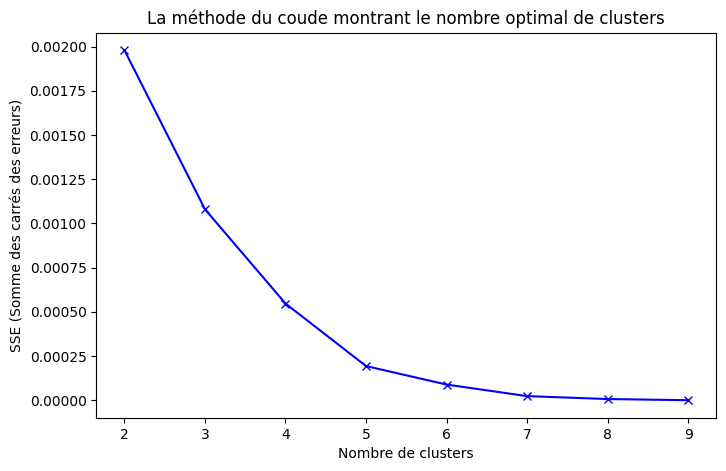

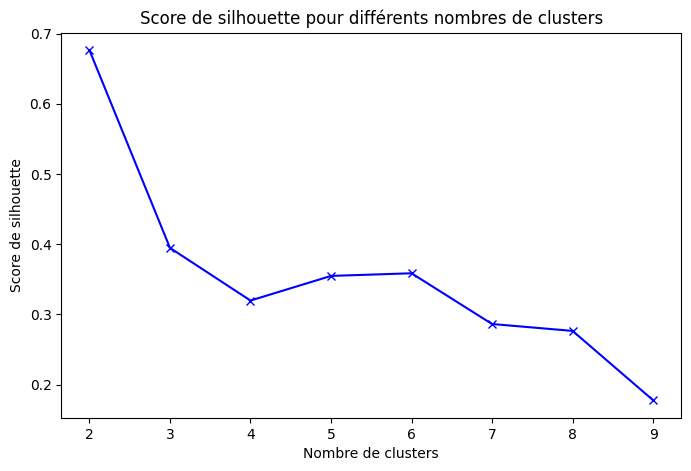

Nombre optimal de clusters selon le score de silhouette : 2.

Le nombre de clusters k pour lequel le score de silhouette est le plus proche de 0.5 est : 3.


In [ ]:
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

X = [X_mean_correlations_1d[i] for i in range(df.shape[1]) if not np.isnan(X_mean_correlations_1d[i])]

# Convertir la liste en un tableau NumPy en 1D pour un traitement plus rapide
X = np.array(X).reshape(-1, 1)

# Recherche du nombre optimal de clusters avec la méthode du coude et le score de silhouette
sse = {}  # Pour stocker la somme des carrés des erreurs
silhouette_scores = {}
for k in range(2, min(df.shape[1], 50)):  # Testez un nombre de clusters de 2 au minimum entre la dimension et 50
    kmeans = KMeans(n_clusters=k, random_state=42).fit(X)
    sse[k] = kmeans.inertia_  # Somme des carrés des erreurs pour ce nombre de clusters
    silhouette_scores[k] = silhouette_score(X, kmeans.labels_)

# Tracer la courbe du coude
plt.figure(figsize=(8, 5))
plt.plot(list(sse.keys()), list(sse.values()), 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel('SSE (Somme des carrés des erreurs)')
plt.title('La méthode du coude montrant le nombre optimal de clusters')
plt.show()

# Tracer la courbe de silhouette
plt.figure(figsize=(8, 5))
plt.plot(list(silhouette_scores.keys()), list(silhouette_scores.values()), 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel('Score de silhouette')
plt.title('Score de silhouette pour différents nombres de clusters')
plt.show()

# Déterminer le nombre optimal de clusters en utilisant le score de silhouette
optimal_k = max(silhouette_scores, key=silhouette_scores.get)
print(f'Nombre optimal de clusters selon le score de silhouette : {optimal_k}.\n')

# Calculer la différence absolue avec 0.5 pour chaque score de silhouette
diff_to_half = {k: abs(score - 0.5) for k, score in silhouette_scores.items()}

# Trouver la clé (le nombre de clusters k) pour laquelle la différence est la plus petite
optimal_k_closest_to_half = min(diff_to_half, key=diff_to_half.get)

print(f'Le nombre de clusters k pour lequel le score de silhouette est le plus proche de 0.5 est : {optimal_k_closest_to_half}.')

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will chang

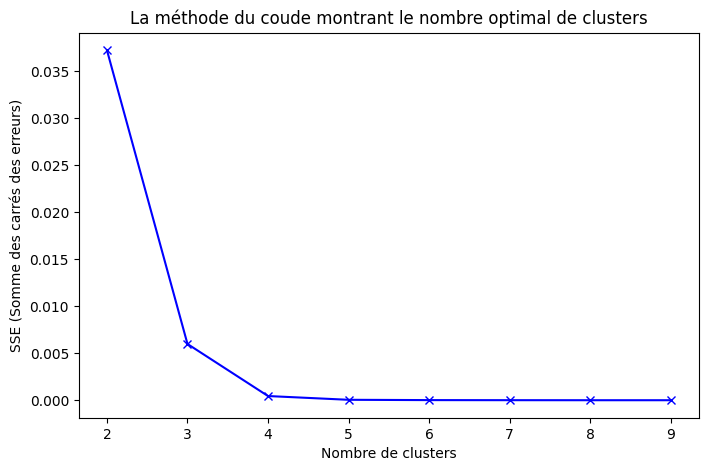

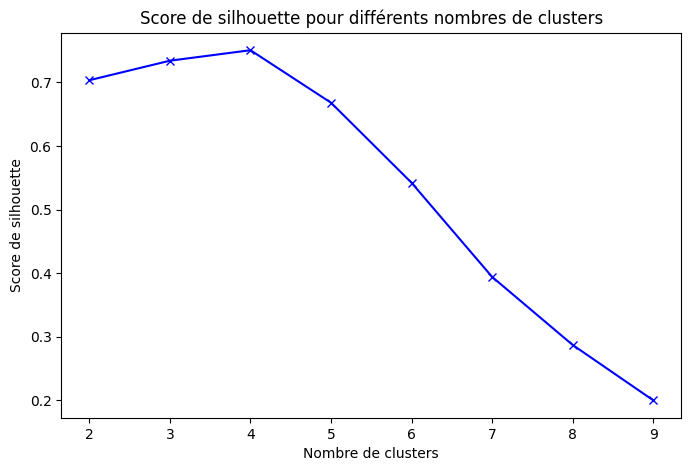

Nombre optimal de clusters selon le score de silhouette : 4.

Le nombre de clusters k pour lequel le score de silhouette est le plus proche de 0.5 est : 6.


In [ ]:
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

X = [X_stds_1d[i] for i in range(df.shape[1]) if not np.isnan(X_stds_1d[i])]

# Convertir la liste en un tableau NumPy en 1D pour un traitement plus rapide
X = np.array(X).reshape(-1, 1)

# Recherche du nombre optimal de clusters avec la méthode du coude et le score de silhouette
sse = {}  # Pour stocker la somme des carrés des erreurs
silhouette_scores = {}
for k in range(2, min(df.shape[1], 50)):  # Testez un nombre de clusters de 2 au minimum entre la dimension et 50
    kmeans = KMeans(n_clusters=k, random_state=42).fit(X)
    sse[k] = kmeans.inertia_  # Somme des carrés des erreurs pour ce nombre de clusters
    silhouette_scores[k] = silhouette_score(X, kmeans.labels_)

# Tracer la courbe du coude
plt.figure(figsize=(8, 5))
plt.plot(list(sse.keys()), list(sse.values()), 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel('SSE (Somme des carrés des erreurs)')
plt.title('La méthode du coude montrant le nombre optimal de clusters')
plt.show()

# Tracer la courbe de silhouette
plt.figure(figsize=(8, 5))
plt.plot(list(silhouette_scores.keys()), list(silhouette_scores.values()), 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel('Score de silhouette')
plt.title('Score de silhouette pour différents nombres de clusters')
plt.show()

# Déterminer le nombre optimal de clusters en utilisant le score de silhouette
optimal_k = max(silhouette_scores, key=silhouette_scores.get)
print(f'Nombre optimal de clusters selon le score de silhouette : {optimal_k}.\n')

# Calculer la différence absolue avec 0.5 pour chaque score de silhouette
diff_to_half = {k: abs(score - 0.5) for k, score in silhouette_scores.items()}

# Trouver la clé (le nombre de clusters k) pour laquelle la différence est la plus petite
optimal_k_closest_to_half = min(diff_to_half, key=diff_to_half.get)

print(f'Le nombre de clusters k pour lequel le score de silhouette est le plus proche de 0.5 est : {optimal_k_closest_to_half}.')

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will chang

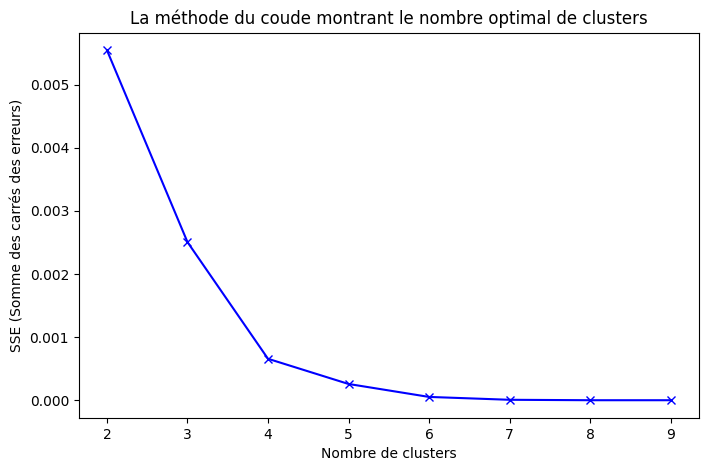

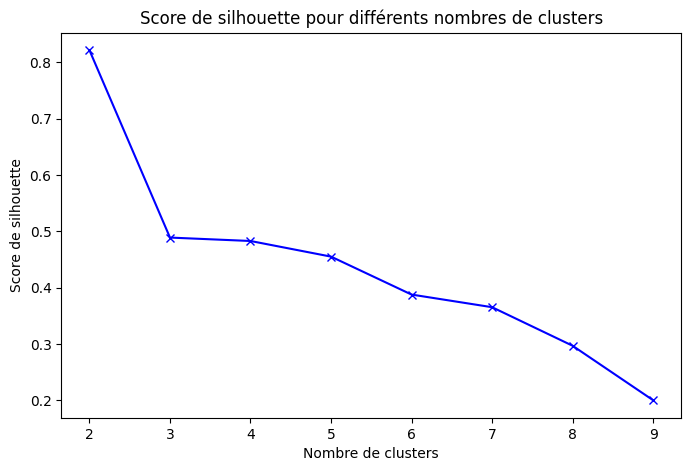

Nombre optimal de clusters selon le score de silhouette : 2.

Le nombre de clusters k pour lequel le score de silhouette est le plus proche de 0.5 est : 3.


In [ ]:
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

X = [X_means_1d[i] for i in range(df.shape[1]) if not np.isnan(X_means_1d[i])]

# Convertir la liste en un tableau NumPy en 1D pour un traitement plus rapide
X = np.array(X).reshape(-1, 1)

# Recherche du nombre optimal de clusters avec la méthode du coude et le score de silhouette
sse = {}  # Pour stocker la somme des carrés des erreurs
silhouette_scores = {}
for k in range(2, min(df.shape[1], 50)):  # Testez un nombre de clusters de 2 au minimum entre la dimension et 50
    kmeans = KMeans(n_clusters=k, random_state=42).fit(X)
    sse[k] = kmeans.inertia_  # Somme des carrés des erreurs pour ce nombre de clusters
    silhouette_scores[k] = silhouette_score(X, kmeans.labels_)

# Tracer la courbe du coude
plt.figure(figsize=(8, 5))
plt.plot(list(sse.keys()), list(sse.values()), 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel('SSE (Somme des carrés des erreurs)')
plt.title('La méthode du coude montrant le nombre optimal de clusters')
plt.show()

# Tracer la courbe de silhouette
plt.figure(figsize=(8, 5))
plt.plot(list(silhouette_scores.keys()), list(silhouette_scores.values()), 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel('Score de silhouette')
plt.title('Score de silhouette pour différents nombres de clusters')
plt.show()

# Déterminer le nombre optimal de clusters en utilisant le score de silhouette
optimal_k = max(silhouette_scores, key=silhouette_scores.get)
print(f'Nombre optimal de clusters selon le score de silhouette : {optimal_k}.\n')

# Calculer la différence absolue avec 0.5 pour chaque score de silhouette
diff_to_half = {k: abs(score - 0.5) for k, score in silhouette_scores.items()}

# Trouver la clé (le nombre de clusters k) pour laquelle la différence est la plus petite
optimal_k_closest_to_half = min(diff_to_half, key=diff_to_half.get)

print(f'Le nombre de clusters k pour lequel le score de silhouette est le plus proche de 0.5 est : {optimal_k_closest_to_half}.')

# **Finite-size scaling avec une corrélation proche de 1 avec k = 30**

## Méthode avec le plus proche voisin (2) : Avec k = 30 | The Intrinsic Dimension of Images and Its Impact on Learning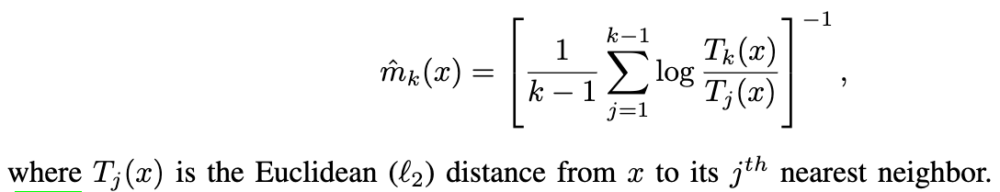

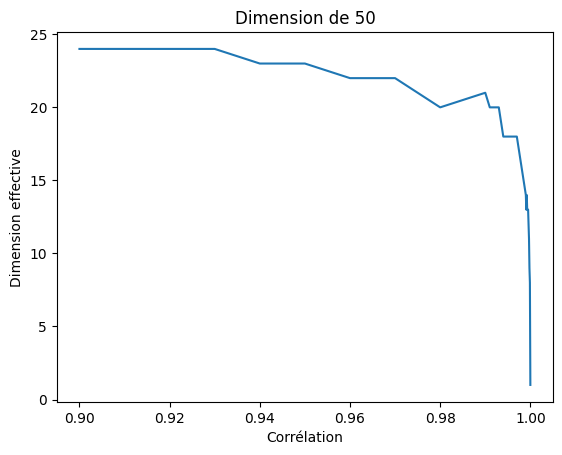

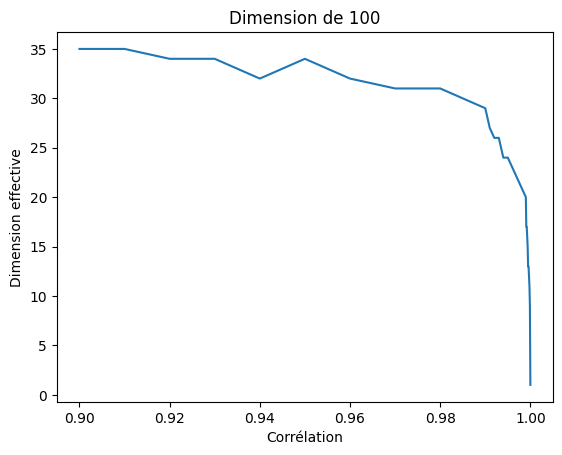

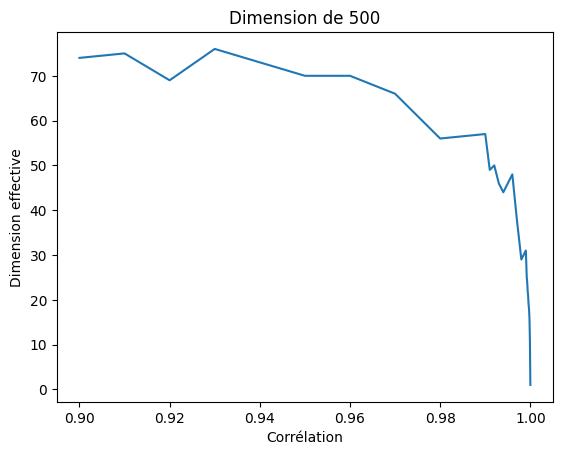

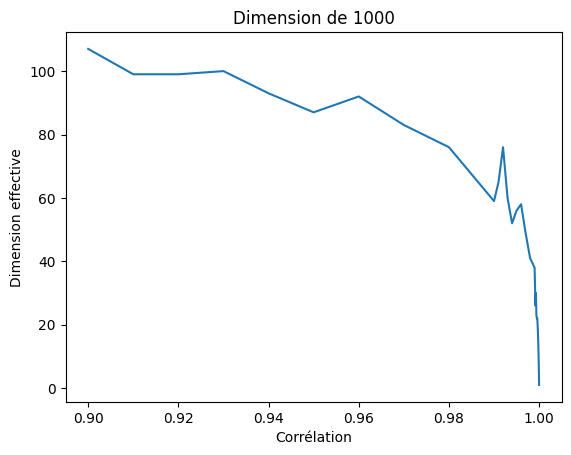

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler

import numpy as np
import matplotlib.pyplot as plt
from numpy.random import multivariate_normal

def create_covariance_matrix(dim, corr):
    if corr < -1 or corr > 1:
        raise ValueError("La corrélation doit être entre -1 et 1.")
    covariance_matrix = np.full((dim, dim), corr)  # La diagonale sera composée de 1 (variance pour une distribution normale standard)
    np.fill_diagonal(covariance_matrix, 1)
    return covariance_matrix

def generate_correlated_variables(n_samples, num_variables, correlation):
    mean = np.zeros(num_variables)  # Moyenne zéro pour une distribution normale standard
    covariance_matrix = create_covariance_matrix(num_variables, correlation)
    samples = np.random.multivariate_normal(mean, covariance_matrix, size=n_samples)  # Génère les échantillons à partir de la distribution normale multivariée
    df = pd.DataFrame(samples, columns=[f'Variable_{i+1}' for i in range(num_variables)])  # Convertit en DataFrame pandas
    return df

from sklearn.neighbors import NearestNeighbors
import random
import numpy as np

def Tj_x(distances, j):
    return distances[j]

# Paramètres pour la plage de corrélation et le nombre de dimensions
correlation_values = np.concatenate((np.linspace(0.9, 0.99, 10), np.linspace(0.991, 0.999, 9), np.linspace(0.9991, 1, 10)))  # 29 valeurs de corrélation de 0,9 à 1
dimension_values = [50, 100, 500, 1000]  # Dimensions de 50 à 1000

# Préparer les données pour le graphique
Z = []  # Liste pour toutes les dimensions effectives

for i, dim in enumerate(dimension_values):
    X = []  # Liste pour les valeurs de corrélation
    Y = []  # Liste pour les dimensions effectives
    for corr in correlation_values:
        X.append(corr)
        # Paramètres
        n_samples = 10000  # Nombre d'échantillons
        num_variables = dim  # Nombre de variables
        correlation = corr  # Corrélation souhaitée

        # Générer les variables corrélées
        df = generate_correlated_variables(n_samples, num_variables, correlation)

        # Remplacer les valeurs NaN par 0
        df.fillna(0, inplace=True)

        # Liste des colonnes contenant du texte
        text_columns = df.select_dtypes(include=['object']).columns

        # Remplacement du texte par des valeurs numériques
        for column in text_columns:
            le = LabelEncoder()
            df[column] = le.fit_transform(df[column].astype(str))

        # Création d'un objet MinMaxScaler
        scaler = MinMaxScaler()

        # Normalisation des colonnes du DataFrame
        df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

        k = 30
        nbrs = NearestNeighbors(n_neighbors=k+1, metric='euclidean').fit(df.values)
        distances, _ = nbrs.kneighbors(df.values)

        somme = 0
        random_indices = random.sample(range(df.shape[0]), 500)
        for i in random_indices:
            mk_x = 0
            for j in range(1, k):
                a = np.log(Tj_x(distances[i], k) / Tj_x(distances[i], j))
                mk_x += a
            mk_x = (1 / (k-1) * mk_x) ** (-1)
            somme += (mk_x ** (-1))

        effective_dimensions = round(((1 / 500) * somme) ** (-1))

        Y.append(effective_dimensions)

    Z.append(Y)

    # Créer le graphique
    plt.plot(X, Y)

    # Ajouter un titre et des étiquettes aux axes
    plt.title(f'Dimension de {dim}')
    plt.xlabel('Corrélation')
    plt.ylabel('Dimension effective')

    # Afficher le graphique
    plt.show()

## Tendance des courbes :

<ipython-input-76-5fe3f9586b26>:7: RuntimeWarning: divide by zero encountered in power
  return (1 - x)**a / dim**b


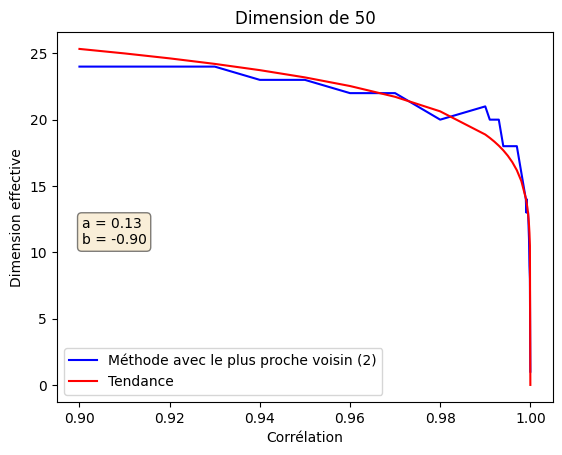

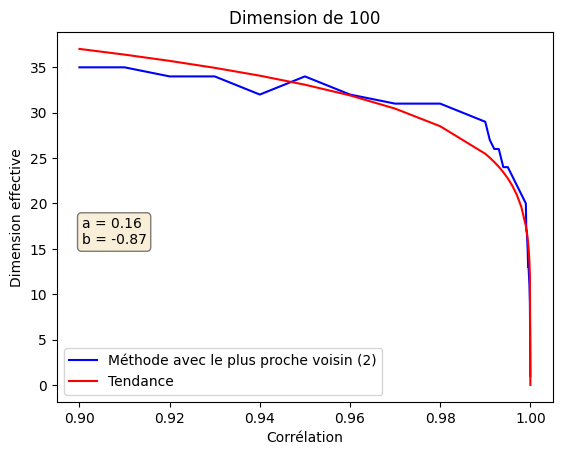

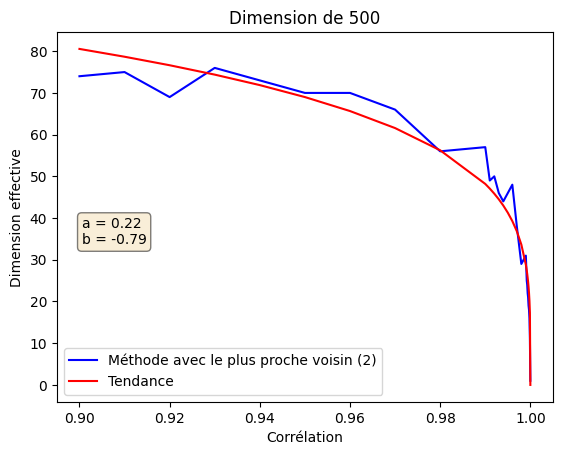

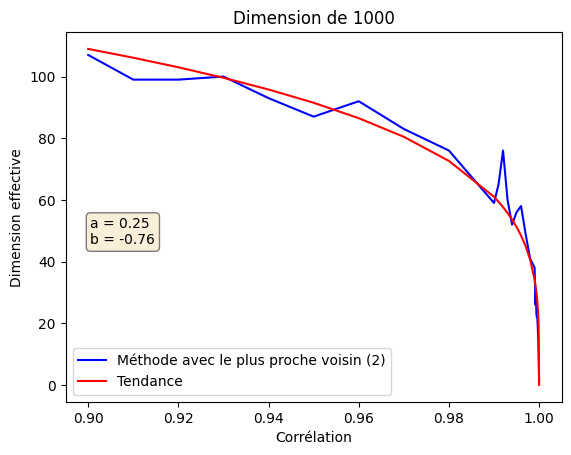

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# Définir la fonction à tracer
def f(x, a, b, dim):
    return (1 - x)**a / dim**b

X = np.array(correlation_values)

# Meilleurs coefficients pour chaque dimension
best_params = []

# Boucle pour ajuster la fonction à vos données pour chaque dimension
for i, dim in enumerate(dimension_values):
    # Trouver les meilleurs coefficients pour cette dimension
    popt, pcov = curve_fit(lambda x, a, b: f(x, a, b, dim), X, Z[i], p0=[0.5, -1])

    # Stocker les meilleurs coefficients
    best_params.append(popt)

    # Utiliser les meilleurs coefficients trouvés pour tracer la courbe ajustée
    Y = f(X, *popt, dim)

    # Tracer la première fonction
    plt.plot(X, Z[i], label='Méthode avec le plus proche voisin (2)', color='blue')

    # Tracer la seconde fonction
    plt.plot(X, Y, label='Tendance', color='red')

    # Ajouter un titre
    plt.title(f'Dimension de {dim}')

    # Ajouter une légende
    plt.legend()

    # Ajouter des étiquettes pour les axes
    plt.xlabel('Corrélation')
    plt.ylabel('Dimension effective')

    # Ajouter les valeurs de a et b sur le graphique
    textstr = f'a = {popt[0]:.2f}\nb = {popt[1]:.2f}'
    plt.text(0.05, 0.50, textstr, transform=plt.gca().transAxes, fontsize=10,
             verticalalignment='top', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))

    # Afficher le graphique
    plt.show()

La meilleure loi de puissance est donnée par y = 0.06 * dim**0.21


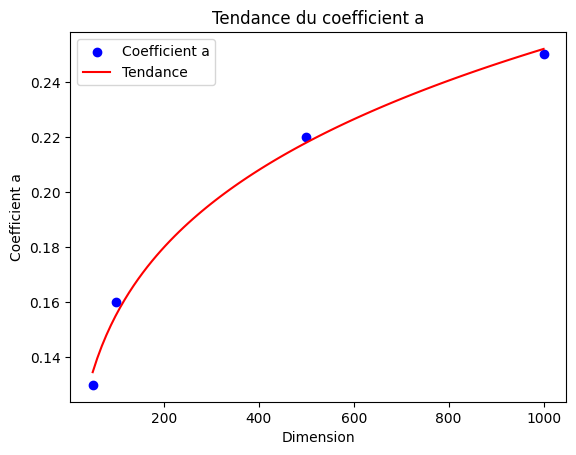

In [ ]:
import numpy as np
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt

# Les points de données
x_data = np.array([50, 100, 500, 1000])
y_data = np.array([0.13, 0.16, 0.22, 0.25])

# Définition de la fonction de la loi de puissance
def power_law(x, a, b):
    return a * x**b

# Effectuer la régression de la loi de puissance
params, covariance = curve_fit(power_law, x_data, y_data)

# Extraire les paramètres a et b
a, b = params

# Afficher les paramètres de la loi de puissance
print(f"La meilleure loi de puissance est donnée par y = {a:.2f} * dim**{b:.2f}")

# Utiliser les paramètres trouvés pour tracer la courbe de tendance
x_fit = np.linspace(min(x_data), max(x_data), 100)
y_fit = power_law(x_fit, a, b)

# Tracer les coefficients a et la courbe de tendance
plt.scatter(x_data, y_data, label='Coefficient a', color='blue')
plt.plot(x_fit, y_fit, label='Tendance', color='red')
plt.legend()
plt.xlabel('Dimension')
plt.ylabel('Coefficient a')
plt.title('Tendance du coefficient a')
plt.show()

La meilleure loi de puissance est donnée par y = -1.13 * dim**-0.06


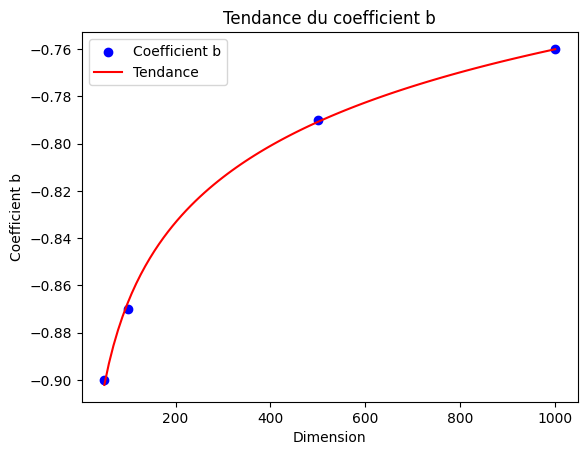

In [ ]:
import numpy as np
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt

# Les points de données
x_data = np.array([50, 100, 500, 1000])
y_data = np.array([-0.90, -0.87, -0.79, -0.76])

# Définition de la fonction de la loi de puissance
def power_law(x, a, b):
    return a * x**b

# Effectuer la régression de la loi de puissance
params, covariance = curve_fit(power_law, x_data, y_data)

# Extraire les paramètres a et b
a, b = params

# Afficher les paramètres de la loi de puissance
print(f"La meilleure loi de puissance est donnée par y = {a:.2f} * dim**{b:.2f}")

# Utiliser les paramètres trouvés pour tracer la courbe de tendance
x_fit = np.linspace(min(x_data), max(x_data), 100)
y_fit = power_law(x_fit, a, b)

# Tracer les coefficients b et la courbe de tendance
plt.scatter(x_data, y_data, label='Coefficient b', color='blue')
plt.plot(x_fit, y_fit, label='Tendance', color='red')
plt.legend()
plt.xlabel('Dimension')
plt.ylabel('Coefficient b')
plt.title('Tendance du coefficient b')
plt.show()

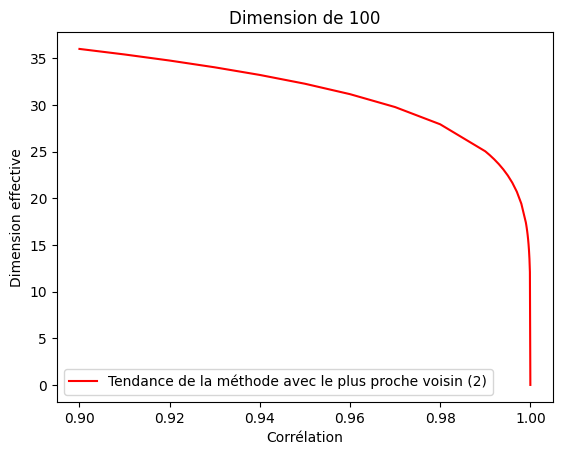

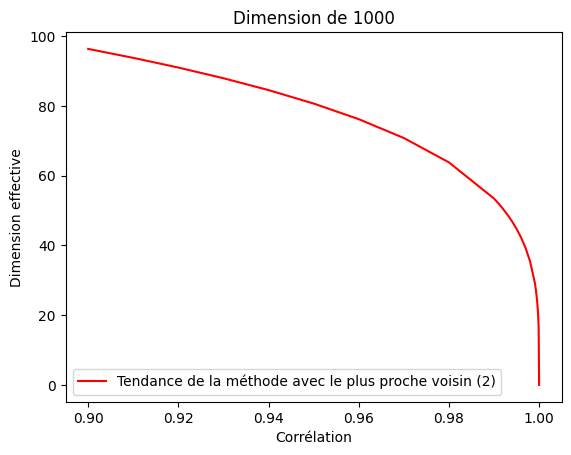

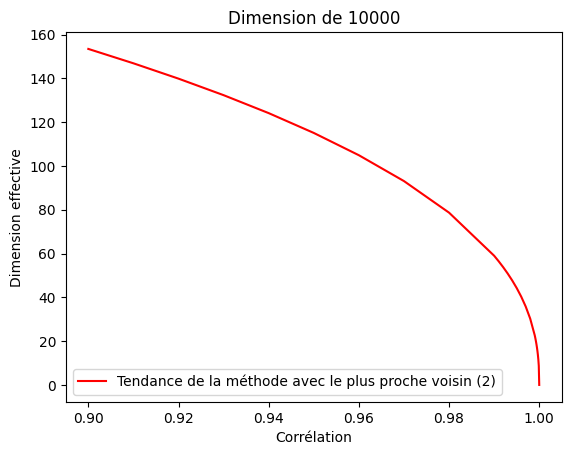

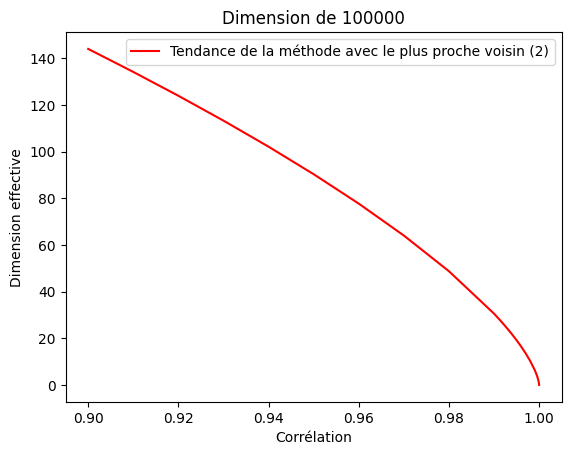

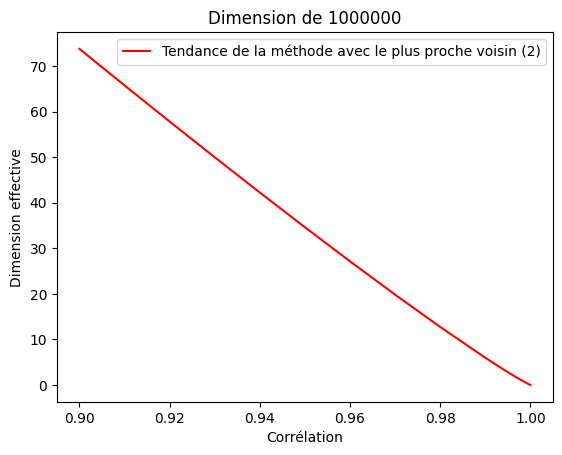

...

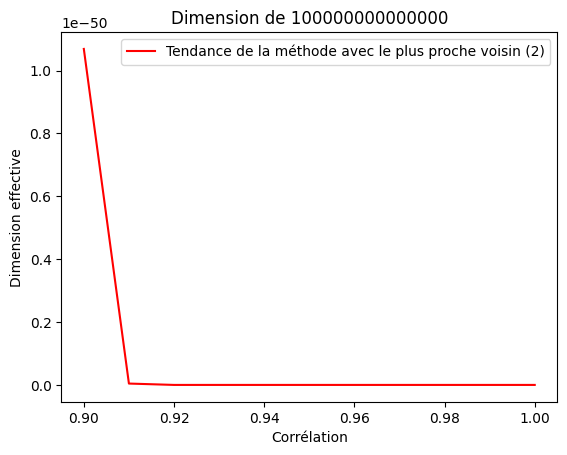

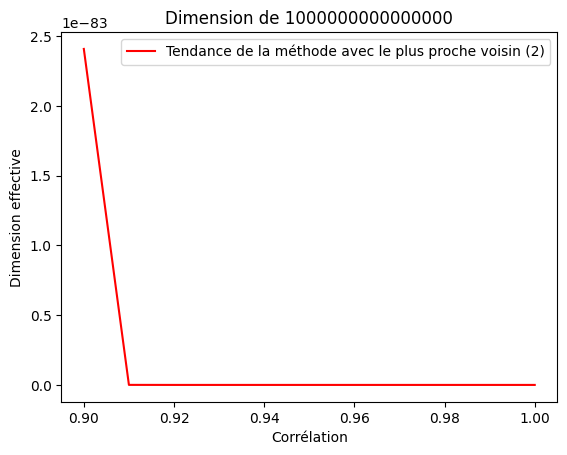

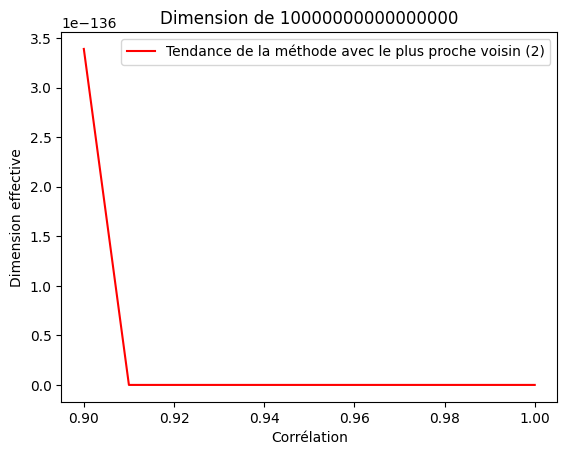

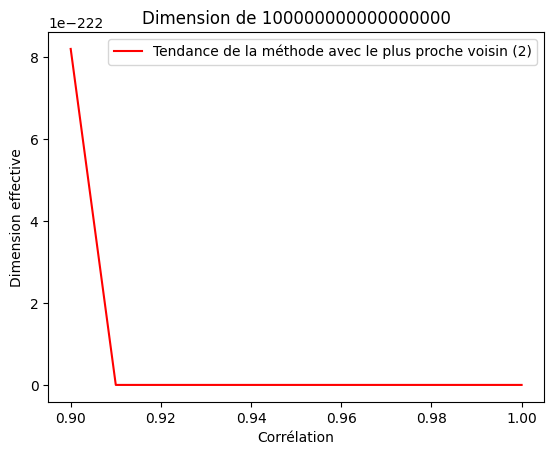

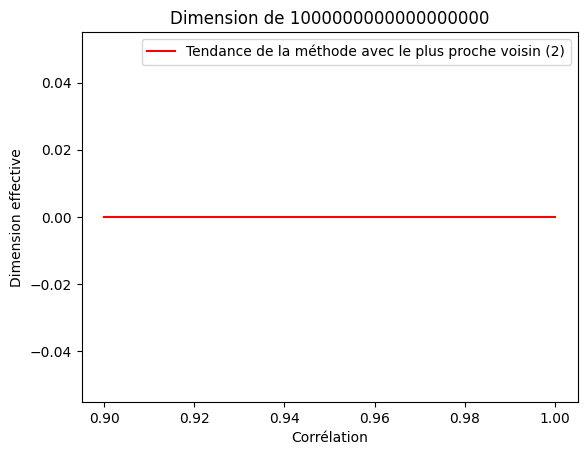

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

import sys

# Calculer les puissances de 10 jusqu'à ce que l'on atteigne ou dépasse sys.maxsize
max_size = sys.maxsize
powers_of_ten = [100]
while powers_of_ten[-1] * 10 <= max_size:
    powers_of_ten.append(powers_of_ten[-1] * 10)

# Définir la fonction à tracer
def f(x, dim):
    a = 0.06 * dim**0.21
    b = -1.13 * dim**-0.06
    return (1 - x)**a / dim**b

X = np.array(correlation_values)

for dim in powers_of_ten:
    # Tracer la fonction
    plt.plot(X, f(X, dim), label='Tendance de la méthode avec le plus proche voisin (2)', color='red')

    # Ajouter un titre
    plt.title(f'Dimension de {dim}')

    # Ajouter une légende
    plt.legend()

    # Ajouter des étiquettes pour les axes
    plt.xlabel('Corrélation')
    plt.ylabel('Dimension effective')

    # Afficher le graphique
    plt.show()

# **Matrice de corrélation**

## Évaluation sur une distribution normale multivariée :

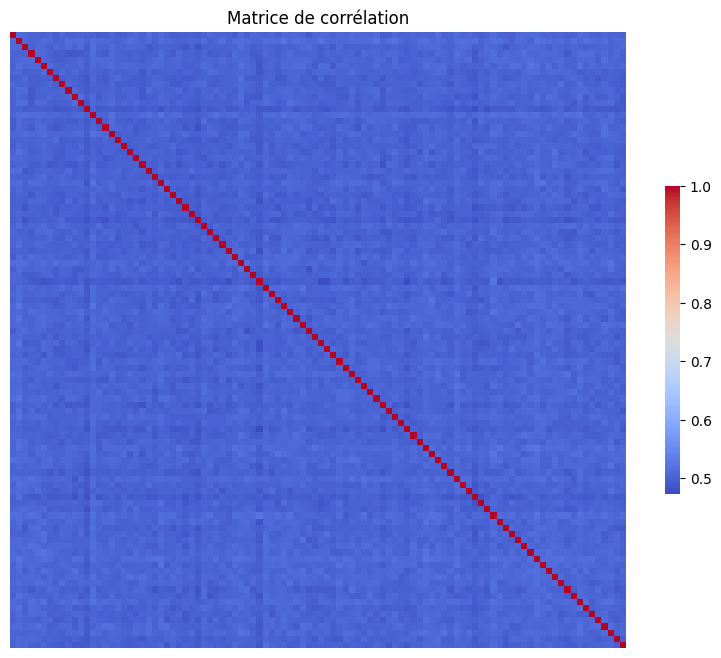

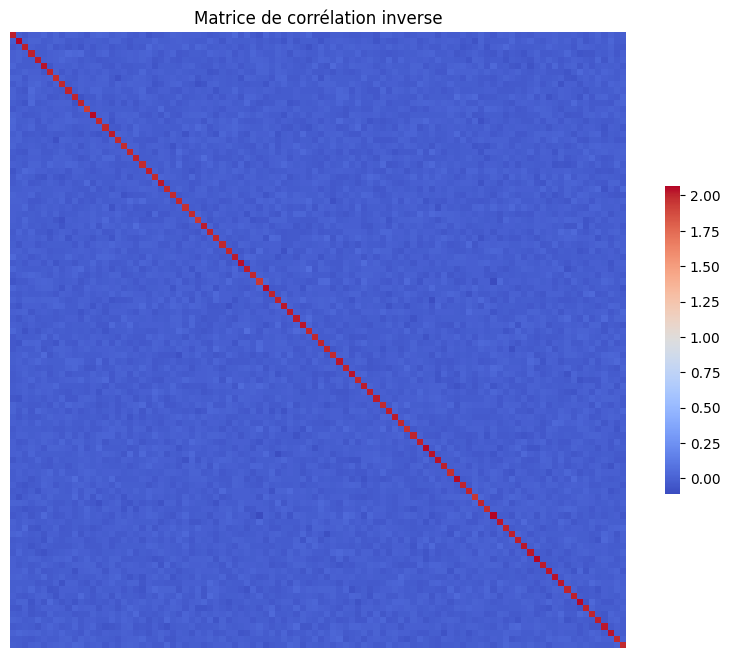

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler

import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objs as go
from numpy.random import multivariate_normal

def create_covariance_matrix(dim, corr):
    if corr < -1 or corr > 1:
        raise ValueError("La corrélation doit être entre -1 et 1.")
    covariance_matrix = np.full((dim, dim), corr)  # La diagonale sera composée de 1 (variance pour une distribution normale standard)
    np.fill_diagonal(covariance_matrix, 1)
    return covariance_matrix

def generate_correlated_variables(n_samples, num_variables, correlation):
    mean = np.zeros(num_variables)  # Moyenne zéro pour une distribution normale standard
    covariance_matrix = create_covariance_matrix(num_variables, correlation)
    samples = np.random.multivariate_normal(mean, covariance_matrix, size=n_samples)  # Génère les échantillons à partir de la distribution normale multivariée
    df = pd.DataFrame(samples, columns=[f'Variable_{i+1}' for i in range(num_variables)])  # Convertit en DataFrame pandas
    return df

# Paramètres
n_samples = 10000  # Nombre d'échantillons
num_variables = 100  # Nombre de variables
correlation = 0.5  # Corrélation souhaitée

# Générer les variables corrélées
df = generate_correlated_variables(n_samples, num_variables, correlation)

# Remplacer les valeurs NaN par 0
df.fillna(0, inplace=True)

# Liste des colonnes contenant du texte
text_columns = df.select_dtypes(include=['object']).columns

# Remplacement du texte par des valeurs numériques
for column in text_columns:
    le = LabelEncoder()
    df[column] = le.fit_transform(df[column].astype(str))

# Création d'un objet MinMaxScaler
scaler = MinMaxScaler()

# Normalisation des colonnes du DataFrame
df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

# Calcul de la matrice de corrélation
correlation_matrix = df.corr()

# Inversion de la matrice de corrélation
correlation_matrix_inverse = np.linalg.inv(correlation_matrix)

# Diagonalisation de la matrice de corrélation
eigenvalues_1, eigenvectors_1 = np.linalg.eig(correlation_matrix)

# Diagonalisation de la matrice de corrélation inverse
eigenvalues_2, eigenvectors_2 = np.linalg.eig(correlation_matrix_inverse)

# Création de la heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm', linewidths=0, cbar_kws={"shrink": .5}, square=True)

# Ajout du titre
plt.title('Matrice de corrélation')

# Retirer les labels des axes
plt.xticks([])
plt.yticks([])

# Affichage de la heatmap
plt.show()

# Création de la heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix_inverse, annot=False, cmap='coolwarm', linewidths=0, cbar_kws={"shrink": .5}, square=True)

# Ajout du titre
plt.title('Matrice de corrélation inverse')

# Retirer les labels des axes
plt.xticks([])
plt.yticks([])

# Affichage de la heatmap
plt.show()

# Représentation graphique des valeurs propres de la matrice de corrélation
trace_2d = go.Scatter(
    x=list(range(len(eigenvalues_1))),
    y=sorted(eigenvalues_1),
    mode='markers',
    marker=dict(
        size=5,
        color='blue',
    ),
    name='Colonnes'
)

fig_2d = go.Figure(trace_2d)

# Ajout du titre centré au graphique
fig_2d.update_layout(
    title={
        'text': 'Valeurs propres de la matrice de corrélation',
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    }
)

# Afficher le graphique
fig_2d.show()

# Représentation graphique des valeurs propres de la matrice de corrélation inverse
trace_2d = go.Scatter(
    x=list(range(len(eigenvalues_2))),
    y=sorted(eigenvalues_2),
    mode='markers',
    marker=dict(
        size=5,
        color='blue',
    ),
    name='Colonnes'
)

fig_2d = go.Figure(trace_2d)

# Ajout du titre centré au graphique
fig_2d.update_layout(
    title={
        'text': 'Valeurs propres de la matrice de corrélation inverse',
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    }
)

# Afficher le graphique
fig_2d.show()

## MNIST Train Small :

   6  0  0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  ...  0.581  0.582  0.583  \
0  5  0    0    0    0    0    0    0    0    0  ...      0      0      0   
1  7  0    0    0    0    0    0    0    0    0  ...      0      0      0   
2  9  0    0    0    0    0    0    0    0    0  ...      0      0      0   
3  5  0    0    0    0    0    0    0    0    0  ...      0      0      0   
4  2  0    0    0    0    0    0    0    0    0  ...      0      0      0   

   0.584  0.585  0.586  0.587  0.588  0.589  0.590  
0      0      0      0      0      0      0      0  
1      0      0      0      0      0      0      0  
2      0      0      0      0      0      0      0  
3      0      0      0      0      0      0      0  
4      0      0      0      0      0      0      0  

[5 rows x 785 columns]
          6    0  0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  ...  0.581  0.582  \
0  0.555556  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...    0.0    0.0   
1  0.777778  0.0  0.0  0.0  0.0  0.0 

<ipython-input-2-616a1f384e51>:51: RuntimeWarning:

divide by zero encountered in divide



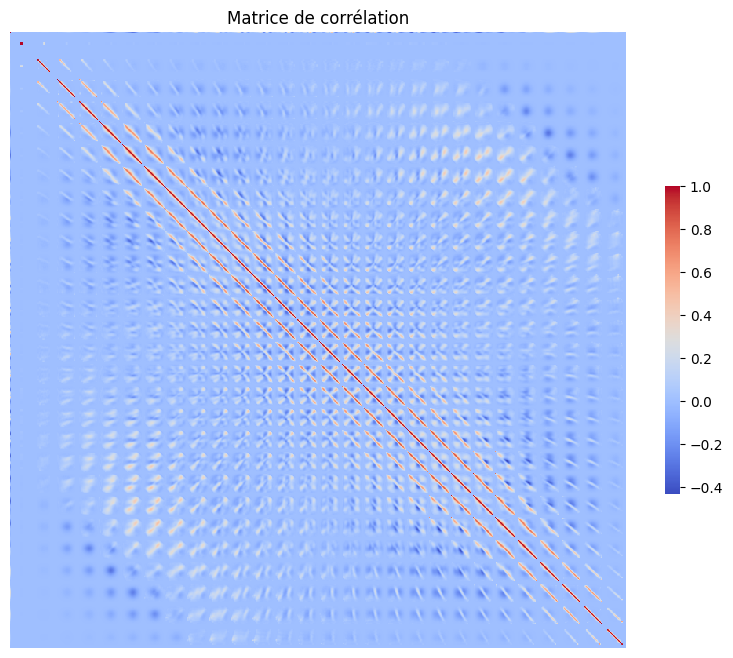

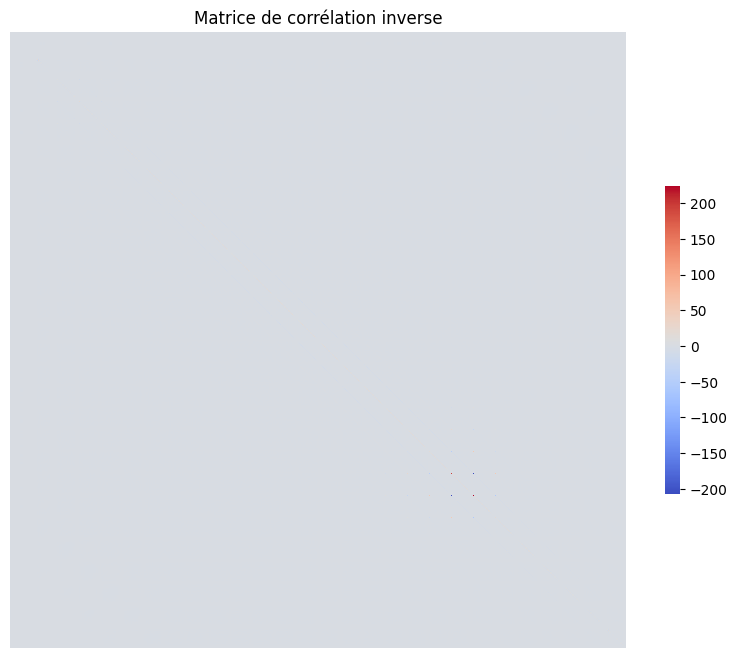

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler

import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objs as go

df = pd.read_csv('mnist_train_small.csv', sep=',')

print(df.head())

# Remplacer les valeurs NaN par 0
df.fillna(0, inplace=True)

# Liste des colonnes contenant du texte
text_columns = df.select_dtypes(include=['object']).columns

# Remplacement du texte par des valeurs numériques
for column in text_columns:
    le = LabelEncoder()
    df[column] = le.fit_transform(df[column].astype(str))

# Création d'un objet MinMaxScaler
scaler = MinMaxScaler()

# Normalisation des colonnes du DataFrame
df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

# Affichage du DataFrame modifié
print(df.head())

# Calcul de la matrice de corrélation
correlation_matrix = df.corr()

# Remplacer les valeurs NaN par 0
correlation_matrix.fillna(0, inplace=True)

# Inversion de la matrice de corrélation
correlation_matrix_inverse = np.linalg.pinv(correlation_matrix)

# Remplacer les valeurs NaN par 0
correlation_matrix.fillna(0, inplace=True)

# Diagonalisation de la matrice de corrélation
eigenvalues_1, eigenvectors_1 = np.linalg.eig(correlation_matrix)

# Diagonalisation de la matrice de corrélation inverse
eigenvalues_2 = 1 / eigenvalues_1

# Création de la heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm', linewidths=0, cbar_kws={"shrink": .5}, square=True)

# Ajout du titre
plt.title('Matrice de corrélation')

# Retirer les labels des axes
plt.xticks([])
plt.yticks([])

# Affichage de la heatmap
plt.show()

# Création de la heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix_inverse, annot=False, cmap='coolwarm', linewidths=0, cbar_kws={"shrink": .5}, square=True)

# Ajout du titre
plt.title('Matrice de corrélation inverse')

# Retirer les labels des axes
plt.xticks([])
plt.yticks([])

# Affichage de la heatmap
plt.show()

# Représentation graphique des valeurs propres de la matrice de corrélation
trace_2d = go.Scatter(
    x=list(range(len(eigenvalues_1))),
    y=sorted(eigenvalues_1),
    mode='markers',
    marker=dict(
        size=5,
        color='blue',
    ),
    name='Colonnes'
)

fig_2d = go.Figure(trace_2d)

# Ajout du titre centré au graphique
fig_2d.update_layout(
    title={
        'text': 'Valeurs propres de la matrice de corrélation',
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    }
)

# Afficher le graphique
fig_2d.show()

# Représentation graphique des valeurs propres de la matrice de corrélation inverse
trace_2d = go.Scatter(
    x=list(range(len(eigenvalues_2))),
    y=sorted(eigenvalues_2),
    mode='markers',
    marker=dict(
        size=5,
        color='blue',
    ),
    name='Colonnes'
)

fig_2d = go.Figure(trace_2d)

# Ajout du titre centré au graphique
fig_2d.update_layout(
    title={
        'text': 'Valeurs propres de la matrice de corrélation inverse',
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    }
)

# Afficher le graphique
fig_2d.show()

## CIFAR-10 Train :

   pixel_0  pixel_1  pixel_2  pixel_3  pixel_4  pixel_5  pixel_6  pixel_7  \
0       59       43       50       68       98      119      139      145   
1      154      126      105      102      125      155      172      180   
2      255      253      253      253      253      253      253      253   
3       28       37       38       42       44       40       40       24   
4      170      168      177      183      181      177      181      184   

   pixel_8  pixel_9  ...  pixel_3063  pixel_3064  pixel_3065  pixel_3066  \
0      149      149  ...          58          65          59          46   
1      142      111  ...          42          67         101         122   
2      253      253  ...          83          80          69          66   
3       32       43  ...          39          59          42          44   
4      189      189  ...          88          85          82          83   

   pixel_3067  pixel_3068  pixel_3069  pixel_3070  pixel_3071  label  
0        

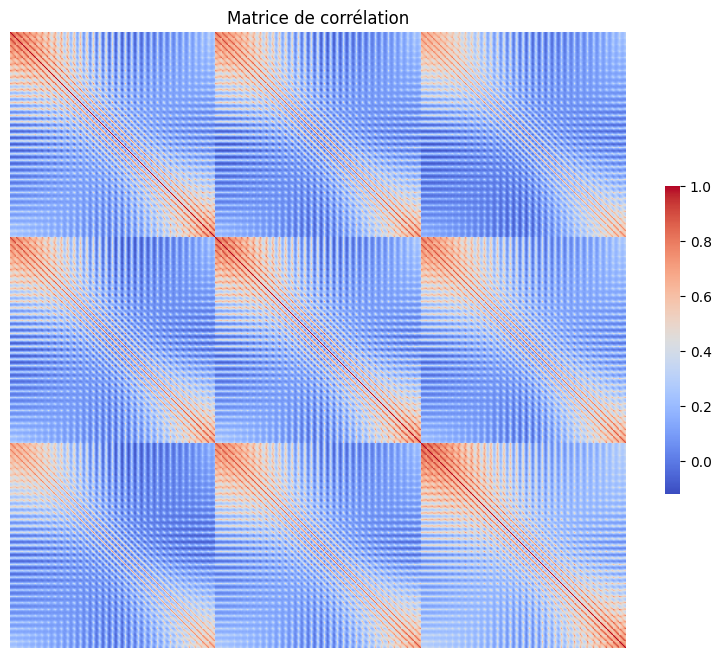

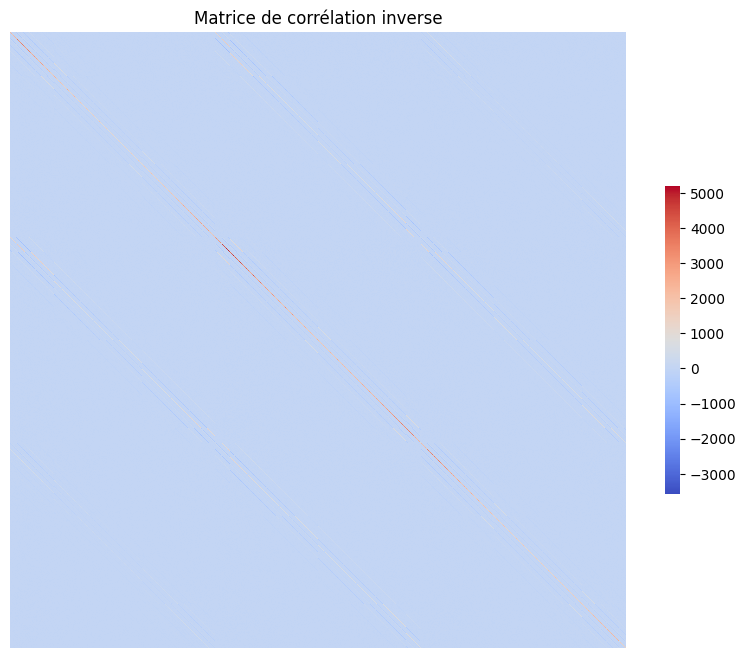

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler

import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objs as go

df = pd.read_csv('cifar10_train.csv', sep=',')

print(df.head())

# Remplacer les valeurs NaN par 0
df.fillna(0, inplace=True)

# Liste des colonnes contenant du texte
text_columns = df.select_dtypes(include=['object']).columns

# Remplacement du texte par des valeurs numériques
for column in text_columns:
    le = LabelEncoder()
    df[column] = le.fit_transform(df[column].astype(str))

# Création d'un objet MinMaxScaler
scaler = MinMaxScaler()

# Normalisation des colonnes du DataFrame
df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

# Affichage du DataFrame modifié
print(df.head())

# Calcul de la matrice de corrélation
correlation_matrix = df.corr()

# Inversion de la matrice de corrélation
correlation_matrix_inverse = np.linalg.inv(correlation_matrix)

# Remplacer les valeurs NaN par 0
correlation_matrix.fillna(0, inplace=True)

# Diagonalisation de la matrice de corrélation
eigenvalues_1, eigenvectors_1 = np.linalg.eig(correlation_matrix)

# Diagonalisation de la matrice de corrélation inverse
eigenvalues_2 = 1 / eigenvalues_1

# Création de la heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm', linewidths=0, cbar_kws={"shrink": .5}, square=True)

# Ajout du titre
plt.title('Matrice de corrélation')

# Retirer les labels des axes
plt.xticks([])
plt.yticks([])

# Affichage de la heatmap
plt.show()

# Création de la heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix_inverse, annot=False, cmap='coolwarm', linewidths=0, cbar_kws={"shrink": .5}, square=True)

# Ajout du titre
plt.title('Matrice de corrélation inverse')

# Retirer les labels des axes
plt.xticks([])
plt.yticks([])

# Affichage de la heatmap
plt.show()

# Représentation graphique des valeurs propres de la matrice de corrélation
trace_2d = go.Scatter(
    x=list(range(len(eigenvalues_1))),
    y=sorted(eigenvalues_1),
    mode='markers',
    marker=dict(
        size=5,
        color='blue',
    ),
    name='Colonnes'
)

fig_2d = go.Figure(trace_2d)

# Ajout du titre centré au graphique
fig_2d.update_layout(
    title={
        'text': 'Valeurs propres de la matrice de corrélation',
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    }
)

# Afficher le graphique
fig_2d.show()

# Représentation graphique des valeurs propres de la matrice de corrélation inverse
trace_2d = go.Scatter(
    x=list(range(len(eigenvalues_2))),
    y=sorted(eigenvalues_2),
    mode='markers',
    marker=dict(
        size=5,
        color='blue',
    ),
    name='Colonnes'
)

fig_2d = go.Figure(trace_2d)

# Ajout du titre centré au graphique
fig_2d.update_layout(
    title={
        'text': 'Valeurs propres de la matrice de corrélation inverse',
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    }
)

# Afficher le graphique
fig_2d.show()

# **Finite-size scaling avec une corrélation proche de 1 avec k = 50**

## Méthode avec le plus proche voisin (2) : Avec k = 50 | The Intrinsic Dimension of Images and Its Impact on Learning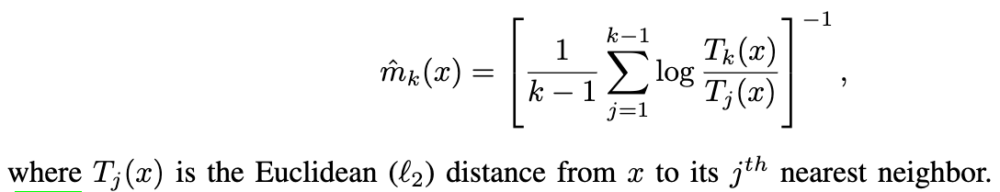

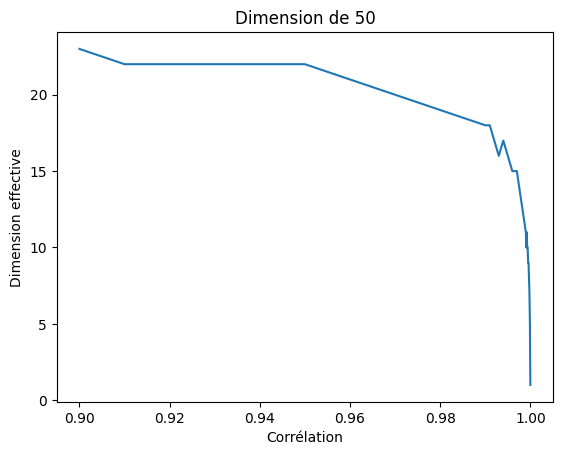

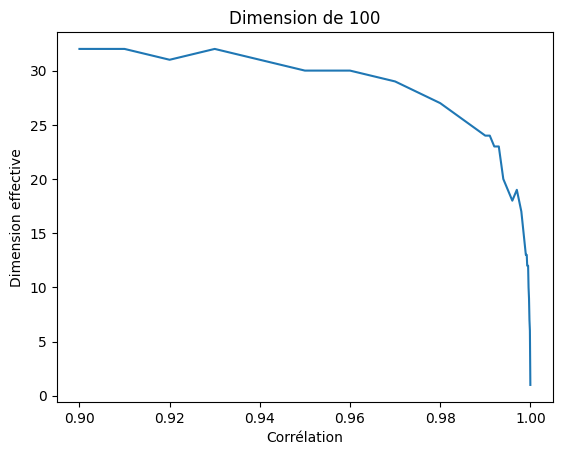

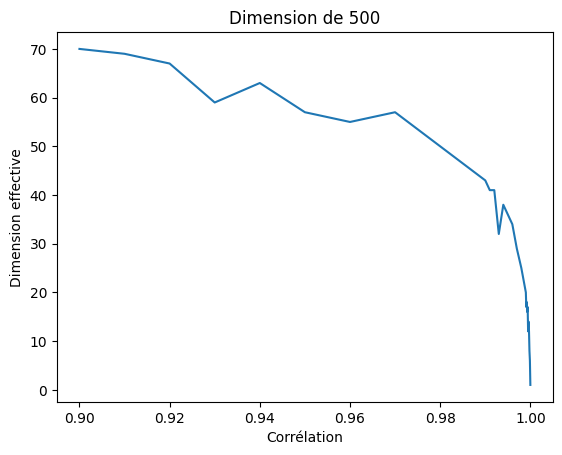

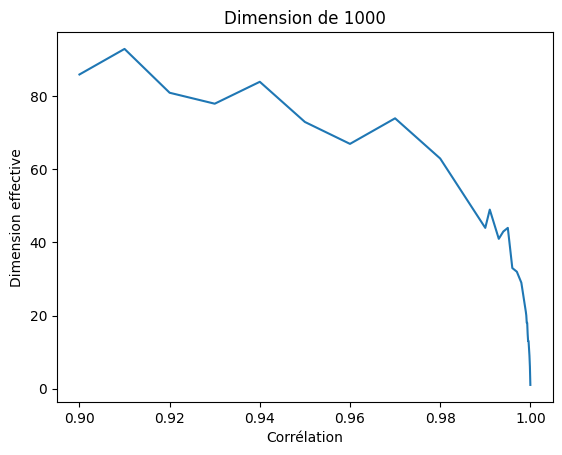

In [1]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler

import numpy as np
import matplotlib.pyplot as plt
from numpy.random import multivariate_normal

def create_covariance_matrix(dim, corr):
    if corr < -1 or corr > 1:
        raise ValueError("La corrélation doit être entre -1 et 1.")
    covariance_matrix = np.full((dim, dim), corr)  # La diagonale sera composée de 1 (variance pour une distribution normale standard)
    np.fill_diagonal(covariance_matrix, 1)
    return covariance_matrix

def generate_correlated_variables(n_samples, num_variables, correlation):
    mean = np.zeros(num_variables)  # Moyenne zéro pour une distribution normale standard
    covariance_matrix = create_covariance_matrix(num_variables, correlation)
    samples = np.random.multivariate_normal(mean, covariance_matrix, size=n_samples)  # Génère les échantillons à partir de la distribution normale multivariée
    df = pd.DataFrame(samples, columns=[f'Variable_{i+1}' for i in range(num_variables)])  # Convertit en DataFrame pandas
    return df

from sklearn.neighbors import NearestNeighbors
import random
import numpy as np

def Tj_x(distances, j):
    return distances[j]

# Paramètres pour la plage de corrélation et le nombre de dimensions
correlation_values = np.concatenate((np.linspace(0.9, 0.99, 10), np.linspace(0.991, 0.999, 9), np.linspace(0.9991, 1, 10)))  # 29 valeurs de corrélation de 0,9 à 1
dimension_values = [50, 100, 500, 1000]  # Dimensions de 50 à 1000

# Préparer les données pour le graphique
Z = []  # Liste pour toutes les dimensions effectives

for i, dim in enumerate(dimension_values):
    X = []  # Liste pour les valeurs de corrélation
    Y = []  # Liste pour les dimensions effectives
    for corr in correlation_values:
        X.append(corr)
        # Paramètres
        n_samples = 10000  # Nombre d'échantillons
        num_variables = dim  # Nombre de variables
        correlation = corr  # Corrélation souhaitée

        # Générer les variables corrélées
        df = generate_correlated_variables(n_samples, num_variables, correlation)

        # Remplacer les valeurs NaN par 0
        df.fillna(0, inplace=True)

        # Liste des colonnes contenant du texte
        text_columns = df.select_dtypes(include=['object']).columns

        # Remplacement du texte par des valeurs numériques
        for column in text_columns:
            le = LabelEncoder()
            df[column] = le.fit_transform(df[column].astype(str))

        # Création d'un objet MinMaxScaler
        scaler = MinMaxScaler()

        # Normalisation des colonnes du DataFrame
        df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

        k = 50
        nbrs = NearestNeighbors(n_neighbors=k+1, metric='euclidean').fit(df.values)
        distances, _ = nbrs.kneighbors(df.values)

        somme = 0
        random_indices = random.sample(range(df.shape[0]), 500)
        for i in random_indices:
            mk_x = 0
            for j in range(1, k):
                a = np.log(Tj_x(distances[i], k) / Tj_x(distances[i], j))
                mk_x += a
            mk_x = (1 / (k-1) * mk_x) ** (-1)
            somme += (mk_x ** (-1))

        effective_dimensions = round(((1 / 500) * somme) ** (-1))

        Y.append(effective_dimensions)

    Z.append(Y)

    # Créer le graphique
    plt.plot(X, Y)

    # Ajouter un titre et des étiquettes aux axes
    plt.title(f'Dimension de {dim}')
    plt.xlabel('Corrélation')
    plt.ylabel('Dimension effective')

    # Afficher le graphique
    plt.show()

## Tendance des courbes :

<ipython-input-2-5fe3f9586b26>:7: RuntimeWarning: divide by zero encountered in power
  return (1 - x)**a / dim**b


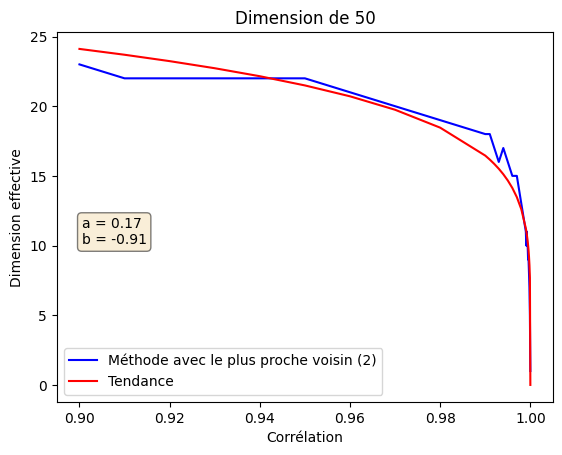

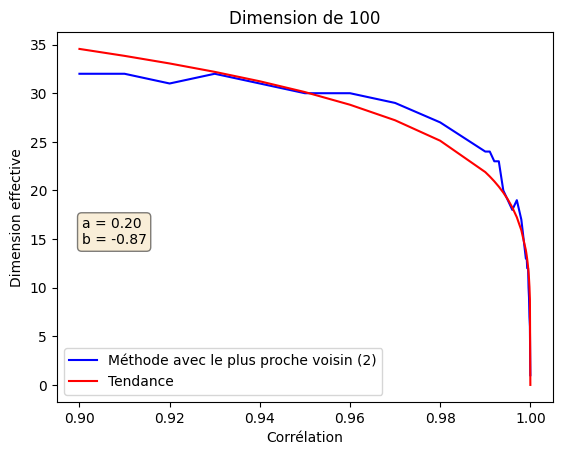

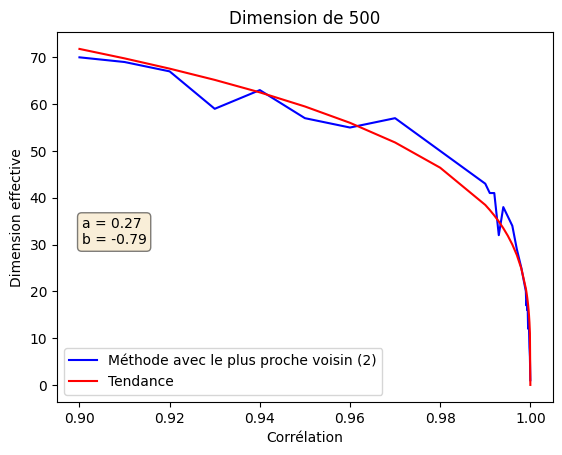

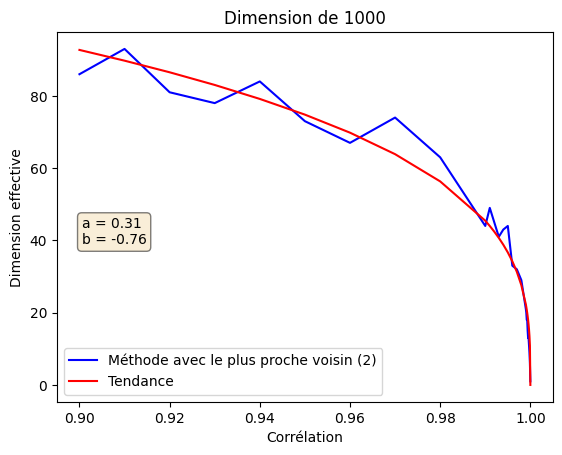

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# Définir la fonction à tracer
def f(x, a, b, dim):
    return (1 - x)**a / dim**b

X = np.array(correlation_values)

# Meilleurs coefficients pour chaque dimension
best_params = []

# Boucle pour ajuster la fonction à vos données pour chaque dimension
for i, dim in enumerate(dimension_values):
    # Trouver les meilleurs coefficients pour cette dimension
    popt, pcov = curve_fit(lambda x, a, b: f(x, a, b, dim), X, Z[i], p0=[0.5, -1])

    # Stocker les meilleurs coefficients
    best_params.append(popt)

    # Utiliser les meilleurs coefficients trouvés pour tracer la courbe ajustée
    Y = f(X, *popt, dim)

    # Tracer la première fonction
    plt.plot(X, Z[i], label='Méthode avec le plus proche voisin (2)', color='blue')

    # Tracer la seconde fonction
    plt.plot(X, Y, label='Tendance', color='red')

    # Ajouter un titre
    plt.title(f'Dimension de {dim}')

    # Ajouter une légende
    plt.legend()

    # Ajouter des étiquettes pour les axes
    plt.xlabel('Corrélation')
    plt.ylabel('Dimension effective')

    # Ajouter les valeurs de a et b sur le graphique
    textstr = f'a = {popt[0]:.2f}\nb = {popt[1]:.2f}'
    plt.text(0.05, 0.50, textstr, transform=plt.gca().transAxes, fontsize=10,
             verticalalignment='top', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))

    # Afficher le graphique
    plt.show()

La meilleure loi de puissance est donnée par y = 0.03 * dim**0.38


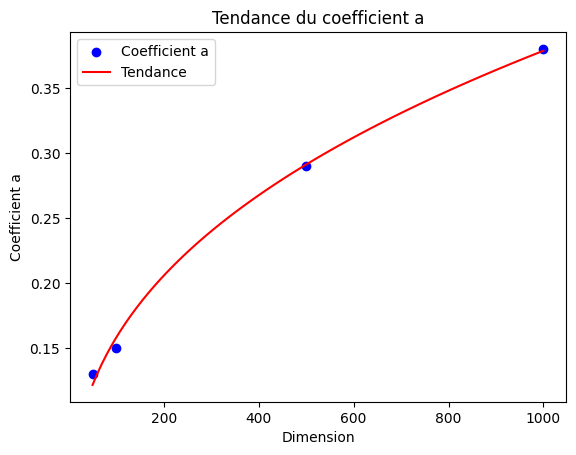

In [3]:
import numpy as np
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt

# Les points de données
x_data = np.array([50, 100, 500, 1000])
y_data = np.array([0.13, 0.15, 0.29, 0.38])

# Définition de la fonction de la loi de puissance
def power_law(x, a, b):
    return a * x**b

# Effectuer la régression de la loi de puissance
params, covariance = curve_fit(power_law, x_data, y_data)

# Extraire les paramètres a et b
a, b = params

# Afficher les paramètres de la loi de puissance
print(f"La meilleure loi de puissance est donnée par y = {a:.2f} * dim**{b:.2f}")

# Utiliser les paramètres trouvés pour tracer la courbe de tendance
x_fit = np.linspace(min(x_data), max(x_data), 100)
y_fit = power_law(x_fit, a, b)

# Tracer les coefficients a et la courbe de tendance
plt.scatter(x_data, y_data, label='Coefficient a', color='blue')
plt.plot(x_fit, y_fit, label='Tendance', color='red')
plt.legend()
plt.xlabel('Dimension')
plt.ylabel('Coefficient a')
plt.title('Tendance du coefficient a')
plt.show()

La meilleure loi de puissance est donnée par y = -1.13 * dim**-0.06


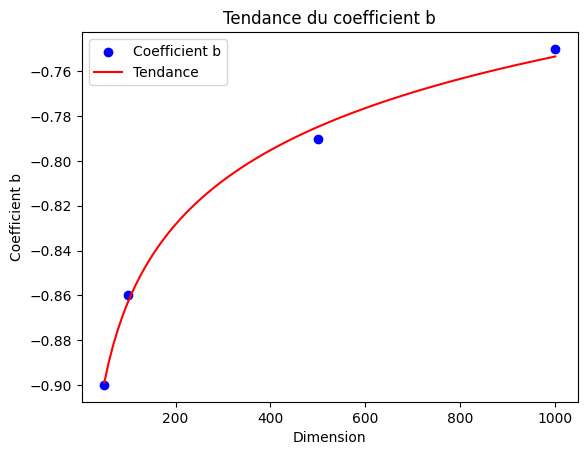

In [4]:
import numpy as np
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt

# Les points de données
x_data = np.array([50, 100, 500, 1000])
y_data = np.array([-0.90, -0.86, -0.79, -0.75])

# Définition de la fonction de la loi de puissance
def power_law(x, a, b):
    return a * x**b

# Effectuer la régression de la loi de puissance
params, covariance = curve_fit(power_law, x_data, y_data)

# Extraire les paramètres a et b
a, b = params

# Afficher les paramètres de la loi de puissance
print(f"La meilleure loi de puissance est donnée par y = {a:.2f} * dim**{b:.2f}")

# Utiliser les paramètres trouvés pour tracer la courbe de tendance
x_fit = np.linspace(min(x_data), max(x_data), 100)
y_fit = power_law(x_fit, a, b)

# Tracer les coefficients b et la courbe de tendance
plt.scatter(x_data, y_data, label='Coefficient b', color='blue')
plt.plot(x_fit, y_fit, label='Tendance', color='red')
plt.legend()
plt.xlabel('Dimension')
plt.ylabel('Coefficient b')
plt.title('Tendance du coefficient b')
plt.show()

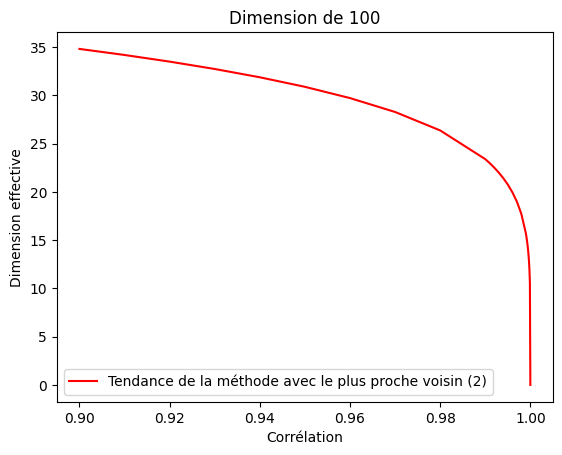

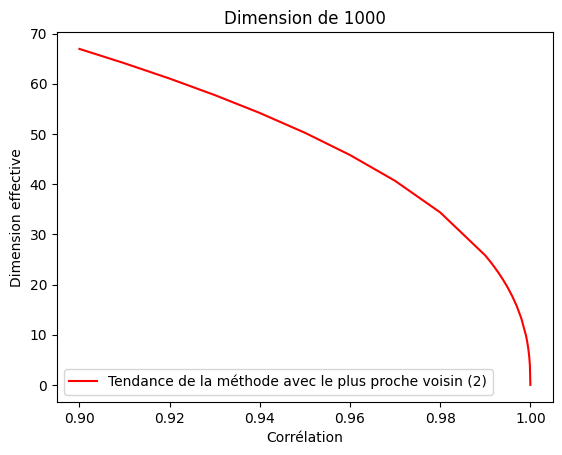

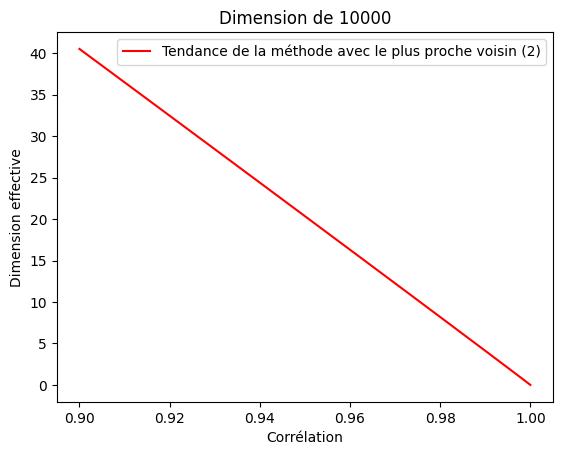

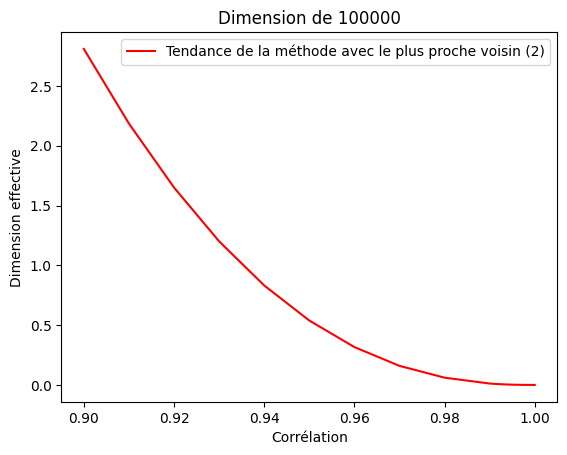

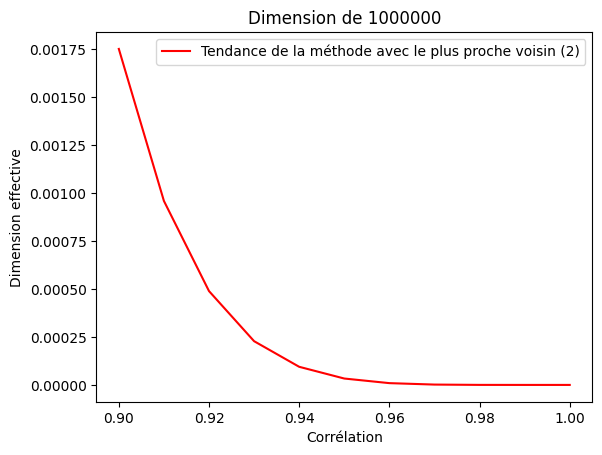

...

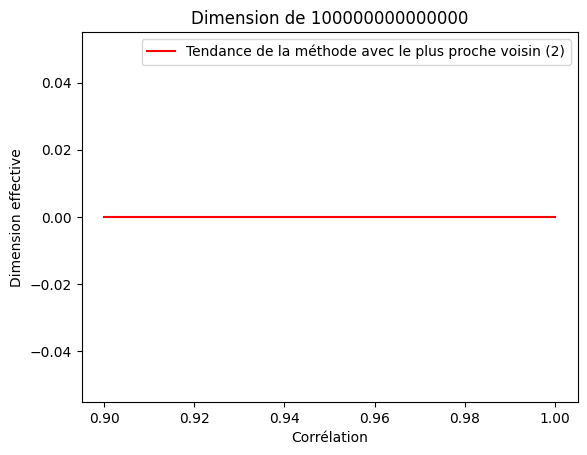

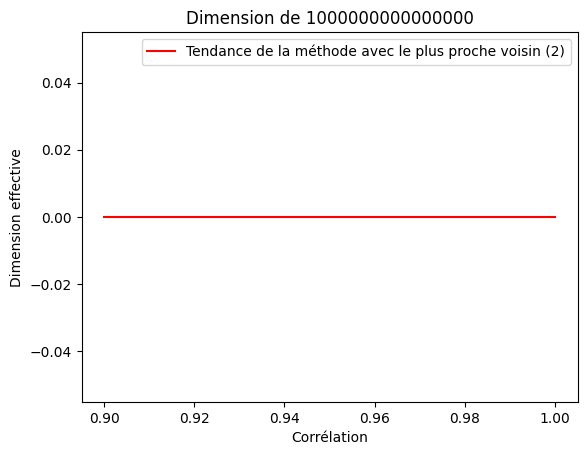

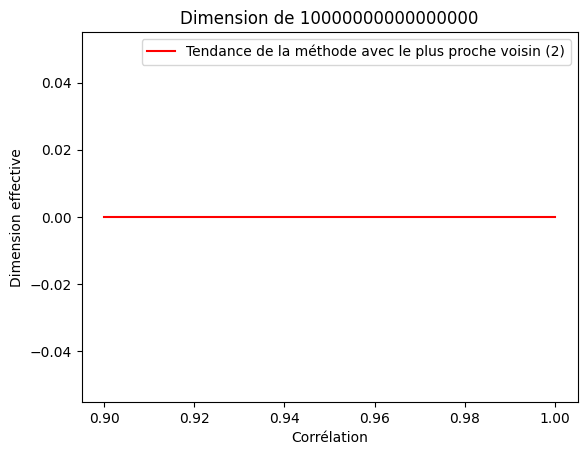

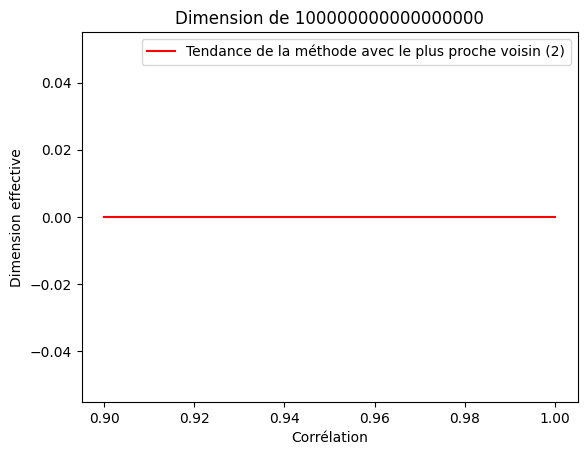

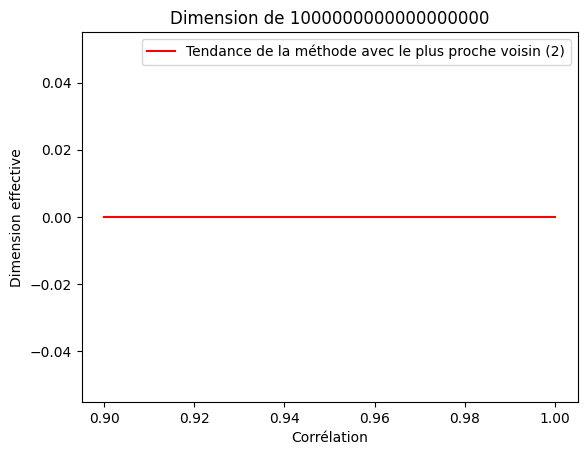

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

import sys

# Calculer les puissances de 10 jusqu'à ce que l'on atteigne ou dépasse sys.maxsize
max_size = sys.maxsize
powers_of_ten = [100]
while powers_of_ten[-1] * 10 <= max_size:
    powers_of_ten.append(powers_of_ten[-1] * 10)

# Définir la fonction à tracer
def f(x, dim):
    a = 0.03 * dim**0.38
    b = -1.13 * dim**-0.06
    return (1 - x)**a / dim**b

X = np.array(correlation_values)

for dim in powers_of_ten:
    # Tracer la fonction
    plt.plot(X, f(X, dim), label='Tendance de la méthode avec le plus proche voisin (2)', color='red')

    # Ajouter un titre
    plt.title(f'Dimension de {dim}')

    # Ajouter une légende
    plt.legend()

    # Ajouter des étiquettes pour les axes
    plt.xlabel('Corrélation')
    plt.ylabel('Dimension effective')

    # Afficher le graphique
    plt.show()

# **Finite-size scaling avec une corrélation proche de 1 avec k = 10**

## Méthode avec le plus proche voisin (2) : Avec k = 10 | The Intrinsic Dimension of Images and Its Impact on Learning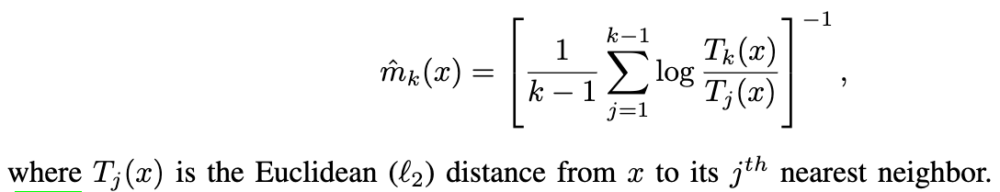

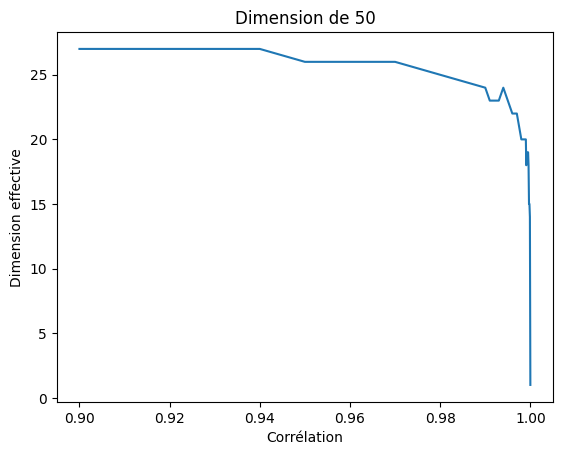

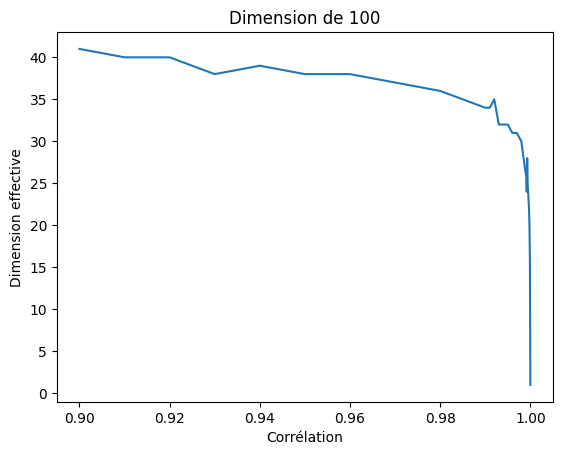

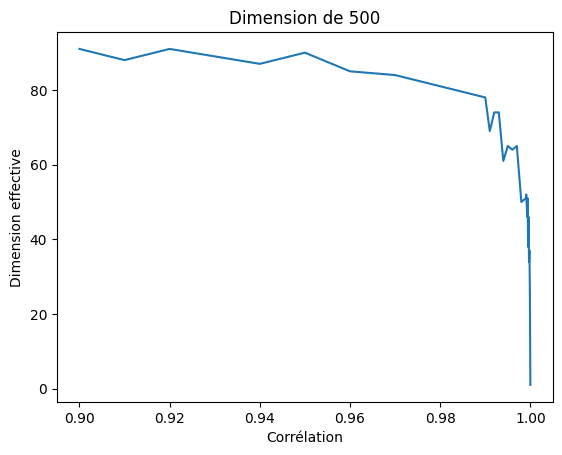

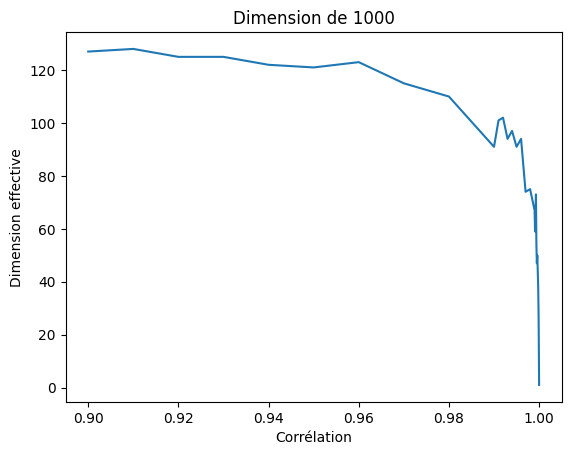

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler

import numpy as np
import matplotlib.pyplot as plt
from numpy.random import multivariate_normal

def create_covariance_matrix(dim, corr):
    if corr < -1 or corr > 1:
        raise ValueError("La corrélation doit être entre -1 et 1.")
    covariance_matrix = np.full((dim, dim), corr)  # La diagonale sera composée de 1 (variance pour une distribution normale standard)
    np.fill_diagonal(covariance_matrix, 1)
    return covariance_matrix

def generate_correlated_variables(n_samples, num_variables, correlation):
    mean = np.zeros(num_variables)  # Moyenne zéro pour une distribution normale standard
    covariance_matrix = create_covariance_matrix(num_variables, correlation)
    samples = np.random.multivariate_normal(mean, covariance_matrix, size=n_samples)  # Génère les échantillons à partir de la distribution normale multivariée
    df = pd.DataFrame(samples, columns=[f'Variable_{i+1}' for i in range(num_variables)])  # Convertit en DataFrame pandas
    return df

from sklearn.neighbors import NearestNeighbors
import random
import numpy as np

def Tj_x(distances, j):
    return distances[j]

# Paramètres pour la plage de corrélation et le nombre de dimensions
correlation_values = np.concatenate((np.linspace(0.9, 0.99, 10), np.linspace(0.991, 0.999, 9), np.linspace(0.9991, 1, 10)))  # 29 valeurs de corrélation de 0,9 à 1
dimension_values = [50, 100, 500, 1000]  # Dimensions de 50 à 1000

# Préparer les données pour le graphique
Z = []  # Liste pour toutes les dimensions effectives

for i, dim in enumerate(dimension_values):
    X = []  # Liste pour les valeurs de corrélation
    Y = []  # Liste pour les dimensions effectives
    for corr in correlation_values:
        X.append(corr)
        # Paramètres
        n_samples = 10000  # Nombre d'échantillons
        num_variables = dim  # Nombre de variables
        correlation = corr  # Corrélation souhaitée

        # Générer les variables corrélées
        df = generate_correlated_variables(n_samples, num_variables, correlation)

        # Remplacer les valeurs NaN par 0
        df.fillna(0, inplace=True)

        # Liste des colonnes contenant du texte
        text_columns = df.select_dtypes(include=['object']).columns

        # Remplacement du texte par des valeurs numériques
        for column in text_columns:
            le = LabelEncoder()
            df[column] = le.fit_transform(df[column].astype(str))

        # Création d'un objet MinMaxScaler
        scaler = MinMaxScaler()

        # Normalisation des colonnes du DataFrame
        df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

        k = 10
        nbrs = NearestNeighbors(n_neighbors=k+1, metric='euclidean').fit(df.values)
        distances, _ = nbrs.kneighbors(df.values)

        somme = 0
        random_indices = random.sample(range(df.shape[0]), 500)
        for i in random_indices:
            mk_x = 0
            for j in range(1, k):
                a = np.log(Tj_x(distances[i], k) / Tj_x(distances[i], j))
                mk_x += a
            mk_x = (1 / (k-1) * mk_x) ** (-1)
            somme += (mk_x ** (-1))

        effective_dimensions = round(((1 / 500) * somme) ** (-1))

        Y.append(effective_dimensions)

    Z.append(Y)

    # Créer le graphique
    plt.plot(X, Y)

    # Ajouter un titre et des étiquettes aux axes
    plt.title(f'Dimension de {dim}')
    plt.xlabel('Corrélation')
    plt.ylabel('Dimension effective')

    # Afficher le graphique
    plt.show()

## Tendance des courbes :

<ipython-input-2-5fe3f9586b26>:7: RuntimeWarning: divide by zero encountered in power
  return (1 - x)**a / dim**b


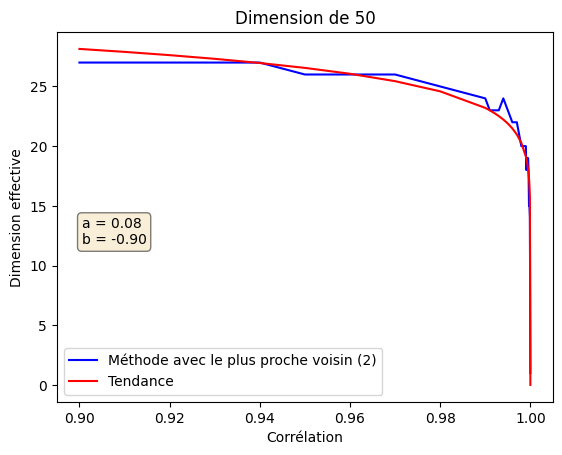

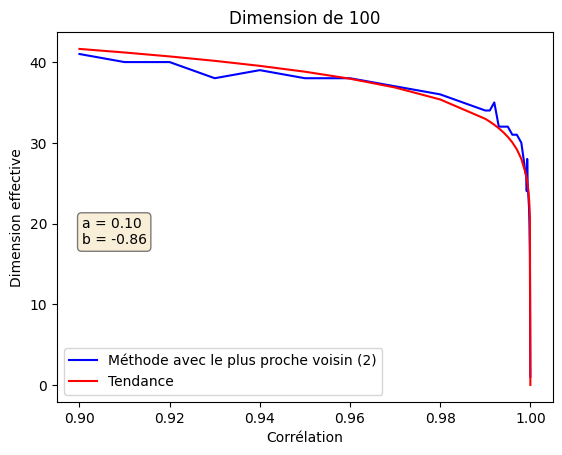

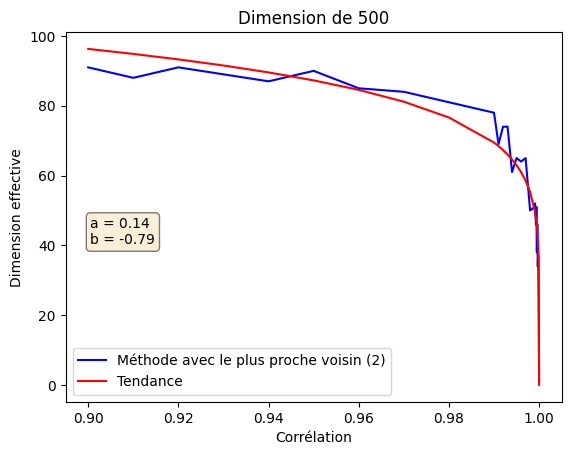

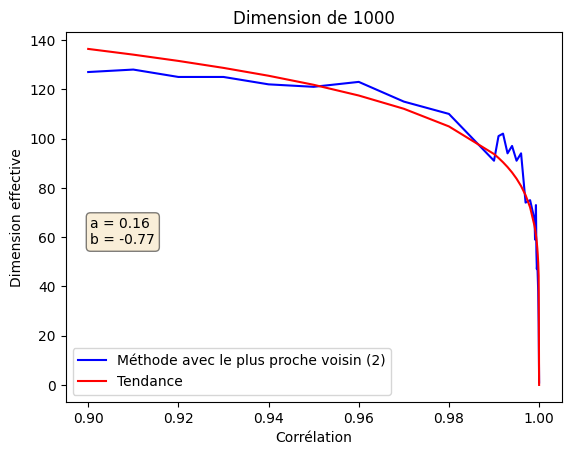

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# Définir la fonction à tracer
def f(x, a, b, dim):
    return (1 - x)**a / dim**b

X = np.array(correlation_values)

# Meilleurs coefficients pour chaque dimension
best_params = []

# Boucle pour ajuster la fonction à vos données pour chaque dimension
for i, dim in enumerate(dimension_values):
    # Trouver les meilleurs coefficients pour cette dimension
    popt, pcov = curve_fit(lambda x, a, b: f(x, a, b, dim), X, Z[i], p0=[0.5, -1])

    # Stocker les meilleurs coefficients
    best_params.append(popt)

    # Utiliser les meilleurs coefficients trouvés pour tracer la courbe ajustée
    Y = f(X, *popt, dim)

    # Tracer la première fonction
    plt.plot(X, Z[i], label='Méthode avec le plus proche voisin (2)', color='blue')

    # Tracer la seconde fonction
    plt.plot(X, Y, label='Tendance', color='red')

    # Ajouter un titre
    plt.title(f'Dimension de {dim}')

    # Ajouter une légende
    plt.legend()

    # Ajouter des étiquettes pour les axes
    plt.xlabel('Corrélation')
    plt.ylabel('Dimension effective')

    # Ajouter les valeurs de a et b sur le graphique
    textstr = f'a = {popt[0]:.2f}\nb = {popt[1]:.2f}'
    plt.text(0.05, 0.50, textstr, transform=plt.gca().transAxes, fontsize=10,
             verticalalignment='top', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))

    # Afficher le graphique
    plt.show()

La meilleure loi de puissance est donnée par y = 0.04 * dim**0.22


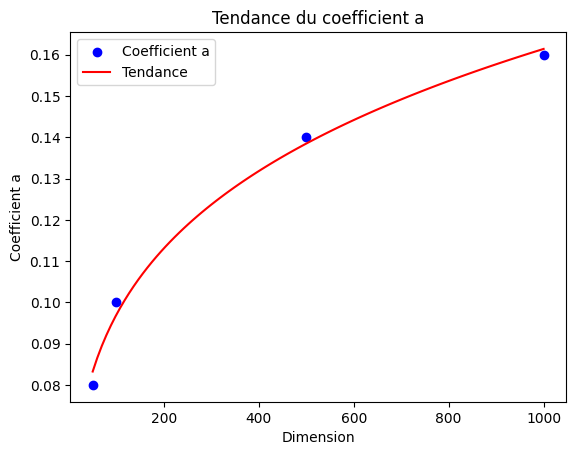

In [ ]:
import numpy as np
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt

# Les points de données
x_data = np.array([50, 100, 500, 1000])
y_data = np.array([0.08, 0.10, 0.14, 0.16])

# Définition de la fonction de la loi de puissance
def power_law(x, a, b):
    return a * x**b

# Effectuer la régression de la loi de puissance
params, covariance = curve_fit(power_law, x_data, y_data)

# Extraire les paramètres a et b
a, b = params

# Afficher les paramètres de la loi de puissance
print(f"La meilleure loi de puissance est donnée par y = {a:.2f} * dim**{b:.2f}")

# Utiliser les paramètres trouvés pour tracer la courbe de tendance
x_fit = np.linspace(min(x_data), max(x_data), 100)
y_fit = power_law(x_fit, a, b)

# Tracer les coefficients a et la courbe de tendance
plt.scatter(x_data, y_data, label='Coefficient a', color='blue')
plt.plot(x_fit, y_fit, label='Tendance', color='red')
plt.legend()
plt.xlabel('Dimension')
plt.ylabel('Coefficient a')
plt.title('Tendance du coefficient a')
plt.show()

La meilleure loi de puissance est donnée par y = -1.10 * dim**-0.05


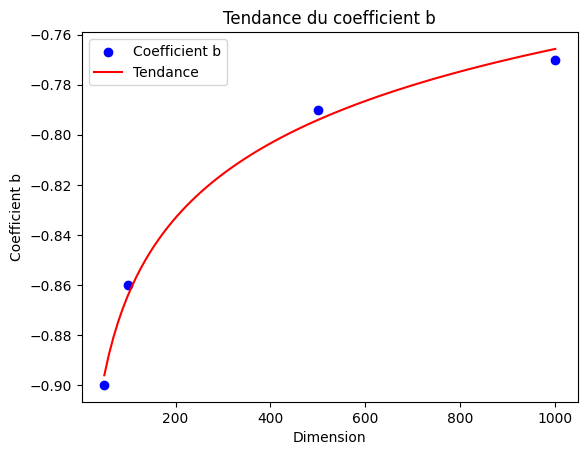

In [ ]:
import numpy as np
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt

# Les points de données
x_data = np.array([50, 100, 500, 1000])
y_data = np.array([-0.90, -0.86, -0.79, -0.77])

# Définition de la fonction de la loi de puissance
def power_law(x, a, b):
    return a * x**b

# Effectuer la régression de la loi de puissance
params, covariance = curve_fit(power_law, x_data, y_data)

# Extraire les paramètres a et b
a, b = params

# Afficher les paramètres de la loi de puissance
print(f"La meilleure loi de puissance est donnée par y = {a:.2f} * dim**{b:.2f}")

# Utiliser les paramètres trouvés pour tracer la courbe de tendance
x_fit = np.linspace(min(x_data), max(x_data), 100)
y_fit = power_law(x_fit, a, b)

# Tracer les coefficients b et la courbe de tendance
plt.scatter(x_data, y_data, label='Coefficient b', color='blue')
plt.plot(x_fit, y_fit, label='Tendance', color='red')
plt.legend()
plt.xlabel('Dimension')
plt.ylabel('Coefficient b')
plt.title('Tendance du coefficient b')
plt.show()

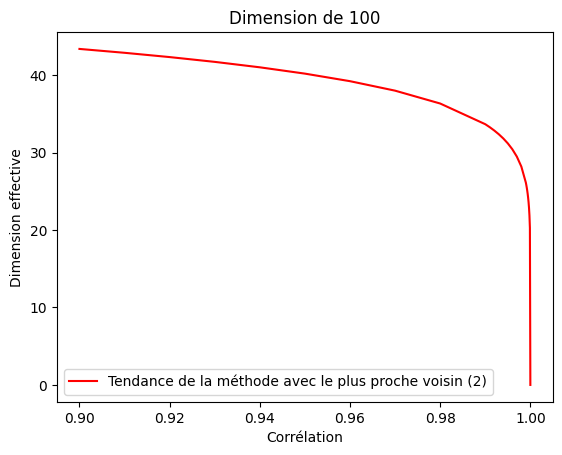

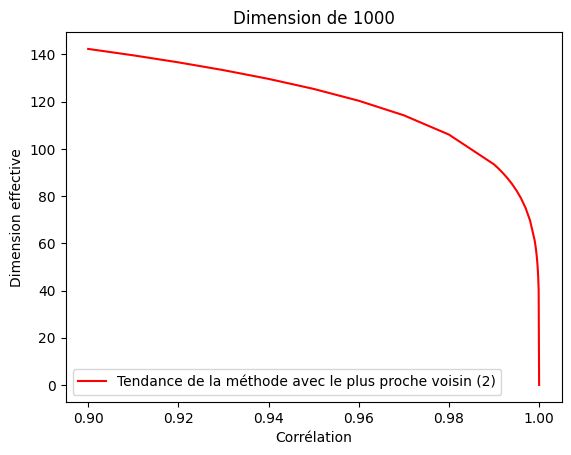

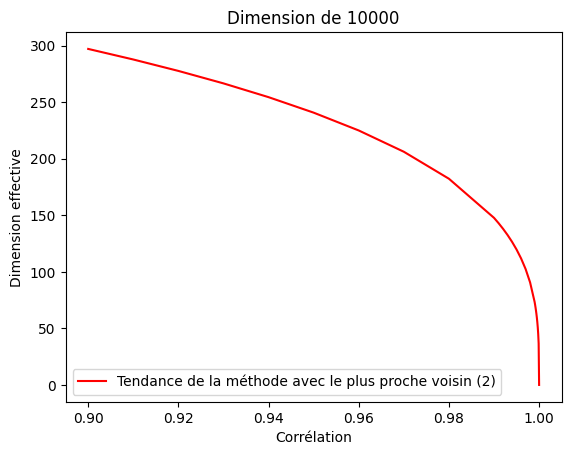

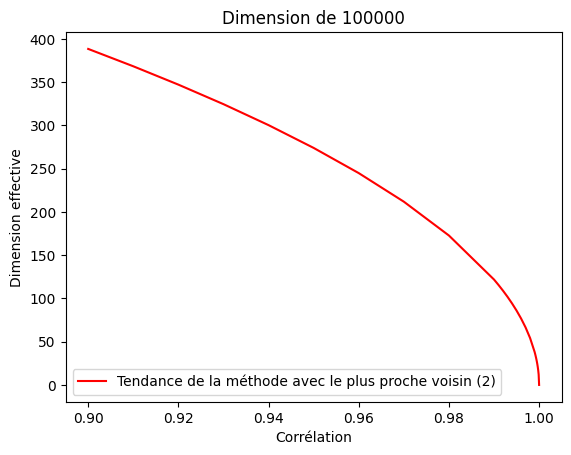

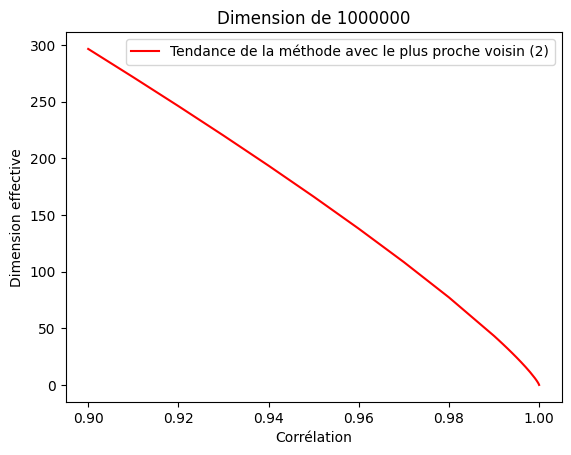

...

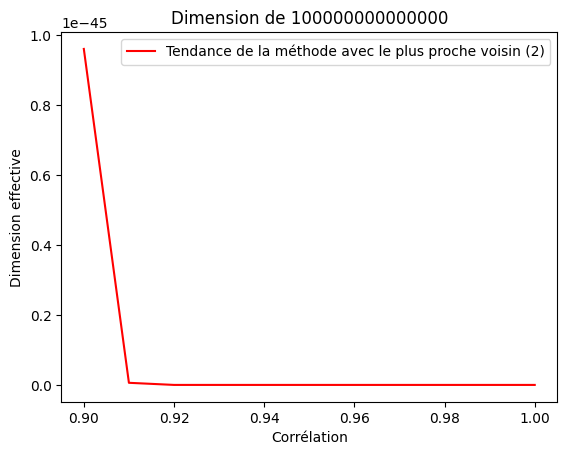

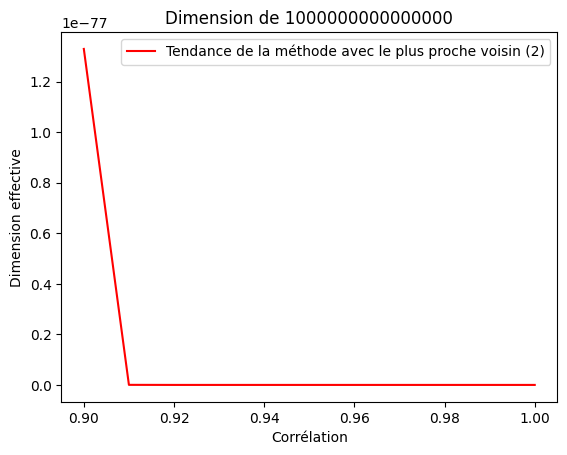

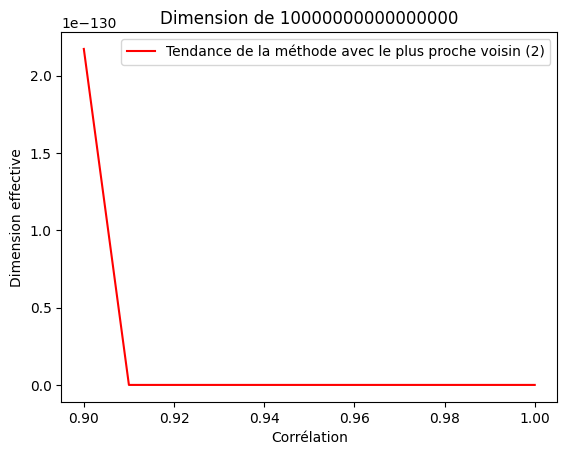

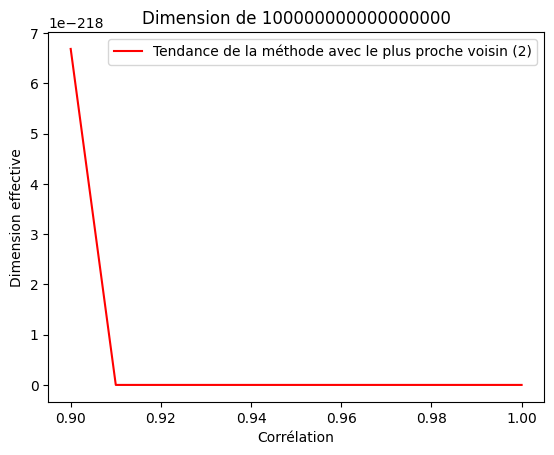

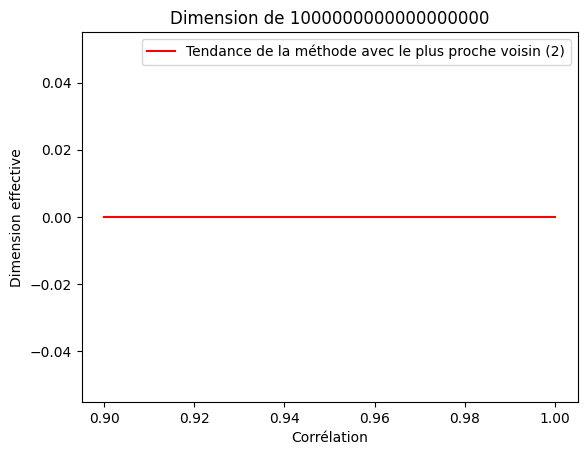

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

import sys

# Calculer les puissances de 10 jusqu'à ce que l'on atteigne ou dépasse sys.maxsize
max_size = sys.maxsize
powers_of_ten = [100]
while powers_of_ten[-1] * 10 <= max_size:
    powers_of_ten.append(powers_of_ten[-1] * 10)

# Définir la fonction à tracer
def f(x, dim):
    a = 0.04 * dim**0.22
    b = -1.10 * dim**-0.05
    return (1 - x)**a / dim**b

X = np.array(correlation_values)

for dim in powers_of_ten:
    # Tracer la fonction
    plt.plot(X, f(X, dim), label='Tendance de la méthode avec le plus proche voisin (2)', color='red')

    # Ajouter un titre
    plt.title(f'Dimension de {dim}')

    # Ajouter une légende
    plt.legend()

    # Ajouter des étiquettes pour les axes
    plt.xlabel('Corrélation')
    plt.ylabel('Dimension effective')

    # Afficher le graphique
    plt.show()